# 데이터 분석 기초

## 이미지 데이터 인코딩

In [1]:
from sklearn.datasets import load_digits

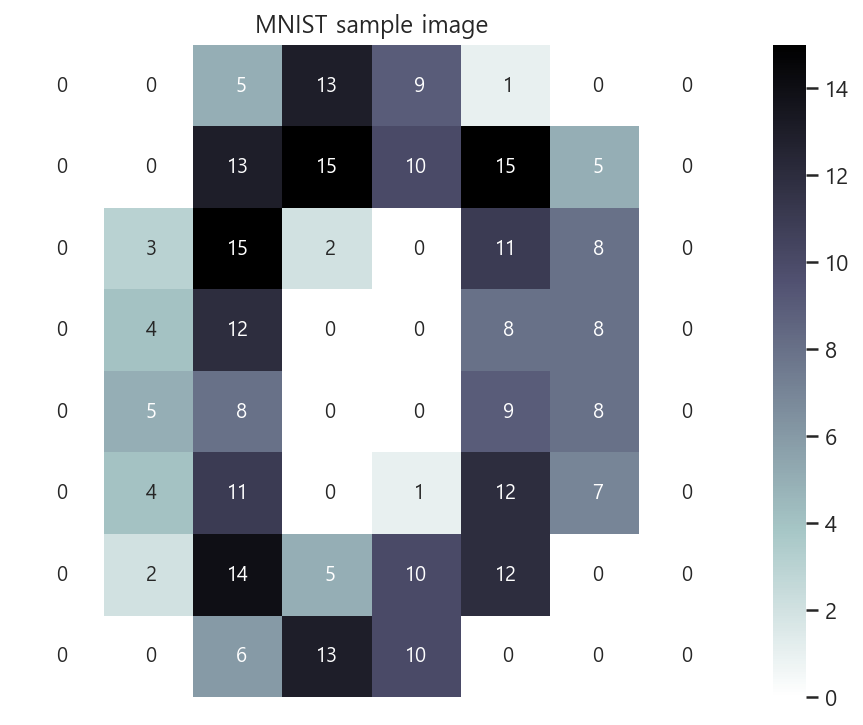

In [4]:
digits = load_digits()

%matplotlib inline

plt.figure(figsize=(8, 6))
sns.heatmap(digits.images[0], cmap=mpl.cm.bone_r, annot=True, fmt="2.0f",
           cbar=True, xticklabels=False, yticklabels=False)
plt.title("MNIST sample image")
plt.show() ; 

In [5]:
digits.images[0]

array([[ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.],
       [ 0.,  0., 13., 15., 10., 15.,  5.,  0.],
       [ 0.,  3., 15.,  2.,  0., 11.,  8.,  0.],
       [ 0.,  4., 12.,  0.,  0.,  8.,  8.,  0.],
       [ 0.,  5.,  8.,  0.,  0.,  9.,  8.,  0.],
       [ 0.,  4., 11.,  0.,  1., 12.,  7.,  0.],
       [ 0.,  2., 14.,  5., 10., 12.,  0.,  0.],
       [ 0.,  0.,  6., 13., 10.,  0.,  0.,  0.]])

In [6]:
digits.images[0].flatten()

array([ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.,  0.,  0., 13., 15., 10.,
       15.,  5.,  0.,  0.,  3., 15.,  2.,  0., 11.,  8.,  0.,  0.,  4.,
       12.,  0.,  0.,  8.,  8.,  0.,  0.,  5.,  8.,  0.,  0.,  9.,  8.,
        0.,  0.,  4., 11.,  0.,  1., 12.,  7.,  0.,  0.,  2., 14.,  5.,
       10., 12.,  0.,  0.,  0.,  0.,  6., 13., 10.,  0.,  0.,  0.])

In [8]:
digits.images[0].reshape(64, 1)

array([[ 0.],
       [ 0.],
       [ 5.],
       [13.],
       [ 9.],
       [ 1.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [13.],
       [15.],
       [10.],
       [15.],
       [ 5.],
       [ 0.],
       [ 0.],
       [ 3.],
       [15.],
       [ 2.],
       [ 0.],
       [11.],
       [ 8.],
       [ 0.],
       [ 0.],
       [ 4.],
       [12.],
       [ 0.],
       [ 0.],
       [ 8.],
       [ 8.],
       [ 0.],
       [ 0.],
       [ 5.],
       [ 8.],
       [ 0.],
       [ 0.],
       [ 9.],
       [ 8.],
       [ 0.],
       [ 0.],
       [ 4.],
       [11.],
       [ 0.],
       [ 1.],
       [12.],
       [ 7.],
       [ 0.],
       [ 0.],
       [ 2.],
       [14.],
       [ 5.],
       [10.],
       [12.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 6.],
       [13.],
       [10.],
       [ 0.],
       [ 0.],
       [ 0.]])

## 문서 데이터 인코딩

In [9]:
from sklearn.datasets import fetch_20newsgroups

In [10]:
news = fetch_20newsgroups()

print("입력 : \n", news.data[0])
print("출력 : \n", news.target_names[news.target[0]])

입력 : 
 From: lerxst@wam.umd.edu (where's my thing)
Subject: WHAT car is this!?
Nntp-Posting-Host: rac3.wam.umd.edu
Organization: University of Maryland, College Park
Lines: 15

 I was wondering if anyone out there could enlighten me on this car I saw
the other day. It was a 2-door sports car, looked to be from the late 60s/
early 70s. It was called a Bricklin. The doors were really small. In addition,
the front bumper was separate from the rest of the body. This is 
all I know. If anyone can tellme a model name, engine specs, years
of production, where this car is made, history, or whatever info you
have on this funky looking car, please e-mail.

Thanks,
- IL
   ---- brought to you by your neighborhood Lerxst ----





출력 : 
 rec.autos


In [11]:
news.target_names

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [15]:
news.target[:10]

array([ 7,  4,  4,  1, 14, 16, 13,  3,  2,  4])

In [16]:
from sklearn.feature_extraction.text import CountVectorizer

In [17]:
vec = CountVectorizer(stop_words="english").fit(news.data[:100])
vec

CountVectorizer(stop_words='english')

In [18]:
data = vec.transform(news.data[:100])
data

<100x6288 sparse matrix of type '<class 'numpy.int64'>'
	with 11710 stored elements in Compressed Sparse Row format>

In [19]:
data.shape

(100, 6288)

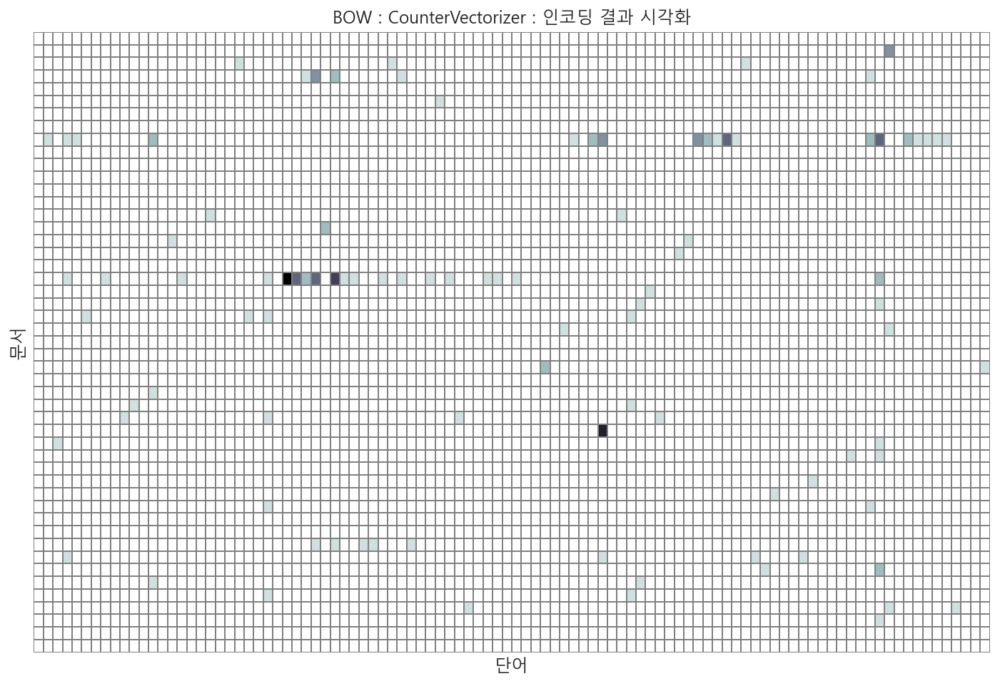

In [31]:
plt.figure(figsize=(12, 8))

sns.heatmap(data.toarray()[51:, 100:200], cmap=mpl.cm.bone_r,
           linewidth=0.002,linecolor="gray", cbar=False,
           xticklabels=False, yticklabels=False)
plt.xlabel("단어")
plt.ylabel("문서")
plt.title("BOW : CounterVectorizer : 인코딩 결과 시각화")
plt.show() ; 

In [28]:
data.toarray()[:50, :100]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

## 회귀분석의 예

In [32]:
from sklearn.datasets import load_boston

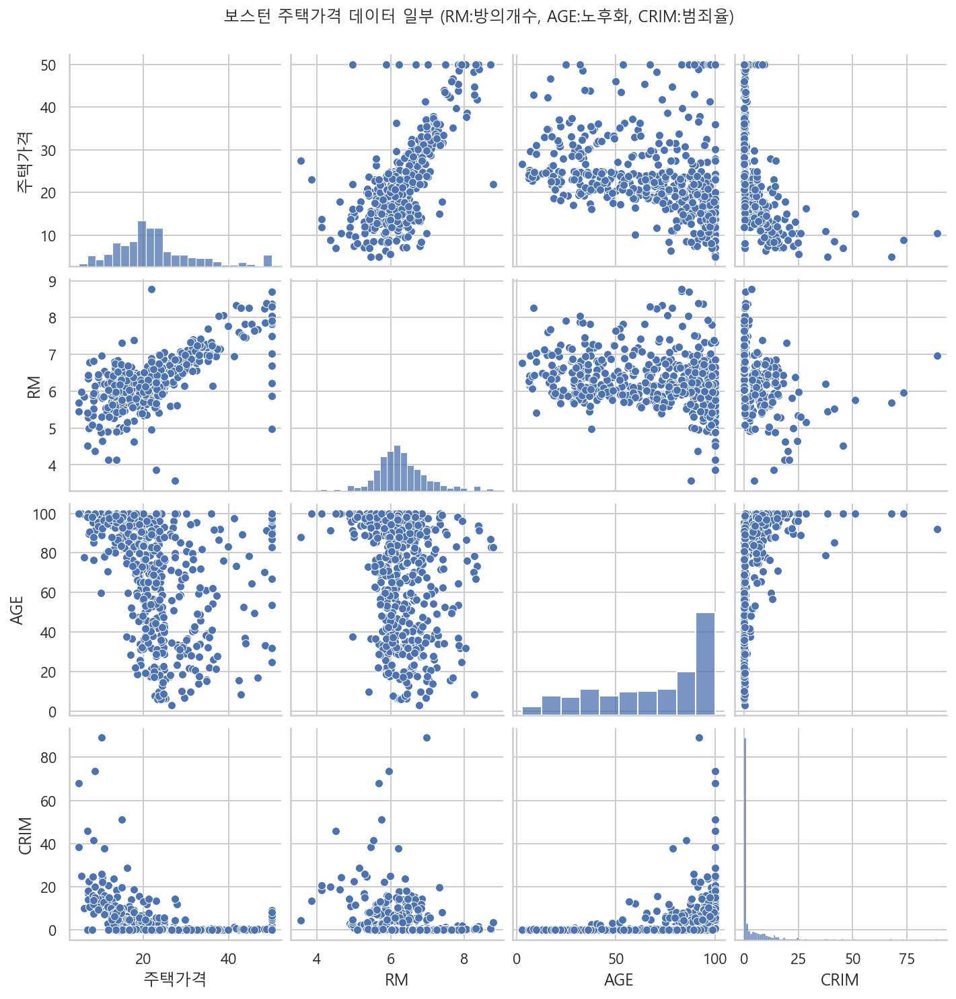

In [36]:
boston = load_boston()
df = pd.DataFrame(boston.data, columns=boston.feature_names)
df["주택가격"] = boston.target

g = sns.pairplot(df[["주택가격", "RM", "AGE", "CRIM"]])
g.fig.suptitle("보스턴 주택가격 데이터 일부 (RM:방의개수, AGE:노후화, CRIM:범죄율)", y=1.03)
plt.show() ; 

In [37]:
from sklearn.linear_model import LinearRegression

In [38]:
model = LinearRegression().fit(boston.data, boston.target)
model

LinearRegression()

In [39]:
predicted = model.predict(boston.data)
predicted

array([30.00384338, 25.02556238, 30.56759672, 28.60703649, 27.94352423,
       25.25628446, 23.00180827, 19.53598843, 11.52363685, 18.92026211,
       18.99949651, 21.58679568, 20.90652153, 19.55290281, 19.28348205,
       19.29748321, 20.52750979, 16.91140135, 16.17801106, 18.40613603,
       12.52385753, 17.67103669, 15.83288129, 13.80628535, 15.67833832,
       13.38668561, 15.46397655, 14.70847428, 19.54737285, 20.8764282 ,
       11.45511759, 18.05923295,  8.81105736, 14.28275814, 13.70675891,
       23.81463526, 22.34193708, 23.10891142, 22.91502612, 31.35762569,
       34.21510225, 28.02056414, 25.20386628, 24.60979273, 22.94149176,
       22.09669817, 20.42320032, 18.03655088,  9.10655377, 17.20607751,
       21.28152535, 23.97222285, 27.6558508 , 24.04901809, 15.3618477 ,
       31.15264947, 24.85686978, 33.10919806, 21.77537987, 21.08493555,
       17.8725804 , 18.51110208, 23.98742856, 22.55408869, 23.37308644,
       30.36148358, 25.53056512, 21.11338564, 17.42153786, 20.78

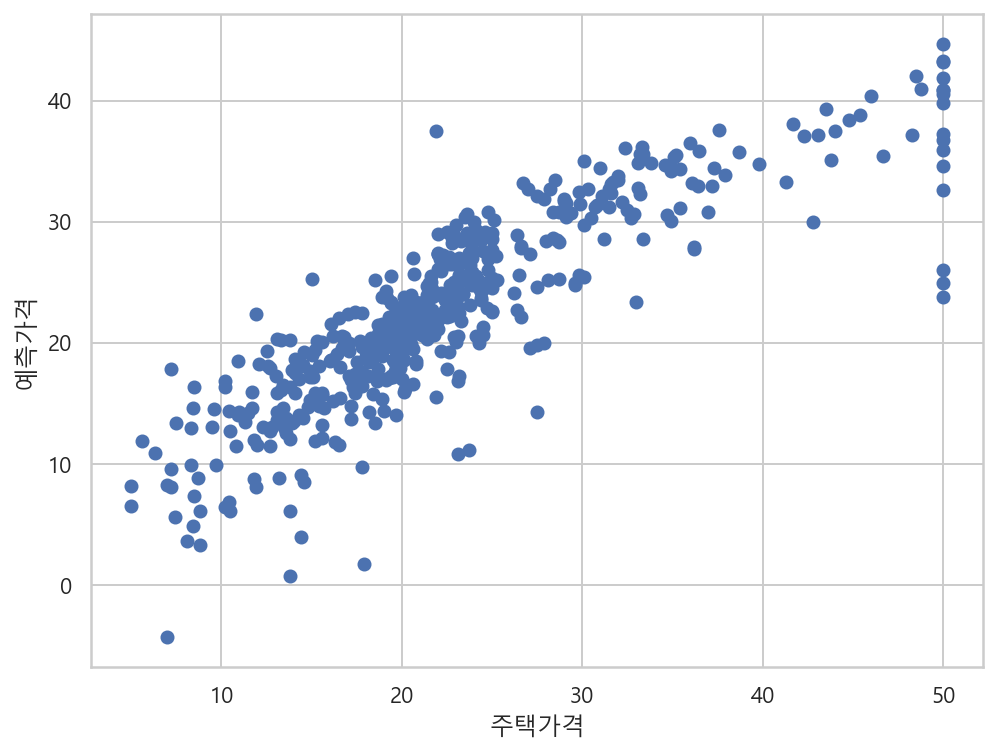

In [40]:
plt.figure(figsize=(8, 6))
plt.scatter(boston.target, predicted)
plt.xlabel("주택가격")
plt.ylabel("예측가격")
plt.show() ;

## 분류의 예

In [41]:
from sklearn.datasets import load_iris

In [42]:
iris = load_iris()
df = pd.DataFrame(iris.data, columns=iris.feature_names)
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [43]:
sy = pd.Series(iris.target, dtype="category")
sy

0      0
1      0
2      0
3      0
4      0
      ..
145    2
146    2
147    2
148    2
149    2
Length: 150, dtype: category
Categories (3, int64): [0, 1, 2]

In [44]:
sy = sy.cat.rename_categories(iris.target_names)
sy

0         setosa
1         setosa
2         setosa
3         setosa
4         setosa
         ...    
145    virginica
146    virginica
147    virginica
148    virginica
149    virginica
Length: 150, dtype: category
Categories (3, object): ['setosa', 'versicolor', 'virginica']

In [45]:
df["species"] = sy
df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [46]:
np.random.seed(0)
df.sample(frac=1).reset_index(drop=True).head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.8,2.8,5.1,2.4,virginica
1,6.0,2.2,4.0,1.0,versicolor
2,5.5,4.2,1.4,0.2,setosa
3,7.3,2.9,6.3,1.8,virginica
4,5.0,3.4,1.5,0.2,setosa


In [52]:
df.sample(n=10).reset_index(drop=True)

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,6.0,3.4,4.5,1.6,versicolor
1,6.4,3.1,5.5,1.8,virginica
2,6.7,3.0,5.0,1.7,versicolor
3,6.7,2.5,5.8,1.8,virginica
4,7.7,2.8,6.7,2.0,virginica
5,6.5,3.0,5.8,2.2,virginica
6,5.6,2.8,4.9,2.0,virginica
7,4.8,3.0,1.4,0.1,setosa
8,5.4,3.4,1.5,0.4,setosa
9,5.7,2.9,4.2,1.3,versicolor


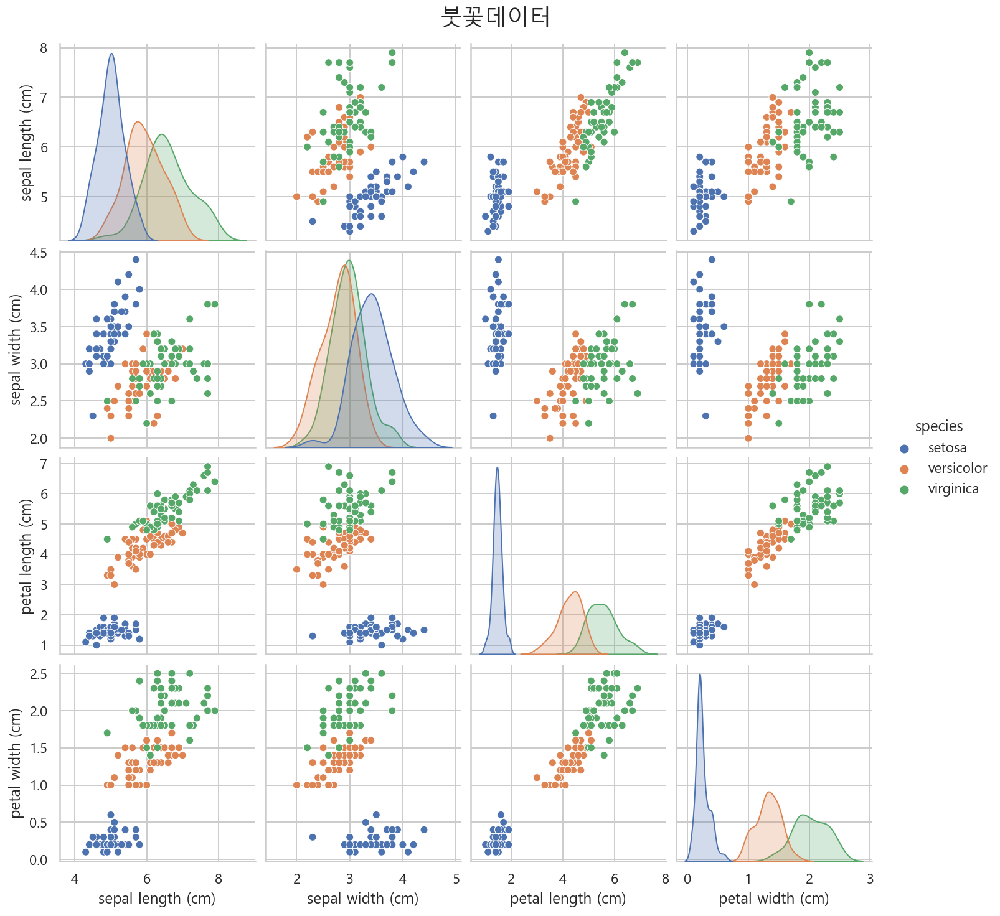

In [53]:
sns.pairplot(df, hue="species")
plt.suptitle("붓꽃데이터", y=1.02, fontsize=18)
plt.show() ; 

## SVM 서포트벡터머신으로 분류

In [55]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

In [56]:
features = [2, 3]
X = iris.data[:, features]
y = iris.target

In [57]:
X[:10]

array([[1.4, 0.2],
       [1.4, 0.2],
       [1.3, 0.2],
       [1.5, 0.2],
       [1.4, 0.2],
       [1.7, 0.4],
       [1.4, 0.3],
       [1.5, 0.2],
       [1.4, 0.2],
       [1.5, 0.1]])

In [58]:
model = SVC(kernel="linear", random_state=0)
model.fit(X, y)

SVC(kernel='linear', random_state=0)

In [59]:
XX_min = X[:, 0].min() - 1
XX_max = X[:, 0].max() + 1
YY_min = X[:, 1].min() - 1
YY_max = X[:, 1].max() + 1

In [60]:
XX_min

0.0

In [61]:
XX_max

7.9

In [62]:
YY_min

-0.9

In [63]:
YY_max

3.5

In [64]:
XX, YY = np.meshgrid(np.linspace(XX_min, XX_max, 1000),
                    np.linspace(YY_min, YY_max, 1000))

In [66]:
XX[0]

array([0.        , 0.00790791, 0.01581582, 0.02372372, 0.03163163,
       0.03953954, 0.04744745, 0.05535536, 0.06326326, 0.07117117,
       0.07907908, 0.08698699, 0.09489489, 0.1028028 , 0.11071071,
       0.11861862, 0.12652653, 0.13443443, 0.14234234, 0.15025025,
       0.15815816, 0.16606607, 0.17397397, 0.18188188, 0.18978979,
       0.1976977 , 0.20560561, 0.21351351, 0.22142142, 0.22932933,
       0.23723724, 0.24514515, 0.25305305, 0.26096096, 0.26886887,
       0.27677678, 0.28468468, 0.29259259, 0.3005005 , 0.30840841,
       0.31631632, 0.32422422, 0.33213213, 0.34004004, 0.34794795,
       0.35585586, 0.36376376, 0.37167167, 0.37957958, 0.38748749,
       0.3953954 , 0.4033033 , 0.41121121, 0.41911912, 0.42702703,
       0.43493493, 0.44284284, 0.45075075, 0.45865866, 0.46656657,
       0.47447447, 0.48238238, 0.49029029, 0.4981982 , 0.50610611,
       0.51401401, 0.52192192, 0.52982983, 0.53773774, 0.54564565,
       0.55355355, 0.56146146, 0.56936937, 0.57727728, 0.58518

In [68]:
YY[0:2]

array([[-0.9      , -0.9      , -0.9      , ..., -0.9      , -0.9      ,
        -0.9      ],
       [-0.8955956, -0.8955956, -0.8955956, ..., -0.8955956, -0.8955956,
        -0.8955956]])

In [104]:
ZZ = model.predict(np.c_[XX.ravel(), YY.ravel()]).reshape(XX.shape)
ZZ

array([[0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2],
       ...,
       [0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2]])

In [80]:
odd = np.array(range(1, 6)*2).reshape(3, 2)

TypeError: unsupported operand type(s) for *: 'range' and 'int'

In [94]:
odd = np.array([i for i in range(1, 13) if i % 2 == 0]).reshape(3, 2)
odd

array([[ 2,  4],
       [ 6,  8],
       [10, 12]])

In [95]:
even = np.array([j for j in range(1, 13) if j % 2 != 0]).reshape(3, 2)
even

array([[ 1,  3],
       [ 5,  7],
       [ 9, 11]])

In [96]:
np.c_[odd.ravel(), even.ravel()]

array([[ 2,  1],
       [ 4,  3],
       [ 6,  5],
       [ 8,  7],
       [10,  9],
       [12, 11]])

In [98]:
import matplotlib as mpl

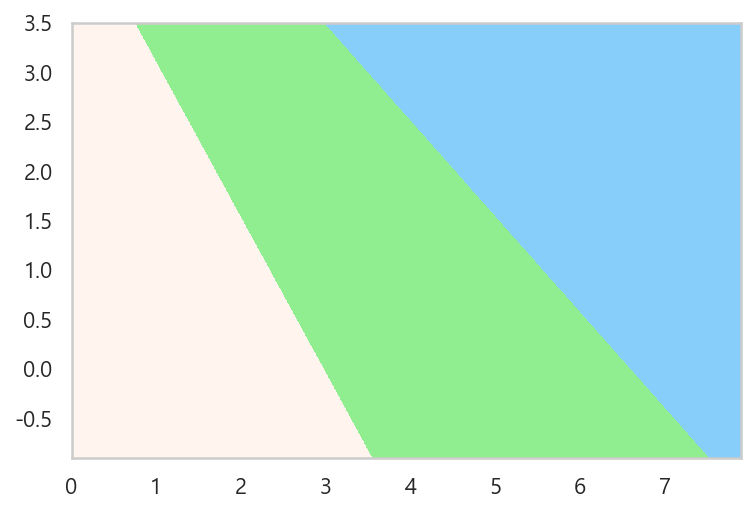

In [105]:
cmap = mpl.colors.ListedColormap(["seashell", "lightgreen", "lightskyblue"])
plt.contourf(XX, YY, ZZ, cmap=cmap)
plt.show() ; 

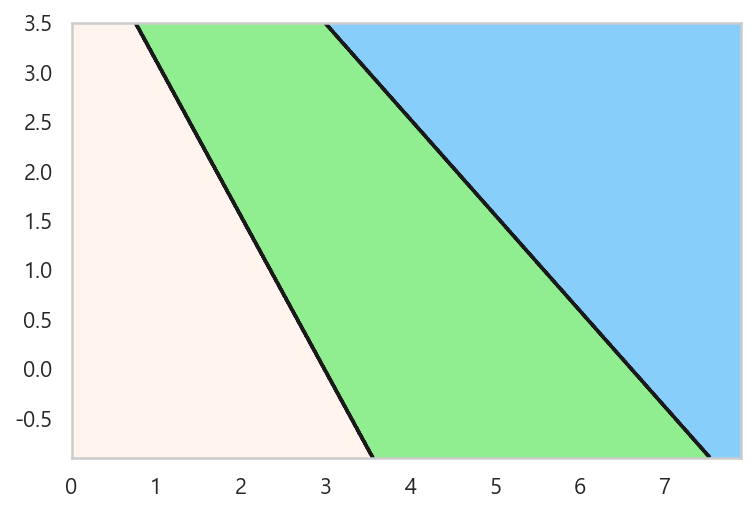

In [106]:
plt.contourf(XX, YY, ZZ, cmap=cmap)
plt.contour(XX, YY, ZZ, colors="k")
plt.show() ; 

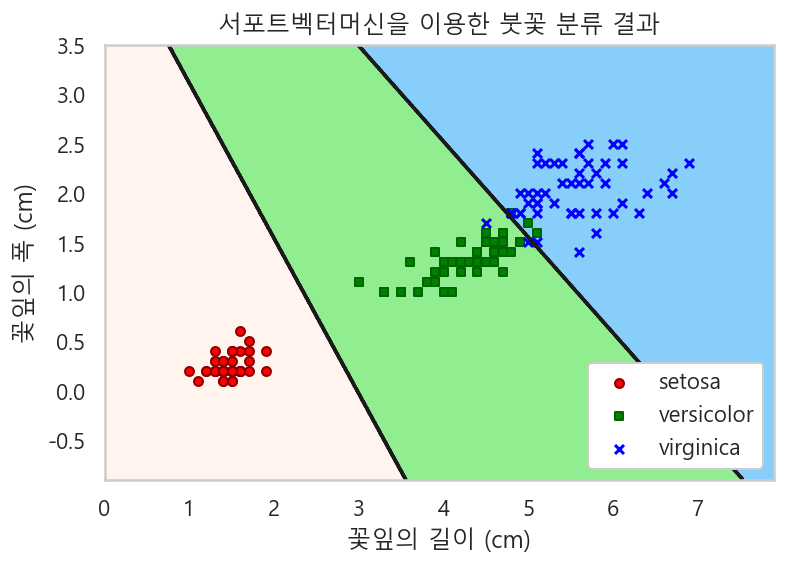

In [111]:
plt.contourf(XX, YY, ZZ, cmap=cmap)
plt.contour(XX, YY, ZZ, colors="k")

plt.scatter(X[y==0, 0], X[y==0, 1], s=20, label=iris.target_names[0],
           marker="o", edgecolors="darkred", facecolor="red")
plt.scatter(X[y==1, 0], X[y==1, 1], s=20, label=iris.target_names[1],
           marker="s", edgecolors="darkgreen", facecolor="green")
plt.scatter(X[y==2, 0], X[y==2, 1], s=20, label=iris.target_names[2],
           marker="x", edgecolors="darkblue", facecolor="blue")

plt.xlim(XX_min, XX_max)
plt.ylim(YY_min, YY_max)
plt.xlabel("꽃잎의 길이 (cm)")
plt.ylabel("꽃잎의 폭 (cm)")
plt.title("서포트벡터머신을 이용한 붓꽃 분류 결과")
plt.legend(loc="lower right", framealpha=1)
plt.show() ; 

In [108]:
X.shape

(150, 2)

In [112]:
from sklearn.datasets import make_blobs
from sklearn.cluster import AffinityPropagation

In [113]:
X, _ = make_blobs(n_features=2, centers=3, random_state=1)

In [114]:
X

array([[-7.94152277e-01,  2.10495117e+00],
       [-9.15155186e+00, -4.81286449e+00],
       [-1.14418263e+01, -4.45781441e+00],
       [-9.76761777e+00, -3.19133737e+00],
       [-4.53655648e+00, -8.40186288e+00],
       [-6.26302115e+00, -8.10666081e+00],
       [-6.38481234e+00, -8.47302970e+00],
       [-9.20490564e+00, -4.57687928e+00],
       [-2.76017908e+00,  5.55121358e+00],
       [-1.17104176e+00,  4.33091816e+00],
       [-1.00364080e+01, -5.56912090e+00],
       [-9.87589123e+00, -2.82386464e+00],
       [-7.17532921e+00, -8.77059017e+00],
       [-2.40671820e+00,  6.09894447e+00],
       [-4.87418245e+00, -1.00495890e+01],
       [-6.07854700e+00, -7.93969420e+00],
       [-6.83238762e+00, -7.47067670e+00],
       [-2.34673261e+00,  3.56128423e+00],
       [-1.03415662e+01, -3.90975169e+00],
       [-1.10926243e+01, -3.78396611e+00],
       [-6.50212109e+00, -7.91249101e+00],
       [-1.02639310e+01, -3.92073400e+00],
       [-6.81608302e+00, -8.44986926e+00],
       [-1.

In [115]:
_

array([0, 1, 1, 1, 2, 2, 2, 1, 0, 0, 1, 1, 2, 0, 2, 2, 2, 0, 1, 1, 2, 1,
       2, 0, 1, 2, 2, 0, 0, 2, 0, 0, 2, 0, 1, 2, 1, 1, 1, 2, 2, 1, 0, 1,
       1, 2, 0, 0, 0, 0, 1, 2, 2, 2, 0, 2, 1, 1, 0, 0, 1, 2, 2, 1, 1, 2,
       0, 2, 0, 1, 1, 1, 2, 0, 0, 1, 2, 2, 0, 1, 0, 1, 1, 2, 0, 0, 0, 0,
       1, 0, 2, 0, 0, 1, 1, 2, 2, 0, 2, 0])

In [116]:
model = AffinityPropagation().fit(X)
model

AffinityPropagation()

In [121]:
model.cluster_centers_indices_

array([21, 23, 26], dtype=int64)

In [122]:
model.cluster_centers_indices_[0]

21

In [124]:
model.cluster_centers_indices_[1]

23

In [126]:
model.cluster_centers_indices_[2]

26

In [128]:
X[:10]

array([[ -0.79415228,   2.10495117],
       [ -9.15155186,  -4.81286449],
       [-11.44182631,  -4.45781441],
       [ -9.76761777,  -3.19133737],
       [ -4.53655648,  -8.40186288],
       [ -6.26302115,  -8.10666081],
       [ -6.38481234,  -8.4730297 ],
       [ -9.20490564,  -4.57687928],
       [ -2.76017908,   5.55121358],
       [ -1.17104176,   4.33091816]])

In [132]:
_

array([0, 1, 1, 1, 2, 2, 2, 1, 0, 0, 1, 1, 2, 0, 2, 2, 2, 0, 1, 1, 2, 1,
       2, 0, 1, 2, 2, 0, 0, 2, 0, 0, 2, 0, 1, 2, 1, 1, 1, 2, 2, 1, 0, 1,
       1, 2, 0, 0, 0, 0, 1, 2, 2, 2, 0, 2, 1, 1, 0, 0, 1, 2, 2, 1, 1, 2,
       0, 2, 0, 1, 1, 1, 2, 0, 0, 1, 2, 2, 0, 1, 0, 1, 1, 2, 0, 0, 0, 0,
       1, 0, 2, 0, 0, 1, 1, 2, 2, 0, 2, 0])

In [130]:
model.labels_

array([1, 0, 0, 0, 2, 2, 2, 0, 1, 1, 0, 0, 2, 1, 2, 2, 2, 1, 0, 0, 2, 0,
       2, 1, 0, 2, 2, 1, 1, 2, 1, 1, 2, 1, 0, 2, 0, 0, 0, 2, 2, 0, 1, 0,
       0, 2, 1, 1, 1, 1, 0, 2, 2, 2, 1, 2, 0, 0, 1, 1, 0, 2, 2, 0, 0, 2,
       1, 2, 1, 0, 0, 0, 2, 1, 1, 0, 2, 2, 1, 0, 1, 0, 0, 2, 1, 1, 1, 1,
       0, 1, 2, 1, 1, 0, 0, 2, 2, 1, 2, 1], dtype=int64)

In [137]:
X[model.cluster_centers_indices_[0]]

array([-10.26393101,  -3.920734  ])

In [135]:
for t in X[model.labels_ == 1] : 
    print(t)

[-0.79415228  2.10495117]
[-2.76017908  5.55121358]
[-1.17104176  4.33091816]
[-2.4067182   6.09894447]
[-2.34673261  3.56128423]
[-1.34052081  4.15711949]
[-1.35938959  4.05424002]
[-0.19745197  2.34634916]
[-1.92744799  4.93684534]
[-2.8020781   4.05714715]
[-1.85139546  3.5188609 ]
[-1.98197711  4.02243551]
[-0.75796919  4.90898421]
[0.5260155  3.00999353]
[-2.77687025  4.64090557]
[-1.78245013  3.47072043]
[-1.53940095  5.02369298]
[-1.61734616  4.98930508]
[-1.14663009  4.10839703]
[-2.41395785  5.65935802]
[-1.83198811  3.52863145]
[-0.82057649  5.33759195]
[2.42271161e-04 5.14853403e+00]
[-2.18773166  3.33352125]
[-0.52793052  5.92630669]
[-2.35122066  4.00973634]
[-0.52579046  3.3065986 ]
[-1.46864442  6.50674501]
[-0.75870396  3.72276201]
[-2.33080604  4.39382527]
[-1.60875215  3.76949422]
[-1.86845414  4.99311306]
[-1.37397258  5.29163103]
[0.08525186 3.64528297]


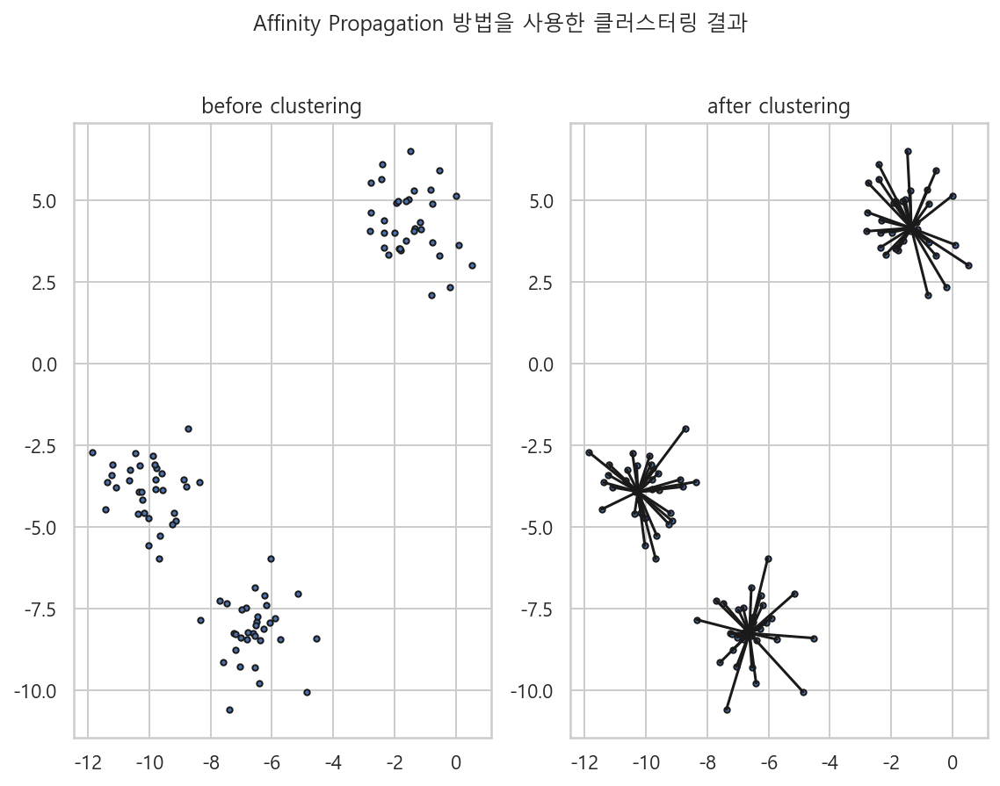

In [140]:
plt.figure(figsize=(8, 6))

plt.subplot(121)
plt.scatter(X[:, 0], X[:, 1], marker="o", s=10, edgecolor="k")
plt.title("before clustering")

plt.subplot(122)
plt.scatter(X[:, 0], X[:, 1], marker="o", s=10, edgecolor="k")
plt.title("after clustering")

for k in range(3) : 
    cluster_center = X[model.cluster_centers_indices_[k]]
    
    for x in X[model.labels_ == k] :
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], c="k")
        
plt.suptitle("Affinity Propagation 방법을 사용한 클러스터링 결과", y=1.03)        
plt.tight_layout()
plt.show() ; 

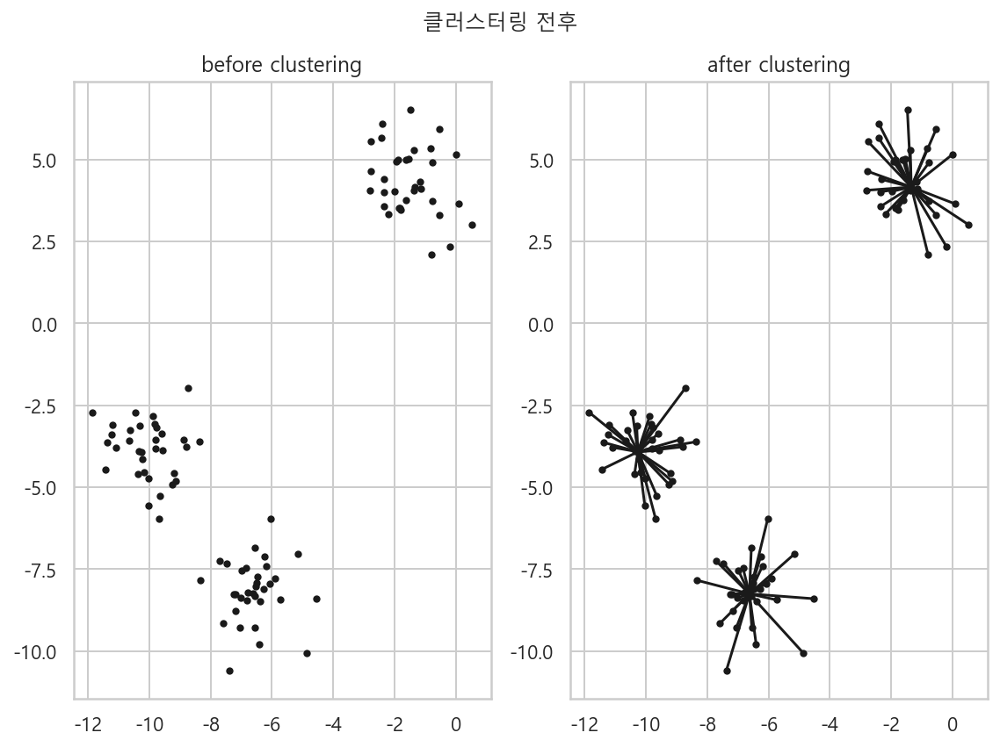

In [144]:
plt.figure(figsize=(8, 6))

plt.subplot(121)
plt.scatter(X[:, 0], X[:, 1], s=10, c="k")
plt.title("before clustering")

plt.subplot(122)
plt.scatter(X[:, 0], X[:, 1], s=10, c="k")
plt.title("after clustering")

for i in range(3) : 
    cluster_center = X[model.cluster_centers_indices_[i]]
    
    for x in X[model.labels_ == i] : 
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], c="k")
        
plt.suptitle("클러스터링 전후")
plt.tight_layout()
plt.show() ; 

# 전처리

In [146]:
from io import StringIO

In [178]:
csv_data = StringIO("""
x1,x2,x3,x4,x5
1,0.1,"1",2019-01-01,A
2,,,2022-06-13,B
3,,"3",2022-06-01,C
,0.4,"4",2022-05-31,A
5,0.5,"5",2022-04-01,B
,,,2021-02-14,C
7,0.7,"7",,A
8,0.8,"8",2022-08-08,B
9,0.9,,2021-09-01,C
""")

csv_data

In [148]:
df = pd.read_csv(csv_data, dtype={"x1" : pd.Int64Dtype()}, parse_dates=[3])
df

,x1,x2,x3,x4,x5
0,1,0.1,"""1""",2019-01-01,A
1,2,NaN,NaN,2022-06-13,B
2,3,NaN,"""3""",2022-06-01,C
3,<NA>,0.4,"""4""",2022-05-31,A
4,5,0.5,"""5""",2022-04-01,B
5,<NA>,NaN,NaN,2021-02-14,C
6,7,0.7,"""7""",NaT,A
7,8,0.8,"""8""",2022-08-08,B
8,9,0.9,NaN,2021-09-01,C


In [149]:
df.isnull()

,x1,x2,x3,x4,x5
0,False,False,False,False,False
1,False,True,True,False,False
2,False,True,False,False,False
3,True,False,False,False,False
4,False,False,False,False,False
5,True,True,True,False,False
6,False,False,False,True,False
7,False,False,False,False,False
8,False,False,True,False,False


In [150]:
df.isna()

,x1,x2,x3,x4,x5
0,False,False,False,False,False
1,False,True,True,False,False
2,False,True,False,False,False
3,True,False,False,False,False
4,False,False,False,False,False
5,True,True,True,False,False
6,False,False,False,True,False
7,False,False,False,False,False
8,False,False,True,False,False


In [161]:
df2 = pd.read_csv(csv_data, dtype={"x1" : pd.Int64Dtype()}, parse_dates=[4])
df2

,x1,x2,x3,x4,x5
0,1,0.1,"""1""",2019-01-01,A
1,2,NaN,NaN,2022-06-13,B
2,3,NaN,"""3""",2022-06-01,C
3,<NA>,0.4,"""4""",2022-05-31,A
4,5,0.5,"""5""",2022-04-01,B
5,<NA>,NaN,NaN,2021-02-14,C
6,7,0.7,"""7""",NaN,A
7,8,0.8,"""8""",2022-08-08,B
8,9,0.9,NaN,2021-09-01,C


In [164]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x1      7 non-null      Int64  
 1    x2     6 non-null      float64
 2    x3     6 non-null      object 
 3    x4     8 non-null      object 
 4    x5     9 non-null      object 
dtypes: Int64(1), float64(1), object(3)
memory usage: 497.0+ bytes


In [165]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   x1      7 non-null      Int64         
 1    x2     6 non-null      float64       
 2    x3     6 non-null      object        
 3    x4     8 non-null      datetime64[ns]
 4    x5     9 non-null      object        
dtypes: Int64(1), datetime64[ns](1), float64(1), object(2)
memory usage: 497.0+ bytes


In [166]:
df.loc[df["x1"].isnull()]

,x1,x2,x3,x4,x5
3,<NA>,0.4,"""4""",2022-05-31,A
5,<NA>,NaN,NaN,2021-02-14,C


In [167]:
df

,x1,x2,x3,x4,x5
0,1,0.1,"""1""",2019-01-01,A
1,2,NaN,NaN,2022-06-13,B
2,3,NaN,"""3""",2022-06-01,C
3,<NA>,0.4,"""4""",2022-05-31,A
4,5,0.5,"""5""",2022-04-01,B
5,<NA>,NaN,NaN,2021-02-14,C
6,7,0.7,"""7""",NaT,A
7,8,0.8,"""8""",2022-08-08,B
8,9,0.9,NaN,2021-09-01,C


In [176]:
df.columns

Index(['x1', ' x2', ' x3', ' x4', ' x5'], dtype='object')

In [177]:
df.loc[df[" x2"].isnull()]

,x1,x2,x3,x4,x5
1,2,NaN,NaN,2022-06-13,B
2,3,NaN,"""3""",2022-06-01,C
5,<NA>,NaN,NaN,2021-02-14,C


In [179]:
df = pd.read_csv(csv_data, dtype={"x1" : pd.Int64Dtype()}, parse_dates=[3])
df

,x1,x2,x3,x4,x5
0,1,0.1,1.0,2019-01-01,A
1,2,NaN,NaN,2022-06-13,B
2,3,NaN,3.0,2022-06-01,C
3,<NA>,0.4,4.0,2022-05-31,A
4,5,0.5,5.0,2022-04-01,B
5,<NA>,NaN,NaN,2021-02-14,C
6,7,0.7,7.0,NaT,A
7,8,0.8,8.0,2022-08-08,B
8,9,0.9,NaN,2021-09-01,C


In [180]:
df.loc[df["x3"].isnull()]

,x1,x2,x3,x4,x5
1,2,NaN,NaN,2022-06-13,B
5,<NA>,NaN,NaN,2021-02-14,C
8,9,0.9,NaN,2021-09-01,C


In [182]:
df.loc[(df["x1"].isnull()) & (df["x3"].isnull())]

,x1,x2,x3,x4,x5
5,<NA>,NaN,NaN,2021-02-14,C


In [183]:
import missingno as msno

In [184]:
%matplotlib inline

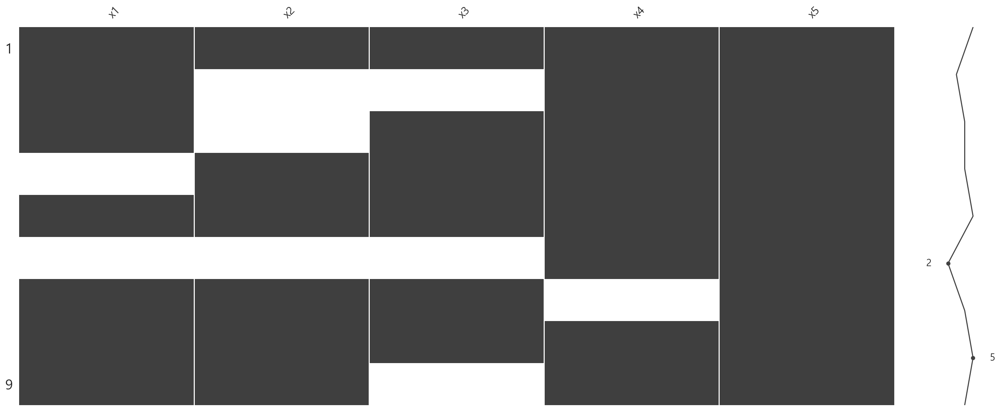

In [185]:
msno.matrix(df)
plt.show() ; 

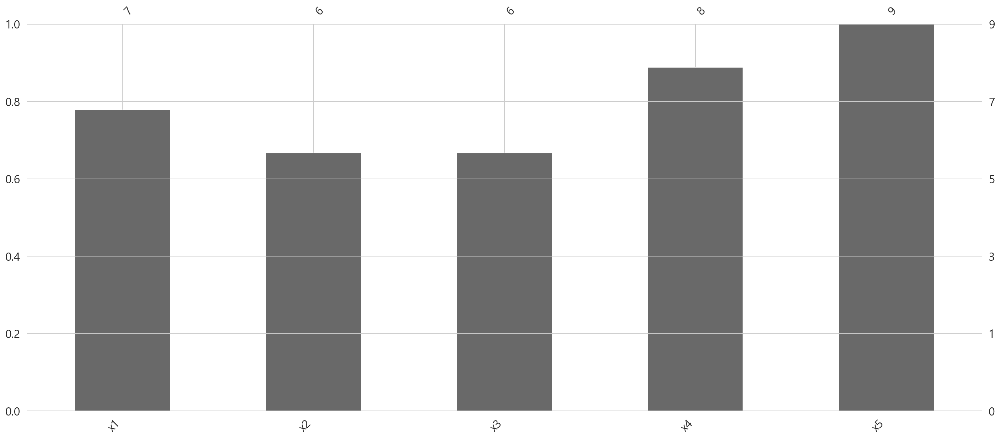

In [186]:
msno.bar(df)
plt.show() ;

In [188]:
titanic = sns.load_dataset("titanic")
titanic

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,yes,True


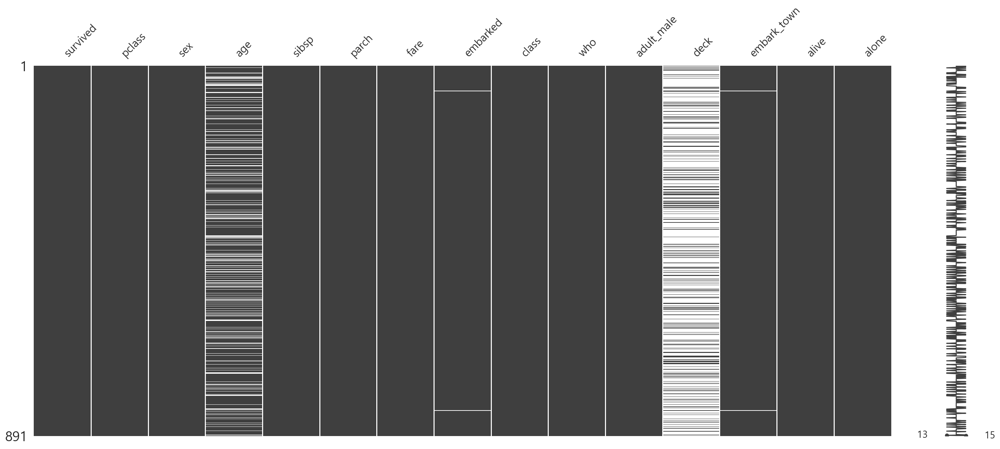

In [189]:
msno.matrix(titanic)
plt.show() ; 

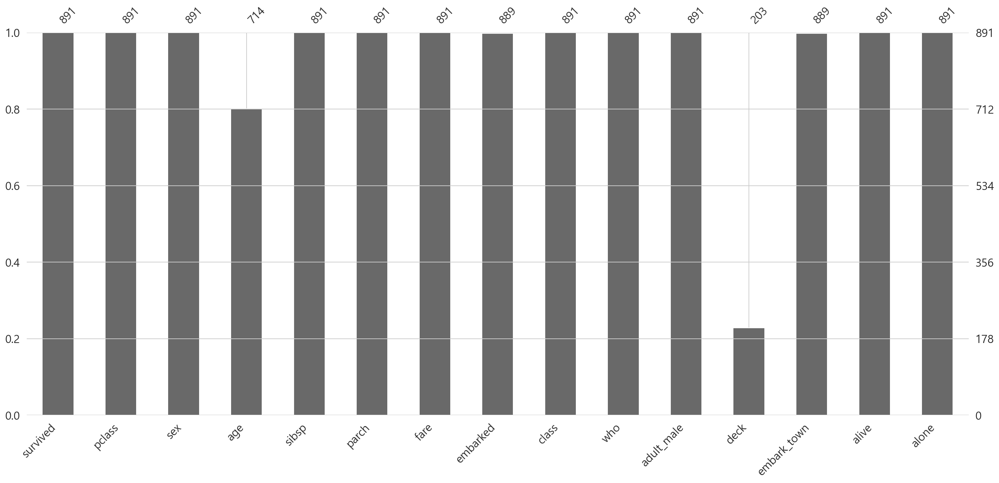

In [190]:
msno.bar(titanic)
plt.show() ; 

In [191]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          714 non-null    float64 
 4   sibsp        891 non-null    int64   
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   embarked     889 non-null    object  
 8   class        891 non-null    category
 9   who          891 non-null    object  
 10  adult_male   891 non-null    bool    
 11  deck         203 non-null    category
 12  embark_town  889 non-null    object  
 13  alive        891 non-null    object  
 14  alone        891 non-null    bool    
dtypes: bool(2), category(2), float64(2), int64(4), object(5)
memory usage: 80.7+ KB


In [192]:
df

,x1,x2,x3,x4,x5
0,1,0.1,1.0,2019-01-01,A
1,2,NaN,NaN,2022-06-13,B
2,3,NaN,3.0,2022-06-01,C
3,<NA>,0.4,4.0,2022-05-31,A
4,5,0.5,5.0,2022-04-01,B
5,<NA>,NaN,NaN,2021-02-14,C
6,7,0.7,7.0,NaT,A
7,8,0.8,8.0,2022-08-08,B
8,9,0.9,NaN,2021-09-01,C


In [193]:
df.dropna()

,x1,x2,x3,x4,x5
0,1,0.1,1.0,2019-01-01,A
4,5,0.5,5.0,2022-04-01,B
7,8,0.8,8.0,2022-08-08,B


In [194]:
df

,x1,x2,x3,x4,x5
0,1,0.1,1.0,2019-01-01,A
1,2,NaN,NaN,2022-06-13,B
2,3,NaN,3.0,2022-06-01,C
3,<NA>,0.4,4.0,2022-05-31,A
4,5,0.5,5.0,2022-04-01,B
5,<NA>,NaN,NaN,2021-02-14,C
6,7,0.7,7.0,NaT,A
7,8,0.8,8.0,2022-08-08,B
8,9,0.9,NaN,2021-09-01,C


In [195]:
df.dropna(axis=0)

,x1,x2,x3,x4,x5
0,1,0.1,1.0,2019-01-01,A
4,5,0.5,5.0,2022-04-01,B
7,8,0.8,8.0,2022-08-08,B


In [196]:
df.dropna(axis=1)

,x5
0,A
1,B
2,C
3,A
4,B
5,C
6,A
7,B
8,C


In [200]:
df.dropna(thresh=8, axis=1)

,x4,x5
0,2019-01-01,A
1,2022-06-13,B
2,2022-06-01,C
3,2022-05-31,A
4,2022-04-01,B
5,2021-02-14,C
6,NaT,A
7,2022-08-08,B
8,2021-09-01,C


In [201]:
titanic.dropna(thresh=int(len(titanic)*0.5), axis=1)

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,Cherbourg,yes,True


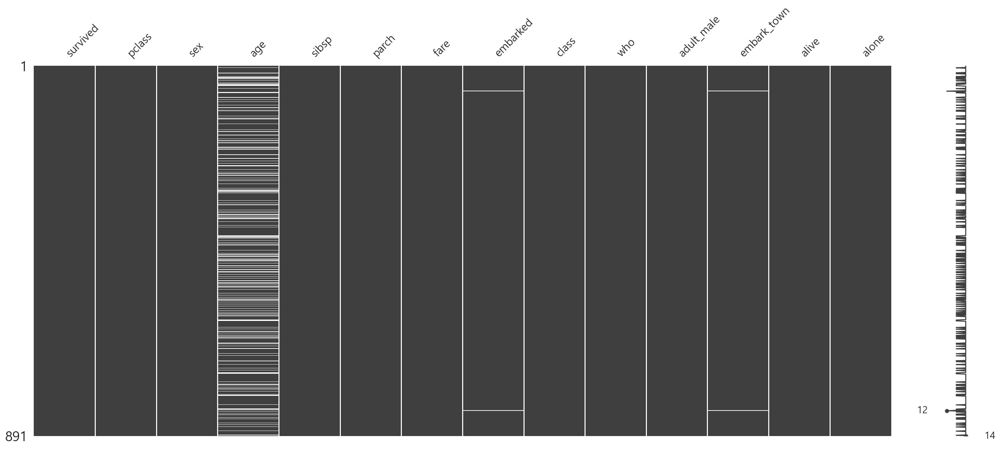

In [202]:
titanic_drop = titanic.dropna(thresh=int(len(titanic)*0.5), axis=1)

msno.matrix(titanic_drop)
plt.show() ; 

<AxesSubplot:>

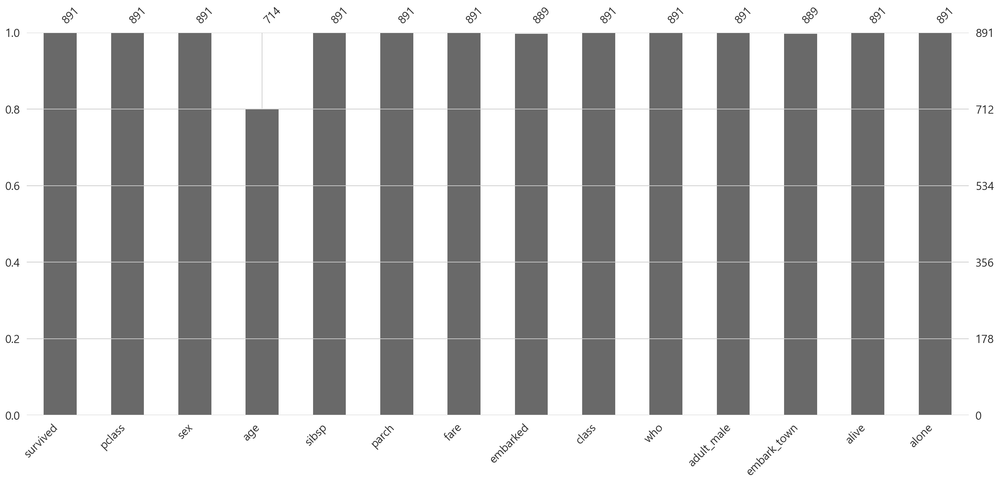

In [203]:
msno.bar(titanic_drop)

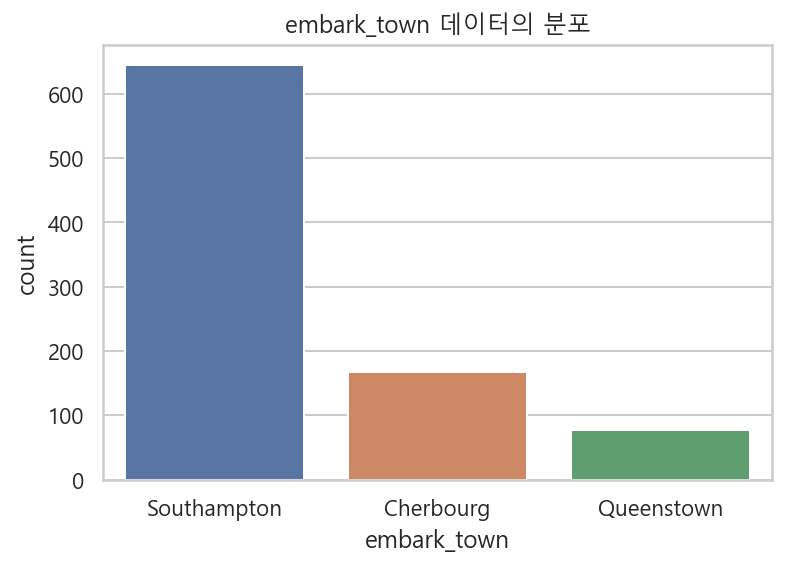

In [204]:
sns.countplot(titanic.embark_town)
plt.title("embark_town 데이터의 분포")
plt.show() ;

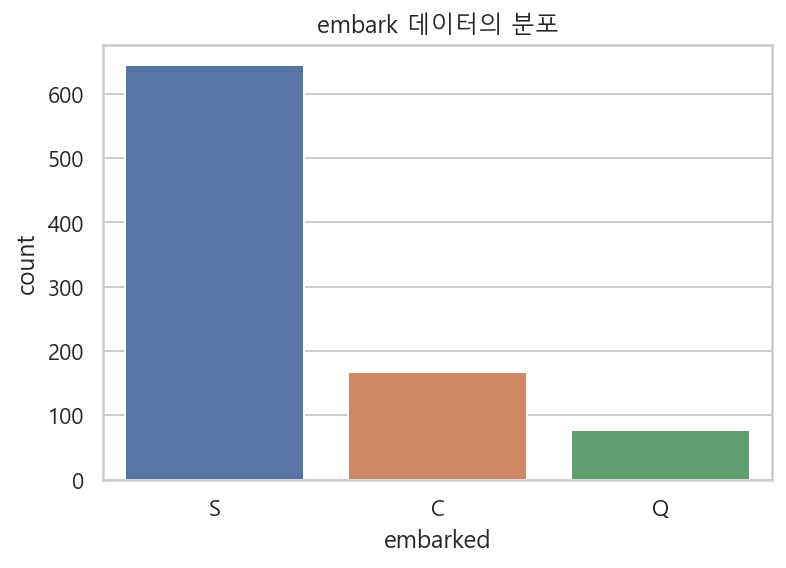

In [207]:
sns.countplot(titanic["embarked"])
plt.title("embark 데이터의 분포")
plt.show() ; 

In [205]:
from sklearn.impute import SimpleImputer

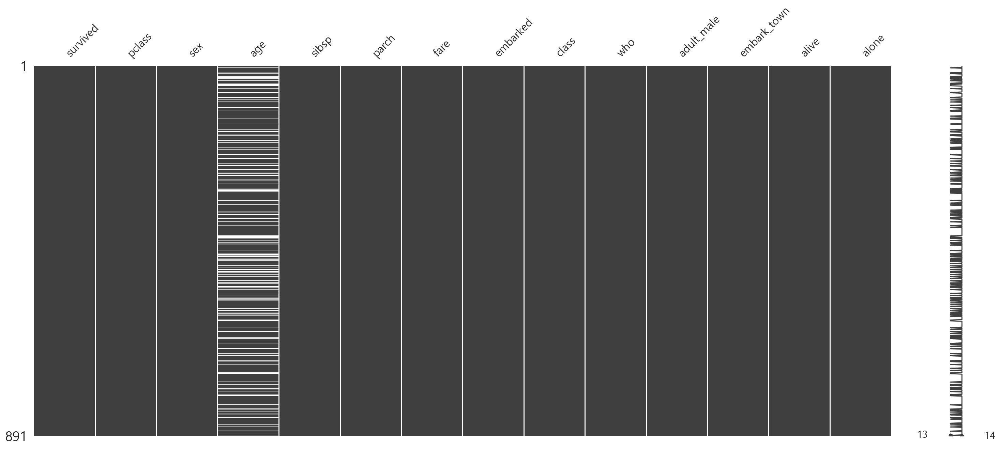

In [210]:
imputer = SimpleImputer(strategy="most_frequent")
titanic_drop["embark_town"] = imputer.fit_transform(titanic[["embark_town"]])
titanic_drop["embarked"] = imputer.fit_transform(titanic[["embarked"]])

msno.matrix(titanic_drop)
plt.show() ; 

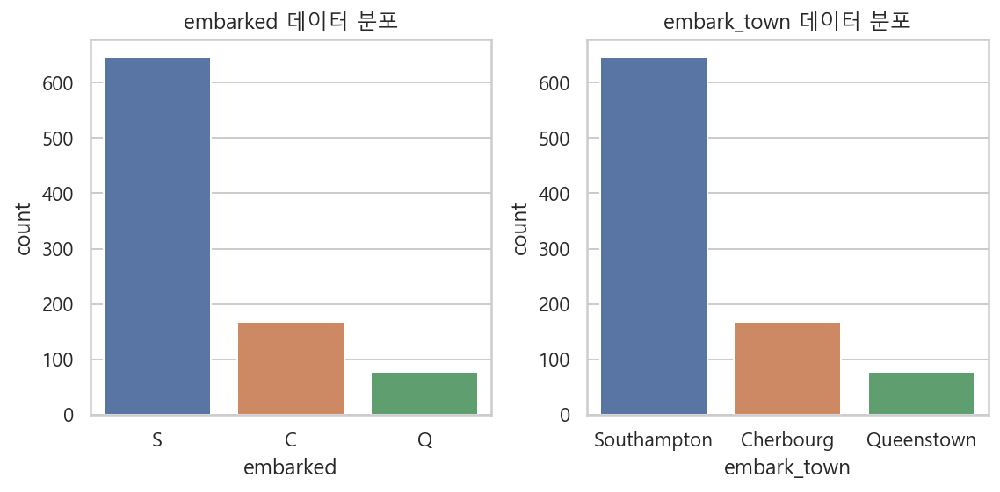

In [217]:
plt.figure(figsize=(8, 4))
plt.subplot(121)
sns.countplot(titanic_drop["embarked"])
plt.title("embarked 데이터 분포")

plt.subplot(122)
sns.countplot(titanic_drop.embark_town)
plt.title("embark_town 데이터 분포")

plt.tight_layout()
plt.show() ; 

In [218]:
titanic_drop["age"].dtype

dtype('float64')

In [222]:
titanic_drop["age"].describe()

count    714.000000
mean      29.699118
std       14.526497
min        0.420000
25%       20.125000
50%       28.000000
75%       38.000000
max       80.000000
Name: age, dtype: float64

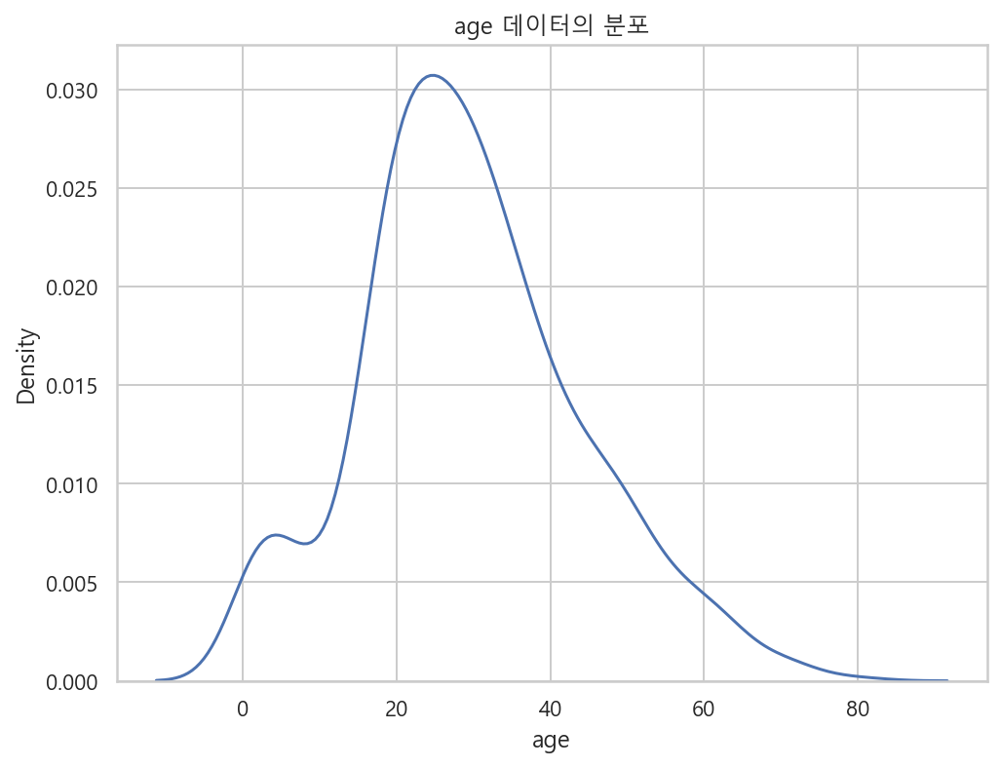

In [224]:
plt.figure(figsize=(8, 6))
sns.kdeplot(titanic_drop.age)
plt.title("age 데이터의 분포")
plt.show() ; 

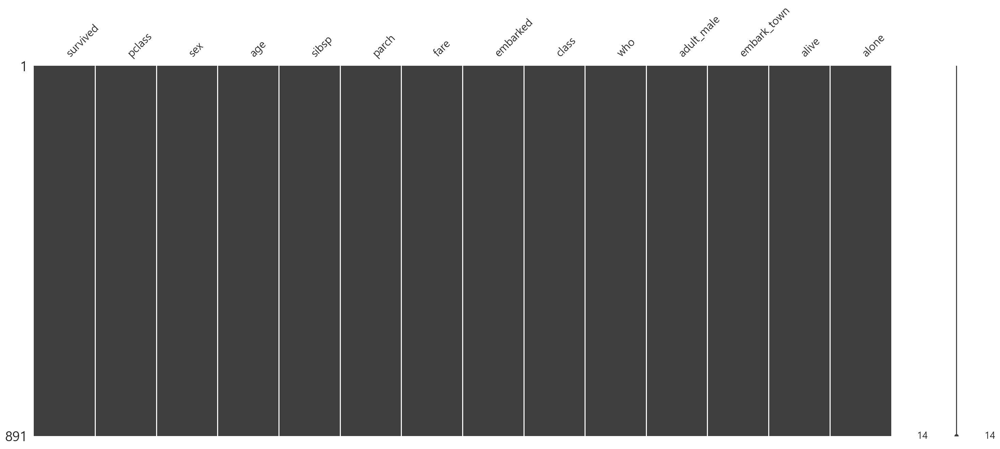

In [239]:
imputer_age = SimpleImputer(strategy="median")
titanic_drop["age"] = imputer_age.fit_transform(titanic_drop[["age"]])

msno.matrix(titanic_drop)
plt.show() ; 

In [238]:
titanic_drop["age"]

0      22.0
1      38.0
2      26.0
3      35.0
4      35.0
       ... 
886    27.0
887    19.0
888    28.0
889    26.0
890    32.0
Name: age, Length: 891, dtype: float64

In [233]:
titanic_drop[["age"]].info

<bound method DataFrame.info of       age
0    22.0
1    38.0
2    26.0
3    35.0
4    35.0
..    ...
886  27.0
887  19.0
888  28.0
889  26.0
890  32.0

[891 rows x 1 columns]>

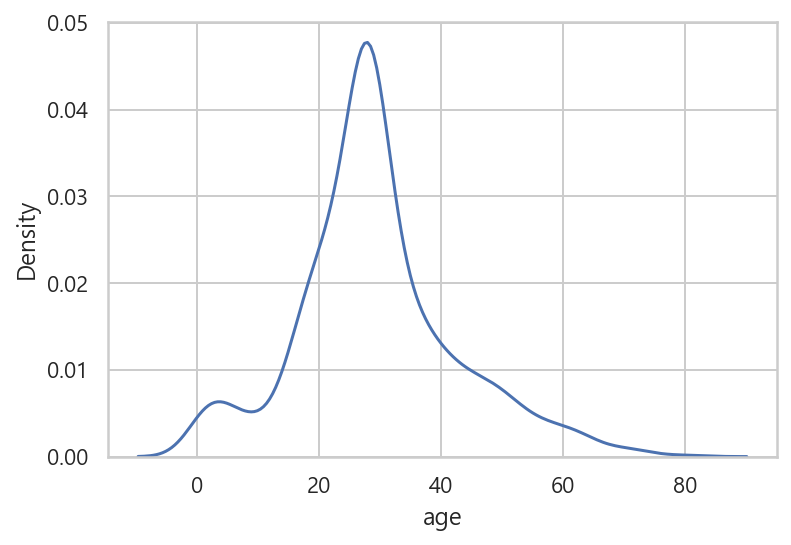

In [240]:
sns.kdeplot(titanic_drop["age"])
plt.show() ; 

# patsy 패키지

In [1]:
from patsy import demo_data

In [2]:
df = pd.DataFrame(demo_data("x1", "x2", "x3", "x4", "x5"))
df

,x1,x2,x3,x4,x5
0,1.764052,-0.977278,0.144044,0.333674,-2.552990
1,0.400157,0.950088,1.454274,1.494079,0.653619
2,0.978738,-0.151357,0.761038,-0.205158,0.864436
3,2.240893,-0.103219,0.121675,0.313068,-0.742165
4,1.867558,0.410599,0.443863,-0.854096,2.269755


In [4]:
from patsy import dmatrix

In [5]:
dmatrix("x1 + 0", data=df)

DesignMatrix with shape (5, 1)
       x1
  1.76405
  0.40016
  0.97874
  2.24089
  1.86756
  Terms:
    'x1' (column 0)

In [6]:
dmatrix("x1 + x2", data=df)

DesignMatrix with shape (5, 3)
  Intercept       x1        x2
          1  1.76405  -0.97728
          1  0.40016   0.95009
          1  0.97874  -0.15136
          1  2.24089  -0.10322
          1  1.86756   0.41060
  Terms:
    'Intercept' (column 0)
    'x1' (column 1)
    'x2' (column 2)

In [7]:
dmatrix("+".join(df.columns), data=df)

DesignMatrix with shape (5, 6)
  Intercept       x1        x2       x3        x4        x5
          1  1.76405  -0.97728  0.14404   0.33367  -2.55299
          1  0.40016   0.95009  1.45427   1.49408   0.65362
          1  0.97874  -0.15136  0.76104  -0.20516   0.86444
          1  2.24089  -0.10322  0.12168   0.31307  -0.74217
          1  1.86756   0.41060  0.44386  -0.85410   2.26975
  Terms:
    'Intercept' (column 0)
    'x1' (column 1)
    'x2' (column 2)
    'x3' (column 3)
    'x4' (column 4)
    'x5' (column 5)

In [8]:
dmatrix("x1 + x3 + x5 -1", data=df)

DesignMatrix with shape (5, 3)
       x1       x3        x5
  1.76405  0.14404  -2.55299
  0.40016  1.45427   0.65362
  0.97874  0.76104   0.86444
  2.24089  0.12168  -0.74217
  1.86756  0.44386   2.26975
  Terms:
    'x1' (column 0)
    'x3' (column 1)
    'x5' (column 2)

In [9]:
dmatrix("x1+x3+x5+0", data=df)

DesignMatrix with shape (5, 3)
       x1       x3        x5
  1.76405  0.14404  -2.55299
  0.40016  1.45427   0.65362
  0.97874  0.76104   0.86444
  2.24089  0.12168  -0.74217
  1.86756  0.44386   2.26975
  Terms:
    'x1' (column 0)
    'x3' (column 1)
    'x5' (column 2)

In [10]:
dmatrix("x1 + np.log(np.abs(x2))", df)

DesignMatrix with shape (5, 3)
  Intercept       x1  np.log(np.abs(x2))
          1  1.76405            -0.02298
          1  0.40016            -0.05120
          1  0.97874            -1.88811
          1  2.24089            -2.27090
          1  1.86756            -0.89014
  Terms:
    'Intercept' (column 0)
    'x1' (column 1)
    'np.log(np.abs(x2))' (column 2)

In [11]:
dmatrix("x1 + np.log(x3)", df)

DesignMatrix with shape (5, 3)
  Intercept       x1  np.log(x3)
          1  1.76405    -1.93764
          1  0.40016     0.37451
          1  0.97874    -0.27307
          1  2.24089    -2.10640
          1  1.86756    -0.81224
  Terms:
    'Intercept' (column 0)
    'x1' (column 1)
    'np.log(x3)' (column 2)

In [12]:
def ten_times(x) : 
    return 10 * x

dmatrix("x1 + ten_times(x1)", df)

DesignMatrix with shape (5, 3)
  Intercept       x1  ten_times(x1)
          1  1.76405       17.64052
          1  0.40016        4.00157
          1  0.97874        9.78738
          1  2.24089       22.40893
          1  1.86756       18.67558
  Terms:
    'Intercept' (column 0)
    'x1' (column 1)
    'ten_times(x1)' (column 2)

In [13]:
dmatrix("x1 + x2 + x1:x2", data=df)

DesignMatrix with shape (5, 4)
  Intercept       x1        x2     x1:x2
          1  1.76405  -0.97728  -1.72397
          1  0.40016   0.95009   0.38018
          1  0.97874  -0.15136  -0.14814
          1  2.24089  -0.10322  -0.23130
          1  1.86756   0.41060   0.76682
  Terms:
    'Intercept' (column 0)
    'x1' (column 1)
    'x2' (column 2)
    'x1:x2' (column 3)

In [18]:
df.x1[0] * df.x2[0] * df.x3[0]

-0.24832669982410968

In [17]:
dmatrix("x1:x2:x3", df)

DesignMatrix with shape (5, 2)
  Intercept  x1:x2:x3
          1  -0.24833
          1   0.55289
          1  -0.11274
          1  -0.02814
          1   0.34036
  Terms:
    'Intercept' (column 0)
    'x1:x2:x3' (column 1)

In [19]:
dmatrix("x1 * x2 + 0", data=df)

DesignMatrix with shape (5, 3)
       x1        x2     x1:x2
  1.76405  -0.97728  -1.72397
  0.40016   0.95009   0.38018
  0.97874  -0.15136  -0.14814
  2.24089  -0.10322  -0.23130
  1.86756   0.41060   0.76682
  Terms:
    'x1' (column 0)
    'x2' (column 1)
    'x1:x2' (column 2)

In [20]:
dmatrix("x1 * x2 * x3 + 0", data=df)

DesignMatrix with shape (5, 7)
       x1        x2     x1:x2       x3    x1:x3     x2:x3  x1:x2:x3
  1.76405  -0.97728  -1.72397  0.14404  0.25410  -0.14077  -0.24833
  0.40016   0.95009   0.38018  1.45427  0.58194   1.38169   0.55289
  0.97874  -0.15136  -0.14814  0.76104  0.74486  -0.11519  -0.11274
  2.24089  -0.10322  -0.23130  0.12168  0.27266  -0.01256  -0.02814
  1.86756   0.41060   0.76682  0.44386  0.82894   0.18225   0.34036
  Terms:
    'x1' (column 0)
    'x2' (column 1)
    'x1:x2' (column 2)
    'x3' (column 3)
    'x1:x3' (column 4)
    'x2:x3' (column 5)
    'x1:x2:x3' (column 6)

In [21]:
dmatrix("x1 + x2 + I(x1 + x2) + 0", data=df)

DesignMatrix with shape (5, 3)
       x1        x2  I(x1 + x2)
  1.76405  -0.97728     0.78677
  0.40016   0.95009     1.35025
  0.97874  -0.15136     0.82738
  2.24089  -0.10322     2.13767
  1.86756   0.41060     2.27816
  Terms:
    'x1' (column 0)
    'x2' (column 1)
    'I(x1 + x2)' (column 2)

In [22]:
dmatrix("x1 + x2 + I(x1 / x2) + 0", data=df)

DesignMatrix with shape (5, 3)
       x1        x2  I(x1 / x2)
  1.76405  -0.97728    -1.80507
  0.40016   0.95009     0.42118
  0.97874  -0.15136    -6.46641
  2.24089  -0.10322   -21.71012
  1.86756   0.41060     4.54838
  Terms:
    'x1' (column 0)
    'x2' (column 1)
    'I(x1 / x2)' (column 2)

In [24]:
dmatrix("x1 + x2 + np.log(I(x1 + x2)) + 0", data=df)

DesignMatrix with shape (5, 3)
       x1        x2  np.log(I(x1 + x2))
  1.76405  -0.97728            -0.23981
  0.40016   0.95009             0.30029
  0.97874  -0.15136            -0.18949
  2.24089  -0.10322             0.75972
  1.86756   0.41060             0.82337
  Terms:
    'x1' (column 0)
    'x2' (column 1)
    'np.log(I(x1 + x2))' (column 2)

In [25]:
dmatrix("x1 + x2 + I(np.log(x1) + np.log(x2)) + 0", data=df)

DesignMatrix with shape (2, 3)
       x1       x2  I(np.log(x1) + np.log(x2))
  0.40016  0.95009                    -0.96710
  1.86756  0.41060                    -0.26551
  Terms:
    'x1' (column 0)
    'x2' (column 1)
    'I(np.log(x1) + np.log(x2))' (column 2)

## 스케일링

In [26]:
dmatrix("center(x1) + 0", df)

DesignMatrix with shape (5, 1)
  center(x1)
     0.31377
    -1.05012
    -0.47154
     0.79061
     0.41728
  Terms:
    'center(x1)' (column 0)

In [28]:
dmatrix("center(x2) + center(x3) + 0", df)

DesignMatrix with shape (5, 2)
  center(x2)  center(x3)
    -1.00304    -0.44094
     0.92432     0.86929
    -0.17712     0.17606
    -0.12899    -0.46330
     0.38483    -0.14112
  Terms:
    'center(x2)' (column 0)
    'center(x3)' (column 1)

In [29]:
df.x1 - np.mean(df.x1)

0    0.313773
1   -1.050123
2   -0.471542
3    0.790613
4    0.417278
Name: x1, dtype: float64

In [30]:
dmatrix("standardize(x1) + 0", data=df)

DesignMatrix with shape (5, 1)
  standardize(x1)
          0.47060
         -1.57500
         -0.70723
          1.18578
          0.62584
  Terms:
    'standardize(x1)' (column 0)

In [31]:
dmatrix("standardize(x2) + x3 + I(x2 + x3) + 0", data=df)

DesignMatrix with shape (5, 3)
  standardize(x2)       x3  I(x2 + x3)
         -1.56399  0.14404    -0.83323
          1.44124  1.45427     2.40436
         -0.27618  0.76104     0.60968
         -0.20112  0.12168     0.01846
          0.60005  0.44386     0.85446
  Terms:
    'standardize(x2)' (column 0)
    'x3' (column 1)
    'I(x2 + x3)' (column 2)

In [33]:
X = np.arange(7).reshape(-1, 1)
X

array([[0],
       [1],
       [2],
       [3],
       [4],
       [5],
       [6]])

In [34]:
from sklearn.preprocessing import StandardScaler

In [36]:
scaler = StandardScaler()
scaler.fit_transform(X)

array([[-1.5],
       [-1. ],
       [-0.5],
       [ 0. ],
       [ 0.5],
       [ 1. ],
       [ 1.5]])

In [38]:
(X - np.mean(X)) / np.std(X)

array([[-1.5],
       [-1. ],
       [-0.5],
       [ 0. ],
       [ 0.5],
       [ 1. ],
       [ 1.5]])

In [39]:
test_X = X - np.mean(X)
test_X

array([[-3.],
       [-2.],
       [-1.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 3.]])

In [40]:
np.mean(test_X)

0.0

In [41]:
X2 = np.vstack([X, [10000]])
X2

array([[    0],
       [    1],
       [    2],
       [    3],
       [    4],
       [    5],
       [    6],
       [10000]])

In [42]:
scaler.fit_transform(X2)

array([[-0.3788718 ],
       [-0.37856934],
       [-0.37826687],
       [-0.37796441],
       [-0.37766195],
       [-0.37735949],
       [-0.37705703],
       [ 2.64575089]])

In [43]:
from sklearn.preprocessing import RobustScaler

In [44]:
robu_scaler = RobustScaler()
robu_scaler.fit_transform(X2)

array([[-1.00000000e+00],
       [-7.14285714e-01],
       [-4.28571429e-01],
       [-1.42857143e-01],
       [ 1.42857143e-01],
       [ 4.28571429e-01],
       [ 7.14285714e-01],
       [ 2.85614286e+03]])

In [45]:
from sklearn.preprocessing import PolynomialFeatures

In [49]:
poly = PolynomialFeatures(degree=3)
poly.fit_transform(X)

array([[  1.,   0.,   0.,   0.],
       [  1.,   1.,   1.,   1.],
       [  1.,   2.,   4.,   8.],
       [  1.,   3.,   9.,  27.],
       [  1.,   4.,  16.,  64.],
       [  1.,   5.,  25., 125.],
       [  1.,   6.,  36., 216.]])

In [50]:
X = 90 * np.arange(9).reshape(-1, 1)
X

array([[  0],
       [ 90],
       [180],
       [270],
       [360],
       [450],
       [540],
       [630],
       [720]])

In [51]:
from sklearn.preprocessing import FunctionTransformer

In [52]:
def degree2sincos(X) : 
    x0 = np.sin(X * np.pi / 180)
    x1 = np.cos(X * np.pi / 180)
    X_new = np.hstack([x0, x1])
    return X_new

In [53]:
X2 = FunctionTransformer(degree2sincos).fit_transform(X)
X2

array([[ 0.0000000e+00,  1.0000000e+00],
       [ 1.0000000e+00,  6.1232340e-17],
       [ 1.2246468e-16, -1.0000000e+00],
       [-1.0000000e+00, -1.8369702e-16],
       [-2.4492936e-16,  1.0000000e+00],
       [ 1.0000000e+00,  3.0616170e-16],
       [ 3.6739404e-16, -1.0000000e+00],
       [-1.0000000e+00, -4.2862638e-16],
       [-4.8985872e-16,  1.0000000e+00]])

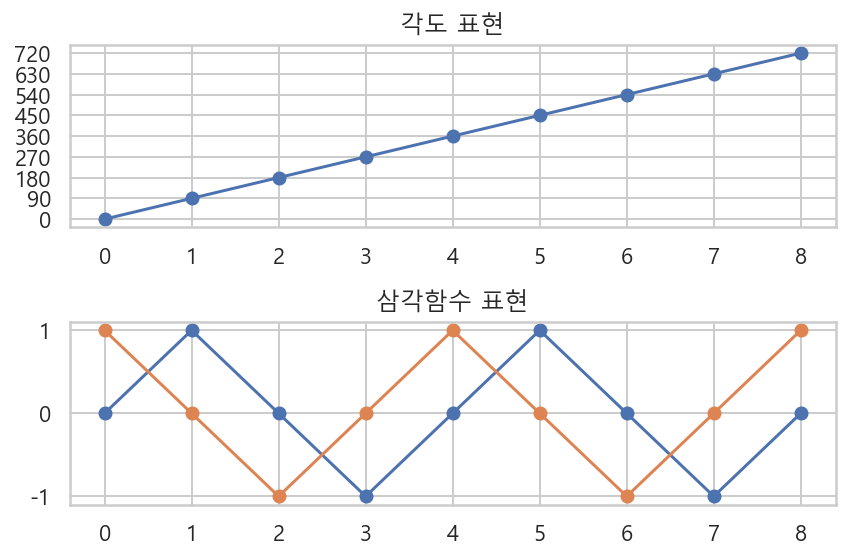

In [55]:
%matplotlib inline

plt.subplot(211)
plt.plot(X, marker="o")
plt.yticks(X.flatten())
plt.title("각도 표현")

plt.subplot(212)
plt.plot(X2, marker="o")
plt.title("삼각함수 표현")

plt.tight_layout()
plt.show() ; 

# 범주형 데이터 처리

In [57]:
df1 = pd.DataFrame(["Male", "Fmale"], columns=["x1"])
df1

,x1
0,Male
1,Fmale


In [58]:
from patsy import dmatrix

In [60]:
dmatrix("x1 + 0", df1)

DesignMatrix with shape (2, 2)
  x1[Fmale]  x1[Male]
          0         1
          1         0
  Terms:
    'x1' (columns 0:2)

In [62]:
df2 = pd.DataFrame(["A", "B", "AB", "O"], columns=["x"])
df2

,x
0,A
1,B
2,AB
3,O


In [63]:
dmatrix("x + 0", df2)

DesignMatrix with shape (4, 4)
  x[A]  x[AB]  x[B]  x[O]
     1      0     0     0
     0      0     1     0
     0      1     0     0
     0      0     0     1
  Terms:
    'x' (columns 0:4)

In [64]:
df3 = pd.DataFrame([1, 2, 3, 4], columns=["x"])
df3

,x
0,1
1,2
2,3
3,4


In [65]:
dmatrix("C(x) + 0", df3)

DesignMatrix with shape (4, 4)
  C(x)[1]  C(x)[2]  C(x)[3]  C(x)[4]
        1        0        0        0
        0        1        0        0
        0        0        1        0
        0        0        0        1
  Terms:
    'C(x)' (columns 0:4)

In [66]:
df2

,x
0,A
1,B
2,AB
3,O


In [68]:
dm_btype = dmatrix("C(x, levels=['A', 'B', 'AB', 'O']) + 0", df2)
dm_btype

DesignMatrix with shape (4, 4)
  Columns:
    ["C(x, levels=['A', 'B', 'AB', 'O'])[A]",
     "C(x, levels=['A', 'B', 'AB', 'O'])[B]",
     "C(x, levels=['A', 'B', 'AB', 'O'])[AB]",
     "C(x, levels=['A', 'B', 'AB', 'O'])[O]"]
  Terms:
    "C(x, levels=['A', 'B', 'AB', 'O'])" (columns 0:4)
  (to view full data, use np.asarray(this_obj))

In [74]:
np.asarray(dm_btype)

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]])

In [75]:
df1

,x1
0,Male
1,Fmale


In [76]:
dmatrix("x1", df1)

DesignMatrix with shape (2, 2)
  Intercept  x1[T.Male]
          1           1
          1           0
  Terms:
    'Intercept' (column 0)
    'x1' (column 1)

In [78]:
dmatrix("C(x1, Treatment('Male'))", df1)

DesignMatrix with shape (2, 2)
  Intercept  C(x1, Treatment('Male'))[T.Fmale]
          1                                  0
          1                                  1
  Terms:
    'Intercept' (column 0)
    "C(x1, Treatment('Male'))" (column 1)

In [79]:
dmatrix("x", df2)

DesignMatrix with shape (4, 4)
  Intercept  x[T.AB]  x[T.B]  x[T.O]
          1        0       0       0
          1        0       1       0
          1        1       0       0
          1        0       0       1
  Terms:
    'Intercept' (column 0)
    'x' (columns 1:4)

In [81]:
dm_reducerank = dmatrix("C(x, Treatment('AB'))", df2)
dm_reducerank

DesignMatrix with shape (4, 4)
  Columns:
    ['Intercept',
     "C(x, Treatment('AB'))[T.A]",
     "C(x, Treatment('AB'))[T.B]",
     "C(x, Treatment('AB'))[T.O]"]
  Terms:
    'Intercept' (column 0), "C(x, Treatment('AB'))" (columns 1:4)
  (to view full data, use np.asarray(this_obj))

In [82]:
np.asarray(dm_reducerank)

array([[1., 1., 0., 0.],
       [1., 0., 1., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 1.]])

In [91]:
df4 = pd.DataFrame([["A", "X"], ["B", "X"], ["A", "Y"], ["B", "Y"]], columns=["x1", "x2"])
df4

,x1,x2
0,A,X
1,B,X
2,A,Y
3,B,Y


In [92]:
dmatrix("x1 + x2", df4)

DesignMatrix with shape (4, 3)
  Intercept  x1[T.B]  x2[T.Y]
          1        0        0
          1        1        0
          1        0        1
          1        1        1
  Terms:
    'Intercept' (column 0)
    'x1' (column 1)
    'x2' (column 2)

In [93]:
dmatrix("x1:x2 + 0", df4)

DesignMatrix with shape (4, 4)
  x1[A]:x2[X]  x1[B]:x2[X]  x1[A]:x2[Y]  x1[B]:x2[Y]
            1            0            0            0
            0            1            0            0
            0            0            1            0
            0            0            0            1
  Terms:
    'x1:x2' (columns 0:4)

# 회귀분석 예제

### 보스턴

In [94]:
from sklearn.datasets import load_boston

In [95]:
boston = load_boston()
dir(boston)

['DESCR', 'data', 'data_module', 'feature_names', 'filename', 'target']

In [96]:
dfX = pd.DataFrame(boston.data, columns=boston.feature_names)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])

In [97]:
dfX.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [98]:
dfy.head()

,MEDV
0,24.0
1,21.6
2,34.7
3,33.4
4,36.2


In [99]:
df = pd.concat([dfX, dfy], axis=1)
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


In [102]:
df.CHAS.unique()

array([0., 1.])

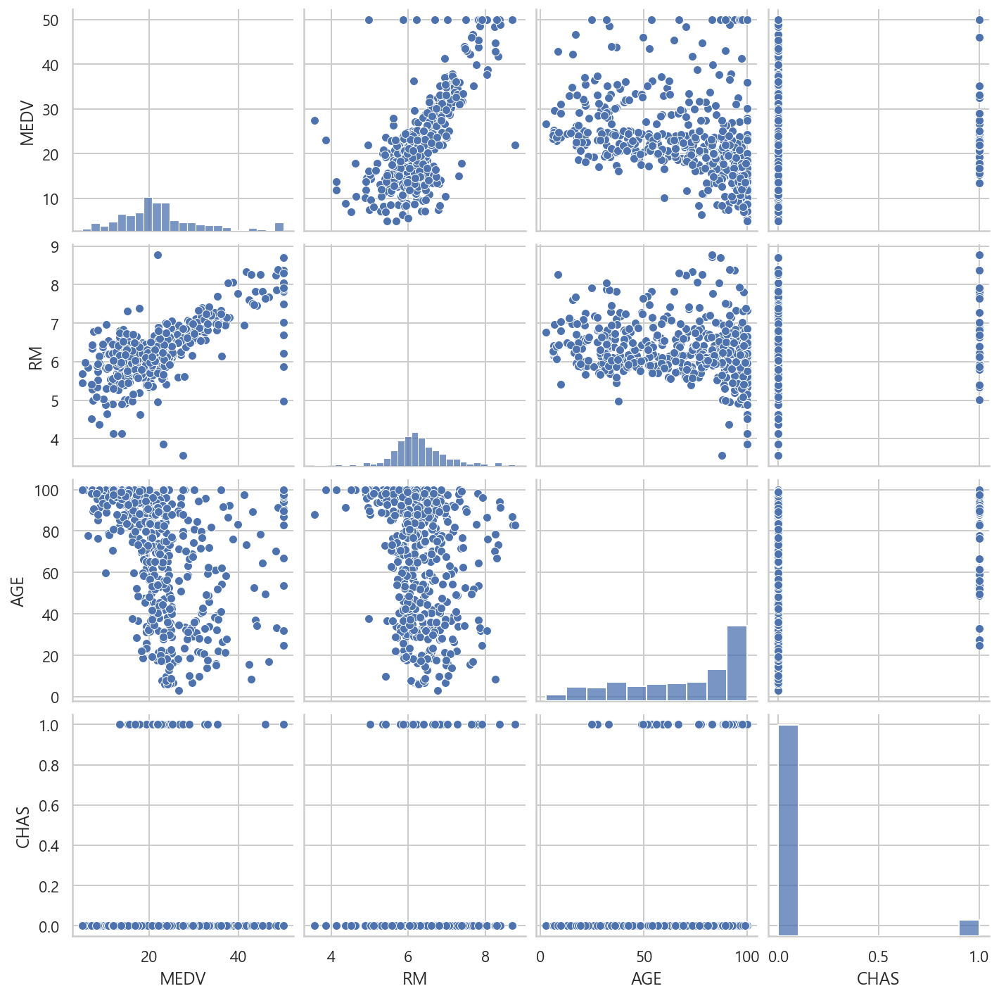

In [103]:
sns.pairplot(df[["MEDV", "RM", "AGE", "CHAS"]])
plt.show() ; 

### 당뇨병 데이터

In [104]:
from sklearn.datasets import load_diabetes

In [105]:
diabetes = load_diabetes()
dir(diabetes)

['DESCR',
 'data',
 'data_filename',
 'data_module',
 'feature_names',
 'frame',
 'target',
 'target_filename']

In [106]:
df = pd.DataFrame(diabetes.data, columns=diabetes.feature_names)
df.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019908,-0.017646
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068330,-0.092204
2,0.085299,0.050680,0.044451,-0.005671,-0.045599,-0.034194,-0.032356,-0.002592,0.002864,-0.025930
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022692,-0.009362
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031991,-0.046641


In [107]:
df["target"] = diabetes.target
df.tail()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6,target
437,0.041708,0.050680,0.019662,0.059744,-0.005697,-0.002566,-0.028674,-0.002592,0.031193,0.007207,178.0
438,-0.005515,0.050680,-0.015906,-0.067642,0.049341,0.079165,-0.028674,0.034309,-0.018118,0.044485,104.0
439,0.041708,0.050680,-0.015906,0.017282,-0.037344,-0.013840,-0.024993,-0.011080,-0.046879,0.015491,132.0
440,-0.045472,-0.044642,0.039062,0.001215,0.016318,0.015283,-0.028674,0.026560,0.044528,-0.025930,220.0
441,-0.045472,-0.044642,-0.073030,-0.081414,0.083740,0.027809,0.173816,-0.039493,-0.004220,0.003064,57.0


In [109]:
df.columns

Index(['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6',
       'target'],
      dtype='object')

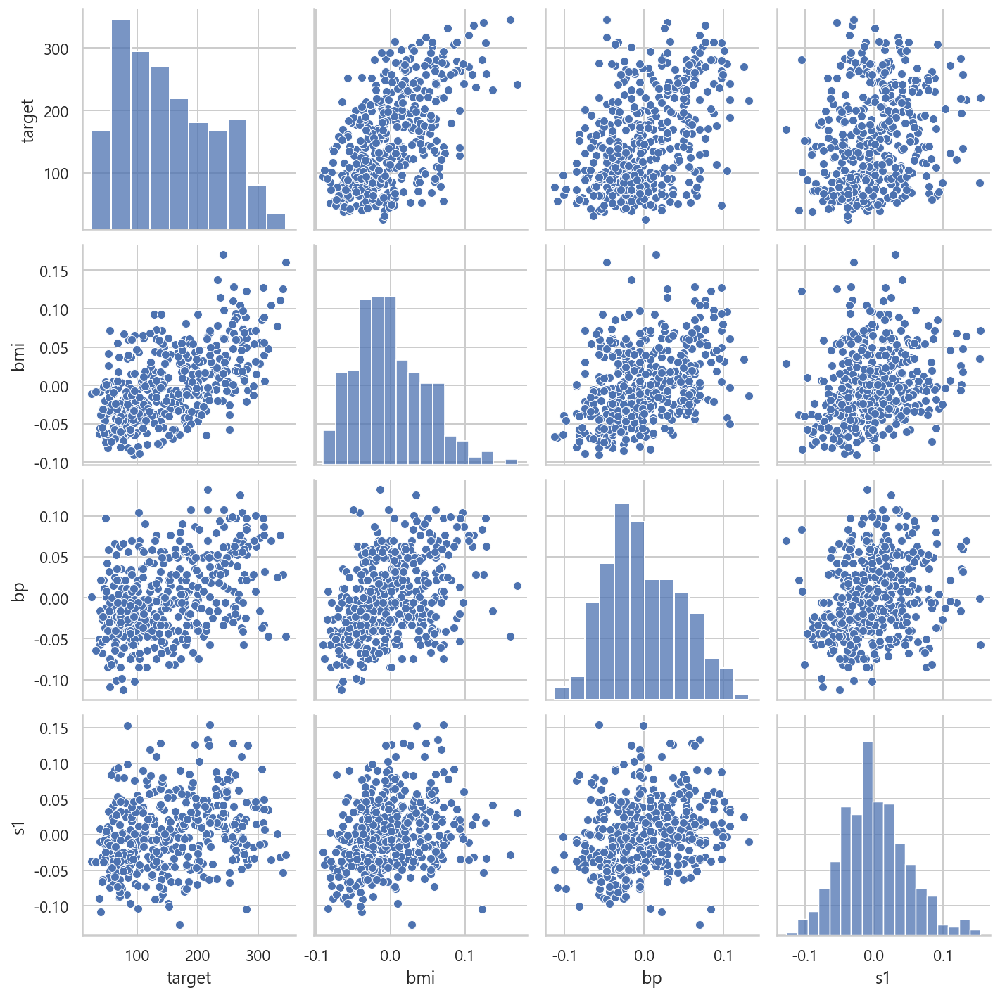

In [110]:
sns.pairplot(df[["target", "bmi", "bp", "s1"]])
plt.show() ; 

In [111]:
df.corr()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6,target
age,1.000000,0.173737,0.185085,0.335427,0.260061,0.219243,-0.075181,0.203841,0.270777,0.301731,0.187889
sex,0.173737,1.000000,0.088161,0.241013,0.035277,0.142637,-0.379090,0.332115,0.149918,0.208133,0.043062
bmi,0.185085,0.088161,1.000000,0.395415,0.249777,0.261170,-0.366811,0.413807,0.446159,0.388680,0.586450
bp,0.335427,0.241013,0.395415,1.000000,0.242470,0.185558,-0.178761,0.257653,0.393478,0.390429,0.441484
s1,0.260061,0.035277,0.249777,0.242470,1.000000,0.896663,0.051519,0.542207,0.515501,0.325717,0.212022
s2,0.219243,0.142637,0.261170,0.185558,0.896663,1.000000,-0.196455,0.659817,0.318353,0.290600,0.174054
s3,-0.075181,-0.379090,-0.366811,-0.178761,0.051519,-0.196455,1.000000,-0.738493,-0.398577,-0.273697,-0.394789
s4,0.203841,0.332115,0.413807,0.257653,0.542207,0.659817,-0.738493,1.000000,0.617857,0.417212,0.430453
s5,0.270777,0.149918,0.446159,0.393478,0.515501,0.318353,-0.398577,0.617857,1.000000,0.464670,0.565883
s6,0.301731,0.208133,0.388680,0.390429,0.325717,0.290600,-0.273697,0.417212,0.464670,1.000000,0.382483


### 캘리포니아 집값

In [112]:
from sklearn.datasets import fetch_california_housing

In [113]:
house = fetch_california_housing()
dir(house)

['DESCR', 'data', 'feature_names', 'frame', 'target', 'target_names']

In [117]:
house.feature_names

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

In [118]:
house.target_names

['MedHouseVal']

In [119]:
dfX = pd.DataFrame(house.data, columns=house.feature_names)
dfy = pd.DataFrame(house.target, columns=house.target_names)
df_house = pd.concat([dfX, dfy], axis=1)
df_house.tail()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847
20639,2.3886,16.0,5.254717,1.162264,1387.0,2.616981,39.37,-121.24,0.894


In [120]:
df_house.corr()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
MedInc,1.000000,-0.119034,0.326895,-0.062040,0.004834,0.018766,-0.079809,-0.015176,0.688075
HouseAge,-0.119034,1.000000,-0.153277,-0.077747,-0.296244,0.013191,0.011173,-0.108197,0.105623
AveRooms,0.326895,-0.153277,1.000000,0.847621,-0.072213,-0.004852,0.106389,-0.027540,0.151948
AveBedrms,-0.062040,-0.077747,0.847621,1.000000,-0.066197,-0.006181,0.069721,0.013344,-0.046701
Population,0.004834,-0.296244,-0.072213,-0.066197,1.000000,0.069863,-0.108785,0.099773,-0.024650
AveOccup,0.018766,0.013191,-0.004852,-0.006181,0.069863,1.000000,0.002366,0.002476,-0.023737
Latitude,-0.079809,0.011173,0.106389,0.069721,-0.108785,0.002366,1.000000,-0.924664,-0.144160
Longitude,-0.015176,-0.108197,-0.027540,0.013344,0.099773,0.002476,-0.924664,1.000000,-0.045967
MedHouseVal,0.688075,0.105623,0.151948,-0.046701,-0.024650,-0.023737,-0.144160,-0.045967,1.000000


In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(df_house.corr(), annot=True, fmt=".2f")
plt.show() ;

In [123]:
df_house.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


In [134]:
df.drop(columns=["s1", "s2", "s3", "s4", "s5", "s6"], inplace=True)
df.head()

,age,sex,bmi,bp,target
0,0.038076,0.050680,0.061696,0.021872,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,75.0
2,0.085299,0.050680,0.044451,-0.005671,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,206.0
4,0.005383,-0.044642,-0.036385,0.021872,135.0


In [137]:
df_house.columns

Index(['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup',
       'Latitude', 'Longitude', 'MedHouseVal'],
      dtype='object')

In [138]:
df_house.drop(columns=["Latitude", "Longitude"], inplace=True)
df_house.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,3.422


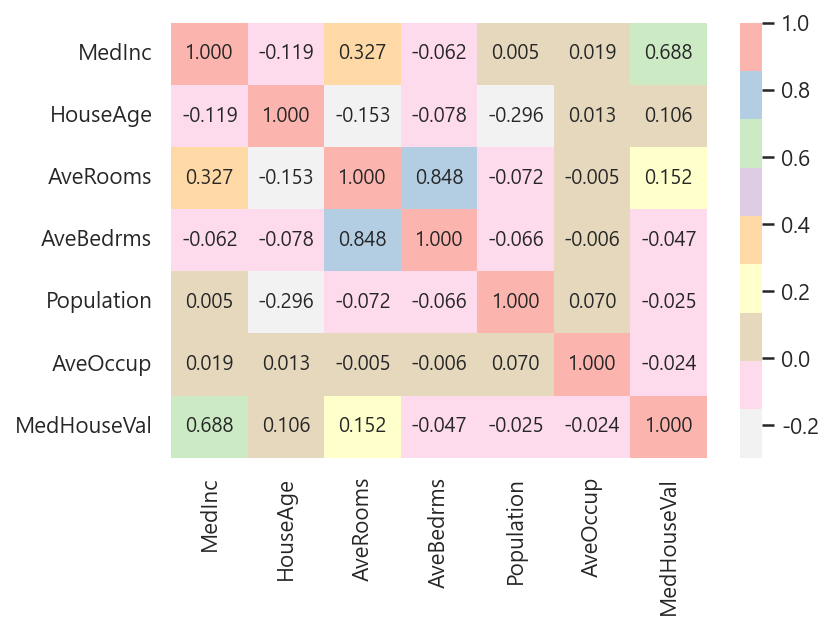

In [144]:
sns.heatmap(df_house.corr(), annot=True, fmt=".3f", cmap="Pastel1_r")
plt.show() ; 

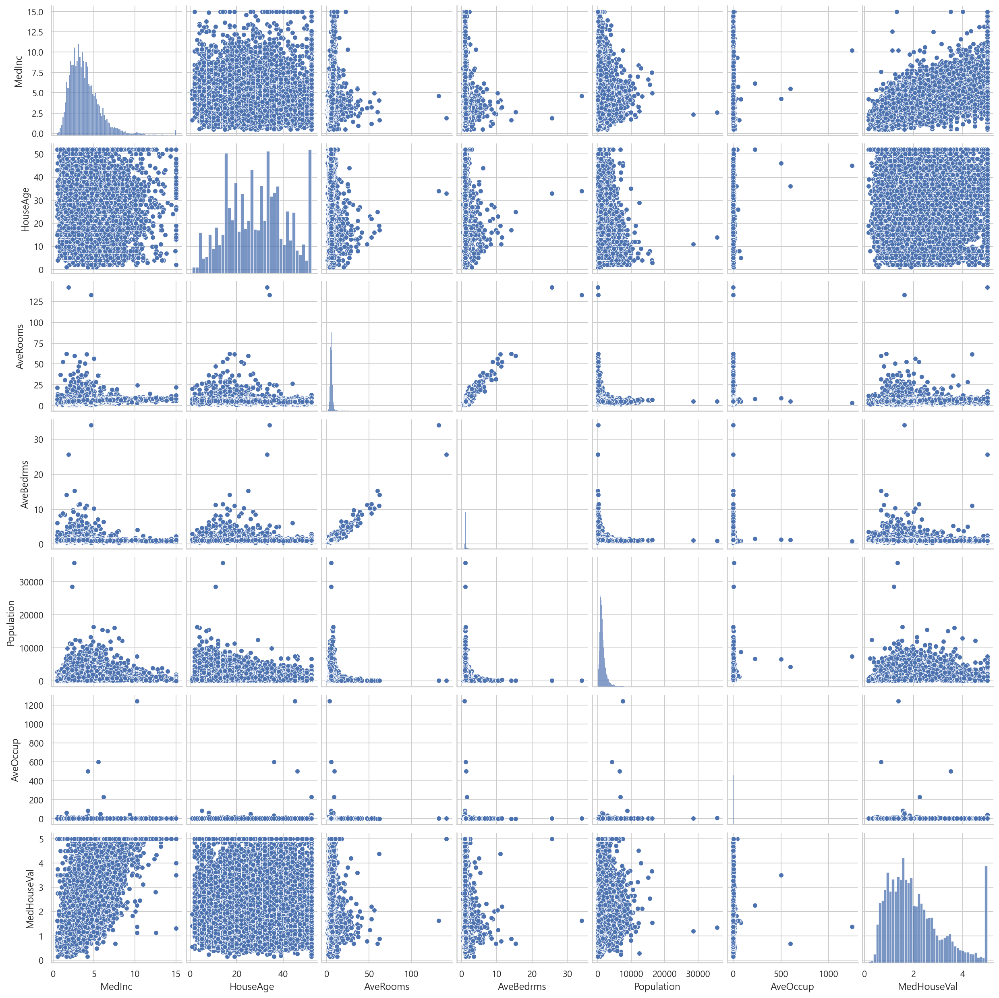

In [145]:
sns.pairplot(df_house)
plt.show() ; 

### 가상 데이터

In [146]:
from sklearn.datasets import make_regression

In [147]:
X, y, w = make_regression(
n_samples=50, n_features=1, bias=100, noise=10, coef=True, random_state=0)

In [148]:
xx = np.linspace(-3, 3, 100)
xx

array([-3.        , -2.93939394, -2.87878788, -2.81818182, -2.75757576,
       -2.6969697 , -2.63636364, -2.57575758, -2.51515152, -2.45454545,
       -2.39393939, -2.33333333, -2.27272727, -2.21212121, -2.15151515,
       -2.09090909, -2.03030303, -1.96969697, -1.90909091, -1.84848485,
       -1.78787879, -1.72727273, -1.66666667, -1.60606061, -1.54545455,
       -1.48484848, -1.42424242, -1.36363636, -1.3030303 , -1.24242424,
       -1.18181818, -1.12121212, -1.06060606, -1.        , -0.93939394,
       -0.87878788, -0.81818182, -0.75757576, -0.6969697 , -0.63636364,
       -0.57575758, -0.51515152, -0.45454545, -0.39393939, -0.33333333,
       -0.27272727, -0.21212121, -0.15151515, -0.09090909, -0.03030303,
        0.03030303,  0.09090909,  0.15151515,  0.21212121,  0.27272727,
        0.33333333,  0.39393939,  0.45454545,  0.51515152,  0.57575758,
        0.63636364,  0.6969697 ,  0.75757576,  0.81818182,  0.87878788,
        0.93939394,  1.        ,  1.06060606,  1.12121212,  1.18

In [149]:
X

array([[-0.85409574],
       [ 1.49407907],
       [-0.34791215],
       [ 0.44386323],
       [-0.18718385],
       [ 1.86755799],
       [ 0.4105985 ],
       [-1.70627019],
       [-1.42001794],
       [ 0.8644362 ],
       [ 0.97873798],
       [-0.20515826],
       [ 0.15494743],
       [-0.50965218],
       [ 1.53277921],
       [-0.74216502],
       [-1.45436567],
       [-0.10321885],
       [-2.55298982],
       [ 1.76405235],
       [-1.25279536],
       [-0.97727788],
       [ 0.04575852],
       [-0.4380743 ],
       [ 0.76103773],
       [ 0.14404357],
       [-0.21274028],
       [ 1.20237985],
       [-0.38732682],
       [ 2.2408932 ],
       [ 0.77749036],
       [ 0.15634897],
       [-1.61389785],
       [ 1.9507754 ],
       [ 0.40015721],
       [ 1.46935877],
       [ 1.45427351],
       [-0.30230275],
       [ 0.3130677 ],
       [ 0.33367433],
       [ 2.26975462],
       [-0.15135721],
       [ 0.12167502],
       [ 0.37816252],
       [ 0.6536186 ],
       [ 0

In [150]:
w

array(15.89695836)

In [152]:
y

array([ 69.16576208, 129.94932345,  80.01389923, 100.30585701,
       107.20314663, 140.88561123, 112.99506826,  82.25108224,
        71.56780523, 111.67769684, 112.48530888, 114.65029223,
       111.71570029, 101.63406761, 127.78240131,  93.08609825,
        80.69164687, 113.11903254,  61.0218126 , 131.15670173,
        91.08078405,  79.88503003,  90.81838842,  95.10877879,
       108.56190647,  98.64651153,  96.63568503, 125.15577947,
        98.56417169, 131.95814648, 121.75870162, 106.25707916,
        80.40782312, 128.46531432,  98.60107781, 110.84947303,
       116.3307515 , 103.39347869, 106.6868286 , 103.97656433,
       127.6988851 ,  97.31416893,  94.52678796,  96.96377225,
       101.80069439, 119.35745   , 118.85230744, 104.32382223,
        92.40639334,  83.7664334 ])

In [153]:
y0 = w * xx + 100
y0

array([ 52.30912491,  53.27257693,  54.23602895,  55.19948097,
        56.16293299,  57.12638502,  58.08983704,  59.05328906,
        60.01674108,  60.98019311,  61.94364513,  62.90709715,
        63.87054917,  64.83400119,  65.79745322,  66.76090524,
        67.72435726,  68.68780928,  69.6512613 ,  70.61471333,
        71.57816535,  72.54161737,  73.50506939,  74.46852141,
        75.43197344,  76.39542546,  77.35887748,  78.3223295 ,
        79.28578152,  80.24923355,  81.21268557,  82.17613759,
        83.13958961,  84.10304164,  85.06649366,  86.02994568,
        86.9933977 ,  87.95684972,  88.92030175,  89.88375377,
        90.84720579,  91.81065781,  92.77410983,  93.73756186,
        94.70101388,  95.6644659 ,  96.62791792,  97.59136994,
        98.55482197,  99.51827399, 100.48172601, 101.44517803,
       102.40863006, 103.37208208, 104.3355341 , 105.29898612,
       106.26243814, 107.22589017, 108.18934219, 109.15279421,
       110.11624623, 111.07969825, 112.04315028, 113.00

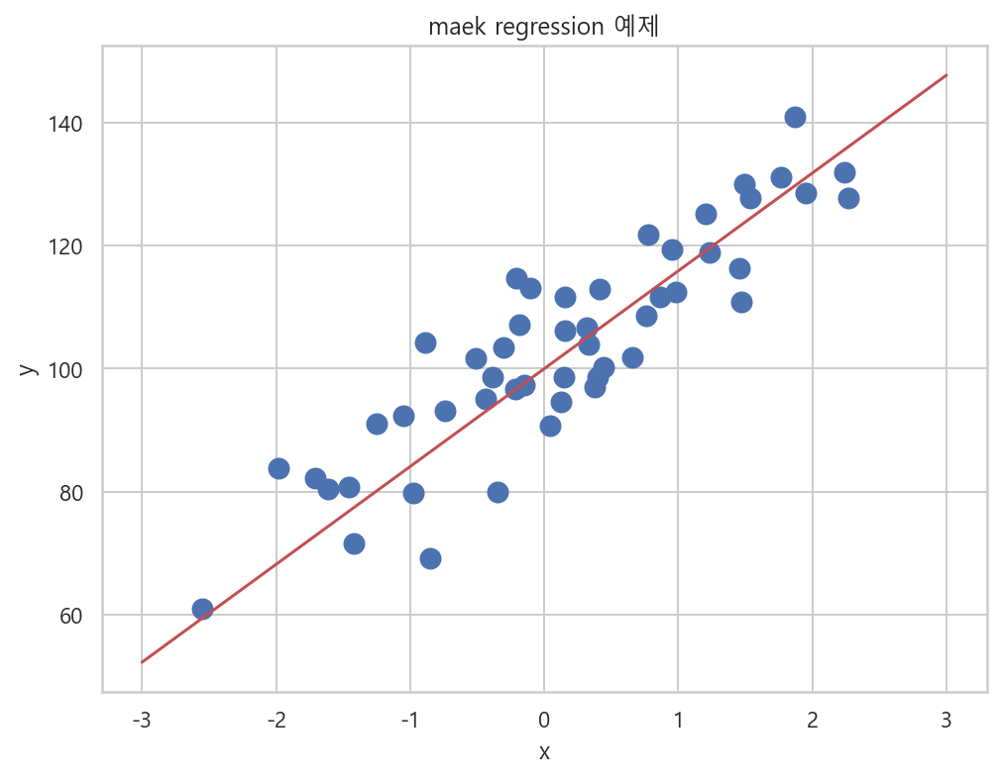

In [155]:
plt.figure(figsize=(8, 6))
plt.plot(xx, y0, "r-")
plt.scatter(X, y, s=100)
plt.xlabel("x")
plt.ylabel("y")
plt.title("maek regression 예제")
plt.show() ; 

In [156]:
X, y, w = make_regression(n_samples=300, n_features=2, noise=10,
                         coef=True, random_state=0)

In [157]:
X

array([[ 0.4393917 , -1.49125759],
       [-0.07392467,  2.69622405],
       [ 0.38728048, -1.69810582],
       [-1.41690611, -0.46684555],
       [ 0.1887786 , -1.93627981],
       [-1.11589699, -0.59865394],
       [ 0.69474914,  0.69153875],
       [-0.28688719, -0.04217145],
       [-1.07993151,  1.12663592],
       [-0.23346666, -0.30911444],
       [ 1.02943883,  0.77140595],
       [-0.73067775, -1.12682581],
       [-0.15501009,  0.94725197],
       [-0.23792173, -0.59731607],
       [ 0.67690804,  0.42625873],
       [-1.57062341,  0.64331447],
       [ 0.27909576,  0.46313033],
       [-0.41004969, -0.94444626],
       [-0.43782004, -1.14746865],
       [-1.38336396, -0.72559738],
       [-0.26759475,  0.94246812],
       [ 0.07826018,  0.8005648 ],
       [-0.30230275, -0.38732682],
       [ 1.05445173, -1.07075262],
       [-0.68481009,  0.40234164],
       [ 1.07774381, -0.13370156],
       [-1.96862469, -1.33221165],
       [-0.23937918, -0.36918184],
       [ 0.40198936,

In [158]:
y

array([ -93.35940359,  151.70961784,  -95.91470063,  -44.6425714 ,
        -80.39635397,  -62.10447973,   62.29656458,  -13.98268925,
         31.47694779,  -40.20300944,   78.93952982,  -81.64592468,
         40.67523285,  -47.83808917,   35.807481  ,   -9.749259  ,
         46.90706995,  -61.66018751,  -64.75175285,  -80.39110116,
         47.46450528,   47.53404855,  -33.28216488,  -24.55445378,
         19.5767773 ,   11.90030664, -129.58911962,  -34.76631385,
         -6.08324764,  -82.04517969,  -34.772162  , -120.57054595,
         40.34490789,   -9.62354519,  -75.92689984,  -21.18091229,
        106.31739794,  -51.34386885,  -77.18787512,   27.43393357,
         62.41432022, -105.9664973 ,  -30.98407208,   25.29875712,
        -95.11638239,  -65.45964154,  -33.65126282, -117.87094657,
         90.99512585,  126.43775937,  -32.916571  ,   33.2441083 ,
         -4.36256266,  112.21188086,   -5.5494217 ,  -62.72466766,
        -83.05393294,   96.48829325,    8.9456053 ,   32.27745

In [159]:
w

array([24.65569398, 56.82175937])

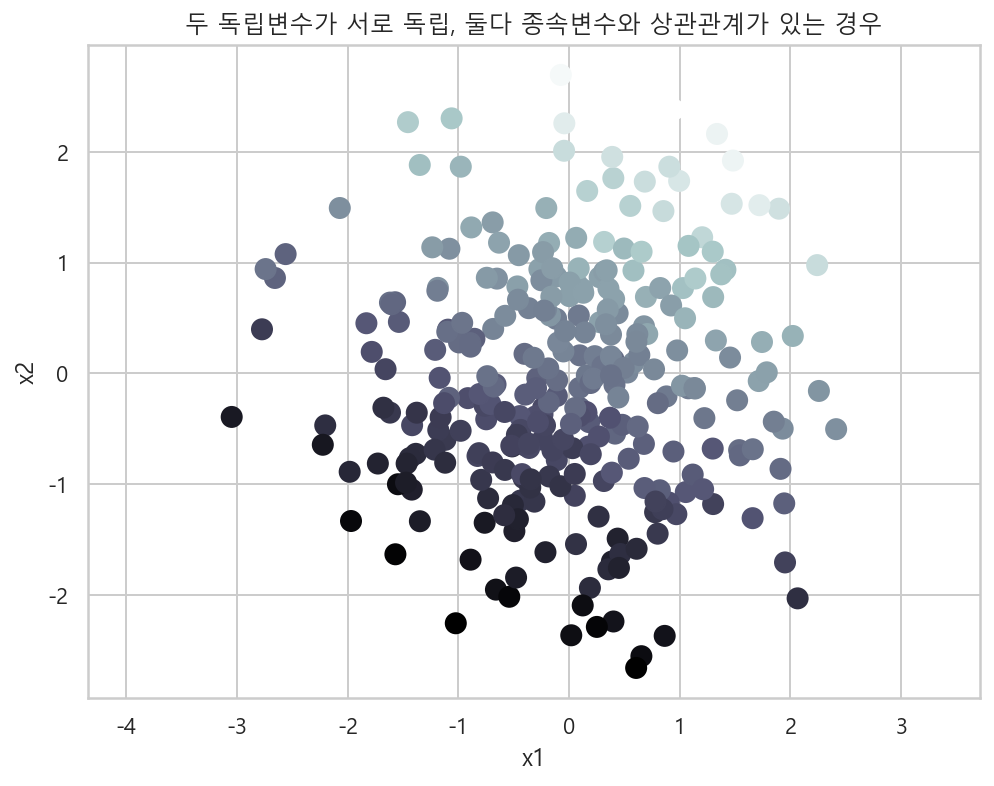

In [160]:
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, s=100, cmap=mpl.cm.bone)
plt.xlabel("x1")
plt.ylabel("x2")
plt.axis("equal")
plt.title("두 독립변수가 서로 독립, 둘다 종속변수와 상관관계가 있는 경우")
plt.show() ; 

In [161]:
X, y, w = make_regression(n_samples=300, n_features=2, n_informative=1,
                         noise=0, coef=True, random_state=0)

In [162]:
X

array([[-0.15135721,  0.95008842],
       [ 0.38728048, -1.69810582],
       [ 1.41232771,  0.93674246],
       [ 0.34965446,  0.5785215 ],
       [-1.53624369,  0.46566244],
       [ 0.49600095,  1.12859406],
       [-0.14963454, -0.69456786],
       [ 0.33996498,  0.93184837],
       [ 1.29784579, -0.67802578],
       [ 0.40149906, -2.23960406],
       [ 0.84436298, -1.22543552],
       [ 0.4105985 , -0.10321885],
       [-0.88897136, -1.68121822],
       [ 1.84926373, -0.43515355],
       [ 0.82350415,  0.77179055],
       [ 0.78495752, -1.13980246],
       [ 0.08842209,  0.52389102],
       [-1.41690611, -0.46684555],
       [ 0.61037938, -1.5829384 ],
       [ 0.00529265,  0.82158571],
       [ 0.12167502,  0.76103773],
       [-0.1103893 , -0.78262916],
       [-0.4380743 , -0.50965218],
       [ 1.29802197,  1.10028434],
       [-0.52118931, -0.6522936 ],
       [ 0.15634897, -0.34791215],
       [ 1.71958931,  1.51999486],
       [ 0.99439439,  1.73887268],
       [-1.15942052,

In [163]:
y

array([  53.98569544,  -96.48936025,   53.22735485,   32.87260933,
         26.4597591 ,   64.12870036,  -39.46656779,   52.94926408,
        -38.5266178 , -127.2582429 ,  -69.63140217,   -5.86507676,
        -95.52977688,  -24.7261904 ,   43.85449698,  -64.76558085,
         29.76840969,  -26.52698528,  -89.94534471,   46.68394563,
         43.24350249,  -44.47036557,  -28.95933363,   62.5200919 ,
        -37.06446997,  -19.76898043,   86.36878222,   98.80580485,
        -22.45760615,  -54.31847679,  -37.50556139,  -38.86670264,
        -54.57754884,   21.74753004,  111.13837852,   -6.71428894,
        -74.23915438,  109.26494911,   29.73350049,  -65.20118765,
        -12.64884644,   29.60782302,  -36.57153001,  -10.83326693,
        -15.22842305, -100.49146628,  -30.84634416,  -53.66509789,
        -57.84693046,  -46.20440237,   52.3248185 ,  114.28314318,
         49.11878568, -128.16512788,  -37.42013821,  -41.42560017,
          8.89297684,   36.55425973, -134.64409693,  -16.58271

In [164]:
w

array([ 0.        , 56.82175937])

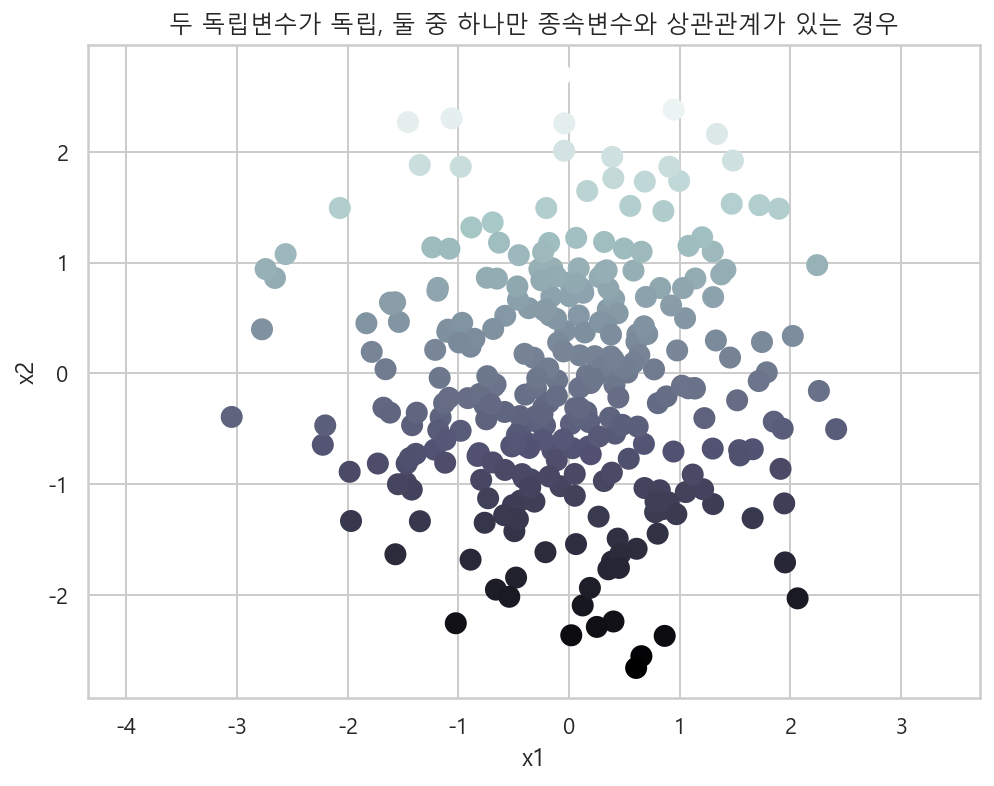

In [165]:
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, s=100, cmap=mpl.cm.bone)
plt.xlabel("x1")
plt.ylabel("x2")
plt.axis("equal")
plt.title("두 독립변수가 독립, 둘 중 하나만 종속변수와 상관관계가 있는 경우")
plt.show() ; 

# 넘파이를 이용한 OLS 선형회귀분석

In [1]:
from sklearn.datasets import make_regression


In [2]:
bias = 100
X0, y, w = make_regression(n_samples=200, n_features=1, bias=bias, noise=10,
                          coef=True, random_state=1)
X = sm.add_constant(X0)
y = y.reshape(len(y), 1)

In [3]:
X

array([[ 1.        ,  0.23249456],
       [ 1.        , -0.03869551],
       [ 1.        ,  0.5505375 ],
       [ 1.        ,  0.50318481],
       [ 1.        ,  2.18697965],
       [ 1.        , -0.0731127 ],
       [ 1.        , -0.26788808],
       [ 1.        , -1.62743834],
       [ 1.        ,  0.53035547],
       [ 1.        ,  0.16938243],
       [ 1.        , -0.64691669],
       [ 1.        ,  0.51292982],
       [ 1.        ,  0.86888616],
       [ 1.        ,  0.87616892],
       [ 1.        , -0.10174587],
       [ 1.        ,  1.96710175],
       [ 1.        ,  1.23616403],
       [ 1.        ,  0.79280687],
       [ 1.        , -0.0126646 ],
       [ 1.        , -1.09491185],
       [ 1.        ,  1.04444209],
       [ 1.        ,  0.28558733],
       [ 1.        ,  0.59357852],
       [ 1.        ,  1.74481176],
       [ 1.        , -1.37311732],
       [ 1.        , -0.87785842],
       [ 1.        ,  0.90085595],
       [ 1.        , -0.11044703],
       [ 1.        ,

In [4]:
y

array([[ 127.87901739],
       [  93.03291422],
       [ 161.8575084 ],
       [ 141.69205026],
       [ 283.26011945],
       [  90.25696513],
       [  56.03995466],
       [ -42.34640353],
       [ 141.31386351],
       [ 124.09193693],
       [  39.41917167],
       [ 135.07481793],
       [ 178.08066288],
       [ 180.36872137],
       [  89.19700235],
       [ 277.68618624],
       [ 202.52143015],
       [ 165.39865332],
       [ 106.38565624],
       [  -1.06621849],
       [ 185.12242638],
       [ 112.67820029],
       [ 151.75241542],
       [ 260.90931323],
       [ -17.9616411 ],
       [  31.01126238],
       [ 179.2938956 ],
       [  83.19417584],
       [ 100.66930574],
       [ 206.12479851],
       [ -12.22124607],
       [ 164.77212573],
       [  54.65764624],
       [ -51.08607086],
       [ 121.03299419],
       [ -65.9912507 ],
       [ 123.47026771],
       [ 205.83869473],
       [ 205.19728016],
       [  95.38016322],
       [ 291.19019753],
       [  45.730

In [5]:
w

array(86.44794301)

In [6]:
w = np.linalg.inv(X.T @ X) @ X.T @ y
w

array([[99.79150869],
       [86.96171201]])

In [13]:
w[1]

array([86.96171201])

In [27]:
x_new = np.linspace(np.min(X0), np.max(X0), 10)
x_new = sm.add_constant(x_new)
y_new = np.dot(x_new, w)

In [28]:
x_new

array([[ 1.        , -2.43483776],
       [ 1.        , -1.88337516],
       [ 1.        , -1.33191255],
       [ 1.        , -0.78044994],
       [ 1.        , -0.22898733],
       [ 1.        ,  0.32247528],
       [ 1.        ,  0.87393788],
       [ 1.        ,  1.42540049],
       [ 1.        ,  1.9768631 ],
       [ 1.        ,  2.52832571]])

In [30]:
y_new

array([[-111.94615175],
       [ -63.99001926],
       [ -16.03388677],
       [  31.92224573],
       [  79.87837822],
       [ 127.83451071],
       [ 175.7906432 ],
       [ 223.7467757 ],
       [ 271.70290819],
       [ 319.65904068]])

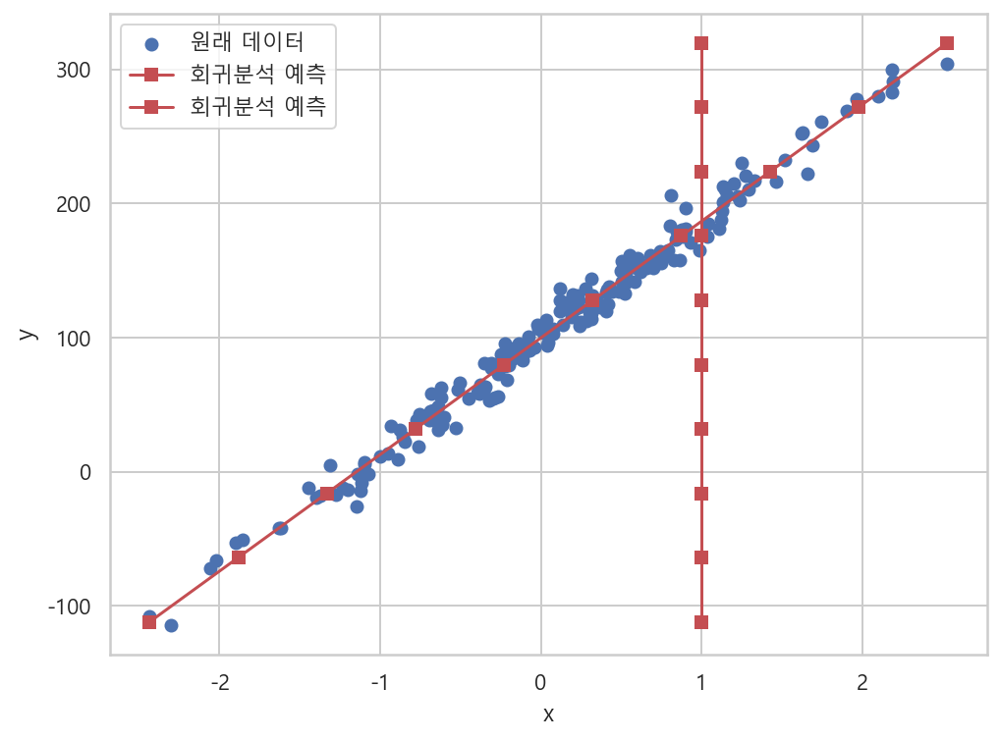

In [31]:
%matplotlib inline

plt.figure(figsize=(8, 6))
plt.scatter(X0, y, label="원래 데이터")
plt.plot(x_new, y_new, "rs-", label="회귀분석 예측")
plt.xlabel("x")
plt.ylabel("y")

plt.legend()
plt.show() ; 

# scikit-learn을 사용한 선형회귀분석

In [32]:
from sklearn.linear_model import LinearRegression

In [33]:
model = LinearRegression().fit(X0, y)
print(model.intercept_, model.coef_)

[99.79150869] [[86.96171201]]


In [34]:
model.predict([[-2], [-1], [0], [1], [2]])

array([[-74.13191534],
       [ 12.82979668],
       [ 99.79150869],
       [186.7532207 ],
       [273.71493272]])

# statsmodels를 사용한 선형회귀분석

In [37]:
df = pd.DataFrame({"x" : X0[:, 0], "y" : y[:, 0]})
df

,x,y
0,0.232495,127.879017
1,-0.038696,93.032914
2,0.550537,161.857508
3,0.503185,141.692050
4,2.186980,283.260119
...,...,...
195,-0.172428,87.874277
196,-1.199268,-13.626664
197,1.462108,216.106619
198,1.131629,212.743149


In [38]:
dfy = df[["y"]]
dfX = sm.add_constant(df[["x"]])

In [39]:
dfy.head()

,y
0,127.879017
1,93.032914
2,161.857508
3,141.692050
4,283.260119


In [40]:
dfX.head()

,const,x
0,1.0,0.232495
1,1.0,-0.038696
2,1.0,0.550537
3,1.0,0.503185
4,1.0,2.186980


In [41]:
model = sm.OLS(dfy, dfX)
result = model.fit()

In [42]:
result.params

const    99.791509
x        86.961712
dtype: float64

In [43]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                 1.278e+04
Date:                Wed, 17 Aug 2022   Prob (F-statistic):          8.17e-182
Time:                        23:20:49   Log-Likelihood:                -741.28
No. Observations:                 200   AIC:                             1487.
Df Residuals:                     198   BIC:                             1493.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         99.7915      0.705    141.592      0.0

In [44]:
model = sm.OLS.from_formula("y ~ x", data=df)
result = model.fit()

In [45]:
result.params

Intercept    99.791509
x            86.961712
dtype: float64

In [46]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                 1.278e+04
Date:                Wed, 17 Aug 2022   Prob (F-statistic):          8.17e-182
Time:                        23:21:41   Log-Likelihood:                -741.28
No. Observations:                 200   AIC:                             1487.
Df Residuals:                     198   BIC:                             1493.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     99.7915      0.705    141.592      0.0

In [49]:
x_new[:, 1]

array([-2.43483776, -1.88337516, -1.33191255, -0.78044994, -0.22898733,
        0.32247528,  0.87393788,  1.42540049,  1.9768631 ,  2.52832571])

In [50]:
result.predict({"x" : x_new[:, 1]})

0   -111.946152
1    -63.990019
2    -16.033887
3     31.922246
4     79.878378
5    127.834511
6    175.790643
7    223.746776
8    271.702908
9    319.659041
dtype: float64

In [51]:
result.params

Intercept    99.791509
x            86.961712
dtype: float64

In [52]:
result.resid

0       7.869384
1      -3.393567
2      14.190317
3      -1.857271
4      -6.714883
         ...    
195     3.077420
196    -9.127772
197   -10.832299
198    14.543212
199     7.161656
Length: 200, dtype: float64

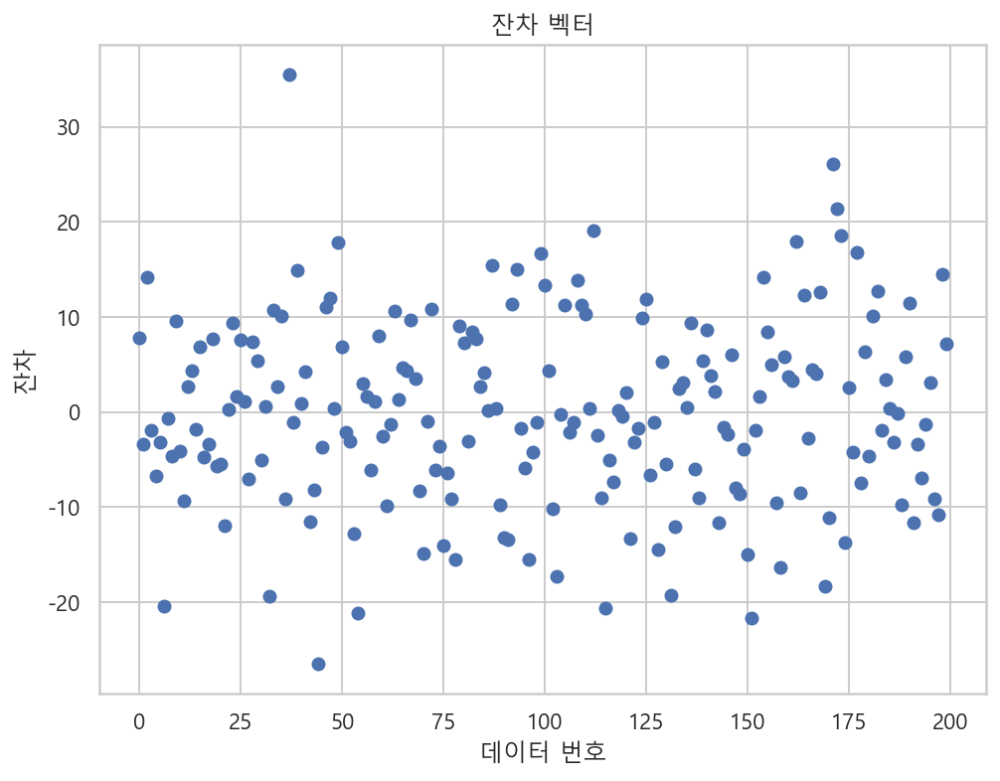

In [53]:
plt.figure(figsize=(8, 6))
result.resid.plot(style="o")
plt.xlabel("데이터 번호")
plt.ylabel("잔차")
plt.title("잔차 벡터")
plt.show() ; 

### 직교방정식 성질

In [54]:
result.resid.sum()

6.064482249712455e-12

In [55]:
result.predict({"x" : X0.mean()})

0    109.069351
dtype: float64

In [56]:
y.mean()

109.06935068170773

### OLS로 보스턴 집값 예측

In [57]:
from sklearn.datasets import load_boston

boston = load_boston()
dfX0 = pd.DataFrame(boston.data, columns=boston.feature_names)
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,const,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,1.0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,1.0,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,1.0,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,1.0,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,1.0,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [58]:
model_boston = sm.OLS(dfy, dfX)
result_boston = model_boston.fit()

In [59]:
print(result_boston.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Wed, 17 Aug 2022   Prob (F-statistic):          6.72e-135
Time:                        23:57:09   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         36.4595      5.103      7.144      0.0

In [60]:
result_boston.params

const      36.459488
CRIM       -0.108011
ZN          0.046420
INDUS       0.020559
CHAS        2.686734
NOX       -17.766611
RM          3.809865
AGE         0.000692
DIS        -1.475567
RAD         0.306049
TAX        -0.012335
PTRATIO    -0.952747
B           0.009312
LSTAT      -0.524758
dtype: float64

In [61]:
result_boston.resid

0      -6.003843
1      -3.425562
2       4.132403
3       4.792964
4       8.256476
         ...    
501    -1.133341
502    -1.775719
503    -3.727426
504    -4.127967
505   -10.444212
Length: 506, dtype: float64

In [62]:
result_boston.resid.sum()

-1.7671197838353692e-11

# 스케일링

In [3]:
from sklearn.datasets import load_boston

boston = load_boston()

dfX0 = pd.DataFrame(boston.data, columns=boston.feature_names)
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,const,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,1.0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,1.0,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,1.0,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,1.0,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,1.0,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [4]:
model = sm.OLS(dfy, dfX)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Thu, 18 Aug 2022   Prob (F-statistic):          6.72e-135
Time:                        15:50:34   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         36.4595      5.103      7.144      0.0

In [8]:
df1 = pd.concat([dfX0, dfy], axis=1)
df1.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [9]:
model1 = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names), data=df1)
result1 = model1.fit()
print(result1.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Thu, 18 Aug 2022   Prob (F-statistic):          6.72e-135
Time:                        15:52:55   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     36.4595      5.103      7.144      0.0

In [7]:
"MEDV ~ " + "+".join(boston.feature_names)

'MEDV ~ CRIM+ZN+INDUS+CHAS+NOX+RM+AGE+DIS+RAD+TAX+PTRATIO+B+LSTAT'

In [10]:
A = np.eye(5)
A

array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.]])

In [12]:
b = np.ones(5)
b

array([1., 1., 1., 1., 1.])

In [13]:
x = sp.linalg.solve(A, b)
x

array([1., 1., 1., 1., 1.])

In [15]:
A + 0.0001 * np.eye(5)

array([[1.0001, 0.    , 0.    , 0.    , 0.    ],
       [0.    , 1.0001, 0.    , 0.    , 0.    ],
       [0.    , 0.    , 1.0001, 0.    , 0.    ],
       [0.    , 0.    , 0.    , 1.0001, 0.    ],
       [0.    , 0.    , 0.    , 0.    , 1.0001]])

In [16]:
x_error = sp.linalg.solve(A + 0.0001 * np.eye(5), b)
x_error

array([0.99990001, 0.99990001, 0.99990001, 0.99990001, 0.99990001])

In [17]:
np.linalg.cond(A)

1.0

In [18]:
AA = sp.linalg.hilbert(5)
AA

array([[1.        , 0.5       , 0.33333333, 0.25      , 0.2       ],
       [0.5       , 0.33333333, 0.25      , 0.2       , 0.16666667],
       [0.33333333, 0.25      , 0.2       , 0.16666667, 0.14285714],
       [0.25      , 0.2       , 0.16666667, 0.14285714, 0.125     ],
       [0.2       , 0.16666667, 0.14285714, 0.125     , 0.11111111]])

In [20]:
np.linalg.cond(AA)

476607.2502422687

In [22]:
x_hilb = sp.linalg.solve(AA, b)
x_hilb

array([    5.,  -120.,   630., -1120.,   630.])

In [23]:
x_hilb_error = sp.linalg.solve(AA + 0.0001 * np.eye(5), b)
x_hilb_error

array([ -1.95838277,  26.7130213 , -47.39583254, -50.46865353,
        90.08921096])

In [25]:
np.linalg.cond(dfX.T @ dfX)

228418414.24083942

In [26]:
dfX.describe().loc["std"]

const        0.000000
CRIM         8.601545
ZN          23.322453
INDUS        6.860353
CHAS         0.253994
NOX          0.115878
RM           0.702617
AGE         28.148861
DIS          2.105710
RAD          8.707259
TAX        168.537116
PTRATIO      2.164946
B           91.294864
LSTAT        7.141062
Name: std, dtype: float64

In [29]:
dfX0.describe().loc["std"]

CRIM         8.601545
ZN          23.322453
INDUS        6.860353
CHAS         0.253994
NOX          0.115878
RM           0.702617
AGE         28.148861
DIS          2.105710
RAD          8.707259
TAX        168.537116
PTRATIO      2.164946
B           91.294864
LSTAT        7.141062
Name: std, dtype: float64

In [44]:
dfX2 = dfX0.copy()
dfX2["TAX"] *= 1e13
df2 = pd.concat([dfX2, dfy], axis=1)
df2.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,2.960000e+15,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,2.420000e+15,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,2.420000e+15,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,2.220000e+15,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,2.220000e+15,18.7,396.90,5.33,36.2


In [30]:
1e13

10000000000000.0

In [31]:
1e4

10000.0

In [32]:
1e2

100.0

In [35]:
1.1e4

11000.0

In [43]:
1.231e+5

123100.0

In [45]:
1.231e5

123100.0

In [46]:
model2 = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names), data=df2)
result2 = model2.fit()
print(result2.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.333
Model:                            OLS   Adj. R-squared:                  0.329
Method:                 Least Squares   F-statistic:                     83.42
Date:                Thu, 18 Aug 2022   Prob (F-statistic):           8.42e-44
Time:                        16:14:49   Log-Likelihood:                -1737.9
No. Observations:                 506   AIC:                             3484.
Df Residuals:                     502   BIC:                             3501.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0038      0.000     -8.554      0.0

In [47]:
1.19e+17

1.19e+17

In [50]:
119000000000000000.0

1.19e+17

In [52]:
feature_names = list(boston.feature_names)
feature_names

['CRIM',
 'ZN',
 'INDUS',
 'CHAS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT']

In [53]:
feature_names.remove("CHAS")
feature_names

['CRIM',
 'ZN',
 'INDUS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT']

In [56]:
test = ["a", "b", "c"]
test

['a', 'b', 'c']

In [57]:
test.remove("b")

In [61]:
test

['a', 'c']

In [62]:
feature_names = ["scale({})".format(name) for name in feature_names] + ["CHAS"]
feature_names

['scale(CRIM)',
 'scale(ZN)',
 'scale(INDUS)',
 'scale(NOX)',
 'scale(RM)',
 'scale(AGE)',
 'scale(DIS)',
 'scale(RAD)',
 'scale(TAX)',
 'scale(PTRATIO)',
 'scale(B)',
 'scale(LSTAT)',
 'CHAS']

In [70]:
model3 = sm.OLS.from_formula("MEDV ~ " + "+".join(feature_names), data=df2)
result3 = model3.fit()
print(result3.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Thu, 18 Aug 2022   Prob (F-statistic):          6.72e-135
Time:                        16:28:11   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         22.3470      0.219    101.

# 범주형 독립변수

In [71]:
import datetime
from calendar import isleap

In [72]:
def convert_partial_year(number) : 
    year = int(number)
    d = datetime.timedelta(days=(number - year) * (365 + isleap(year)))
    day_one = datetime.datetime(year, 1, 1)
    date = d + day_one
    return date

In [73]:
df_nottem = sm.datasets.get_rdataset("nottem").data
df_nottem

,time,value
0,1920.000000,40.6
1,1920.083333,40.8
2,1920.166667,44.4
3,1920.250000,46.7
4,1920.333333,54.1
...,...,...
235,1939.583333,61.8
236,1939.666667,58.2
237,1939.750000,46.7
238,1939.833333,46.6


In [98]:
convert_partial_year(df_nottem.time[1])

datetime.datetime(1920, 1, 31, 11, 59, 59, 999897)

In [80]:
df_nottem.time[1]

1920.08333333333

In [81]:
test_d = df_nottem.time[1]
test_d

1920.08333333333

In [82]:
year = int(test_d)
year

1920

In [83]:
datetime.timedelta(days=(test_d - year))

datetime.timedelta(seconds=7200)

In [84]:
test_d - year

0.08333333333007431

In [85]:
isleap(year)

True

In [89]:
365 + isleap(year)

366

In [88]:
0 + True

1

In [90]:
datetime.timedelta(days=(test_d - year) * (365 + isleap(year)))

datetime.timedelta(days=30, seconds=43199, microseconds=999897)

In [95]:
dd = datetime.timedelta(days=(test_d  -year) * (365 + isleap(year)))
dd

datetime.timedelta(days=30, seconds=43199, microseconds=999897)

In [94]:
isleap(2002)

False

In [93]:
2 + isleap(2002)

2

In [96]:
test_day_one = datetime.datetime(year, 1, 1)
test_day_one

datetime.datetime(1920, 1, 1, 0, 0)

In [97]:
test_date = test_day_one + dd
test_date

datetime.datetime(1920, 1, 31, 11, 59, 59, 999897)

In [1]:
import datetime
from calendar import isleap

In [2]:
def convert_partial_year(number) : 
    year = int(number)
    d = datetime.timedelta(days=(number - year) * (365 + isleap(year)))
    day_one = datetime.datetime(year, 1, 1)
    date = d + day_one
    return date

In [8]:
df_nottem = sm.datasets.get_rdataset("nottem").data
df_nottem

,time,value
0,1920.000000,40.6
1,1920.083333,40.8
2,1920.166667,44.4
3,1920.250000,46.7
4,1920.333333,54.1
...,...,...
235,1939.583333,61.8
236,1939.666667,58.2
237,1939.750000,46.7
238,1939.833333,46.6


In [9]:
df_nottem["date0"] = df_nottem[["time"]].applymap(convert_partial_year)
df_nottem

,time,value,date0
0,1920.000000,40.6,1920-01-01 00:00:00.000000
1,1920.083333,40.8,1920-01-31 11:59:59.999897
2,1920.166667,44.4,1920-03-02 00:00:00.000103
3,1920.250000,46.7,1920-04-01 12:00:00.000000
4,1920.333333,54.1,1920-05-01 23:59:59.999897
...,...,...,...
235,1939.583333,61.8,1939-08-01 21:59:59.999897
236,1939.666667,58.2,1939-09-01 08:00:00.000103
237,1939.750000,46.7,1939-10-01 18:00:00.000000
238,1939.833333,46.6,1939-11-01 03:59:59.999897


In [10]:
df_nottem["time"]

0      1920.000000
1      1920.083333
2      1920.166667
3      1920.250000
4      1920.333333
          ...     
235    1939.583333
236    1939.666667
237    1939.750000
238    1939.833333
239    1939.916667
Name: time, Length: 240, dtype: float64

In [14]:
df_test_apply = pd.DataFrame(df_nottem["time"].apply(convert_partial_year))
df_test_apply

,time
0,1920-01-01 00:00:00.000000
1,1920-01-31 11:59:59.999897
2,1920-03-02 00:00:00.000103
3,1920-04-01 12:00:00.000000
4,1920-05-01 23:59:59.999897
...,...
235,1939-08-01 21:59:59.999897
236,1939-09-01 08:00:00.000103
237,1939-10-01 18:00:00.000000
238,1939-11-01 03:59:59.999897


In [17]:
df_nottem["time"]

0      1920.000000
1      1920.083333
2      1920.166667
3      1920.250000
4      1920.333333
          ...     
235    1939.583333
236    1939.666667
237    1939.750000
238    1939.833333
239    1939.916667
Name: time, Length: 240, dtype: float64

In [21]:
df_nottem

,time,value,date0
0,1920.000000,40.6,1920-01-01 00:00:00.000000
1,1920.083333,40.8,1920-01-31 11:59:59.999897
2,1920.166667,44.4,1920-03-02 00:00:00.000103
3,1920.250000,46.7,1920-04-01 12:00:00.000000
4,1920.333333,54.1,1920-05-01 23:59:59.999897
...,...,...,...
235,1939.583333,61.8,1939-08-01 21:59:59.999897
236,1939.666667,58.2,1939-09-01 08:00:00.000103
237,1939.750000,46.7,1939-10-01 18:00:00.000000
238,1939.833333,46.6,1939-11-01 03:59:59.999897


In [23]:
df_nottem["date"] = pd.DatetimeIndex(df_nottem["date0"]).round("60min") +\
datetime.timedelta(seconds=3600*24)

In [24]:
df_nottem

,time,value,date0,date
0,1920.000000,40.6,1920-01-01 00:00:00.000000,1920-01-02 00:00:00
1,1920.083333,40.8,1920-01-31 11:59:59.999897,1920-02-01 12:00:00
2,1920.166667,44.4,1920-03-02 00:00:00.000103,1920-03-03 00:00:00
3,1920.250000,46.7,1920-04-01 12:00:00.000000,1920-04-02 12:00:00
4,1920.333333,54.1,1920-05-01 23:59:59.999897,1920-05-03 00:00:00
...,...,...,...,...
235,1939.583333,61.8,1939-08-01 21:59:59.999897,1939-08-02 22:00:00
236,1939.666667,58.2,1939-09-01 08:00:00.000103,1939-09-02 08:00:00
237,1939.750000,46.7,1939-10-01 18:00:00.000000,1939-10-02 18:00:00
238,1939.833333,46.6,1939-11-01 03:59:59.999897,1939-11-02 04:00:00


In [26]:
df_nottem["month"] = df_nottem["date"].dt.strftime("%m").astype("category")
df_nottem

,time,value,date0,date,month
0,1920.000000,40.6,1920-01-01 00:00:00.000000,1920-01-02 00:00:00,01
1,1920.083333,40.8,1920-01-31 11:59:59.999897,1920-02-01 12:00:00,02
2,1920.166667,44.4,1920-03-02 00:00:00.000103,1920-03-03 00:00:00,03
3,1920.250000,46.7,1920-04-01 12:00:00.000000,1920-04-02 12:00:00,04
4,1920.333333,54.1,1920-05-01 23:59:59.999897,1920-05-03 00:00:00,05
...,...,...,...,...,...
235,1939.583333,61.8,1939-08-01 21:59:59.999897,1939-08-02 22:00:00,08
236,1939.666667,58.2,1939-09-01 08:00:00.000103,1939-09-02 08:00:00,09
237,1939.750000,46.7,1939-10-01 18:00:00.000000,1939-10-02 18:00:00,10
238,1939.833333,46.6,1939-11-01 03:59:59.999897,1939-11-02 04:00:00,11


In [27]:
del df_nottem["date0"]

df_nottem

,time,value,date,month
0,1920.000000,40.6,1920-01-02 00:00:00,01
1,1920.083333,40.8,1920-02-01 12:00:00,02
2,1920.166667,44.4,1920-03-03 00:00:00,03
3,1920.250000,46.7,1920-04-02 12:00:00,04
4,1920.333333,54.1,1920-05-03 00:00:00,05
...,...,...,...,...
235,1939.583333,61.8,1939-08-02 22:00:00,08
236,1939.666667,58.2,1939-09-02 08:00:00,09
237,1939.750000,46.7,1939-10-02 18:00:00,10
238,1939.833333,46.6,1939-11-02 04:00:00,11


In [31]:
df_nottem.drop(["date"], axis=1, inplace=True)

df_nottem

,time,value,month
0,1920.000000,40.6,01
1,1920.083333,40.8,02
2,1920.166667,44.4,03
3,1920.250000,46.7,04
4,1920.333333,54.1,05
...,...,...,...
235,1939.583333,61.8,08
236,1939.666667,58.2,09
237,1939.750000,46.7,10
238,1939.833333,46.6,11


In [32]:
df_nottem.tail()

,time,value,month
235,1939.583333,61.8,08
236,1939.666667,58.2,09
237,1939.750000,46.7,10
238,1939.833333,46.6,11
239,1939.916667,37.8,12


### 박스플롯

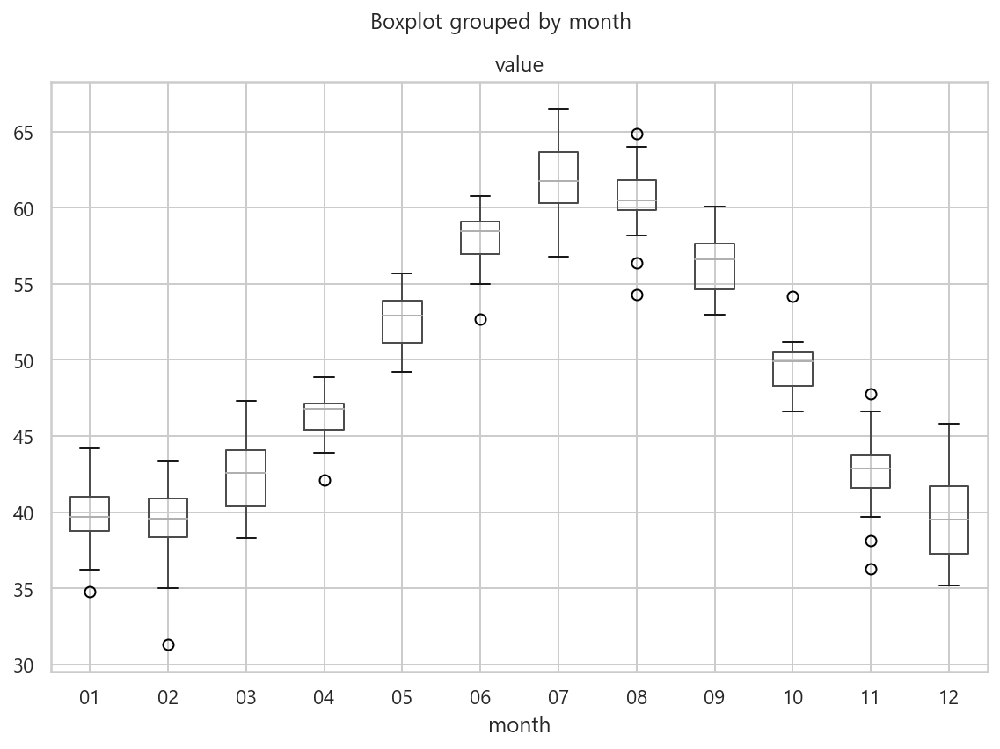

In [42]:
%matplotlib inline

df_nottem.boxplot("value", "month", figsize=(8, 6))
plt.tight_layout()
plt.show() ; 

In [44]:
model = sm.OLS.from_formula("value ~ C(month) + 0", data=df_nottem)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  value   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.927
Method:                 Least Squares   F-statistic:                     277.3
Date:                Mon, 22 Aug 2022   Prob (F-statistic):          2.96e-125
Time:                        16:10:20   Log-Likelihood:                -535.82
No. Observations:                 240   AIC:                             1096.
Df Residuals:                     228   BIC:                             1137.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
C(month)[01]    39.6950      0.518     76.691   

In [45]:
model = sm.OLS.from_formula("value ~ C(month)", data=df_nottem)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  value   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.927
Method:                 Least Squares   F-statistic:                     277.3
Date:                Mon, 22 Aug 2022   Prob (F-statistic):          2.96e-125
Time:                        16:12:07   Log-Likelihood:                -535.82
No. Observations:                 240   AIC:                             1096.
Df Residuals:                     228   BIC:                             1137.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         39.6950      0.518     76.

In [ ]:
dmatrix("C(x1, Treatment('Male'))", df1)

In [46]:
modell = sm.OLS.from_formula("value ~ C(month, Treatment('02'))", data=df_nottem)
resultt = modell.fit()
print(resultt.summary())

                            OLS Regression Results                            
Dep. Variable:                  value   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.927
Method:                 Least Squares   F-statistic:                     277.3
Date:                Mon, 22 Aug 2022   Prob (F-statistic):          2.96e-125
Time:                        16:16:35   Log-Likelihood:                -535.82
No. Observations:                 240   AIC:                             1096.
Df Residuals:                     228   BIC:                             1137.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

## 보스턴 집값에서 범주형 변수

In [47]:
from sklearn.datasets import load_boston

boston = load_boston()
dfX = pd.DataFrame(boston.data, columns=boston.feature_names)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [49]:
df.CHAS.unique()

array([0., 1.])

In [50]:
model1 = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names), data=df)
result1 = model1.fit()
print(result1.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Mon, 22 Aug 2022   Prob (F-statistic):          6.72e-135
Time:                        16:44:13   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     36.4595      5.103      7.144      0.0

In [53]:
feature_names = list(boston.feature_names)
feature_names

['CRIM',
 'ZN',
 'INDUS',
 'CHAS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT']

In [54]:
feature_names.remove("CHAS")
feature_names = [name for name in feature_names] + ["C(CHAS)"]
feature_names

['CRIM',
 'ZN',
 'INDUS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT',
 'C(CHAS)']

In [55]:
model2 = sm.OLS.from_formula("MEDV ~ 0 + " + "+".join(feature_names), df)
result2 = model2.fit()
print(result2.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Mon, 22 Aug 2022   Prob (F-statistic):          6.72e-135
Time:                        16:47:26   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
C(CHAS)[0.0]    36.4595      5.103      7.144   

## 부분회귀

In [1]:
from sklearn.datasets import load_boston

In [2]:
boston = load_boston()

dfX0 = pd.DataFrame(boston.data, columns=boston.feature_names)
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,const,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,1.0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,1.0,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,1.0,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,1.0,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,1.0,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [3]:
dff = df.copy()
dff.head()

,const,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,1.0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,1.0,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,1.0,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,1.0,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,1.0,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


### 컬럼삭제
- 독립변수 삭제

In [4]:
del dff["CRIM"], dff["ZN"]

In [5]:
dff.head()

,const,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,1.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,1.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,1.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,1.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,1.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


### 리스트에서 데이터 삭제

In [12]:
test_lst = [col for col in boston.feature_names]
test_lst

['CRIM',
 'ZN',
 'INDUS',
 'CHAS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT']

In [13]:
test_lst.remove("CRIM")

In [14]:
test_lst.remove("B")

In [15]:
test_lst

['ZN',
 'INDUS',
 'CHAS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'LSTAT']

In [16]:
test_lst.remove(["ZN", "NOX"])

ValueError: list.remove(x): x not in list

In [17]:
list(set(test_lst).difference(["ZN", "NOX"]))

['TAX', 'RM', 'DIS', 'RAD', 'PTRATIO', 'INDUS', 'LSTAT', 'AGE', 'CHAS']

In [18]:
model_boston = sm.OLS(dfy, dfX)
result_boston = model_boston.fit()

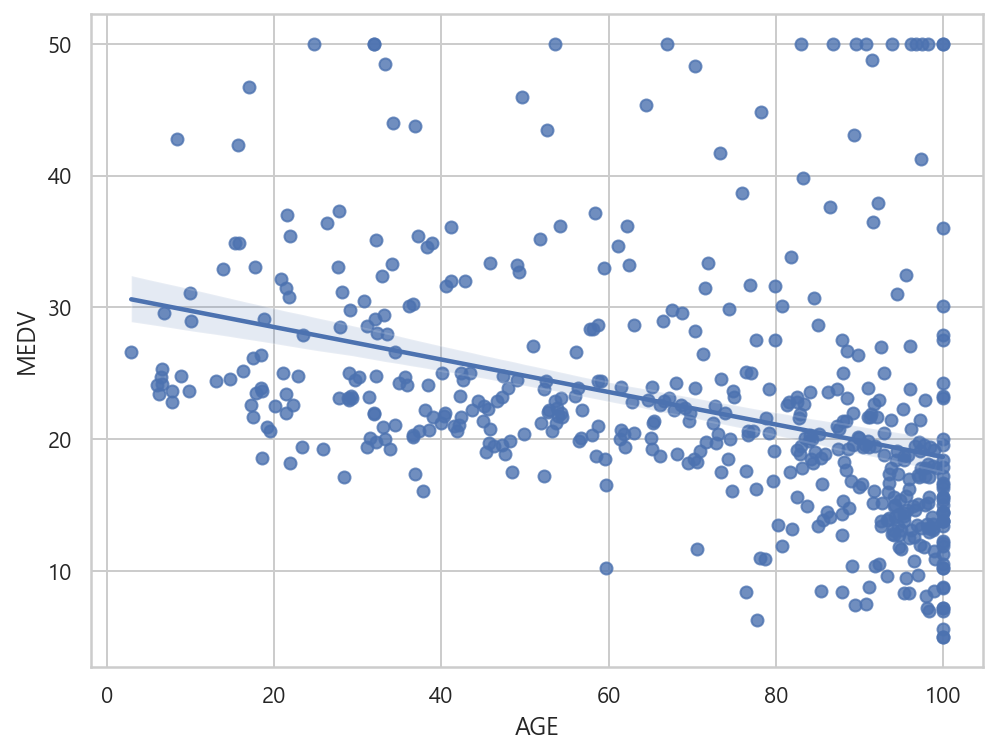

In [19]:
%matplotlib inline

plt.figure(figsize=(8, 6))
sns.regplot(x="AGE", y="MEDV", data=df)
plt.show() ;

### 부분회귀 플롯

In [20]:
set(["MEDV", "AGE"])

{'AGE', 'MEDV'}

In [21]:
set(boston.feature_names).difference(set(["MEDV", "AGE"]))

{'B',
 'CHAS',
 'CRIM',
 'DIS',
 'INDUS',
 'LSTAT',
 'NOX',
 'PTRATIO',
 'RAD',
 'RM',
 'TAX',
 'ZN'}

In [22]:
others = list(set(df.columns).difference(set(["MEDV", "AGE"])))
others

['CRIM',
 'TAX',
 'RM',
 'DIS',
 'RAD',
 'PTRATIO',
 'INDUS',
 'const',
 'B',
 'ZN',
 'LSTAT',
 'NOX',
 'CHAS']

eval_env: 1


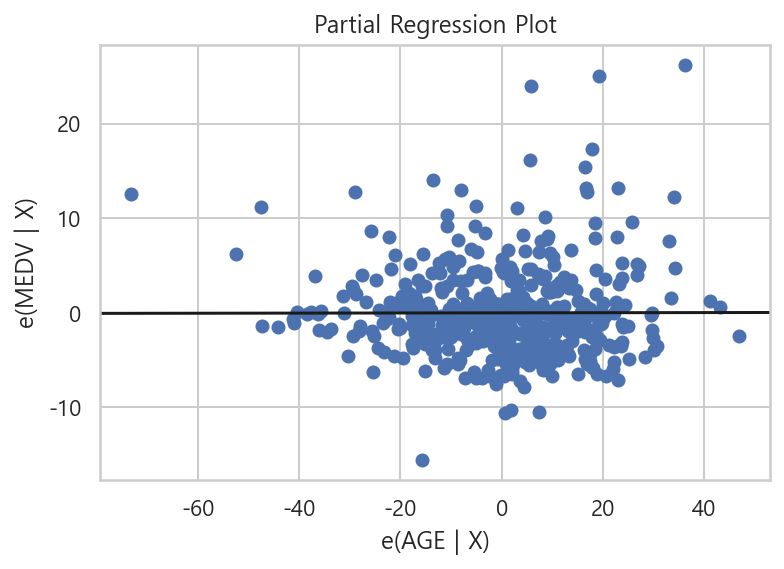

In [23]:
p, resids = sm.graphics.plot_partregress(
"MEDV", "AGE", others, data=df, obs_labels=False, ret_coords=True)
plt.show() ; 

#### 잔차의 합은 0

In [28]:
int(np.array(resids).sum())

0

### 전체 독립변수에 대한 부분회귀 플롯

eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


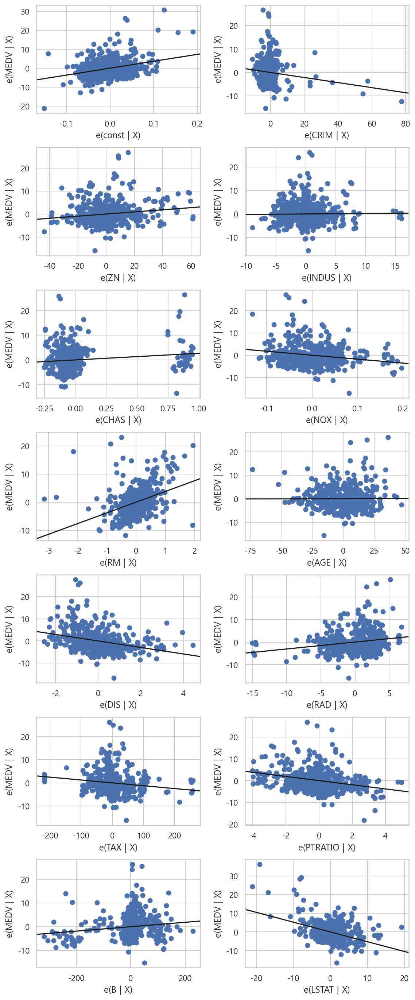

In [31]:
%matplotlib inline

fig = plt.figure(figsize=(8, 20))
sm.graphics.plot_partregress_grid(result_boston, fig=fig)
fig.suptitle("")
plt.show() ; 

### CCPR
- component-component plus residual

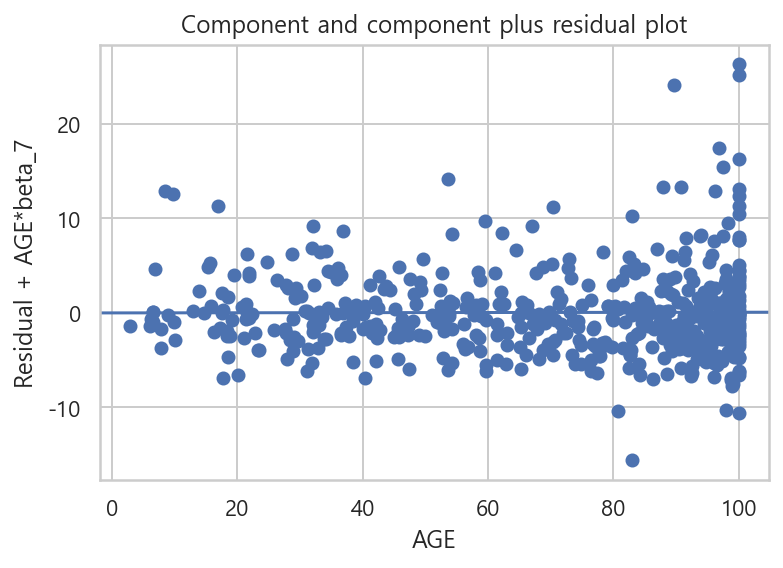

In [39]:
sm.graphics.plot_ccpr(result_boston, "AGE")
plt.show() ; 

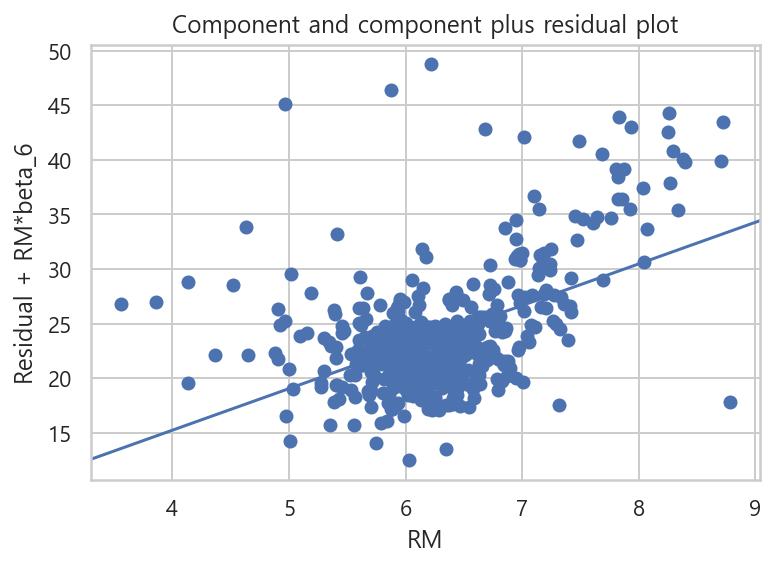

In [40]:
sm.graphics.plot_ccpr(result_boston, "RM")
plt.show() ; 

### 모든 독립변수에 대한 ccpr

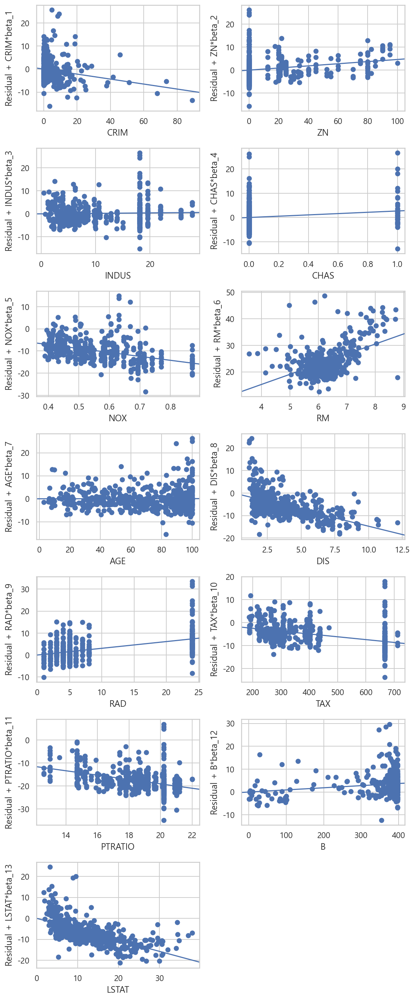

In [43]:
fig = plt.figure(figsize=(8, 20))
sm.graphics.plot_ccpr_grid(result_boston, fig=fig)
fig.suptitle("")
plt.show() ; 

### 부분회귀와 ccpr을 한번에 시각화

eval_env: 1


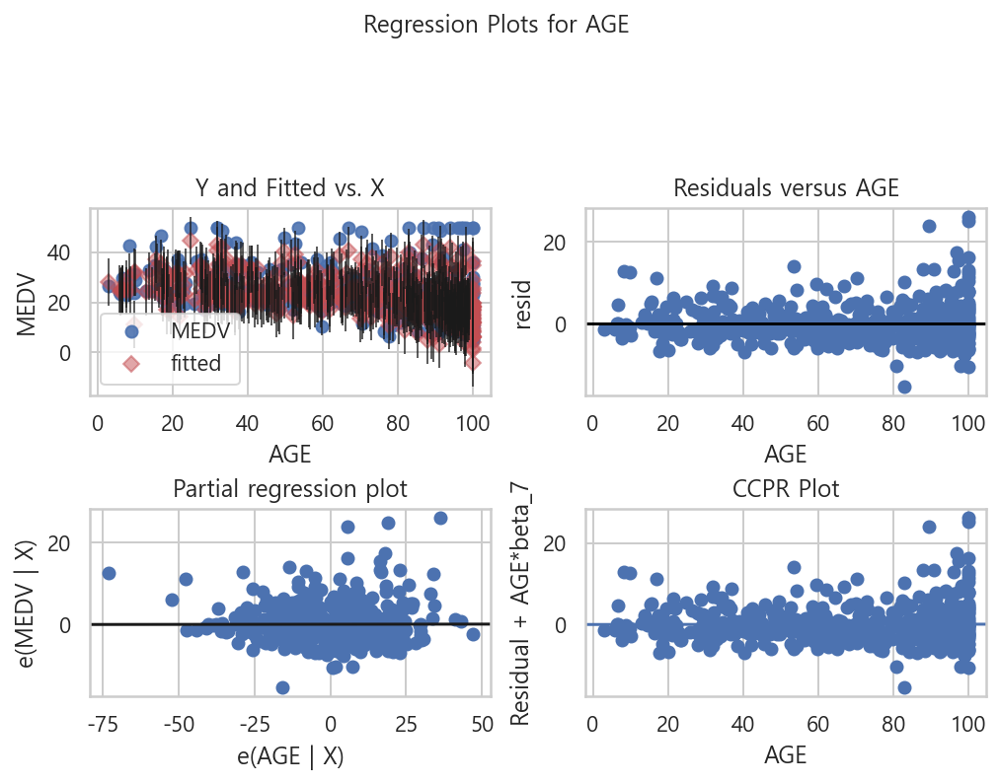

In [51]:
fig = plt.figure(figsize=(8, 6))
sm.graphics.plot_regress_exog(result_boston, "AGE", fig=fig)
plt.tight_layout(pad=4, h_pad=0.5, w_pad=0.5)
plt.show() ; 

## 확률론적 선형 회귀모형

In [52]:
from sklearn.datasets import make_regression

In [53]:
X0, y, coef = make_regression(n_samples=100, n_features=1, bias=0, noise=20,
                             coef=True, random_state=0)

In [54]:
coef

array(42.38550486)

In [55]:
dfX0 = pd.DataFrame(X0, columns=["x1"])
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(y, columns=["y"])

In [56]:
model = sm.OLS(dfy, dfX)
result = model.fit()

In [57]:
result.params

const    -1.628364
x1       42.853356
dtype: float64

In [61]:
print("{} - {} = {}".format("w의 추정값", "w의 실제값", result.params[1]-coef))

w의 추정값 - w의 실제값 = 0.46785087109795853


In [63]:
%%time

N = 1000
params_w0 = np.zeros(N)
params_w1 = np.zeros(N)

for i in range(N) : 
    idx = np.random.choice(len(dfy), len(dfy), replace=True)
    dfX2 = dfX.iloc[idx, :]
    dfy2 = dfy.iloc[idx, :]
    r = sm.OLS(dfy2, dfX2).fit()
    
    params_w0[i] = r.params.const
    params_w1[i] = r.params.x1

Wall time: 900 ms


In [64]:
params_w0[:20]

array([-0.33934207, -2.21924175,  0.66401979, -2.16373201,  3.34043179,
       -1.6626404 ,  2.64777843, -2.72177691, -2.97394966, -5.730235  ,
       -2.527484  , -2.0775413 , -1.23133004,  1.86521045, -1.99400306,
       -0.62312162, -6.16483265,  1.16157625, -2.91653037, -5.92740697])

In [65]:
params_w1[:20]

array([41.25042541, 43.80008077, 40.31546208, 42.56793268, 46.88501304,
       40.82574254, 41.24898278, 42.26328458, 42.33726441, 40.97670786,
       42.23441766, 45.94326514, 44.73262543, 43.03502034, 42.61383216,
       42.31971094, 43.66769708, 38.72940907, 47.08320948, 43.56119885])

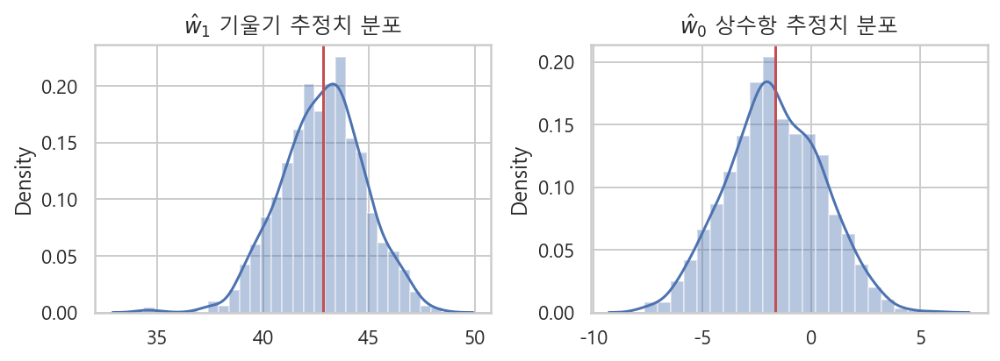

In [67]:
plt.figure(figsize=(8, 3))

ax1 = plt.subplot(121)
sns.distplot(params_w1, ax=ax1)
plt.axvline(params_w1.mean(), c="r")
plt.title("$\hat{w}_1$ 기울기 추정치 분포")

ax2 = plt.subplot(122)
sns.distplot(params_w0, ax=ax2)
plt.axvline(params_w0.mean(), c="r")
plt.title("$\hat{w}_0$ 상수항 추정치 분포")

plt.tight_layout()
plt.show() ;

In [72]:
print("기울기 추정치")
print("평균 : {}, 표준편차 : {}".format(params_w1.mean(), params_w1.std()))
print("\n")
print("상수항 추정치")
print("평균 : {}, 표준편차 : {}".format(params_w0.mean(), params_w0.std()))     

기울기 추정치
평균 : 42.82058628846977, 표준편차 : 1.9822266367392465


상수항 추정치
평균 : -1.6775945601116873, 표준편차 : 2.1622599058738734


In [74]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     400.3
Date:                Wed, 24 Aug 2022   Prob (F-statistic):           2.21e-36
Time:                        16:50:26   Log-Likelihood:                -448.09
No. Observations:                 100   AIC:                             900.2
Df Residuals:                      98   BIC:                             905.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6284      2.163     -0.753      0.4

In [75]:
result.params

const    -1.628364
x1       42.853356
dtype: float64

### 다시

In [12]:
from sklearn.datasets import make_regression

dfX0, y, coef = make_regression(n_samples=100, n_features=1, bias=0, noise=20,
                               coef=True, random_state=0)

dfX0 = pd.DataFrame(dfX0, columns=["x1"])
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(y, columns=["y"])

In [13]:
model = sm.OLS(dfy, dfX)
result = model.fit()

In [14]:
result.params

const    -1.628364
x1       42.853356
dtype: float64

In [15]:
N = 1000
params_w1 = np.zeros(N)
params_w0 = np.zeros(N)

for i in range(N) : 
    idx = np.random.choice(len(dfy), len(dfy), replace=True)
    dfX2 = dfX.iloc[idx, :]
    dfy2 = dfy.iloc[idx, :]
    lr = sm.OLS(dfy2, dfX2).fit()
    params_w0[i] = lr.params.const
    params_w1[i] = lr.params.x1

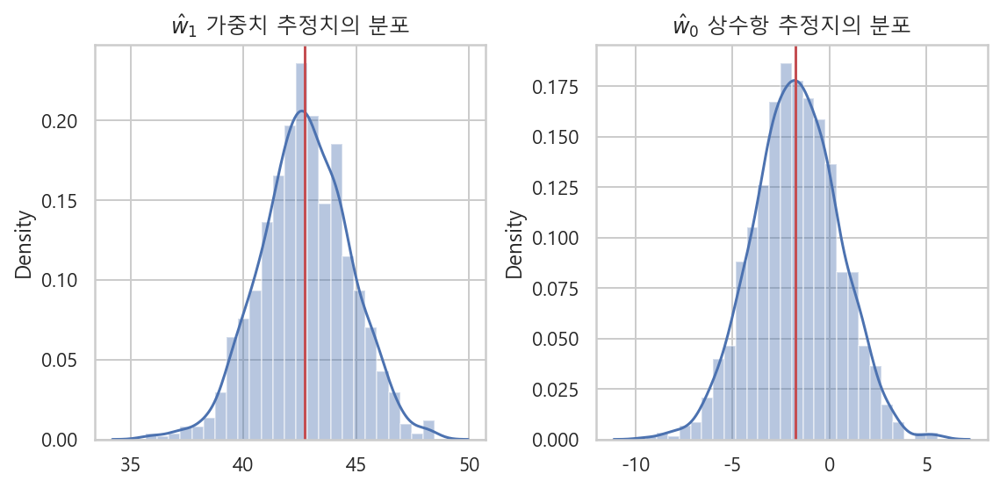

In [16]:
%matplotlib inline

plt.figure(figsize=(8, 4))
ax1 = plt.subplot(121)
sns.distplot(params_w1, ax=ax1)
plt.axvline(params_w1.mean(), c="r")
plt.title("$\hat{w}_1$ 가중치 추정치의 분포")

ax2 = plt.subplot(122)
sns.distplot(params_w0, ax=ax2)
plt.axvline(params_w0.mean(), c="r")
plt.title("$\hat{w}_0$ 상수항 추정지의 분포")

plt.tight_layout()
plt.show() ; 

In [19]:
params_w0.mean(), params_w0.std()

(-1.7287923459370511, 2.190073561025165)

In [20]:
params_w1.mean(), params_w1.std()

(42.72607382611953, 1.966355318504848)

## 확률론적 선형모형 다시

In [1]:
from sklearn.datasets import make_regression

In [2]:
X0, y, coef = make_regression(n_samples=100, n_features=1, noise=20,
                             coef=True, random_state=0)

In [3]:
X0

array([[-0.35955316],
       [ 0.97663904],
       [ 0.40234164],
       [-0.81314628],
       [-0.88778575],
       [ 0.44386323],
       [-0.97727788],
       [ 0.42833187],
       [ 0.20827498],
       [-0.31155253],
       [-0.51080514],
       [ 0.12691209],
       [-1.53624369],
       [-0.40178094],
       [ 0.6536186 ],
       [ 1.17877957],
       [-0.17992484],
       [ 1.78587049],
       [ 1.45427351],
       [-0.68481009],
       [ 0.97873798],
       [ 1.89588918],
       [-0.4380743 ],
       [ 0.3130677 ],
       [ 0.76103773],
       [ 0.77749036],
       [ 1.9507754 ],
       [ 0.33367433],
       [-0.34791215],
       [ 1.53277921],
       [-0.89546656],
       [-0.57884966],
       [-1.04855297],
       [ 0.37816252],
       [ 0.01050002],
       [ 0.46278226],
       [ 0.14404357],
       [-0.40317695],
       [ 0.0519454 ],
       [-1.25279536],
       [ 1.05445173],
       [ 0.40015721],
       [-1.70627019],
       [ 2.2408932 ],
       [ 0.17742614],
       [-0

In [4]:
y

array([ -24.67192895,    1.2842068 ,    6.06033557,    1.78147734,
        -33.77202985,   37.17742373,  -71.22464457,   17.0657657 ,
         34.07428382,  -31.50041797,  -33.28419358,   13.22539423,
        -87.86604817,  -39.63961681,   33.67939492,   70.92281173,
         -2.62705419,   72.02496491,   98.91162315,  -18.60350664,
         62.10062253,   74.58575549,   19.09907672,   15.06414713,
         58.08452661,   78.64098834,   90.96259952,   10.96694539,
         20.05863712,   72.17616618,  -55.50206871,  -19.30146574,
        -57.66553143,   44.92532351,  -43.92216645,   41.93402862,
         36.58989574,   -9.02514481,  -33.1469412 ,  -38.81588741,
         24.04860806,   18.02776344,  -68.36827069,   69.44160984,
         20.54448353,  -48.51131299,   79.02558001,  -33.90420151,
         69.94877747,  -17.45773982,  -11.6672389 ,  -83.79199748,
        -18.27434762,    8.46390826,   40.61035963,   21.87121825,
        -16.02269223, -119.0521092 ,   70.44247566,   -2.18612

In [5]:
coef

array(42.38550486)

In [6]:
dfX0 = pd.DataFrame(X0, columns=["x1"])
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(y, columns=["y"])

In [7]:
dfX0

,x1
0,-0.359553
1,0.976639
2,0.402342
3,-0.813146
4,-0.887786
...,...
95,-1.165150
96,-0.362741
97,0.356366
98,-1.613898


In [8]:
dfX

,const,x1
0,1.0,-0.359553
1,1.0,0.976639
2,1.0,0.402342
3,1.0,-0.813146
4,1.0,-0.887786
...,...,...
95,1.0,-1.165150
96,1.0,-0.362741
97,1.0,0.356366
98,1.0,-1.613898


In [9]:
dfy

,y
0,-24.671929
1,1.284207
2,6.060336
3,1.781477
4,-33.772030
...,...
95,-47.498778
96,14.439471
97,8.464162
98,-37.123823


In [10]:
dfX.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   const   100 non-null    float64
 1   x1      100 non-null    float64
dtypes: float64(2)
memory usage: 1.7 KB


In [11]:
model = sm.OLS(dfy, dfX)
result = model.fit()

In [12]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     400.3
Date:                Fri, 02 Sep 2022   Prob (F-statistic):           2.21e-36
Time:                        16:15:03   Log-Likelihood:                -448.09
No. Observations:                 100   AIC:                             900.2
Df Residuals:                      98   BIC:                             905.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6284      2.163     -0.753      0.4

In [13]:
result.params

const    -1.628364
x1       42.853356
dtype: float64

In [14]:
result.params.const

-1.628363654061453

In [15]:
result.params.x1

42.85335572691593

In [16]:
result.params["const"]

-1.628363654061453

In [17]:
result.params["x1"]

42.85335572691593

In [18]:
result.params[0]

-1.628363654061453

In [19]:
result.params[1]

42.85335572691593

In [34]:
%%time

N = 1000
params_w0 = np.zeros(N)
params_w1 = np.zeros(N)

for i in range(N) : 
    idx = np.random.choice(len(dfy), len(dfy), replace=True)
    dfX2 = dfX.iloc[idx, :]
    dfy2 = dfy.iloc[idx]
    r = sm.OLS(dfy2, dfX2).fit()
    params_w0[i] = r.params.const
    params_w1[i] = r.params.x1

Wall time: 862 ms


In [35]:
params_w0

array([-3.61401549e+00, -1.69009771e-01, -1.85464279e+00, -6.66518704e+00,
       -7.78058522e-01, -2.22480386e+00, -1.01567901e+00,  1.07353936e-02,
       -3.02382456e+00, -7.58363269e+00, -5.08543285e+00, -9.83419852e-02,
        1.17623702e+00,  3.34077779e-01, -4.04237415e+00, -4.07706998e+00,
       -1.96294344e+00,  1.36778662e-01,  6.76878597e-01, -1.96837729e+00,
       -4.48426841e+00, -3.41001208e+00, -4.39766426e+00,  5.44219397e-02,
       -2.38061121e+00, -7.41673539e-01, -8.32854460e-01, -2.52329800e+00,
       -1.88586467e+00, -3.55128179e+00,  5.38655091e-01, -4.20443874e+00,
       -6.08578793e-01,  1.68380891e+00, -7.71835770e-01, -3.08256188e+00,
       -2.22918099e+00, -3.74230766e+00, -2.48573158e+00, -4.68124296e+00,
       -5.31611703e-01, -3.56349516e+00, -2.32141542e+00, -8.70055824e-01,
       -2.46116761e+00, -6.04333119e+00, -3.54018987e+00, -1.76416868e+00,
       -3.90406261e+00,  1.21729909e+00, -6.16473665e+00, -1.07672920e+00,
       -1.46726625e+00, -

In [36]:
params_w1

array([44.59970323, 41.79921346, 41.51945023, 42.94369757, 42.00874788,
       40.18830387, 43.15983427, 40.88756364, 43.35292707, 41.72165397,
       43.38535607, 44.77957452, 42.40798629, 40.44651326, 43.22633157,
       43.14087622, 41.39596993, 41.78550438, 42.80829401, 44.15448434,
       41.91617647, 44.87437267, 43.07740963, 39.75535187, 44.81785879,
       40.75113655, 44.10248529, 45.03097444, 45.41004102, 42.74569822,
       40.70827171, 44.0663549 , 40.31376518, 42.33939674, 42.00198463,
       44.43719487, 43.08983228, 39.3782214 , 44.25938335, 44.03641128,
       44.71916821, 43.59481156, 42.07244323, 45.93619315, 41.32342585,
       41.768539  , 41.04963628, 40.84099056, 43.01177255, 43.99923468,
       40.45737262, 40.78320027, 40.55157123, 43.49120852, 39.92898426,
       42.98253522, 43.34651497, 44.2116321 , 35.53077178, 44.76398085,
       47.13251242, 43.11509554, 41.78081254, 40.6765628 , 45.56661206,
       43.63475995, 45.01106683, 44.10953072, 42.3415365 , 43.51

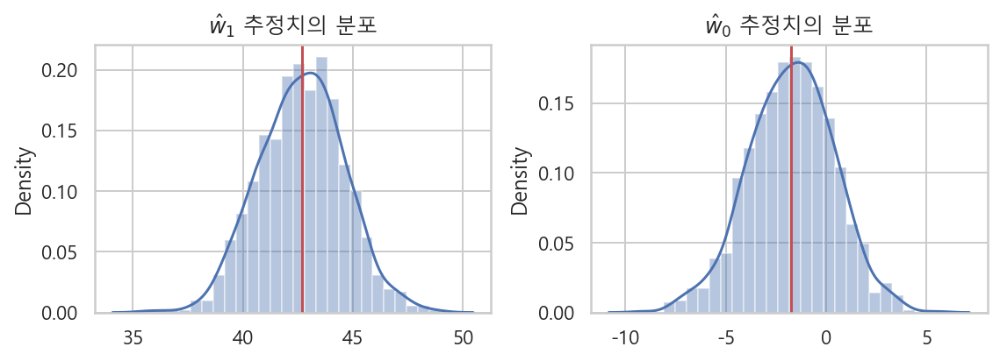

In [37]:
%matplotlib inline

plt.figure(figsize=(8, 3))

ax1 = plt.subplot(121)
sns.distplot(params_w1, ax=ax1)
ax1.axvline(params_w1.mean(), c="r")
plt.title("$\hat{w}_1$ 추정치의 분포")

ax2 = plt.subplot(122)
sns.distplot(params_w0, ax=ax2)
ax2.axvline(params_w0.mean(), c="r")
plt.title("$\hat{w}_0$ 추정치의 분포")

plt.tight_layout()
plt.show() ; 

In [38]:
params_w1.mean(), params_w1.std()

(42.67118585023439, 1.9334102328060028)

In [39]:
params_w0.mean(), params_w0.std()

(-1.7176660250364164, 2.131157439807179)

In [40]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     400.3
Date:                Fri, 02 Sep 2022   Prob (F-statistic):           2.21e-36
Time:                        17:04:26   Log-Likelihood:                -448.09
No. Observations:                 100   AIC:                             900.2
Df Residuals:                      98   BIC:                             905.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6284      2.163     -0.753      0.4

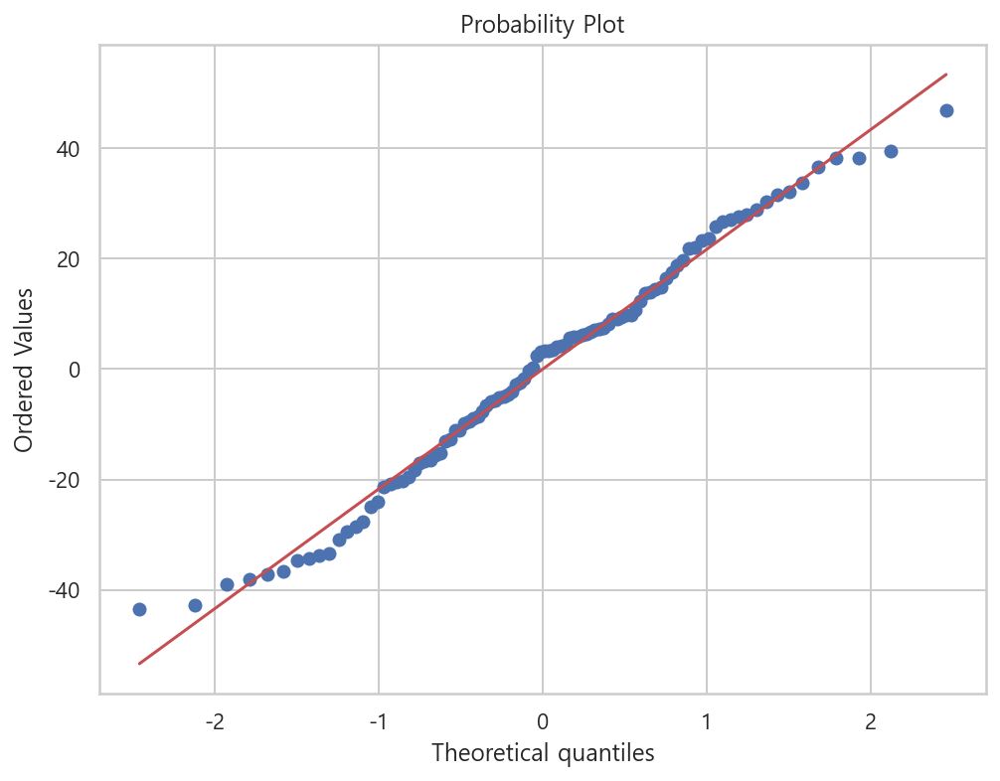

In [41]:
plt.figure(figsize=(8, 6))
sp.stats.probplot(result.resid, plot=plt)
plt.show()

In [42]:
result.resid

0     -7.635506
1    -38.939690
2     -9.552990
3     38.255888
4      5.900932
        ...    
95     4.060166
96    31.612511
97    -5.178971
98    33.665479
99    -8.575956
Length: 100, dtype: float64

In [43]:
test = sm.stats.omni_normtest(result.resid)
test 

NormaltestResult(statistic=3.522505660167542, pvalue=0.17182945580489245)

In [58]:
for xi in zip(["Chi^2", "P-value"], test) : 
    print("%-10s: %6.3f" % xi)

Chi^2     :  3.523
P-value   :  0.172


In [59]:
test = sm.stats.jarque_bera(result.resid)

for xi in zip(["Jarque-Bera", "P-value", "Skew", "Kurtosis"], test) : 
    print("%-12s: %6.3f" % xi)

Jarque-Bera :  2.059
P-value     :  0.357
Skew        : -0.073
Kurtosis    :  2.312


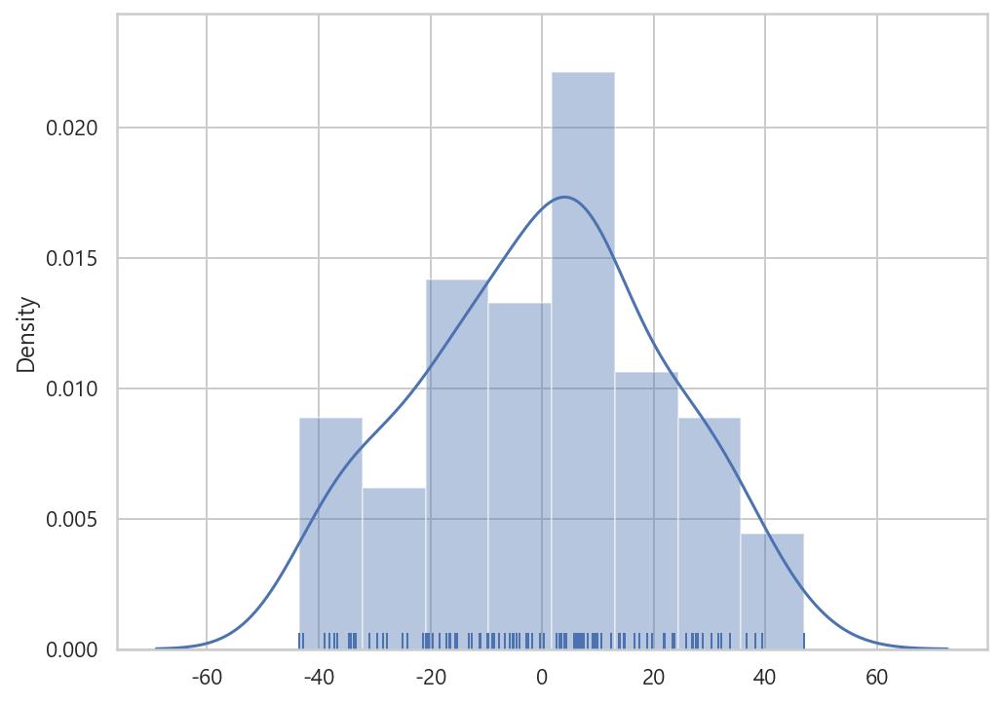

In [63]:
plt.figure(figsize=(8, 6))
sns.distplot(result.resid, rug=True)
plt.show() ;

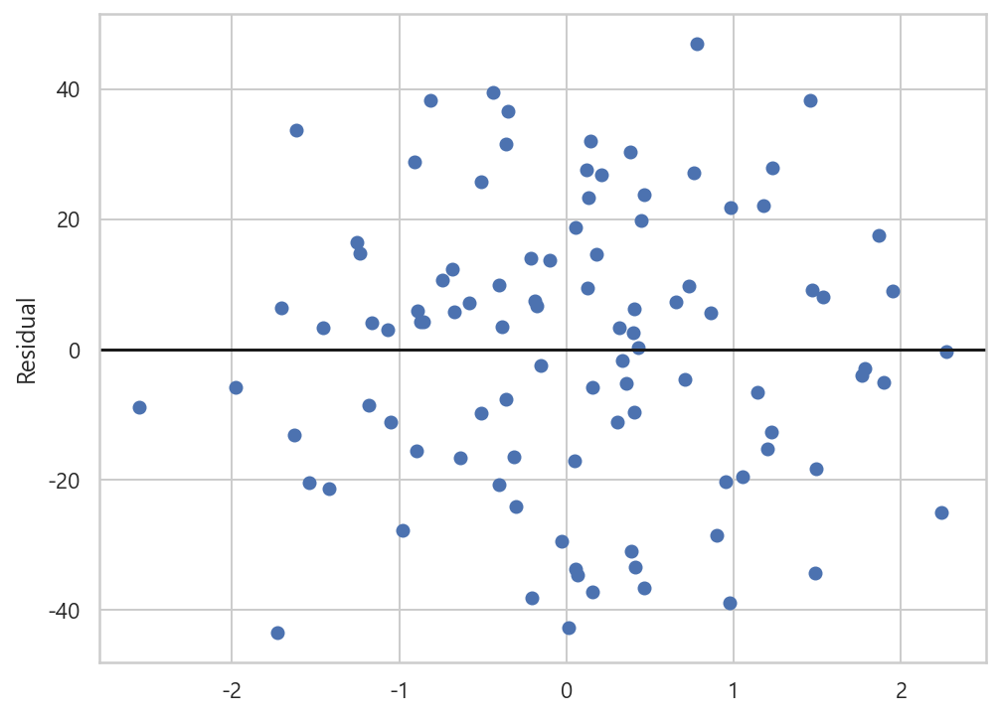

In [67]:
plt.figure(figsize=(8, 6))
plt.plot(X0, result.resid, "o")
plt.axhline(y=0, c="k")
plt.ylabel("Residual")
plt.show() ; 

In [64]:
X0[:10]

array([[-0.35955316],
       [ 0.97663904],
       [ 0.40234164],
       [-0.81314628],
       [-0.88778575],
       [ 0.44386323],
       [-0.97727788],
       [ 0.42833187],
       [ 0.20827498],
       [-0.31155253]])

In [65]:
result.resid[:10]

0    -7.635506
1   -38.939690
2    -9.552990
3    38.255888
4     5.900932
5    19.784758
6   -27.716644
7     0.338671
8    26.777366
9   -16.520983
dtype: float64

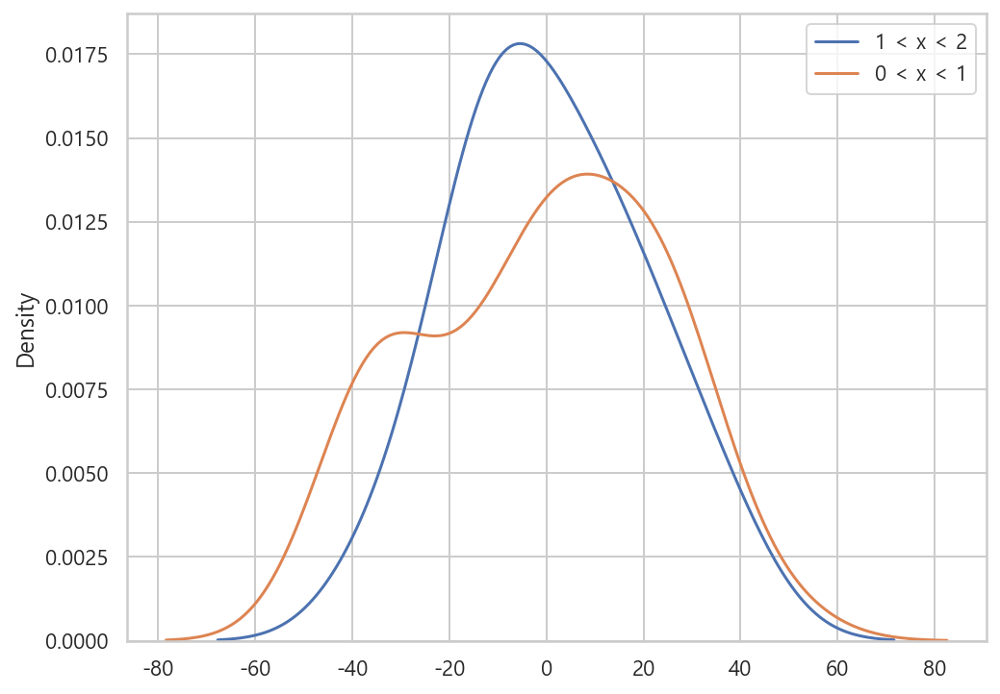

In [70]:
plt.figure(figsize=(8, 6))
sns.kdeplot(result.resid[((1 < X0) & (X0 < 2)).flatten()], label="1 < x < 2")
sns.kdeplot(result.resid[((0 < X0) & (X0 < 1)).flatten()], label="0 < x < 1")
plt.legend()
plt.show() ; 

In [74]:
result.resid[((1 < X0) & (X0 < 2)).flatten()]

15    22.036515
17    -2.877215
18    38.219487
21    -5.031094
26     8.993691
29     8.119797
40   -19.509823
46    27.931859
48    -4.018422
54    -6.588420
58     9.103885
62   -15.298590
68   -12.624743
69    17.509020
73   -18.351910
78   -34.308694
dtype: float64

In [76]:
result.resid[((1 < X0) & (X0 < 2)).flatten()].mean()

0.8315840246840249

In [77]:
result.resid[((1 < X0) & (X0 < 2)).flatten()].median()

-3.4478182870418905

In [78]:
result.resid[((1 < X0) & (X0 < 2)).flatten()].skew()

0.22572322401473136

In [79]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     400.3
Date:                Fri, 02 Sep 2022   Prob (F-statistic):           2.21e-36
Time:                        17:32:32   Log-Likelihood:                -448.09
No. Observations:                 100   AIC:                             900.2
Df Residuals:                      98   BIC:                             905.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6284      2.163     -0.753      0.4

In [80]:
print(result.t_test("x1 = 30"))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0            42.8534      2.142      6.001      0.000      38.603      47.104


In [81]:
print(result.t_test("x1 = 50"))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0            42.8534      2.142     -3.337      0.001      38.603      47.104


In [82]:
result.t_test("x1 = 50")

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0            42.8534      2.142     -3.337      0.001      38.603      47.104

In [83]:
import datetime
from calendar import isleap

In [84]:
df_nottem = sm.datasets.get_rdataset("nottem").data
df_nottem

,time,value
0,1920.000000,40.6
1,1920.083333,40.8
2,1920.166667,44.4
3,1920.250000,46.7
4,1920.333333,54.1
...,...,...
235,1939.583333,61.8
236,1939.666667,58.2
237,1939.750000,46.7
238,1939.833333,46.6


In [87]:
number = df_nottem.iloc[1]["time"]
number

1920.08333333333

In [89]:
year = int(number)
year

1920

In [91]:
datetime.timedelta(days=(number - year) * (365 + isleap(year)))

datetime.timedelta(days=30, seconds=43199, microseconds=999897)

In [92]:
365 + isleap(year)

366

In [93]:
d = datetime.timedelta(days=(number - year) * (365 + isleap(year)))
d

datetime.timedelta(days=30, seconds=43199, microseconds=999897)

In [94]:
day_one = datetime.datetime(year, 1, 1)
day_one

datetime.datetime(1920, 1, 1, 0, 0)

In [95]:
date = d + day_one
date

datetime.datetime(1920, 1, 31, 11, 59, 59, 999897)

In [96]:
def convert_partial_year(number) : 
    year = int(number)
    d = datetime.timedelta(days=(number - year) * (365 + isleap(year)))
    day_one = datetime.datetime(year, 1, 1)
    date = d + day_one
    return date

In [97]:
df_nottem["date0"] = df_nottem[["time"]].applymap(convert_partial_year)
df_nottem

,time,value,date0
0,1920.000000,40.6,1920-01-01 00:00:00.000000
1,1920.083333,40.8,1920-01-31 11:59:59.999897
2,1920.166667,44.4,1920-03-02 00:00:00.000103
3,1920.250000,46.7,1920-04-01 12:00:00.000000
4,1920.333333,54.1,1920-05-01 23:59:59.999897
...,...,...,...
235,1939.583333,61.8,1939-08-01 21:59:59.999897
236,1939.666667,58.2,1939-09-01 08:00:00.000103
237,1939.750000,46.7,1939-10-01 18:00:00.000000
238,1939.833333,46.6,1939-11-01 03:59:59.999897


In [98]:
df_nottem["date"] = pd.DatetimeIndex(df_nottem["date0"]).round("60min") + datetime.timedelta(seconds=3600*24)

df_nottem

,time,value,date0,date
0,1920.000000,40.6,1920-01-01 00:00:00.000000,1920-01-02 00:00:00
1,1920.083333,40.8,1920-01-31 11:59:59.999897,1920-02-01 12:00:00
2,1920.166667,44.4,1920-03-02 00:00:00.000103,1920-03-03 00:00:00
3,1920.250000,46.7,1920-04-01 12:00:00.000000,1920-04-02 12:00:00
4,1920.333333,54.1,1920-05-01 23:59:59.999897,1920-05-03 00:00:00
...,...,...,...,...
235,1939.583333,61.8,1939-08-01 21:59:59.999897,1939-08-02 22:00:00
236,1939.666667,58.2,1939-09-01 08:00:00.000103,1939-09-02 08:00:00
237,1939.750000,46.7,1939-10-01 18:00:00.000000,1939-10-02 18:00:00
238,1939.833333,46.6,1939-11-01 03:59:59.999897,1939-11-02 04:00:00


In [103]:
pd.DatetimeIndex(df_nottem["date0"][:1])

DatetimeIndex(['1920-01-01'], dtype='datetime64[ns]', name='date0', freq=None)

In [105]:
df_nottem["date0"][0]

Timestamp('1920-01-01 00:00:00')

In [110]:
pd.DatetimeIndex(df_nottem["date0"][13:14]).round("60min")

DatetimeIndex(['1921-01-31 10:00:00'], dtype='datetime64[ns]', name='date0', freq=None)

In [109]:
df_nottem["date0"][:20]

0    1920-01-01 00:00:00.000000
1    1920-01-31 11:59:59.999897
2    1920-03-02 00:00:00.000103
3    1920-04-01 12:00:00.000000
4    1920-05-01 23:59:59.999897
5    1920-06-01 12:00:00.000103
6    1920-07-02 00:00:00.000000
7    1920-08-01 11:59:59.999897
8    1920-09-01 00:00:00.000103
9    1920-10-01 12:00:00.000000
10   1920-10-31 23:59:59.999897
11   1920-12-01 12:00:00.000103
12   1921-01-01 00:00:00.000000
13   1921-01-31 09:59:59.999897
14   1921-03-02 20:00:00.000103
15   1921-04-02 06:00:00.000000
16   1921-05-02 15:59:59.999897
17   1921-06-02 02:00:00.000103
18   1921-07-02 12:00:00.000000
19   1921-08-01 21:59:59.999897
Name: date0, dtype: datetime64[ns]

In [112]:
df_nottem["month"] = df_nottem["date"].dt.strftime("%m").astype("category")
df_nottem

,time,value,date0,date,month
0,1920.000000,40.6,1920-01-01 00:00:00.000000,1920-01-02 00:00:00,01
1,1920.083333,40.8,1920-01-31 11:59:59.999897,1920-02-01 12:00:00,02
2,1920.166667,44.4,1920-03-02 00:00:00.000103,1920-03-03 00:00:00,03
3,1920.250000,46.7,1920-04-01 12:00:00.000000,1920-04-02 12:00:00,04
4,1920.333333,54.1,1920-05-01 23:59:59.999897,1920-05-03 00:00:00,05
...,...,...,...,...,...
235,1939.583333,61.8,1939-08-01 21:59:59.999897,1939-08-02 22:00:00,08
236,1939.666667,58.2,1939-09-01 08:00:00.000103,1939-09-02 08:00:00,09
237,1939.750000,46.7,1939-10-01 18:00:00.000000,1939-10-02 18:00:00,10
238,1939.833333,46.6,1939-11-01 03:59:59.999897,1939-11-02 04:00:00,11


In [114]:
df_nottem["days"] = df_nottem["date"].dt.strftime("%d")
df_nottem

,time,value,date0,date,month,days
0,1920.000000,40.6,1920-01-01 00:00:00.000000,1920-01-02 00:00:00,01,02
1,1920.083333,40.8,1920-01-31 11:59:59.999897,1920-02-01 12:00:00,02,01
2,1920.166667,44.4,1920-03-02 00:00:00.000103,1920-03-03 00:00:00,03,03
3,1920.250000,46.7,1920-04-01 12:00:00.000000,1920-04-02 12:00:00,04,02
4,1920.333333,54.1,1920-05-01 23:59:59.999897,1920-05-03 00:00:00,05,03
...,...,...,...,...,...,...
235,1939.583333,61.8,1939-08-01 21:59:59.999897,1939-08-02 22:00:00,08,02
236,1939.666667,58.2,1939-09-01 08:00:00.000103,1939-09-02 08:00:00,09,02
237,1939.750000,46.7,1939-10-01 18:00:00.000000,1939-10-02 18:00:00,10,02
238,1939.833333,46.6,1939-11-01 03:59:59.999897,1939-11-02 04:00:00,11,02


In [115]:
del df_nottem["date"], df_nottem["date0"], df_nottem["days"]

In [116]:
df_nottem

,time,value,month
0,1920.000000,40.6,01
1,1920.083333,40.8,02
2,1920.166667,44.4,03
3,1920.250000,46.7,04
4,1920.333333,54.1,05
...,...,...,...
235,1939.583333,61.8,08
236,1939.666667,58.2,09
237,1939.750000,46.7,10
238,1939.833333,46.6,11


In [117]:
model_nottem = sm.OLS.from_formula("value ~ C(month) + 0", df_nottem)
result_nottem = model_nottem.fit()

In [118]:
print(result_nottem.summary())

                            OLS Regression Results                            
Dep. Variable:                  value   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.927
Method:                 Least Squares   F-statistic:                     277.3
Date:                Fri, 02 Sep 2022   Prob (F-statistic):          2.96e-125
Time:                        18:05:29   Log-Likelihood:                -535.82
No. Observations:                 240   AIC:                             1096.
Df Residuals:                     228   BIC:                             1137.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
C(month)[01]    39.6950      0.518     76.691   

In [119]:
print(result_nottem.t_test("C(month)[01] = C(month)[02]"))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.5050      0.732      0.690      0.491      -0.937       1.947


In [120]:
print(result_nottem.t_test("C(month)[07] = C(month)[08]"))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             1.3800      0.732      1.885      0.061      -0.062       2.822


In [121]:
print(result_nottem.t_test("C(month)[12] = C(month)[01]"))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0            -0.1650      0.732     -0.225      0.822      -1.607       1.277


In [122]:
print(result_nottem.t_test("C(month)[01] = C(month)[02] = C(month)[12]"))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.5050      0.732      0.690      0.491      -0.937       1.947
c1            -0.3400      0.732     -0.464      0.643      -1.782       1.102


In [123]:
print(result_nottem.t_test("C(month)[03] = C(month)[02]"))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             3.0050      0.732      4.105      0.000       1.563       4.447


## 레버리지와 아웃라이어

In [1]:
from sklearn.datasets import make_regression

In [2]:
X0, y, coef = make_regression(n_samples=100, n_features=1, noise=20,
                             coef=True, random_state=1)

In [3]:
data_100 = (4, 300)
data_101 = (3, 150)

In [4]:
np.array([data_100[:1], data_101[:1]])

array([[4],
       [3]])

In [8]:
data_100[:1], data_101[:1]

((4,), (3,))

In [9]:
np.vstack([X0, np.array([data_100[:1], data_101[:1]])])

array([[-0.61175641],
       [-0.24937038],
       [ 0.48851815],
       [ 0.76201118],
       [ 1.51981682],
       [ 0.37756379],
       [ 0.51292982],
       [-0.67124613],
       [-1.39649634],
       [ 0.31563495],
       [-0.63699565],
       [-0.39675353],
       [-1.10061918],
       [ 0.90085595],
       [-1.09989127],
       [ 0.82797464],
       [-0.07557171],
       [-0.35224985],
       [-0.67066229],
       [-1.07296862],
       [-0.30620401],
       [ 2.18557541],
       [ 0.86540763],
       [ 0.19829972],
       [-0.38405435],
       [-0.68372786],
       [ 0.05080775],
       [ 0.58281521],
       [ 1.25286816],
       [-0.75439794],
       [-0.34934272],
       [-0.88762896],
       [ 0.18656139],
       [ 0.87616892],
       [ 0.83898341],
       [-0.50446586],
       [-0.34385368],
       [ 1.6924546 ],
       [-2.3015387 ],
       [ 0.93110208],
       [ 2.10025514],
       [ 1.46210794],
       [-0.84520564],
       [-0.87785842],
       [-0.3224172 ],
       [ 0

In [10]:
X0 = np.vstack([X0, np.array([data_100[:1], data_101[:1]])])
X0

array([[-0.61175641],
       [-0.24937038],
       [ 0.48851815],
       [ 0.76201118],
       [ 1.51981682],
       [ 0.37756379],
       [ 0.51292982],
       [-0.67124613],
       [-1.39649634],
       [ 0.31563495],
       [-0.63699565],
       [-0.39675353],
       [-1.10061918],
       [ 0.90085595],
       [-1.09989127],
       [ 0.82797464],
       [-0.07557171],
       [-0.35224985],
       [-0.67066229],
       [-1.07296862],
       [-0.30620401],
       [ 2.18557541],
       [ 0.86540763],
       [ 0.19829972],
       [-0.38405435],
       [-0.68372786],
       [ 0.05080775],
       [ 0.58281521],
       [ 1.25286816],
       [-0.75439794],
       [-0.34934272],
       [-0.88762896],
       [ 0.18656139],
       [ 0.87616892],
       [ 0.83898341],
       [-0.50446586],
       [-0.34385368],
       [ 1.6924546 ],
       [-2.3015387 ],
       [ 0.93110208],
       [ 2.10025514],
       [ 1.46210794],
       [-0.84520564],
       [-0.87785842],
       [-0.3224172 ],
       [ 0

In [11]:
X = sm.add_constant(X0)
X

array([[ 1.        , -0.61175641],
       [ 1.        , -0.24937038],
       [ 1.        ,  0.48851815],
       [ 1.        ,  0.76201118],
       [ 1.        ,  1.51981682],
       [ 1.        ,  0.37756379],
       [ 1.        ,  0.51292982],
       [ 1.        , -0.67124613],
       [ 1.        , -1.39649634],
       [ 1.        ,  0.31563495],
       [ 1.        , -0.63699565],
       [ 1.        , -0.39675353],
       [ 1.        , -1.10061918],
       [ 1.        ,  0.90085595],
       [ 1.        , -1.09989127],
       [ 1.        ,  0.82797464],
       [ 1.        , -0.07557171],
       [ 1.        , -0.35224985],
       [ 1.        , -0.67066229],
       [ 1.        , -1.07296862],
       [ 1.        , -0.30620401],
       [ 1.        ,  2.18557541],
       [ 1.        ,  0.86540763],
       [ 1.        ,  0.19829972],
       [ 1.        , -0.38405435],
       [ 1.        , -0.68372786],
       [ 1.        ,  0.05080775],
       [ 1.        ,  0.58281521],
       [ 1.        ,

In [13]:
np.hstack([y, [data_100[1], data_101[1]]])

array([-5.55385928e+01, -1.06619847e+01,  2.27574081e+01,  1.01096129e+02,
        1.44337558e+02,  3.32888330e+01,  3.30152710e+01, -2.58869694e+01,
       -9.96391397e+01,  2.38030714e+01, -4.55886864e+01, -8.33875709e+00,
       -9.53154191e+01,  3.64072963e+01, -8.72926036e+01,  6.76693724e+01,
       -1.36866100e+01, -5.54414224e+01, -6.53402399e+01, -5.44497141e+01,
       -2.88351332e+01,  1.78835048e+02,  6.50839520e+01,  2.66683131e+01,
       -1.85459706e+01, -4.14990408e+01,  8.55827764e-01,  4.45616521e+01,
        1.15984811e+02, -6.46197993e+01, -2.59312718e+01, -6.08820426e+01,
        1.87195482e+01,  7.50696998e+01,  1.17203175e+02, -2.26982690e+01,
       -5.63625811e+01,  1.80837188e+02, -1.92574950e+02,  6.85032358e+01,
        1.65522025e+02,  1.05000391e+02, -7.04338757e+01, -5.87693362e+01,
       -4.15757142e+01,  7.32472269e+01,  4.09664082e+01,  8.04619460e+01,
       -2.87939943e+01,  3.42341054e+01, -4.17148764e+01,  1.43547375e+01,
        7.93363240e+01,  

In [14]:
y = np.hstack([y, [data_100[1], data_101[1]]])
y

array([-5.55385928e+01, -1.06619847e+01,  2.27574081e+01,  1.01096129e+02,
        1.44337558e+02,  3.32888330e+01,  3.30152710e+01, -2.58869694e+01,
       -9.96391397e+01,  2.38030714e+01, -4.55886864e+01, -8.33875709e+00,
       -9.53154191e+01,  3.64072963e+01, -8.72926036e+01,  6.76693724e+01,
       -1.36866100e+01, -5.54414224e+01, -6.53402399e+01, -5.44497141e+01,
       -2.88351332e+01,  1.78835048e+02,  6.50839520e+01,  2.66683131e+01,
       -1.85459706e+01, -4.14990408e+01,  8.55827764e-01,  4.45616521e+01,
        1.15984811e+02, -6.46197993e+01, -2.59312718e+01, -6.08820426e+01,
        1.87195482e+01,  7.50696998e+01,  1.17203175e+02, -2.26982690e+01,
       -5.63625811e+01,  1.80837188e+02, -1.92574950e+02,  6.85032358e+01,
        1.65522025e+02,  1.05000391e+02, -7.04338757e+01, -5.87693362e+01,
       -4.15757142e+01,  7.32472269e+01,  4.09664082e+01,  8.04619460e+01,
       -2.87939943e+01,  3.42341054e+01, -4.17148764e+01,  1.43547375e+01,
        7.93363240e+01,  

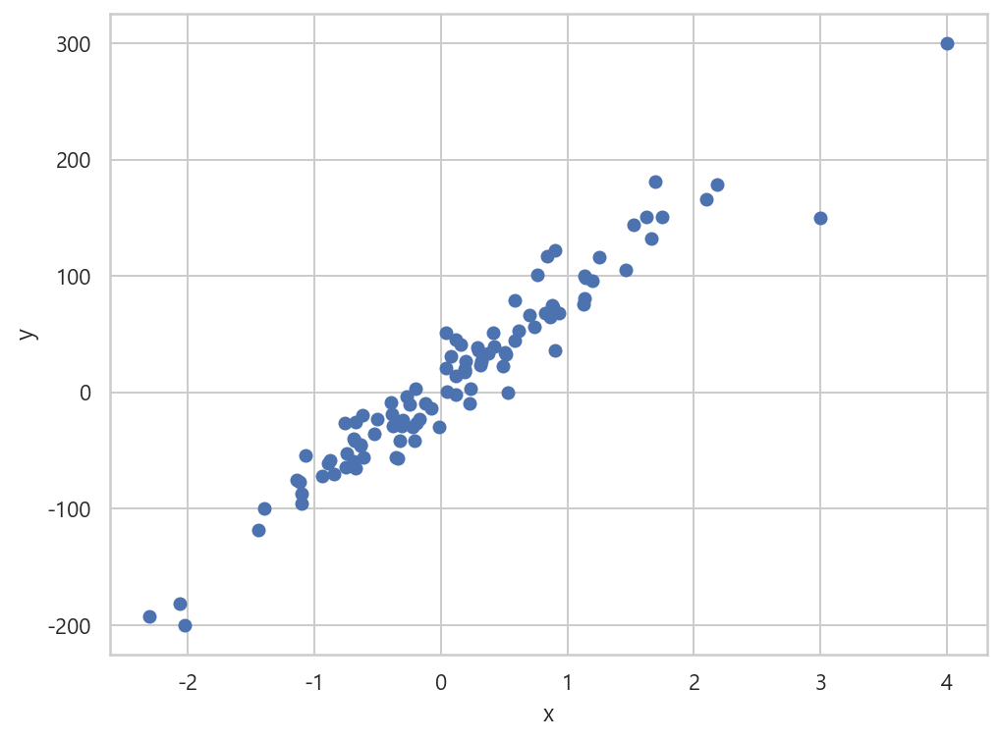

In [15]:
%matplotlib inline

plt.figure(figsize=(8, 6))
plt.scatter(X0, y)
plt.xlabel("x")
plt.ylabel("y")
plt.show() ; 

In [22]:
model = sm.OLS(pd.DataFrame(y, columns=["y"]), pd.DataFrame(X, columns=["const", "x1"]))
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.936
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     1464.
Date:                Sat, 03 Sep 2022   Prob (F-statistic):           1.61e-61
Time:                        13:00:06   Log-Likelihood:                -452.71
No. Observations:                 102   AIC:                             909.4
Df Residuals:                     100   BIC:                             914.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.2565      2.065      1.577      0.1

In [23]:
result.params

const     3.256462
x1       78.337878
dtype: float64

In [29]:
print(result.t_test("x1 = 80"))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0            78.3379      2.048     -0.812      0.419      74.276      82.400


In [30]:
influence = result.get_influence()
hat = influence.hat_matrix_diag

In [31]:
influence

In [34]:
hat.shape

(102,)

In [35]:
hat

array([0.01516695, 0.01119963, 0.01107744, 0.01374277, 0.02878656,
       0.01041415, 0.01125576, 0.01606417, 0.03257963, 0.01014885,
       0.01553914, 0.01250262, 0.02459694, 0.01565692, 0.02457942,
       0.01460505, 0.01021012, 0.0120643 , 0.01605503, 0.0239386 ,
       0.01165165, 0.05129059, 0.0151323 , 0.00985232, 0.01237359,
       0.01626123, 0.00986235, 0.01183083, 0.02220309, 0.0174345 ,
       0.01203702, 0.01991263, 0.0098375 , 0.01528896, 0.01475726,
       0.01372415, 0.01198596, 0.03378783, 0.06764843, 0.01612402,
       0.04792128, 0.02724502, 0.0190858 , 0.01971908, 0.01179221,
       0.01542131, 0.00981397, 0.0196743 , 0.01228633, 0.01117811,
       0.0109163 , 0.00980453, 0.01186491, 0.01016148, 0.01638805,
       0.01298791, 0.02104222, 0.01086322, 0.01139019, 0.01349858,
       0.01058338, 0.00980472, 0.01755271, 0.01065946, 0.01009433,
       0.02562309, 0.00983591, 0.02089362, 0.01528715, 0.0250016 ,
       0.03402463, 0.01100677, 0.03174496, 0.01214893, 0.01631

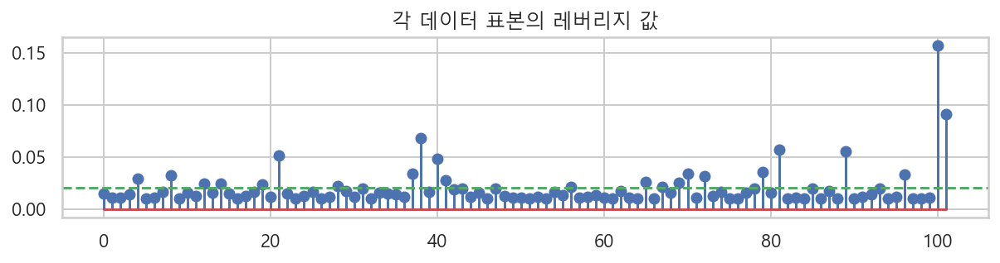

In [36]:
plt.figure(figsize=(10, 2))
plt.stem(hat)
plt.axhline(0.02, c="g", ls="--")
plt.title("각 데이터 표본의 레버리지 값")
plt.show() ; 

In [38]:
hat.mean()

0.019607843137254905

In [39]:
hat_mean = 2 / 102
hat_mean

0.0196078431372549

In [40]:
hat.sum()

2.0000000000000004

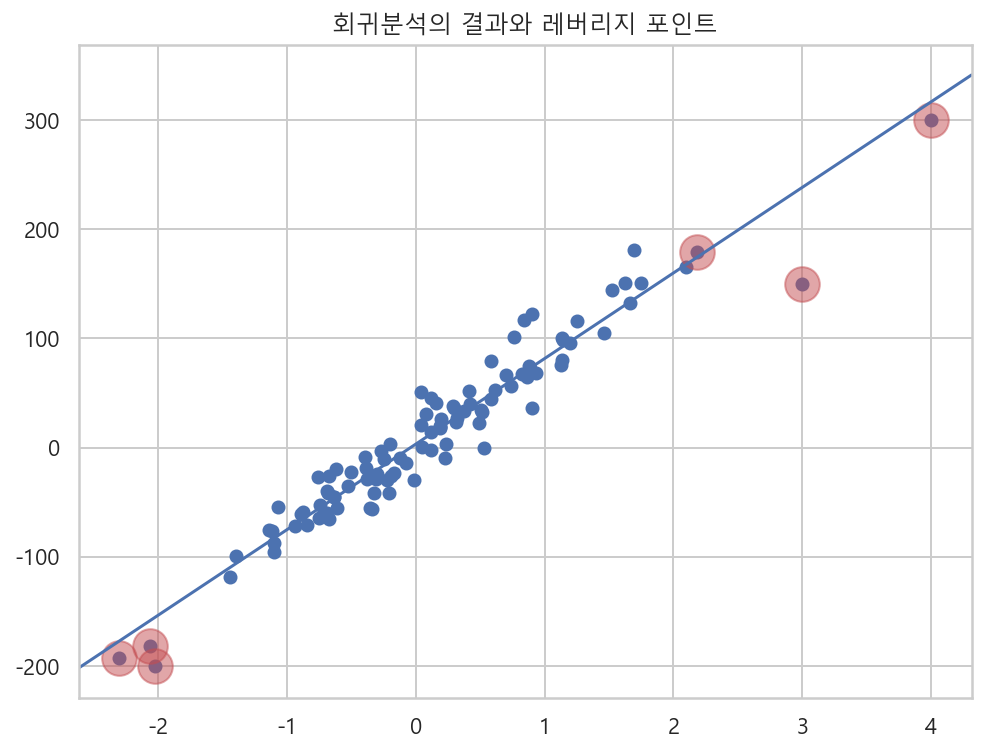

In [42]:
plt.figure(figsize=(8, 6))
ax = plt.subplot()
plt.scatter(X0, y)
sm.graphics.abline_plot(model_results=result, ax=ax)

idx = hat > 0.05
plt.scatter(X0[idx], y[idx], s=300, c="r", alpha=0.5)
plt.title("회귀분석의 결과와 레버리지 포인트")
plt.show() ; 

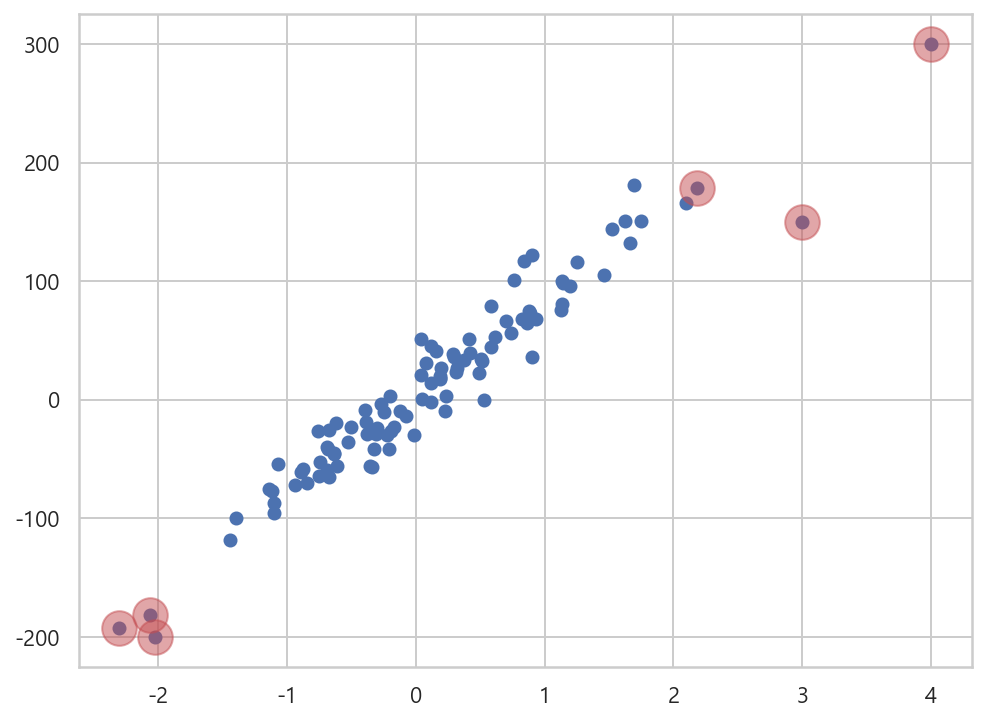

In [45]:
plt.figure(figsize=(8, 6))
ax = plt.subplot()
plt.scatter(X0, y)
#sm.graphics.abline_plot(model_results=result, ax=ax)

idx = hat > 0.05
plt.scatter(X0[idx], y[idx], s=300, c="r", alpha=0.5)
plt.show() ; 

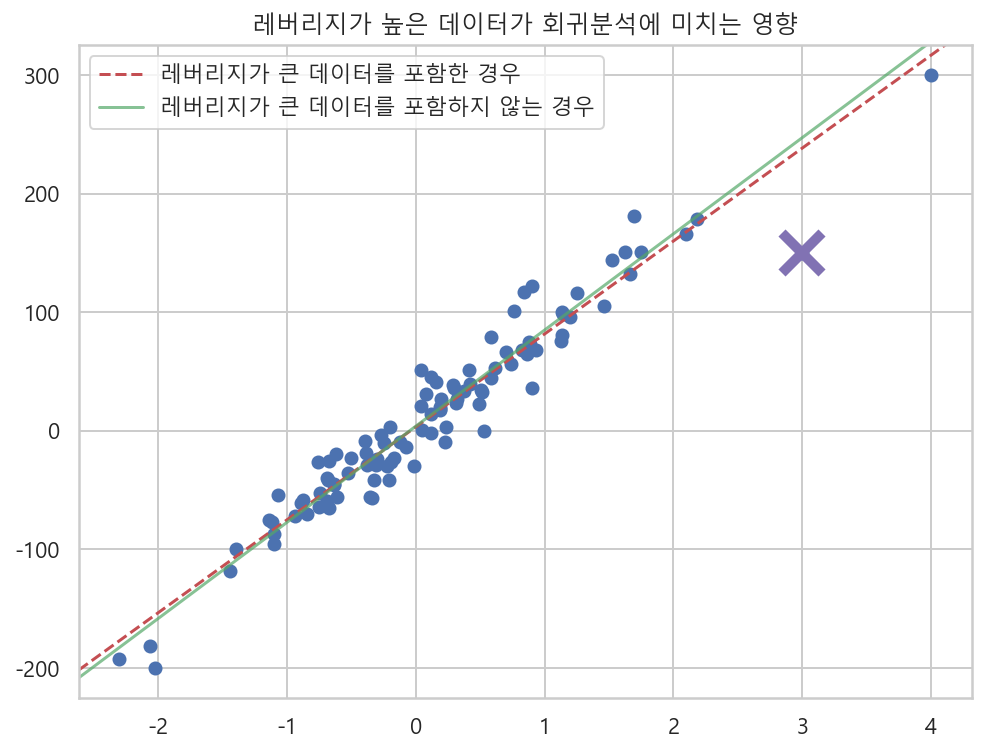

In [50]:
model2 = sm.OLS(y[:-1], X[:-1])
result2 = model2.fit()

plt.figure(figsize=(8, 6))
ax = plt.subplot()
plt.scatter(X0, y)
sm.graphics.abline_plot(model_results=result,
                       c="r", linestyle="--", ax=ax,
                       label="레버리지가 큰 데이터를 포함한 경우")
sm.graphics.abline_plot(model_results=result2,
                       c="g", alpha=0.7, ax=ax,
                       label="레버리지가 큰 데이터를 포함하지 않는 경우")

plt.plot(X0[-1], y[-1], marker="x", c="m", ms=20, mew=5)
plt.legend(loc="upper left")
plt.title("레버리지가 높은 데이터가 회귀분석에 미치는 영향")
plt.show() ; 

In [46]:
y[:-1]

array([-5.55385928e+01, -1.06619847e+01,  2.27574081e+01,  1.01096129e+02,
        1.44337558e+02,  3.32888330e+01,  3.30152710e+01, -2.58869694e+01,
       -9.96391397e+01,  2.38030714e+01, -4.55886864e+01, -8.33875709e+00,
       -9.53154191e+01,  3.64072963e+01, -8.72926036e+01,  6.76693724e+01,
       -1.36866100e+01, -5.54414224e+01, -6.53402399e+01, -5.44497141e+01,
       -2.88351332e+01,  1.78835048e+02,  6.50839520e+01,  2.66683131e+01,
       -1.85459706e+01, -4.14990408e+01,  8.55827764e-01,  4.45616521e+01,
        1.15984811e+02, -6.46197993e+01, -2.59312718e+01, -6.08820426e+01,
        1.87195482e+01,  7.50696998e+01,  1.17203175e+02, -2.26982690e+01,
       -5.63625811e+01,  1.80837188e+02, -1.92574950e+02,  6.85032358e+01,
        1.65522025e+02,  1.05000391e+02, -7.04338757e+01, -5.87693362e+01,
       -4.15757142e+01,  7.32472269e+01,  4.09664082e+01,  8.04619460e+01,
       -2.87939943e+01,  3.42341054e+01, -4.17148764e+01,  1.43547375e+01,
        7.93363240e+01,  

In [47]:
X[:-1]

array([[ 1.        , -0.61175641],
       [ 1.        , -0.24937038],
       [ 1.        ,  0.48851815],
       [ 1.        ,  0.76201118],
       [ 1.        ,  1.51981682],
       [ 1.        ,  0.37756379],
       [ 1.        ,  0.51292982],
       [ 1.        , -0.67124613],
       [ 1.        , -1.39649634],
       [ 1.        ,  0.31563495],
       [ 1.        , -0.63699565],
       [ 1.        , -0.39675353],
       [ 1.        , -1.10061918],
       [ 1.        ,  0.90085595],
       [ 1.        , -1.09989127],
       [ 1.        ,  0.82797464],
       [ 1.        , -0.07557171],
       [ 1.        , -0.35224985],
       [ 1.        , -0.67066229],
       [ 1.        , -1.07296862],
       [ 1.        , -0.30620401],
       [ 1.        ,  2.18557541],
       [ 1.        ,  0.86540763],
       [ 1.        ,  0.19829972],
       [ 1.        , -0.38405435],
       [ 1.        , -0.68372786],
       [ 1.        ,  0.05080775],
       [ 1.        ,  0.58281521],
       [ 1.        ,

In [51]:
result.params

const     3.256462
x1       78.337878
dtype: float64

In [52]:
result2.params

array([ 3.85836361, 81.06976073])

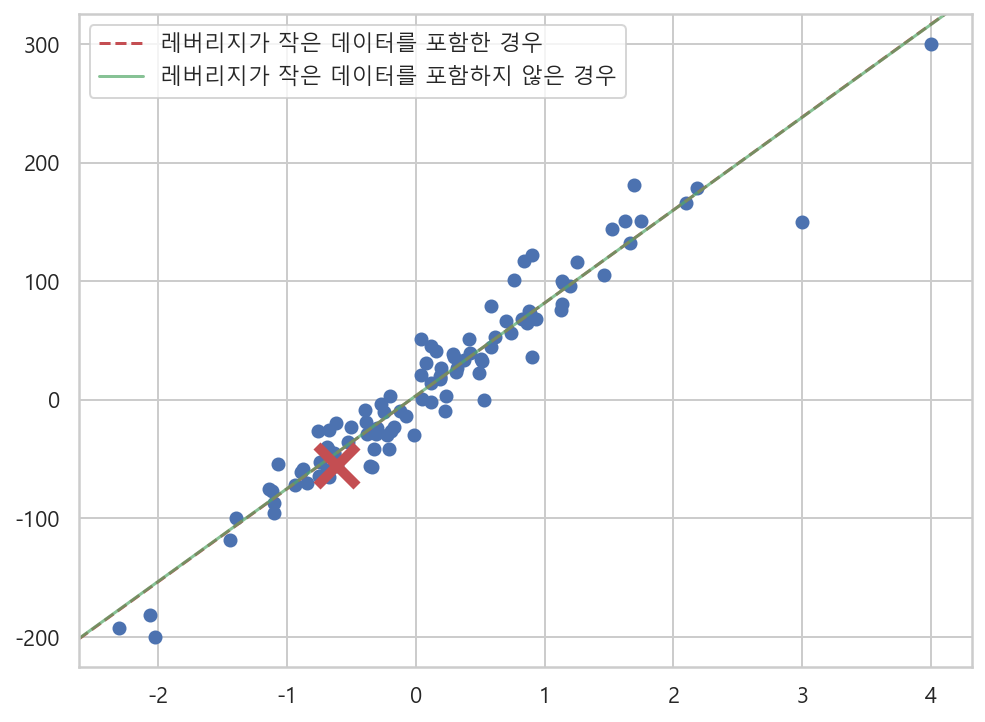

In [59]:
model3 = sm.OLS(y[1:], X[1:])
result3 = model3.fit()

plt.figure(figsize=(8, 6))
ax = plt.subplot()
plt.scatter(X0, y)
sm.graphics.abline_plot(model_results=result,
                       c="r", linestyle="--", ax=ax,
                       label="레버리지가 작은 데이터를 포함한 경우")
sm.graphics.abline_plot(model_results=result3,
                       c="g", alpha=0.7, ax=ax,
                       label="레버리지가 작은 데이터를 포함하지 않은 경우")

plt.plot(X0[0], y[0], marker="x", ms=20, c="r", mew=5)
plt.legend(loc="upper left")

plt.show() ;

In [60]:
data_100

(4, 300)

In [61]:
data_101

(3, 150)

In [62]:
result.params[1], result2.params[1], result.params[1]

(78.33787836138053, 81.06976073068216, 78.33787836138053)

In [64]:
idx = np.array(list(range(100)) + [101])
idx

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 101])

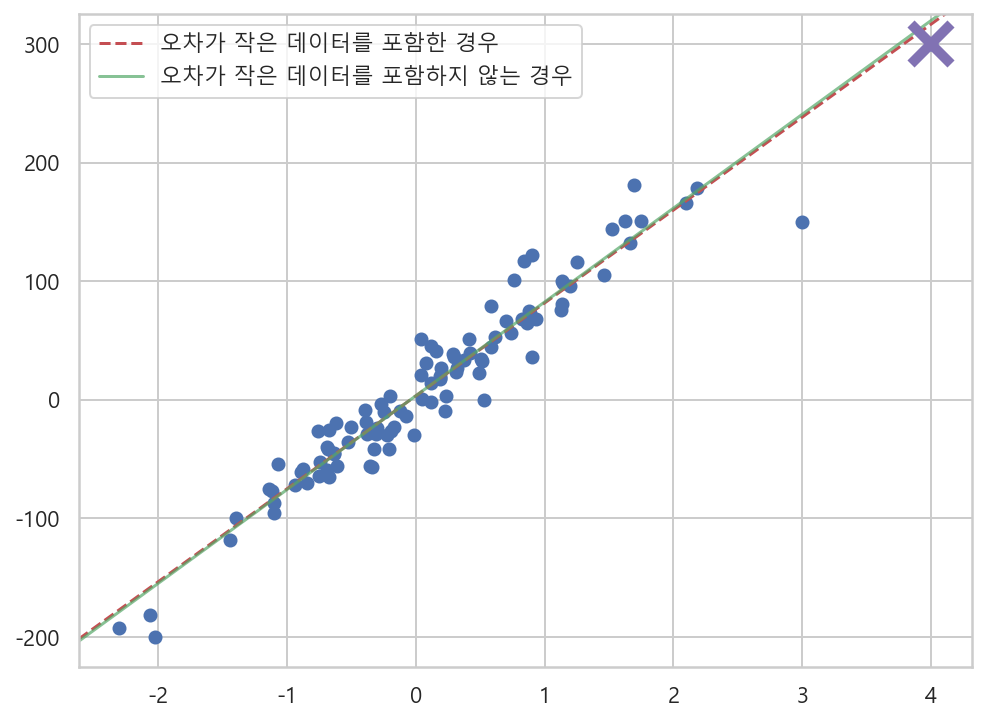

In [68]:
model4 = sm.OLS(y[idx], X[idx, :])
result4 = model4.fit()

plt.figure(figsize=(8, 6))
ax = plt.subplot()
plt.scatter(X0, y)
sm.graphics.abline_plot(model_results=result,
                       c="r", linestyle="--", ax=ax,
                       label="오차가 작은 데이터를 포함한 경우")
sm.graphics.abline_plot(model_results=result4,
                       c="g", alpha=0.7, ax=ax,
                       label="오차가 작은 데이터를 포함하지 않는 경우")

plt.plot(X0[-2], y[-2], marker="x", ms=20, c="m", mew=5)
plt.legend(loc="upper left")
plt.show() ; 

In [65]:
test = [1, 2, 3, 4, 5]
test

[1, 2, 3, 4, 5]

In [66]:
test[-1]

5

In [67]:
test[-2]

4

In [81]:
pd.Series(result.resid[90:]).reset_index(drop=True)

0    -30.801742
1     14.256959
2      2.807143
3    -16.332077
4     -0.642235
5     -3.864520
6     -1.195888
7     13.935836
8     44.547812
9    -14.534512
10   -16.607976
11   -88.270097
dtype: float64

In [72]:
pd.Series(hat[90:])

0     0.009906
1     0.011340
2     0.014024
3     0.019632
4     0.009843
5     0.011583
6     0.032797
7     0.009874
8     0.009876
9     0.010807
10    0.156721
11    0.090633
dtype: float64

In [82]:
pd.DataFrame({"resid" : pd.Series(result.resid[90:]).reset_index(drop=True),
             "reverage" : pd.Series(hat[90:])})

,resid,reverage
0,-30.801742,0.009906
1,14.256959,0.011340
2,2.807143,0.014024
3,-16.332077,0.019632
4,-0.642235,0.009843
5,-3.864520,0.011583
6,-1.195888,0.032797
7,13.935836,0.009874
8,44.547812,0.009876
9,-14.534512,0.010807


In [89]:
df_resid = pd.DataFrame(result.resid[90:], columns=["resid"])
df_resid

,resid
90,-30.801742
91,14.256959
92,2.807143
93,-16.332077
94,-0.642235
95,-3.864520
96,-1.195888
97,13.935836
98,44.547812
99,-14.534512


In [100]:
df_reverage = pd.DataFrame(hat[90:], columns=["reverage"])
df_reverage.index = range(90, 102)
df_reverage

,reverage
90,0.009906
91,0.011340
92,0.014024
93,0.019632
94,0.009843
95,0.011583
96,0.032797
97,0.009874
98,0.009876
99,0.010807


In [104]:
pd.concat([df_resid, df_reverage], axis=1).sort_values("reverage", ascending=False)

,resid,reverage
100,-16.607976,0.156721
101,-88.270097,0.090633
96,-1.195888,0.032797
93,-16.332077,0.019632
92,2.807143,0.014024
95,-3.864520,0.011583
91,14.256959,0.011340
99,-14.534512,0.010807
90,-30.801742,0.009906
98,44.547812,0.009876


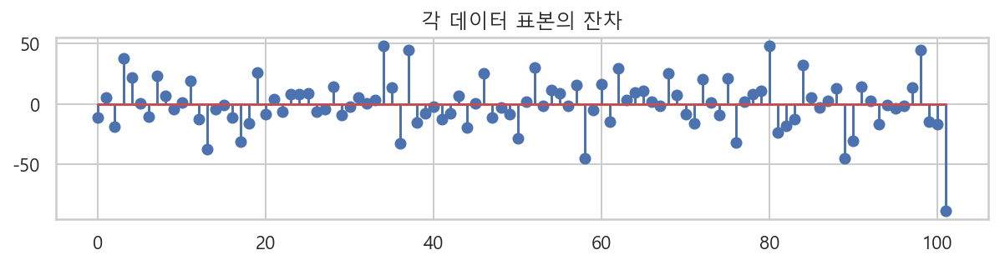

In [105]:
plt.figure(figsize=(10, 2))
plt.stem(result.resid)
plt.title("각 데이터 표본의 잔차")
plt.show() ;

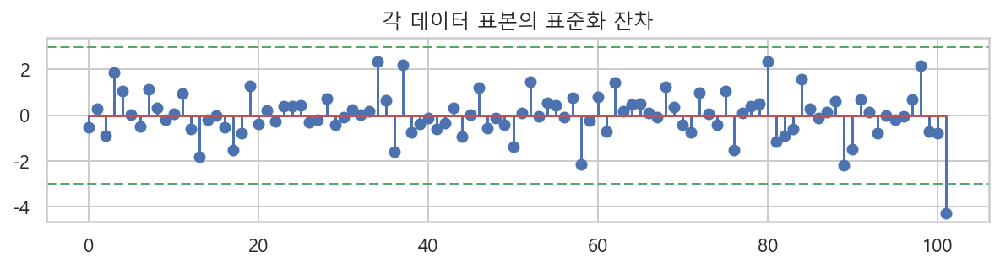

In [106]:
plt.figure(figsize=(10, 2))
plt.stem(result.resid_pearson)
plt.axhline(3, c="g", ls="--")
plt.axhline(-3, c="g", ls="--")
plt.title("각 데이터 표본의 표준화 잔차")
plt.show() ; 

In [107]:
result.resid

0     -10.871355
1       5.616699
2     -18.768529
3      38.145327
4      22.021870
         ...    
97     13.935836
98     44.547812
99    -14.534512
100   -16.607976
101   -88.270097
Length: 102, dtype: float64

In [108]:
result.resid_pearson

array([-0.52560118,  0.2715525 , -0.90740856,  1.84422532,  1.06469898,
        0.02198957, -0.50392559,  1.13328915,  0.31440077, -0.20207077,
        0.05104217,  0.94207753, -0.59717239, -1.80917263, -0.21204747,
       -0.02170151, -0.53293011, -1.50376581, -0.77638302,  1.27385146,
       -0.39181765,  0.21104805, -0.28847448,  0.38085484,  0.40048865,
        0.4257606 , -0.30849504, -0.21037464,  0.70496791, -0.42440882,
       -0.08803889,  0.26090476,  0.04101124,  0.1535523 ,  2.33143144,
        0.65578602, -1.58010128,  2.17550594, -0.75101574, -0.37197422,
       -0.10945687, -0.61858036, -0.36157631,  0.32604326, -0.94638462,
        0.03145884,  1.21704683, -0.55328516, -0.12818959, -0.40547454,
       -1.38307287,  0.08147871,  1.45646599, -0.0541539 ,  0.55306552,
        0.42866672, -0.07959431,  0.77508239, -2.16087567, -0.23648321,
        0.78304826, -0.70958229,  1.43683125,  0.16002345,  0.45109221,
        0.51461134,  0.09434421, -0.07500139,  1.22848241,  0.36

In [117]:
max_val = abs(result.resid_pearson).max()
max_val

4.267624880998616

In [120]:
idx = abs(result.resid_pearson) > 4
idx

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True])

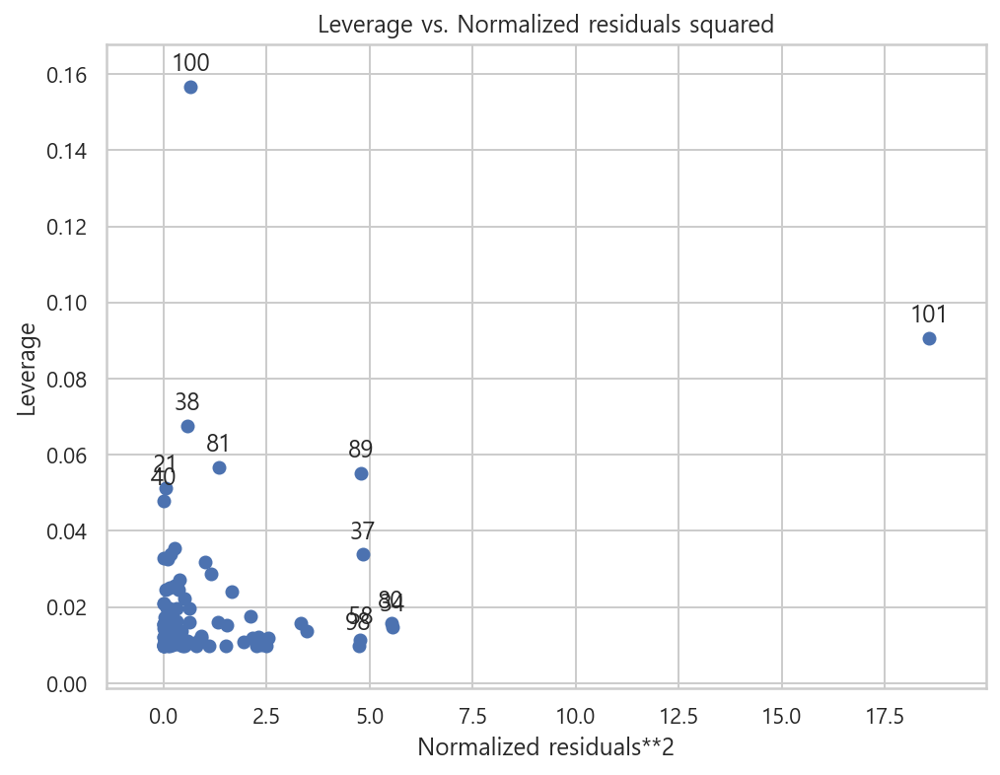

In [129]:
plt.figure(figsize=(8, 6))
ax = plt.subplot()
sm.graphics.plot_leverage_resid2(result, ax=ax)
plt.show() ; 

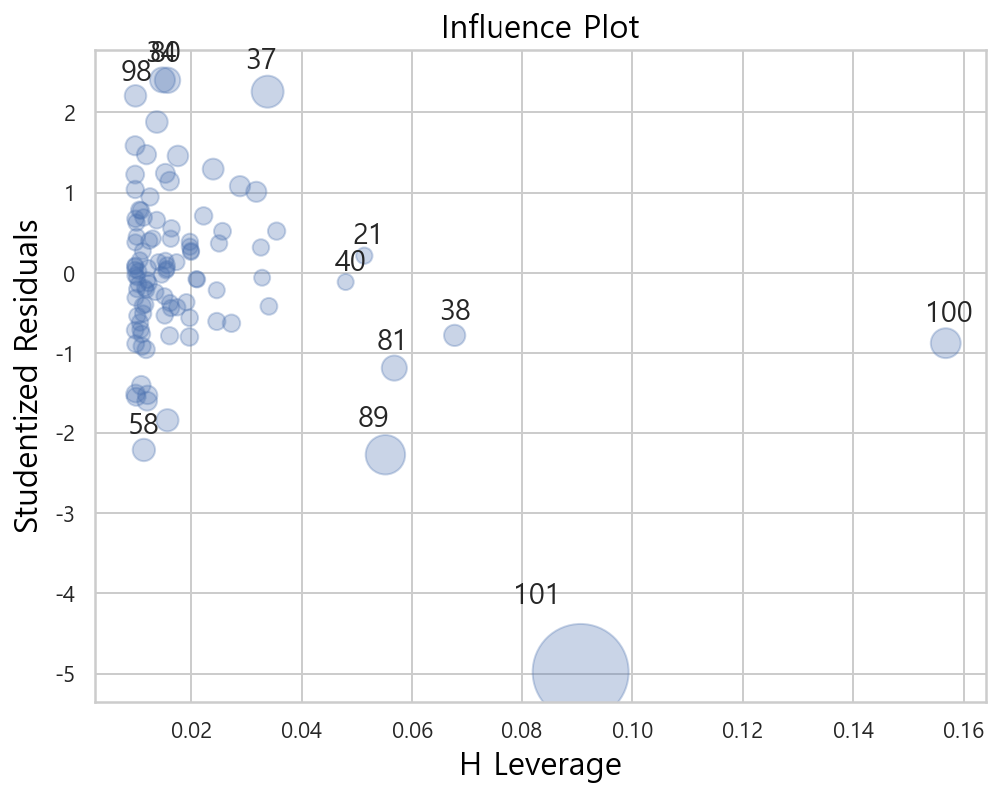

In [131]:
plt.figure(figsize=(8, 6))
ax = plt.subplot()
sm.graphics.influence_plot(result, plot_alpha=0.3, ax=ax)
plt.show() ; 

In [132]:
from statsmodels.graphics import utils

In [133]:
cooks_d2, pvals = influence.cooks_distance

In [134]:
cooks_d2

array([2.16000988e-03, 4.22341642e-04, 4.66327219e-03, 2.40265790e-02,
       1.72975310e-02, 2.57110878e-06, 1.46187360e-03, 1.06555613e-02,
       1.72049320e-03, 2.11472589e-04, 2.08861459e-05, 5.68947774e-03,
       4.60980279e-03, 2.64449872e-02, 5.80796481e-04, 3.54186637e-06,
       1.47997811e-03, 1.39757537e-02, 4.99794666e-03, 2.03869419e-02,
       9.15599351e-04, 1.26912358e-03, 6.49133537e-04, 7.28832195e-04,
       1.01732718e-03, 1.52298165e-03, 4.78691283e-04, 2.68107719e-04,
       5.77064963e-03, 1.62639223e-03, 4.77921666e-05, 7.05558610e-04,
       8.43815871e-06, 1.85884423e-04, 4.13175489e-02, 3.03377224e-03,
       1.53280335e-02, 8.56457535e-02, 2.19465551e-02, 1.15236022e-03,
       3.16693207e-04, 5.50861521e-03, 1.29663630e-03, 1.09070156e-03,
       5.40759364e-03, 7.87182978e-06, 7.41302593e-03, 3.13347731e-03,
       1.03475017e-04, 9.39786637e-04, 1.06725791e-02, 3.31927406e-05,
       1.28885064e-02, 1.52074992e-05, 2.59061535e-03, 1.22490866e-03,
      

In [135]:
pvals

array([0.99784237, 0.99957775, 0.9953478 , 0.9762654 , 0.98285415,
       0.99999743, 0.99853922, 0.98940213, 0.99828102, 0.99978855,
       0.99997911, 0.994327  , 0.99540102, 0.97390843, 0.99941938,
       0.99999646, 0.99852114, 0.98612338, 0.99501477, 0.97982354,
       0.99908483, 0.9987317 , 0.99935108, 0.99927144, 0.9989832 ,
       0.9984782 , 0.99952143, 0.99973193, 0.9942463 , 0.99837496,
       0.99995221, 0.9992947 , 0.99999156, 0.99981413, 0.95954076,
       0.99697092, 0.98479116, 0.9179866 , 0.97829723, 0.99884832,
       0.99968336, 0.99450683, 0.99870422, 0.9989099 , 0.99460729,
       0.99999213, 0.99261493, 0.99687152, 0.99989653, 0.99906066,
       0.9893853 , 0.99996681, 0.98719583, 0.99998479, 0.9974128 ,
       0.99877586, 0.99993045, 0.99667054, 0.97316514, 0.99961223,
       0.99669113, 0.99748573, 0.98140669, 0.99986057, 0.99895249,
       0.9964329 , 0.99995535, 0.9999387 , 0.98817549, 0.99824347,
       0.99695036, 0.9967782 , 0.98338372, 0.99997481, 0.99841

In [136]:
K = influence.k_vars
K

2

In [137]:
fox_cr = 4 / (len(y) - K - 1)
fox_cr

0.04040404040404041

In [139]:
idx = np.where(cooks_d2 > fox_cr)[0]
idx

array([ 34,  37,  80,  81,  89, 100, 101], dtype=int64)

In [140]:
test_idx = np.where(abs(result.resid_pearson) > 4)
test_idx

(array([101], dtype=int64),)

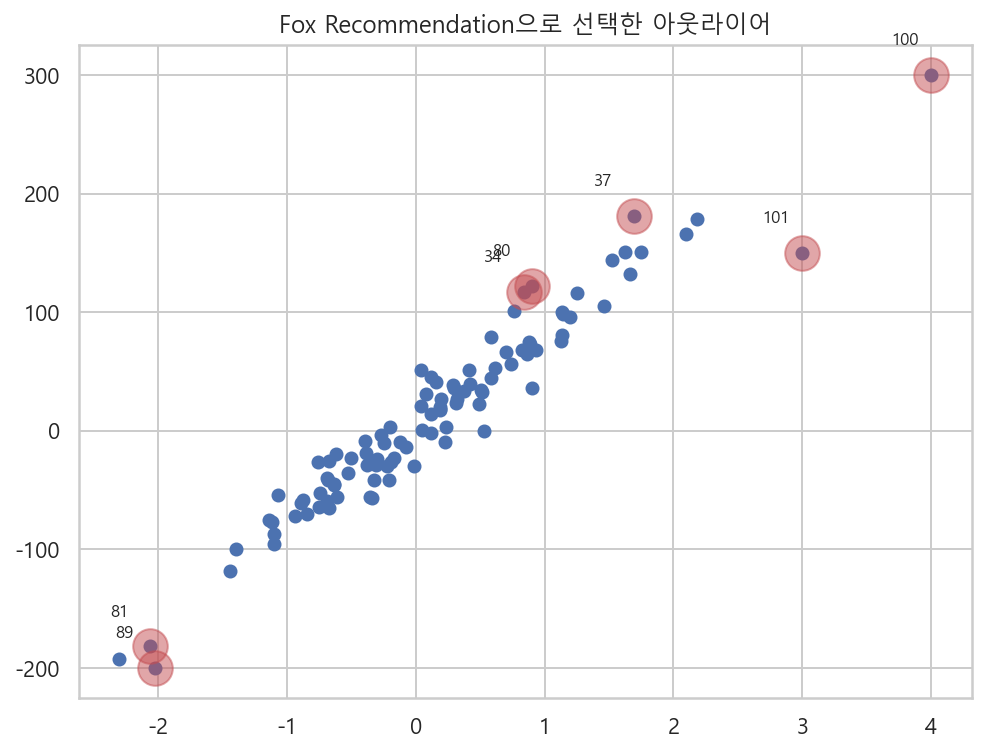

In [143]:
plt.figure(figsize=(8, 6))
ax = plt.subplot()
plt.scatter(X0, y)
plt.scatter(X0[idx], y[idx], s=300, c="r", alpha=0.5)
utils.annotate_axes(range(len(idx)), idx,
                   list(zip(X0[idx], y[idx])), [(-20, 15)] * len(idx), size="small",
                   ax=ax)
plt.title("Fox Recommendation으로 선택한 아웃라이어")
plt.show() ; 

In [141]:
range(len(idx))

range(0, 7)

In [144]:
[(-20, 15)] * len(idx)

[(-20, 15), (-20, 15), (-20, 15), (-20, 15), (-20, 15), (-20, 15), (-20, 15)]

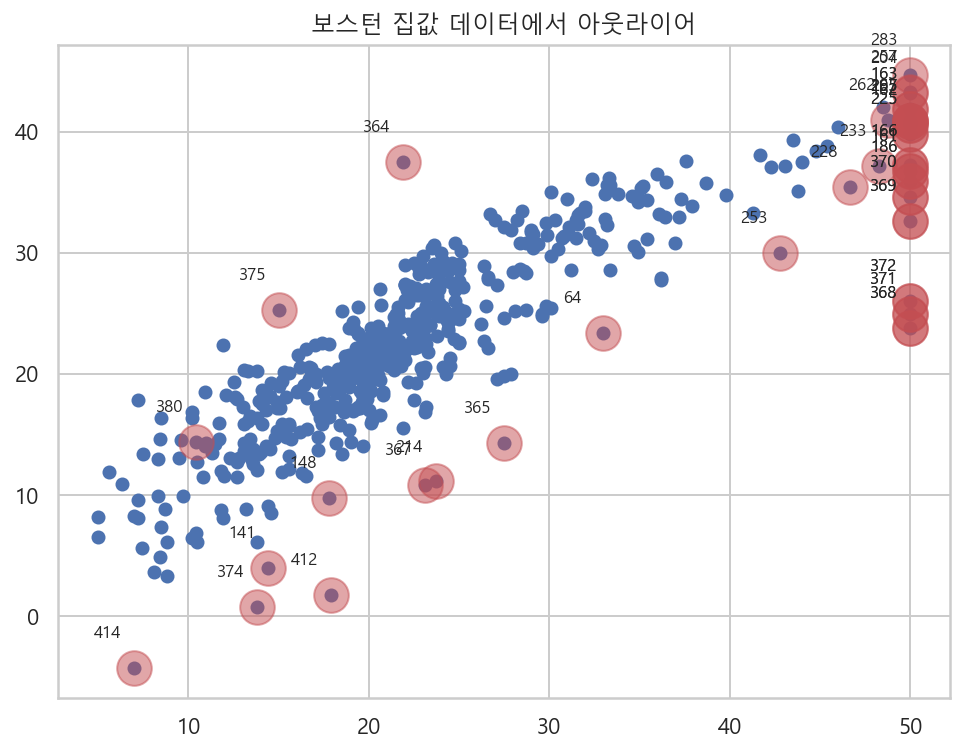

In [149]:
from sklearn.datasets import load_boston

boston = load_boston()

dfX0 = pd.DataFrame(boston.data, columns=boston.feature_names)
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])

model_boston = sm.OLS(dfy, dfX)
result_boston = model_boston.fit()
pred = result_boston.predict(dfX)

influence_boston = result_boston.get_influence()
cooks_d2, pvals = influence_boston.cooks_distance
K = influence_boston.k_vars
fox_cr = 4 / (len(dfy) - K - 1)
idx = np.where(cooks_d2 > fox_cr)[0]

idx = np.hstack([idx, np.where(boston.target == 50)[0]])

plt.figure(figsize=(8, 6))
ax = plt.subplot()
plt.scatter(dfy, pred)
plt.scatter(dfy.MEDV[idx], pred[idx], s=300, c="r", alpha=0.5)
utils.annotate_axes(range(len(idx)), idx,
                   list(zip(dfy.MEDV[idx], pred[idx])), [(-20, 15)] * len(idx),
                   size="small", ax=ax)
plt.title("보스턴 집값 데이터에서 아웃라이어")
plt.show() ; 

In [147]:
influence.k_vars

2

In [148]:
influence_boston.k_vars

14

In [150]:
idx2 = list(set(range(len(dfX))).difference(idx))

dfX = dfX.iloc[idx2, :].reset_index(drop=True)
dfy = dfy.iloc[idx2, :].reset_index(drop=True)

model_boston2 = sm.OLS(dfy, dfX)
result_boston2 = model_boston2.fit()

print(result_boston2.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.825
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     167.4
Date:                Sat, 03 Sep 2022   Prob (F-statistic):          5.38e-165
Time:                        15:05:10   Log-Likelihood:                -1217.1
No. Observations:                 474   AIC:                             2462.
Df Residuals:                     460   BIC:                             2520.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         22.0998      3.986      5.544      0.0

In [151]:
print(result_boston.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Sat, 03 Sep 2022   Prob (F-statistic):          6.72e-135
Time:                        15:13:23   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         36.4595      5.103      7.144      0.0

## 분산분석

In [1]:
from sklearn.datasets import make_regression

In [2]:
X0, y, coef = make_regression(n_samples=100, n_features=1, noise=30,
                             coef=True, random_state=0)

In [3]:
dfX0 = pd.DataFrame(X0, columns=["X"])
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(y, columns=["Y"])
df = pd.concat([dfX, dfy], axis=1)

In [4]:
df.head()

,const,X,Y
0,1.0,-0.359553,-29.387972
1,1.0,0.976639,-18.771359
2,1.0,0.402342,0.563777
3,1.0,-0.813146,19.905024
4,1.0,-0.887786,-31.843421


In [5]:
model = sm.OLS.from_formula("Y ~ X", data=df)
result = model.fit()

In [18]:
print("TSS = ", result.uncentered_tss)
print("TSS =  %5.5f" % result.uncentered_tss)
print("ESS = ", result.mse_model)
print("RSS = ", result.ssr)
print("TSS = ESS + RSS = ", result.mse_model + result.ssr)
print("R square = ", result.rsquared)

TSS =  291345.7578983061
TSS =  291345.75790
ESS =  188589.61349210917
RSS =  102754.33755137534
TSS = ESS + RSS =  291343.9510434845
R square =  0.6473091780922585


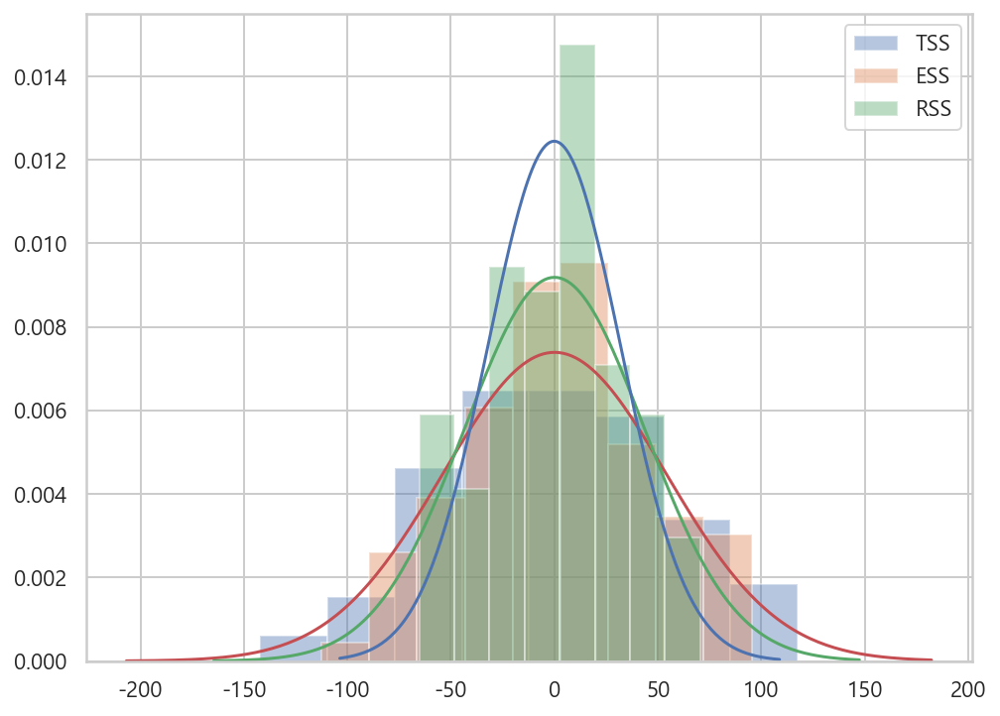

In [21]:
%matplotlib inline

plt.figure(figsize=(8, 6))

sns.distplot(y, kde=False, fit=sp.stats.norm,
            hist={"color":"r", "alpha":0.2}, fit_kws={"color":"r"}, label="TSS")
sns.distplot(result.fittedvalues, kde=False, fit=sp.stats.norm,
            hist={"color":"g", "alpha":0.2}, fit_kws={"color":"g"}, label="ESS")
sns.distplot(result.resid, kde=False, fit=sp.stats.norm,
            hist={"color":"b", "alpha":0.2}, fit_kws={"color":"b"}, label="RSS")

plt.legend()
plt.show() ;

In [22]:
result.fittedvalues

0    -17.934714
1     39.638175
2     14.893262
3    -37.478808
4    -40.694820
        ...    
95   -52.645684
96   -18.072076
97    12.912314
98   -71.981016
99   -53.312776
Length: 100, dtype: float64

In [23]:
result.resid

0    -11.453259
1    -58.409534
2    -14.329485
3     57.383832
4      8.851398
        ...    
95     6.090249
96    47.418766
97    -7.768456
98    50.498218
99   -12.863933
Length: 100, dtype: float64

In [24]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      Y   R-squared:                       0.647
Model:                            OLS   Adj. R-squared:                  0.644
Method:                 Least Squares   F-statistic:                     179.9
Date:                Thu, 08 Sep 2022   Prob (F-statistic):           6.60e-24
Time:                        10:41:20   Log-Likelihood:                -488.64
No. Observations:                 100   AIC:                             981.3
Df Residuals:                      98   BIC:                             986.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.4425      3.244     -0.753      0.4

In [25]:
sm.stats.anova_lm(result)

,df,sum_sq,mean_sq,F,PR(>F)
X,1.0,188589.613492,188589.613492,179.863766,6.601482e-24
Residual,98.0,102754.337551,1048.513648,NaN,NaN


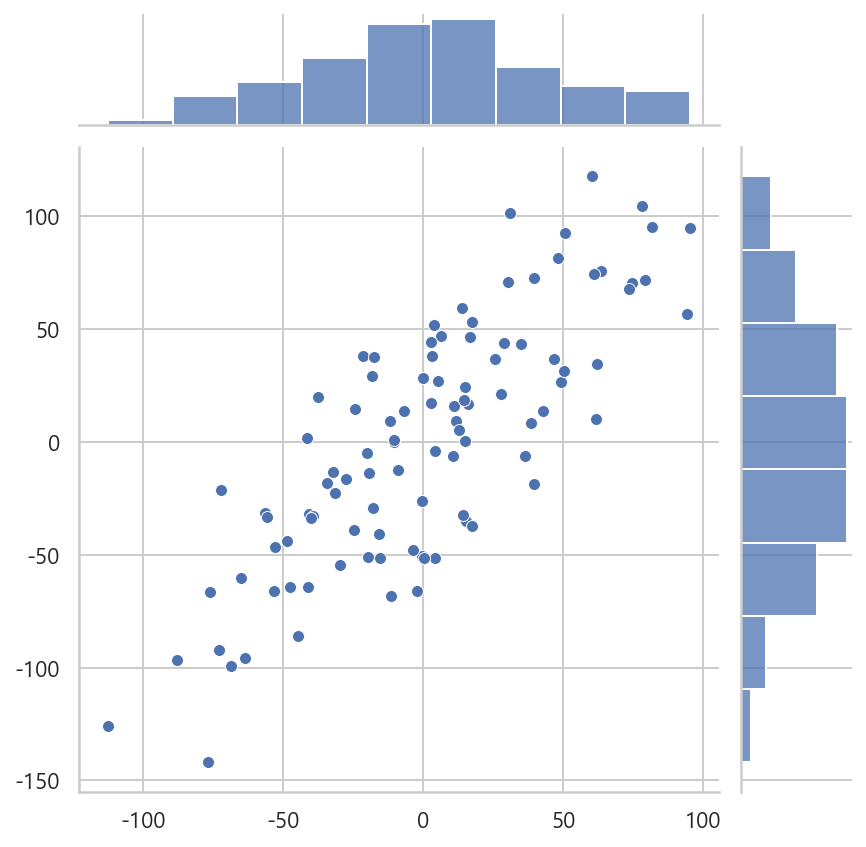

In [31]:
sns.jointplot(result.fittedvalues, y)
plt.show() ;

In [36]:
X0, y, coef = make_regression(n_samples=100, n_features=1, noise=30, bias=100,
                              coef=True, random_state=0)
dfX = pd.DataFrame(X0, columns=["X"])
dfy = pd.DataFrame(y, columns=["Y"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,X,Y
0,-0.359553,70.612028
1,0.976639,81.228641
2,0.402342,100.563777
3,-0.813146,119.905024
4,-0.887786,68.156579


In [37]:
model2 = sm.OLS.from_formula("Y ~ X + 0", data=df)
result2 = model2.fit()

In [38]:
result2.rsquared

0.1876872470594393

In [39]:
result.rsquared

0.6473091780922585

In [42]:
from sklearn.datasets import load_boston

boston = load_boston()
dfX0_boston = pd.DataFrame(boston.data, columns=boston.feature_names)
dfX_boston = sm.add_constant(dfX0_boston)
dfy_boston = pd.DataFrame(boston.target, columns=["MEDV"])
df_boston = pd.concat([dfX_boston, dfy_boston], axis=1)
df_boston.head()

,const,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,1.0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,1.0,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,1.0,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,1.0,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,1.0,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [44]:
"MEDV ~ " + "+".join(boston.feature_names)

'MEDV ~ CRIM+ZN+INDUS+CHAS+NOX+RM+AGE+DIS+RAD+TAX+PTRATIO+B+LSTAT'

In [58]:
col_reduced = list(set(boston.feature_names).difference(set(["INDUS", "AGE"])))
col_reduced

['PTRATIO',
 'ZN',
 'DIS',
 'RM',
 'RAD',
 'CHAS',
 'NOX',
 'B',
 'LSTAT',
 'TAX',
 'CRIM']

In [61]:
model_full = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names),
                                 df_boston)
model_reduced = sm.OLS.from_formula("MEDV ~ " + "+".join(col_reduced),
                                   df_boston)

sm.stats.anova_lm(model_reduced.fit(), model_full.fit())

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,494.0,11081.363952,0.0,NaN,NaN,NaN
1,492.0,11078.784578,2.0,2.579374,0.057274,0.944342


In [62]:
model_full = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names),
                                df_boston)
model_reduced = sm.OLS.from_formula("MEDV ~ " + "+".join(
list(set(boston.feature_names).difference(set(["CRIM"])))), df_boston)

In [64]:
sm.stats.anova_lm(model_reduced.fit(), model_full.fit())

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,493.0,11322.004277,0.0,NaN,NaN,NaN
1,492.0,11078.784578,1.0,243.219699,10.801193,0.001087


In [69]:
model_boston = sm.OLS.from_formula(
"MEDV ~ " + "+".join(boston.feature_names), df_boston)
result_boston = model_boston.fit()

sm.stats.anova_lm(result_boston, typ=2)

,sum_sq,df,F,PR(>F)
CRIM,243.219699,1.0,10.801193,1.086810e-03
ZN,257.492979,1.0,11.435058,7.781097e-04
INDUS,2.516668,1.0,0.111763,7.382881e-01
CHAS,218.970357,1.0,9.724299,1.925030e-03
NOX,487.155674,1.0,21.634196,4.245644e-06
RM,1871.324082,1.0,83.104012,1.979441e-18
AGE,0.061834,1.0,0.002746,9.582293e-01
DIS,1232.412493,1.0,54.730457,6.013491e-13
RAD,479.153926,1.0,21.278844,5.070529e-06
TAX,242.257440,1.0,10.758460,1.111637e-03


In [67]:
print(result_boston.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Thu, 08 Sep 2022   Prob (F-statistic):          6.72e-135
Time:                        11:18:57   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     36.4595      5.103      7.144      0.0

In [70]:
df_anova = sm.stats.anova_lm(result_boston, typ=2)
df_anova

,sum_sq,df,F,PR(>F)
CRIM,243.219699,1.0,10.801193,1.086810e-03
ZN,257.492979,1.0,11.435058,7.781097e-04
INDUS,2.516668,1.0,0.111763,7.382881e-01
CHAS,218.970357,1.0,9.724299,1.925030e-03
NOX,487.155674,1.0,21.634196,4.245644e-06
RM,1871.324082,1.0,83.104012,1.979441e-18
AGE,0.061834,1.0,0.002746,9.582293e-01
DIS,1232.412493,1.0,54.730457,6.013491e-13
RAD,479.153926,1.0,21.278844,5.070529e-06
TAX,242.257440,1.0,10.758460,1.111637e-03


In [75]:
df_anova.iloc[:, 3]["INDUS"]

0.738288071404785

## 모형진단과 수정

In [76]:
def make_regression2(n_samples=100, bias=0, noise=0.3, random_state=0) : 
    np.random.seed(random_state)
    x = np.random.rand(n_samples) * 4
    epsilon = noise * np.random.randn(n_samples)
    y = x ** 2 + bias + epsilon
    return x, y

In [77]:
x2, y2 = make_regression2()

In [78]:
x2

array([2.19525402, 2.86075747, 2.4110535 , 2.17953273, 1.6946192 ,
       2.58357645, 1.75034885, 3.567092  , 3.85465104, 1.53376608,
       3.16690015, 2.11557968, 2.27217824, 3.70238655, 0.28414423,
       0.3485172 , 0.08087359, 3.33047938, 3.112627  , 3.48004859,
       3.91447337, 3.19663426, 1.84591745, 3.12211671, 0.4730977 ,
       2.55968409, 0.57341315, 3.77867567, 2.08739329, 1.65864776,
       1.05822245, 3.09693476, 1.82460133, 2.2737358 , 0.0751592 ,
       2.47054199, 2.44838289, 2.46773599, 3.77499231, 2.7272812 ,
       1.4380316 , 1.74812782, 2.79052478, 0.24090189, 2.66706686,
       2.68255148, 0.84153024, 0.51570519, 1.2617134 , 1.45484308,
       2.28078708, 1.75440605, 3.95349535, 0.40817924, 0.83550702,
       0.64523807, 2.6124333 , 1.01316641, 1.86524309, 0.97770237,
       0.63587833, 0.44150056, 2.62531836, 0.55273181, 0.78632945,
       1.47490068, 3.28397292, 0.3884051 , 3.35177963, 0.38439363,
       3.90583786, 1.87460481, 3.90704435, 2.41938208, 2.95705

In [79]:
y2

array([ 4.46959524e+00,  8.45418122e+00,  5.95287773e+00,  4.28948982e+00,
        3.31820988e+00,  7.24363404e+00,  3.41735495e+00,  1.26701679e+01,
        1.45371089e+01,  2.66877389e+00,  9.90830349e+00,  4.84241090e+00,
        5.22527647e+00,  1.40006579e+01,  1.87647864e-01,  3.33436188e-01,
        9.69054374e-03,  1.16278541e+01,  9.72652049e+00,  1.22313350e+01,
        1.58880470e+01,  9.81414285e+00,  3.02626573e+00,  1.00384317e+01,
       -1.28115585e-01,  7.13506897e+00,  2.04716946e-01,  1.40541534e+01,
        4.93409334e+00,  3.19526683e+00,  1.68010244e+00,  9.86281829e+00,
        3.07080230e+00,  5.74289395e+00, -7.47521057e-02,  6.34431463e+00,
        6.27875437e+00,  6.04321788e+00,  1.44347908e+01,  7.71472473e+00,
        2.18086255e+00,  2.72613062e+00,  7.87650002e+00,  4.55949488e-01,
        6.90487529e+00,  7.15119207e+00,  5.77627087e-01,  8.20730962e-01,
        1.79360914e+00,  2.23880695e+00,  4.97101489e+00,  3.23971536e+00,
        1.54278257e+01,  

<AxesSubplot:ylabel='Density'>

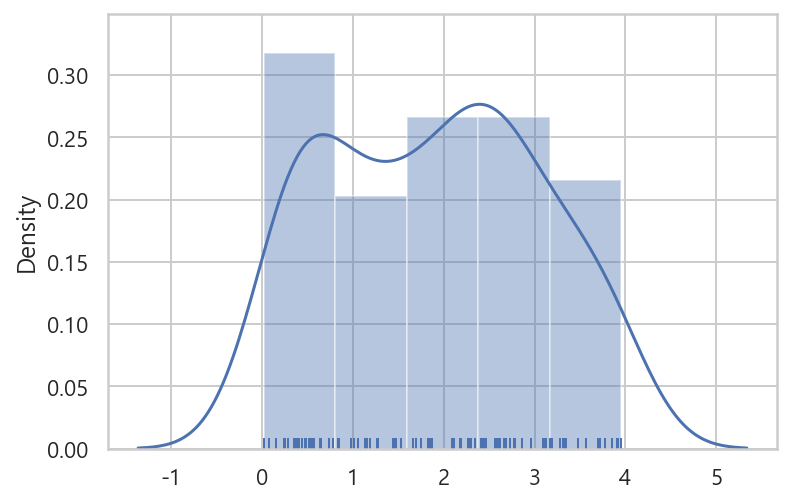

In [84]:
sns.distplot(x2, kde=True, rug=True)

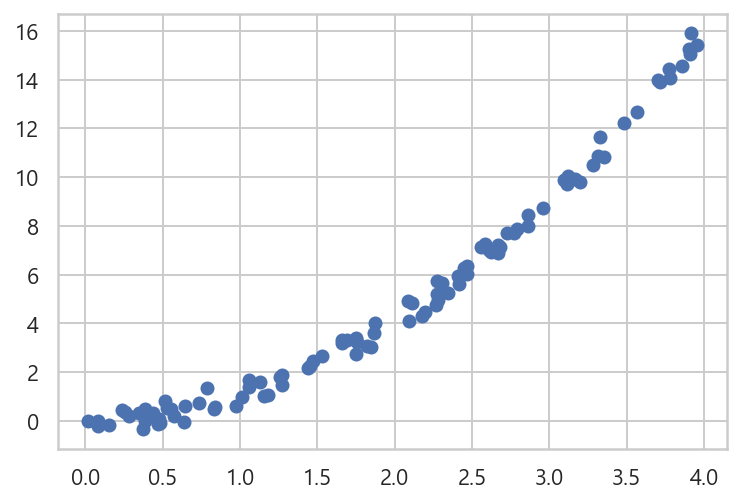

In [86]:
plt.scatter(x2, y2)
plt.show() ;

In [87]:
dfX20 = pd.DataFrame(x2, columns=["X1"])
dfX2 = sm.add_constant(dfX20)
dfy2 = pd.DataFrame(y2, columns=["y"])

model2 = sm.OLS(dfy2, dfX2)
result2 = model2.fit()

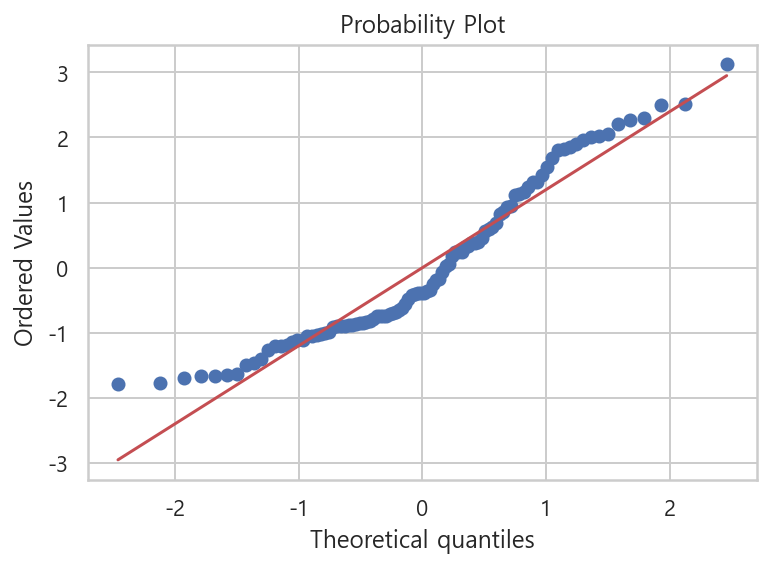

In [88]:
sp.stats.probplot(result2.resid, plot=plt)
plt.show() ; 

In [90]:
test = sm.stats.omni_normtest(result2.resid)

for xi in zip(["Chi^2", "P-value"], test) : 
    print("%-12s = %6.3f" % xi)

Chi^2        =  9.520
P-value      =  0.009


In [98]:
def make_regression3(n_samples=100, bias=0, noise=0.5, random_state=0) : 
    np.random.seed(random_state)
    x = np.random.rand(n_samples) * 3 - 1
    epsilon = noise * np.random.randn(n_samples)
    y = x ** 2 + bias + epsilon
    return x, y

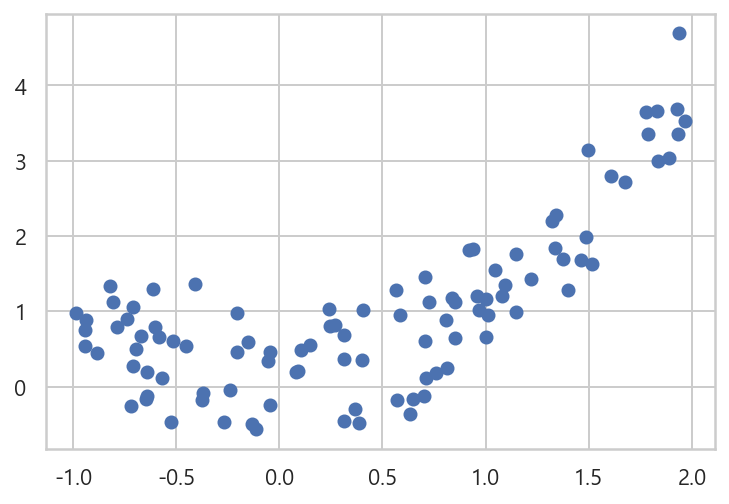

In [100]:
x3, y3 = make_regression3()
plt.scatter(x3, y3)
plt.show() ; 

In [101]:
dfX30 = pd.DataFrame(x3, columns=["X1"])
dfX3 = sm.add_constant(dfX30)
dfy = pd.DataFrame(y3, columns=["y"])

model3 = sm.OLS(dfy, dfX3)
result3 = model3.fit()

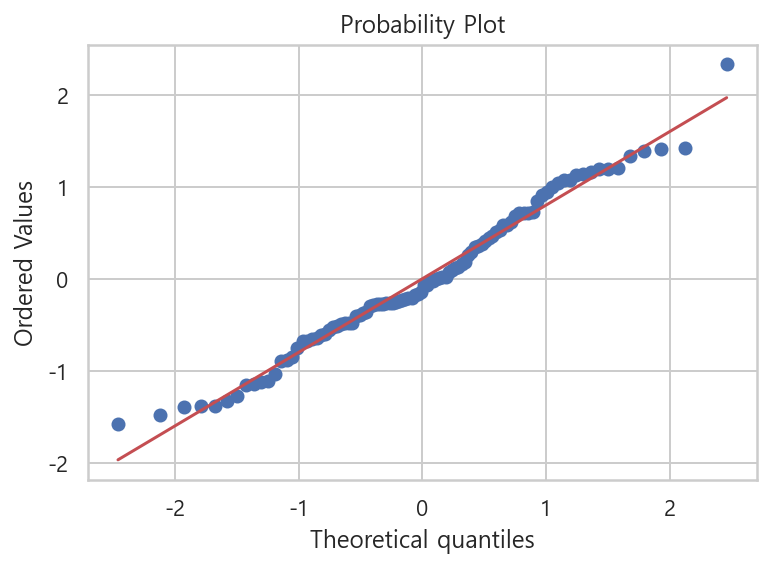

In [102]:
sp.stats.probplot(result3.resid, plot=plt)
plt.show() ; 

In [103]:
test3 = sm.stats.omni_normtest(result3.resid)

for xi in zip(["Chi^2", "P-value"], test3) :
    print("%-12s = %6.3f" % xi)

Chi^2        =  1.202
P-value      =  0.548


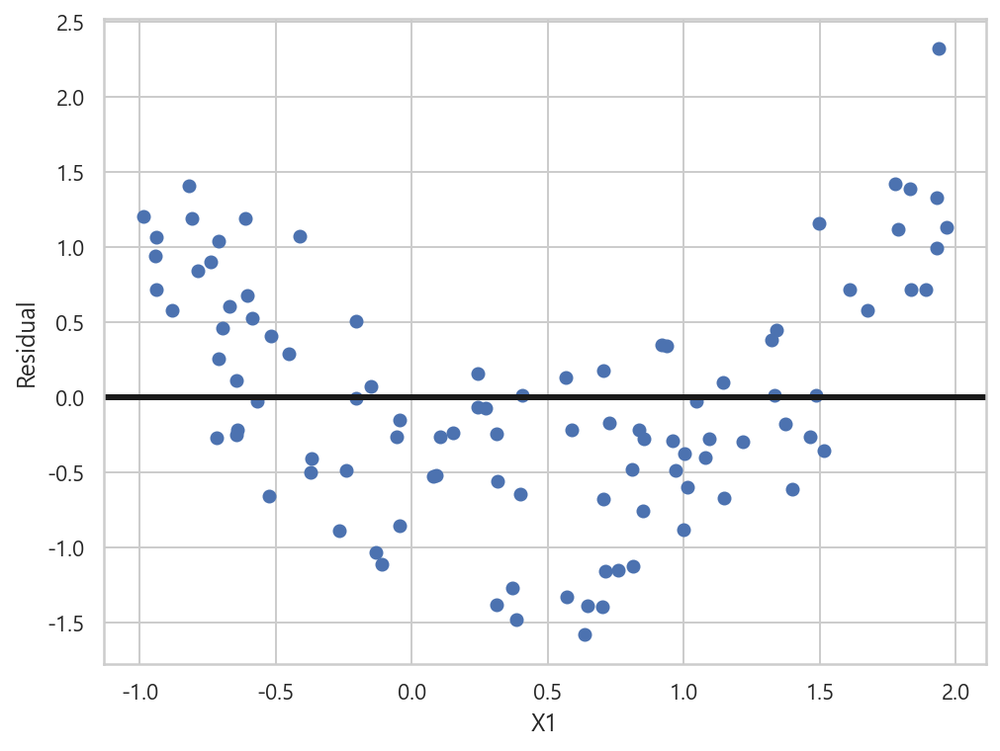

In [108]:
plt.figure(figsize=(8, 6))
plt.plot(x3, result3.resid, "o")
plt.axhline(y=0, c="k", lw=3)
plt.xlabel("X1")
plt.ylabel("Residual")
plt.show() ; 

## 이분산성

In [109]:
from sklearn.datasets import load_diabetes

In [111]:
diabetes = load_diabetes()
df = pd.concat([pd.DataFrame(diabetes.data,
                columns=["x%d" % (i + 1) for i in range(diabetes.data.shape[1])]),
                pd.DataFrame(diabetes.target, columns=["target"])], axis=1)
df.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,target
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019908,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068330,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005671,-0.045599,-0.034194,-0.032356,-0.002592,0.002864,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022692,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031991,-0.046641,135.0


In [114]:
diabetes.data.shape[1]

10

In [115]:
["x%d" % (i+1) for i in range(diabetes.data.shape[1])]

['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10']

In [116]:
["x%d" % (i+1) for i in range(diabetes.data.shape[1])]

['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10']

In [117]:
model = sm.OLS.from_formula("target ~ x9", data=df)
result = model.fit()

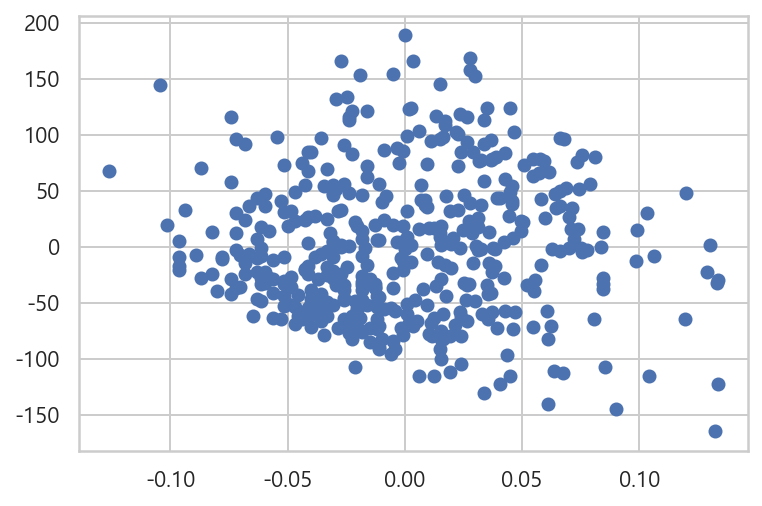

In [118]:
plt.scatter(df["x9"], result.resid)
plt.show() ; 

In [119]:
df["x9"]

0      0.019908
1     -0.068330
2      0.002864
3      0.022692
4     -0.031991
         ...   
437    0.031193
438   -0.018118
439   -0.046879
440    0.044528
441   -0.004220
Name: x9, Length: 442, dtype: float64

In [120]:
result.resid

0     -19.372359
1     -14.533960
2     -13.757095
3      33.077475
4      12.175117
         ...    
437    -2.710591
438   -31.534638
439    22.814625
440    27.072348
441   -91.267507
Length: 442, dtype: float64

In [121]:
from sklearn.datasets import load_boston

boston = load_boston()
dfX = pd.DataFrame(boston.data, columns=boston.feature_names)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


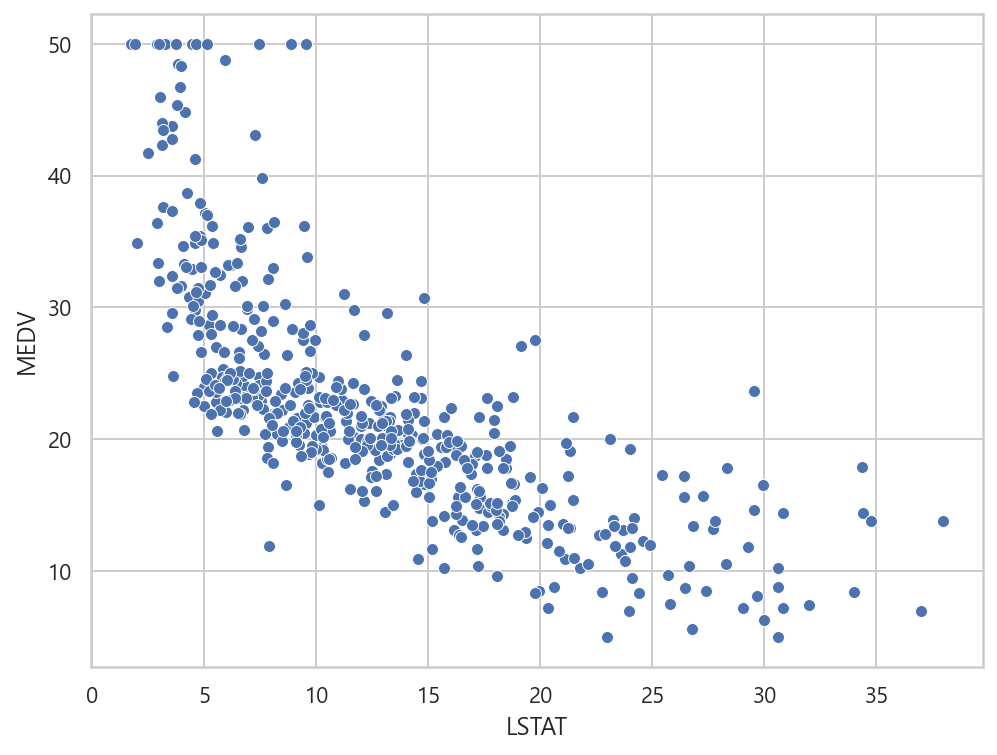

In [123]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x="LSTAT", y="MEDV", data=df)
plt.show() ; 

In [124]:
model1 = sm.OLS.from_formula("MEDV ~ LSTAT", data=df)
result1 = model1.fit()

In [125]:
print(result1.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.544
Model:                            OLS   Adj. R-squared:                  0.543
Method:                 Least Squares   F-statistic:                     601.6
Date:                Thu, 08 Sep 2022   Prob (F-statistic):           5.08e-88
Time:                        15:47:43   Log-Likelihood:                -1641.5
No. Observations:                 506   AIC:                             3287.
Df Residuals:                     504   BIC:                             3295.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     34.5538      0.563     61.415      0.0

In [126]:
y_hat1 = result1.predict(df)
df1 = pd.concat([y_hat1, df.LSTAT], axis=1).sort_values("LSTAT")
df1

,0,LSTAT
161,32.910255,1.73
162,32.729746,1.92
40,32.672743,1.98
232,32.207219,2.47
192,31.827199,2.87
...,...,...
412,1.900645,34.37
141,1.862643,34.41
373,1.520625,34.77
414,-0.578984,36.98


In [136]:
df1.columns = ["Prediction", "LSTAT"]
df1.head()

,Prediction,LSTAT
161,32.910255,1.73
162,32.729746,1.92
40,32.672743,1.98
232,32.207219,2.47
192,31.827199,2.87


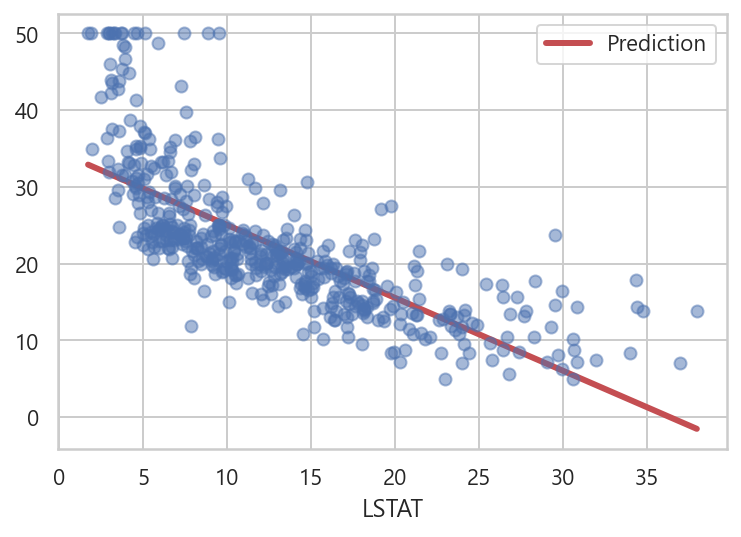

In [137]:
df1.plot(x="LSTAT", style="r-", lw=3)
plt.plot(df.LSTAT, df.MEDV, "bo", alpha=0.5)
plt.show() ; 

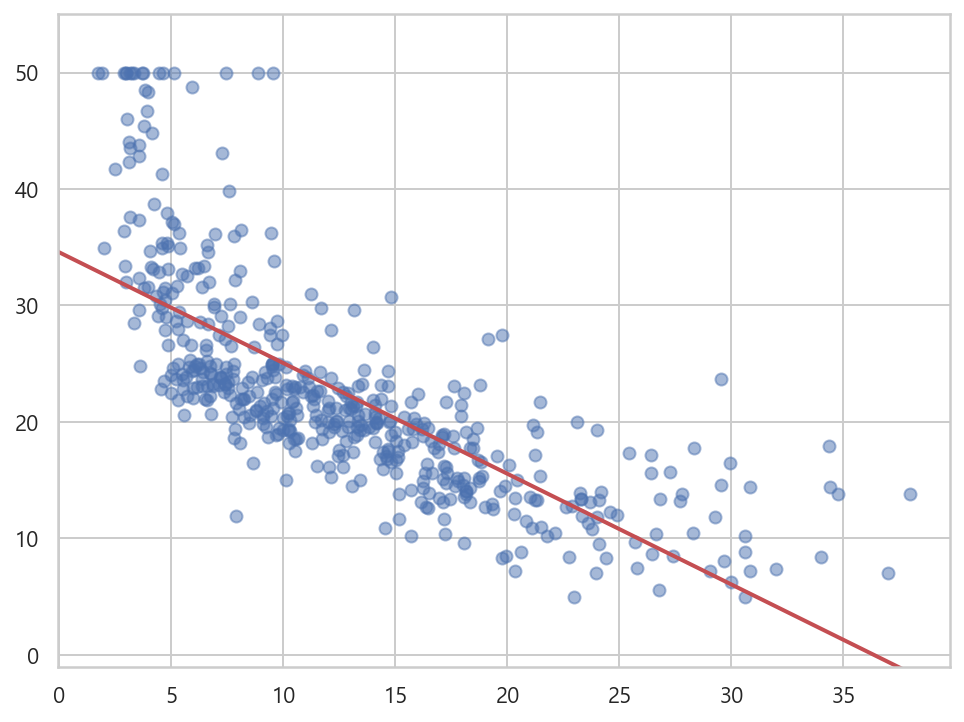

In [135]:
plt.figure(figsize=(8, 6))
ax = plt.subplot()
plt.scatter(df.LSTAT, df.MEDV, alpha=0.5)
sm.graphics.abline_plot(model_results=result1, c="r", linestyle="-", lw=2, ax=ax)
plt.ylim(-1, 55)
plt.show() ;  

In [138]:
model2 = sm.OLS.from_formula("MEDV ~ LSTAT + I(LSTAT ** 2)", data=df)
result2 = model2.fit()
print(result2.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.641
Model:                            OLS   Adj. R-squared:                  0.639
Method:                 Least Squares   F-statistic:                     448.5
Date:                Thu, 08 Sep 2022   Prob (F-statistic):          1.56e-112
Time:                        15:57:12   Log-Likelihood:                -1581.3
No. Observations:                 506   AIC:                             3169.
Df Residuals:                     503   BIC:                             3181.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        42.8620      0.872     49.149

In [139]:
print("result1 : R^2 = ", result1.rsquared)
print("result2 : R^2 = ", result2.rsquared)

result1 : R^2 =  0.5441462975864799
result2 : R^2 =  0.6407168971636612


In [143]:
result2.aic, result2.bic

(3168.5159568137046, 3181.195566821567)

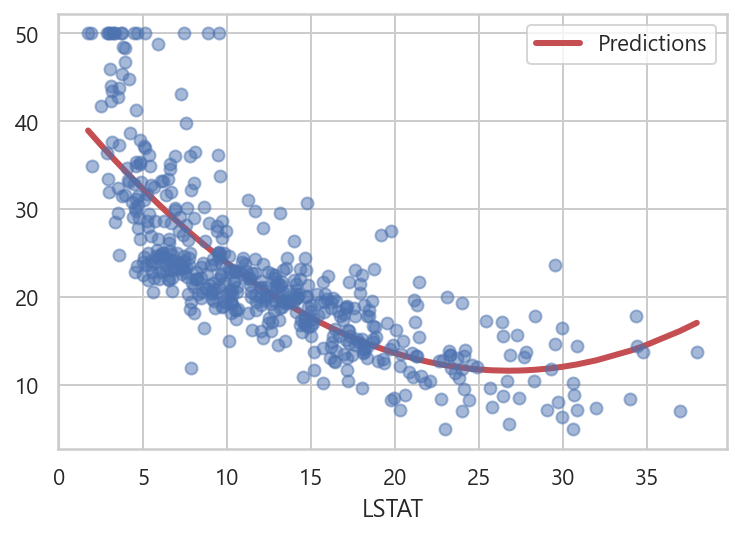

In [140]:
y_hat2 = result2.predict(df)
df2 = pd.concat([y_hat2, df.LSTAT], axis=1).sort_values("LSTAT")
df2.columns = ["Predictions", "LSTAT"]

df2.plot(x="LSTAT", style="r-", lw=3)
plt.plot(df.LSTAT, df.MEDV, "bo", alpha=0.5)
plt.show() ; 

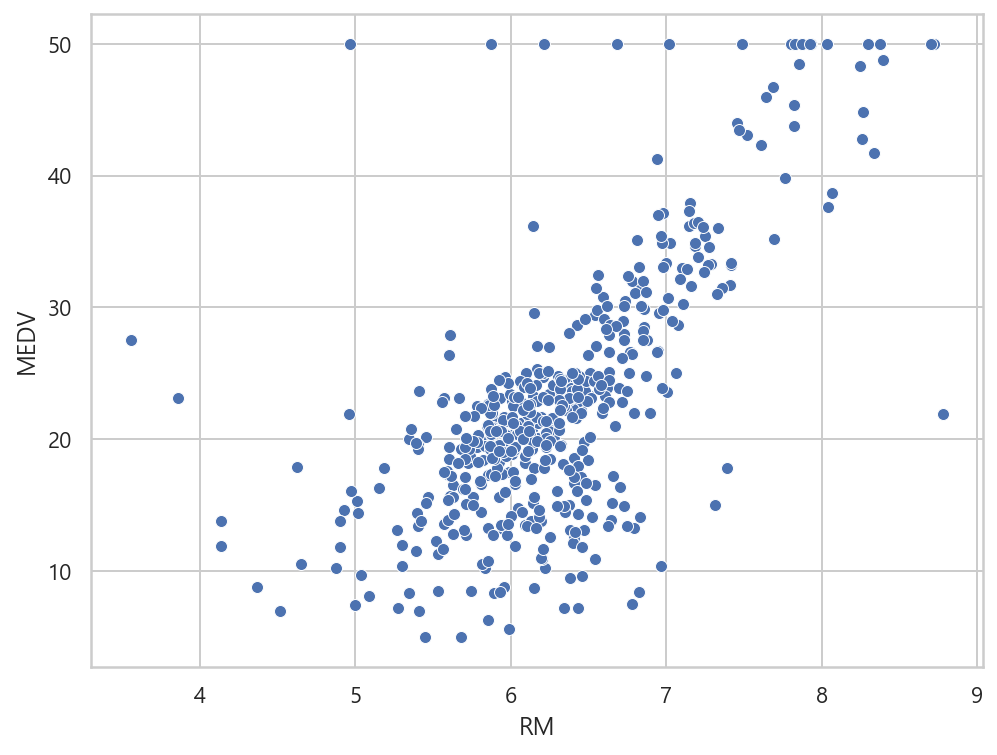

In [145]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x="RM", y="MEDV", data=df)
plt.show() ; 

In [147]:
model3 = sm.OLS.from_formula("MEDV ~ RM", data=df)
result3 = model3.fit()
print(result3.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.484
Model:                            OLS   Adj. R-squared:                  0.483
Method:                 Least Squares   F-statistic:                     471.8
Date:                Thu, 08 Sep 2022   Prob (F-statistic):           2.49e-74
Time:                        16:19:51   Log-Likelihood:                -1673.1
No. Observations:                 506   AIC:                             3350.
Df Residuals:                     504   BIC:                             3359.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -34.6706      2.650    -13.084      0.0

In [149]:
df.RM[:10]

0    6.575
1    6.421
2    7.185
3    6.998
4    7.147
5    6.430
6    6.012
7    6.172
8    5.631
9    6.004
Name: RM, dtype: float64

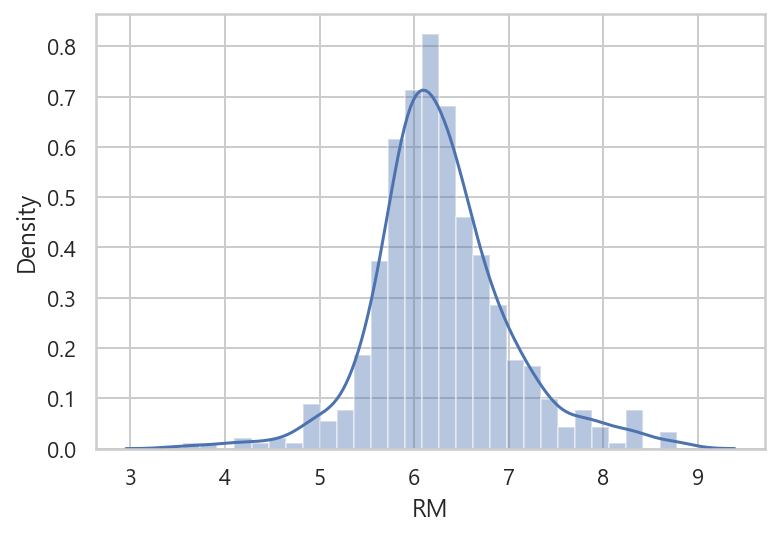

In [150]:
sns.distplot(df.RM)
plt.show() ; 

In [151]:
df.RM.max()

8.78

In [152]:
df.RM.min()

3.561

In [153]:
rooms = np.arange(3, 10)
labels = [str(r) for r in rooms[:-1]]
df["CAT_RM"] = np.round(df.RM)
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,CAT_RM
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0,7.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6,6.0
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7,7.0
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4,7.0
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2,7.0


In [155]:
len(df.loc[df.MEDV == 50])

16

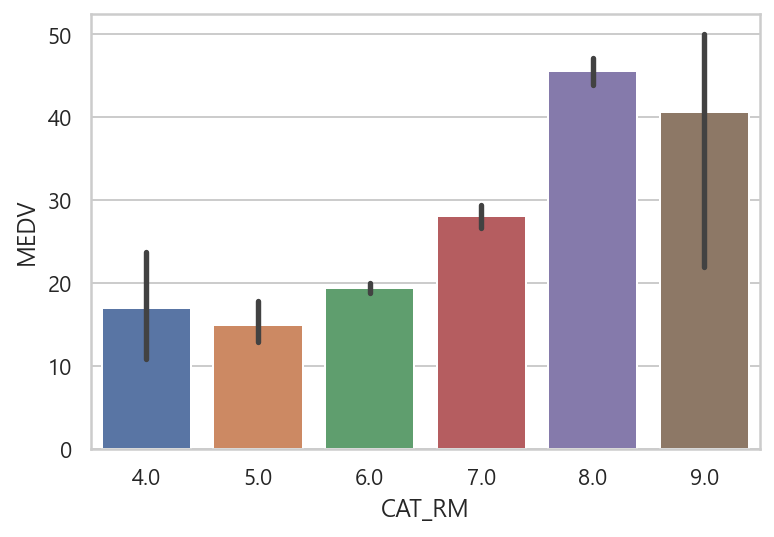

In [156]:
sns.barplot(x="CAT_RM", y="MEDV", data=df)
plt.show() ; 

In [157]:
model4 = sm.OLS.from_formula("MEDV ~ C(np.round(RM))", data=df)
result4 = model4.fit()
print(result4.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.537
Model:                            OLS   Adj. R-squared:                  0.532
Method:                 Least Squares   F-statistic:                     115.8
Date:                Thu, 08 Sep 2022   Prob (F-statistic):           3.57e-81
Time:                        16:26:01   Log-Likelihood:                -1645.6
No. Observations:                 506   AIC:                             3303.
Df Residuals:                     500   BIC:                             3329.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 17

In [160]:
data = sm.datasets.get_rdataset("elecdaily", package="fpp2")
data

<class 'statsmodels.datasets.utils.Dataset'>

In [162]:
df_elec = pd.DataFrame(data.data)
df_elec

,Demand,WorkDay,Temperature
0,174.896295,0,26.0
1,188.590935,1,23.0
2,188.916891,1,22.2
3,173.814244,0,20.3
4,169.515175,0,26.1
...,...,...,...
360,173.727990,0,22.2
361,188.512817,0,31.2
362,191.273009,1,26.2
363,186.240144,1,24.4


In [167]:
df_elec = data.data.drop(columns=["WorkDay", "Temperature"])
df_elec["Date"] = pd.date_range("2014-1-1", "2014-12-31")
df_elec.tail()

,Demand,Date
360,173.727990,2014-12-27
361,188.512817,2014-12-28
362,191.273009,2014-12-29
363,186.240144,2014-12-30
364,186.370181,2014-12-31


In [168]:
import datetime as dt

In [169]:
df_elec["Ordinal"] = df_elec.Date.map(dt.datetime.toordinal)
df_elec["Timestamp"] = df_elec.Date.map(dt.datetime.timestamp)
df_elec.tail()

,Demand,Date,Ordinal,Timestamp
360,173.727990,2014-12-27,735594,1.419606e+09
361,188.512817,2014-12-28,735595,1.419692e+09
362,191.273009,2014-12-29,735596,1.419779e+09
363,186.240144,2014-12-30,735597,1.419865e+09
364,186.370181,2014-12-31,735598,1.419952e+09


In [170]:
model5 = sm.OLS.from_formula("Demand ~ scale(Ordinal)", data=df_elec)
result5 = model5.fit()
print(result5.summary())

                            OLS Regression Results                            
Dep. Variable:                 Demand   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.028
Method:                 Least Squares   F-statistic:                     11.58
Date:                Thu, 08 Sep 2022   Prob (F-statistic):           0.000739
Time:                        16:33:43   Log-Likelihood:                -1709.7
No. Observations:                 365   AIC:                             3423.
Df Residuals:                     363   BIC:                             3431.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept        221.2775      1.374    160.

In [172]:
df_elec["Year"] = df_elec.Date.dt.year
df_elec["Month"] = df_elec.Date.dt.month
df_elec["DayOfYear"] = df_elec.Date.dt.dayofyear
df_elec["DayOfMonth"] = df_elec.Date.dt.daysinmonth
df_elec["DayOfWeek"] = df_elec.Date.dt.dayofweek
df_elec["WeekOfYear"] = df_elec.Date.dt.weekofyear
df_elec["IsMonthStart"] = df_elec.Date.dt.is_month_start
df_elec["IsMonthEnd"] = df_elec.Date.dt.is_month_end

df_elec.tail()

,Demand,Date,Ordinal,Timestamp,Year,Month,DayOfYear,DayOfMonth,DayOfWeek,WeekOfYear,IsMonthStart,IsMonthEnd
360,173.727990,2014-12-27,735594,1.419606e+09,2014,12,361,31,5,52,False,False
361,188.512817,2014-12-28,735595,1.419692e+09,2014,12,362,31,6,52,False,False
362,191.273009,2014-12-29,735596,1.419779e+09,2014,12,363,31,0,1,False,False
363,186.240144,2014-12-30,735597,1.419865e+09,2014,12,364,31,1,1,False,False
364,186.370181,2014-12-31,735598,1.419952e+09,2014,12,365,31,2,1,False,True


In [177]:
df_elec["WeekDay"] = df_elec.Date.dt.weekday

In [178]:
feature_names = df_elec.columns.tolist()
feature_names

['Demand',
 'Date',
 'Ordinal',
 'Timestamp',
 'Year',
 'Month',
 'DayOfYear',
 'DayOfMonth',
 'DayOfWeek',
 'WeekOfYear',
 'IsMonthStart',
 'IsMonthEnd',
 'WeekDay']

In [179]:
feature_names.remove("Demand")
feature_names.remove("Date")

In [180]:
feature_names

['Ordinal',
 'Timestamp',
 'Year',
 'Month',
 'DayOfYear',
 'DayOfMonth',
 'DayOfWeek',
 'WeekOfYear',
 'IsMonthStart',
 'IsMonthEnd',
 'WeekDay']

In [182]:
formula = """
Demand ~ scale(Ordinal) + C(Month) + DayOfYear + C(DayOfMonth) + C(DayOfWeek) +
C(WeekDay) + C(IsMonthStart) + C(IsMonthEnd)
"""

model6 = sm.OLS.from_formula(formula, df_elec)
result6 = model6.fit()
print(result6.summary())

                            OLS Regression Results                            
Dep. Variable:                 Demand   R-squared:                       0.537
Model:                            OLS   Adj. R-squared:                  0.511
Method:                 Least Squares   F-statistic:                     19.98
Date:                Thu, 08 Sep 2022   Prob (F-statistic):           4.74e-46
Time:                        16:42:04   Log-Likelihood:                -1574.8
No. Observations:                 365   AIC:                             3192.
Df Residuals:                     344   BIC:                             3273.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

### 주기성을 갖는 독립변수

In [1]:
from sklearn.datasets import fetch_covtype

In [2]:
covtype = fetch_covtype()
covtype

{'data': array([[2.596e+03, 5.100e+01, 3.000e+00, ..., 0.000e+00, 0.000e+00,
         0.000e+00],
        [2.590e+03, 5.600e+01, 2.000e+00, ..., 0.000e+00, 0.000e+00,
         0.000e+00],
        [2.804e+03, 1.390e+02, 9.000e+00, ..., 0.000e+00, 0.000e+00,
         0.000e+00],
        ...,
        [2.386e+03, 1.590e+02, 1.700e+01, ..., 0.000e+00, 0.000e+00,
         0.000e+00],
        [2.384e+03, 1.700e+02, 1.500e+01, ..., 0.000e+00, 0.000e+00,
         0.000e+00],
        [2.383e+03, 1.650e+02, 1.300e+01, ..., 0.000e+00, 0.000e+00,
         0.000e+00]]),
 'target': array([5, 5, 2, ..., 3, 3, 3]),
 'frame': None,
 'target_names': ['Cover_Type'],
 'feature_names': ['Elevation',
  'Aspect',
  'Slope',
  'Horizontal_Distance_To_Hydrology',
  'Vertical_Distance_To_Hydrology',
  'Horizontal_Distance_To_Roadways',
  'Hillshade_9am',
  'Hillshade_Noon',
  'Hillshade_3pm',
  'Horizontal_Distance_To_Fire_Points',
  'Wilderness_Area_0',
  'Wilderness_Area_1',
  'Wilderness_Area_2',
  'Wildernes

In [4]:
covtype.data[:, [1, 6]]

array([[ 51., 221.],
       [ 56., 220.],
       [139., 234.],
       ...,
       [159., 236.],
       [170., 230.],
       [165., 231.]])

In [6]:
feature_names = ["Aspect", "Hillshade_9am"]
df_covtype = pd.DataFrame(covtype.data[:, [1, 6]], columns=feature_names)
df_covtype = df_covtype.sample(10000, random_state=0)
df_covtype.tail()

,Aspect,Hillshade_9am
77297,90.0,235.0
103214,38.0,220.0
459385,79.0,241.0
159359,58.0,225.0
565783,91.0,240.0


In [7]:
test_cov = pd.DataFrame(covtype.data, columns=covtype.feature_names)
test_cov.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_30,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39
0,2596.0,51.0,3.0,258.0,0.0,510.0,221.0,232.0,148.0,6279.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2590.0,56.0,2.0,212.0,-6.0,390.0,220.0,235.0,151.0,6225.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2804.0,139.0,9.0,268.0,65.0,3180.0,234.0,238.0,135.0,6121.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2785.0,155.0,18.0,242.0,118.0,3090.0,238.0,238.0,122.0,6211.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2595.0,45.0,2.0,153.0,-1.0,391.0,220.0,234.0,150.0,6172.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


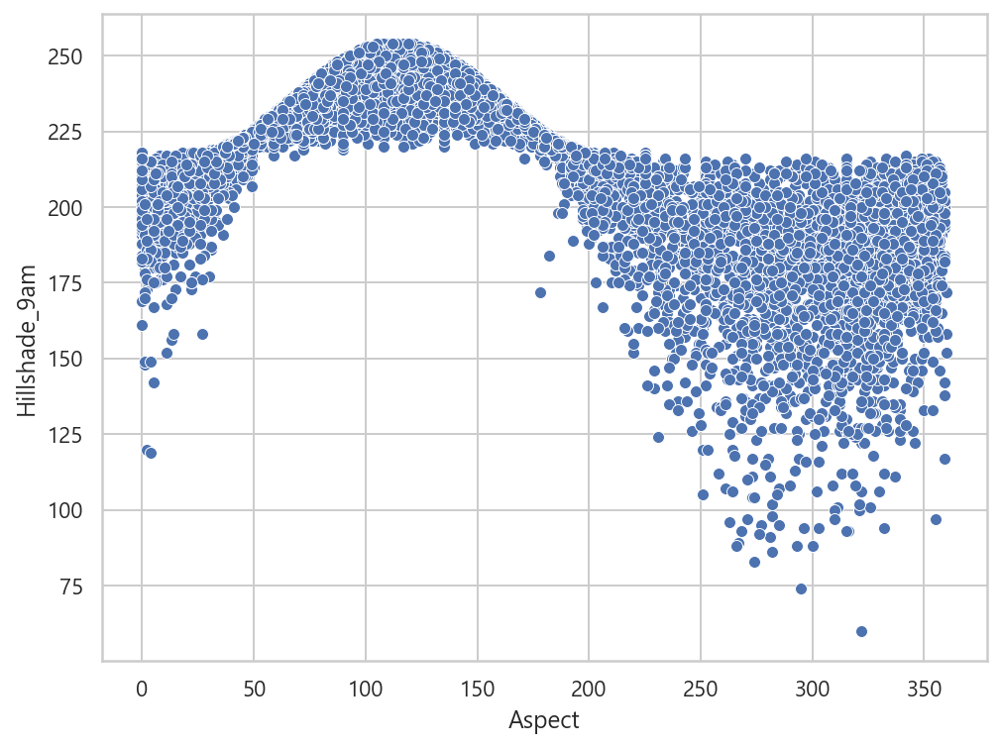

In [9]:
%matplotlib inline

plt.figure(figsize=(8, 6))
sns.scatterplot(x="Aspect", y="Hillshade_9am", data=df_covtype)
plt.show()

In [10]:
model7 = sm.OLS.from_formula(
    "Hillshade_9am ~ Aspect + I(Aspect ** 2) + I(Aspect ** 3)", data=df_covtype)
result7 = model7.fit()
print(result7.summary())

                            OLS Regression Results                            
Dep. Variable:          Hillshade_9am   R-squared:                       0.705
Model:                            OLS   Adj. R-squared:                  0.705
Method:                 Least Squares   F-statistic:                     7974.
Date:                Tue, 13 Sep 2022   Prob (F-statistic):               0.00
Time:                        10:08:09   Log-Likelihood:                -40905.
No. Observations:               10000   AIC:                         8.182e+04
Df Residuals:                    9996   BIC:                         8.185e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept        187.0395      0.485    385.

In [11]:
df_test = pd.DataFrame([[0], [360]], columns=["Aspect"])
df_test

,Aspect
0,0
1,360


In [12]:
df_result7 = result7.predict(df_test)
df_result7

0    187.039453
1    193.002560
dtype: float64

In [13]:
y_hat7 = result7.predict(df_covtype)
df7 = pd.concat([y_hat7, df_covtype.Aspect], axis=1).sort_values("Aspect")
df7.columns = ["Prediction", "Aspect"]
df7.head()

,Prediction,Aspect
126679,187.039453,0.0
345764,187.039453,0.0
56960,187.039453,0.0
180942,187.039453,0.0
212421,187.039453,0.0


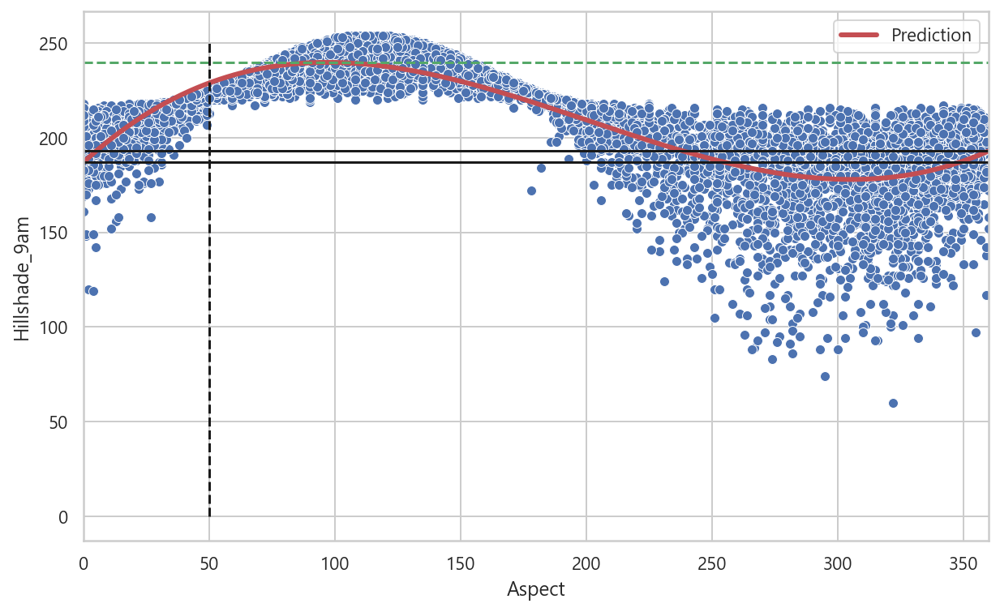

In [35]:
df7.plot(x="Aspect", style="r-", lw=3, figsize=(10, 6))
sns.scatterplot(x="Aspect", y="Hillshade_9am", data=df_covtype)
plt.hlines(df_result7.values[0], 0, 360, "k")
plt.hlines(df_result7.values[1], 0, 360, "k")
plt.hlines(df7.loc[df7["Aspect"]==100]["Prediction"].values[0], 0, 360, "g", "--")
plt.vlines(50, 0, 250, "k", ls="--")
plt.xlim(0, 360)
plt.show() ; 

In [34]:
df7.loc[df7["Aspect"]==100]["Prediction"].values[0]

239.81403552531725

In [36]:
f = 2.0 * np.pi / 360
f

0.017453292519943295

In [37]:
model8 = sm.OLS.from_formula("""
Hillshade_9am ~ np.cos(f * Aspect) + np.sin(f * Aspect)""", data=df_covtype)
result8 = model8.fit()
print(result8.summary())

                            OLS Regression Results                            
Dep. Variable:          Hillshade_9am   R-squared:                       0.727
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                 1.334e+04
Date:                Tue, 13 Sep 2022   Prob (F-statistic):               0.00
Time:                        10:20:36   Log-Likelihood:                -40515.
No. Observations:               10000   AIC:                         8.104e+04
Df Residuals:                    9997   BIC:                         8.106e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            208.8444      0

In [38]:
df_result8 = result8.predict(df_test)
df_result8

0    196.069868
1    196.069868
dtype: float64

In [40]:
y_hat8 = result8.predict(df_covtype)
df8 = pd.concat([y_hat8, df_covtype["Aspect"]], axis=1).sort_values("Aspect")
df8.head()

,0,Aspect
126679,196.069868,0.0
345764,196.069868,0.0
56960,196.069868,0.0
180942,196.069868,0.0
212421,196.069868,0.0


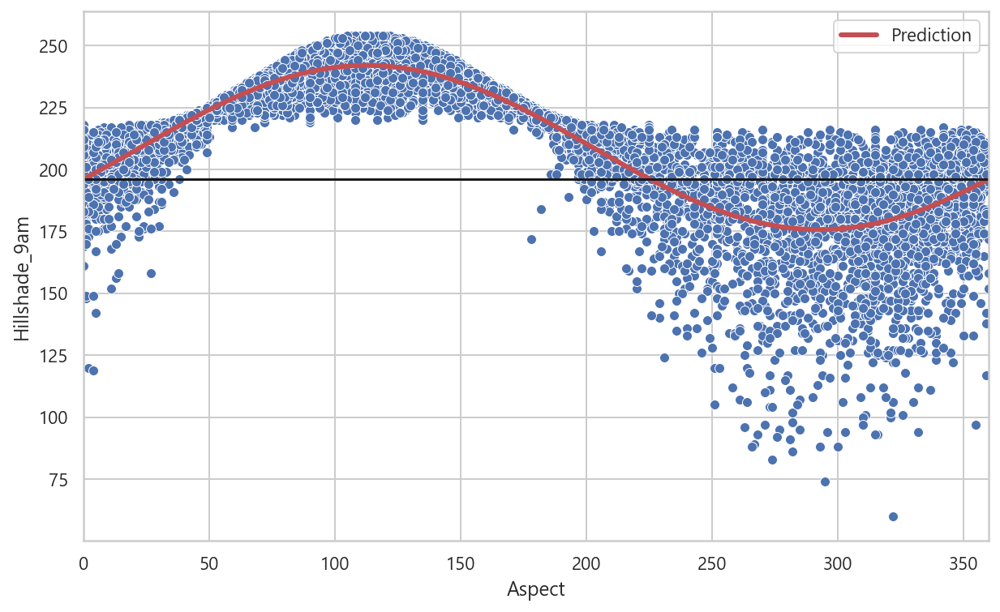

In [43]:
df8.columns = ["Prediction", "Aspect"]
df8.plot(x="Aspect", style="r-", lw=3, figsize=(10, 6))
sns.scatterplot(x="Aspect", y="Hillshade_9am", data=df_covtype)
plt.hlines(df_result8.values[0], 0, 360, "k")
plt.xlim(0, 360)
plt.show() ; 

### 종속변수의 변형

In [45]:
from sklearn.datasets import load_boston

boston = load_boston()
dfX = pd.DataFrame(boston.data, columns=boston.feature_names)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [46]:
model_boston = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names),
                                  data=df)
result_boston = model_boston.fit()
print(result_boston.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     108.1
Date:                Tue, 13 Sep 2022   Prob (F-statistic):          6.72e-135
Time:                        11:10:12   Log-Likelihood:                -1498.8
No. Observations:                 506   AIC:                             3026.
Df Residuals:                     492   BIC:                             3085.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     36.4595      5.103      7.144      0.0

In [47]:
y_hat_boston = result_boston.predict(df)
y_hat_boston

0      30.003843
1      25.025562
2      30.567597
3      28.607036
4      27.943524
         ...    
501    23.533341
502    22.375719
503    27.627426
504    26.127967
505    22.344212
Length: 506, dtype: float64

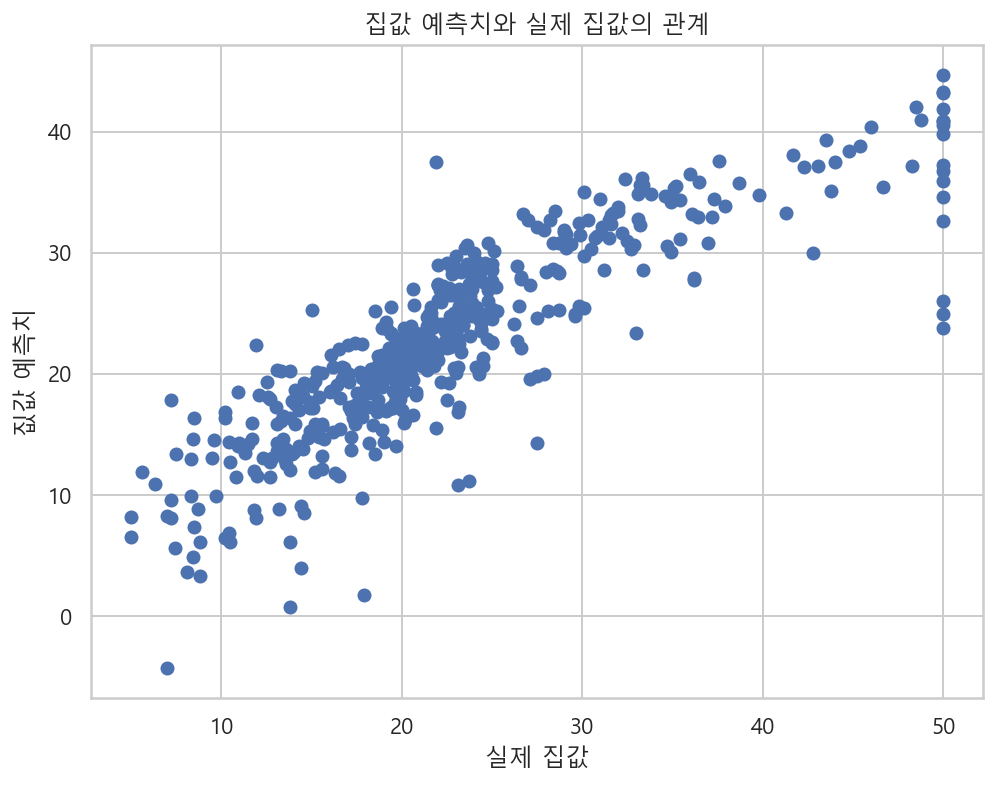

In [49]:
plt.figure(figsize=(8, 6))
plt.scatter(boston.target, y_hat_boston)
plt.xlabel(u"실제 집값")
plt.ylabel(u"짒값 예측치")
plt.title("집값 예측치와 실제 집값의 관계")
plt.show() ; 

In [50]:
model_lstat = sm.OLS.from_formula("MEDV ~ LSTAT", data=df)
result_lstat = model_lstat.fit()
print(result_lstat.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.544
Model:                            OLS   Adj. R-squared:                  0.543
Method:                 Least Squares   F-statistic:                     601.6
Date:                Tue, 13 Sep 2022   Prob (F-statistic):           5.08e-88
Time:                        11:13:32   Log-Likelihood:                -1641.5
No. Observations:                 506   AIC:                             3287.
Df Residuals:                     504   BIC:                             3295.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     34.5538      0.563     61.415      0.0

In [51]:
y_hat_lstat = result_lstat.predict(df)
df_lstat = pd.concat([y_hat_lstat, df["LSTAT"]], axis=1).sort_values("LSTAT")
df_lstat.column = ["Prediction", "LSTAT"]
df_lstat.head()

,0,LSTAT
161,32.910255,1.73
162,32.729746,1.92
40,32.672743,1.98
232,32.207219,2.47
192,31.827199,2.87


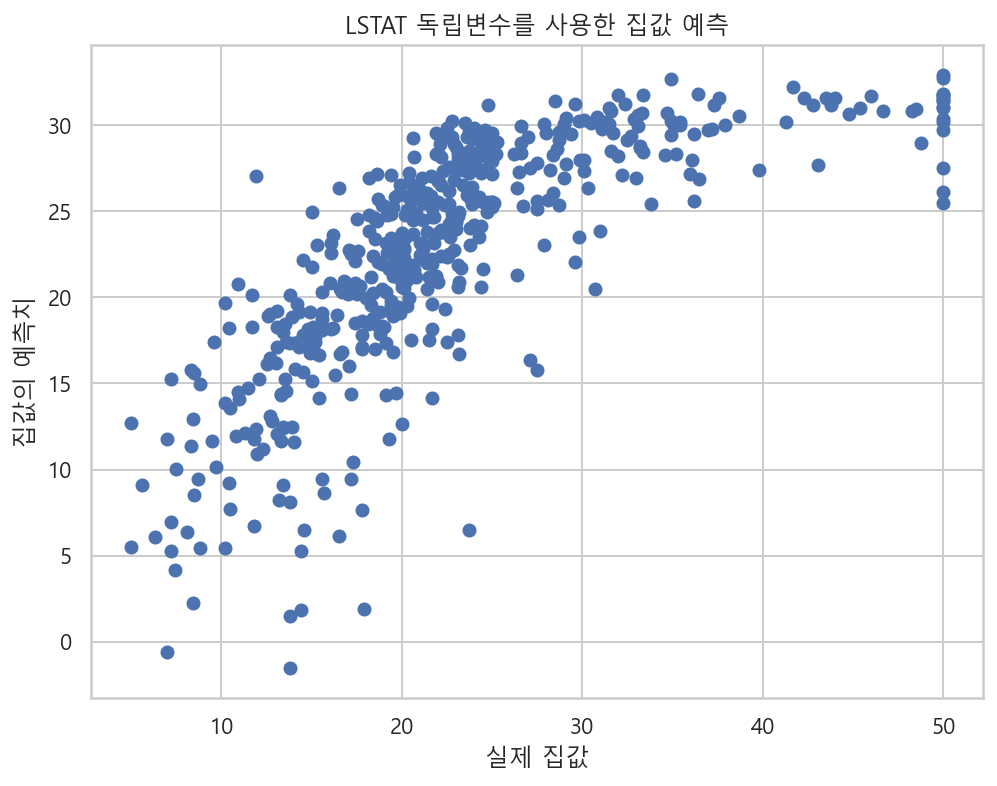

In [52]:
plt.figure(figsize=(8, 6))
plt.scatter(boston.target, y_hat_lstat)
plt.xlabel(u"실제 집값")
plt.ylabel(u"집값의 예측치")
plt.title("LSTAT 독립변수를 사용한 집값 예측")
plt.show() ; 

In [53]:
model11 = sm.OLS.from_formula("np.sqrt(MEDV) ~ LSTAT", data=df)
result11 = model11.fit()
print(result11.summary())

                            OLS Regression Results                            
Dep. Variable:          np.sqrt(MEDV)   R-squared:                       0.610
Model:                            OLS   Adj. R-squared:                  0.610
Method:                 Least Squares   F-statistic:                     789.7
Date:                Tue, 13 Sep 2022   Prob (F-statistic):          3.09e-105
Time:                        11:17:03   Log-Likelihood:                -445.65
No. Observations:                 506   AIC:                             895.3
Df Residuals:                     504   BIC:                             903.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.9499      0.053    112.374      0.0

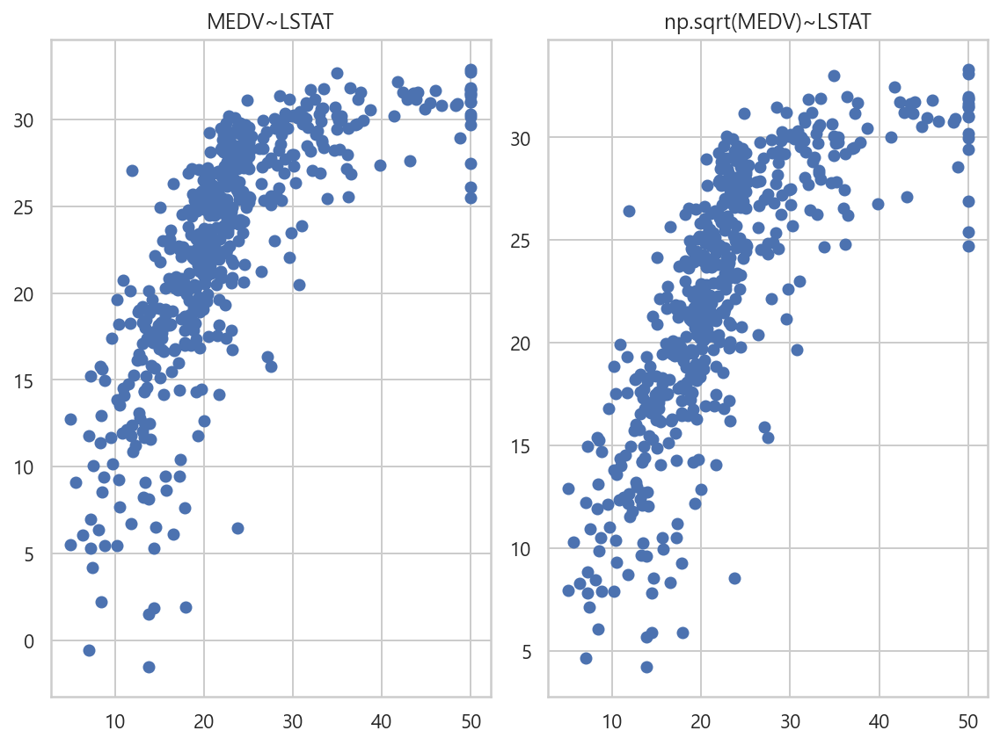

In [54]:
plt.figure(figsize=(8, 6))
plt.subplot(121)
plt.scatter(boston.target, y_hat_lstat)
plt.title("MEDV~LSTAT")
plt.subplot(122)
plt.scatter(boston.target, (result11.predict(df))**2)
plt.title("np.sqrt(MEDV)~LSTAT")
plt.tight_layout()
plt.show() ; 

In [55]:
model12 = sm.OLS.from_formula("np.log(MEDV) ~ LSTAT", data=df)
result12 = model12.fit()
print(result12.summary())

                            OLS Regression Results                            
Dep. Variable:           np.log(MEDV)   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.647
Method:                 Least Squares   F-statistic:                     928.1
Date:                Tue, 13 Sep 2022   Prob (F-statistic):          2.23e-116
Time:                        11:19:35   Log-Likelihood:               -0.57634
No. Observations:                 506   AIC:                             5.153
Df Residuals:                     504   BIC:                             13.61
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.6176      0.022    164.654      0.0

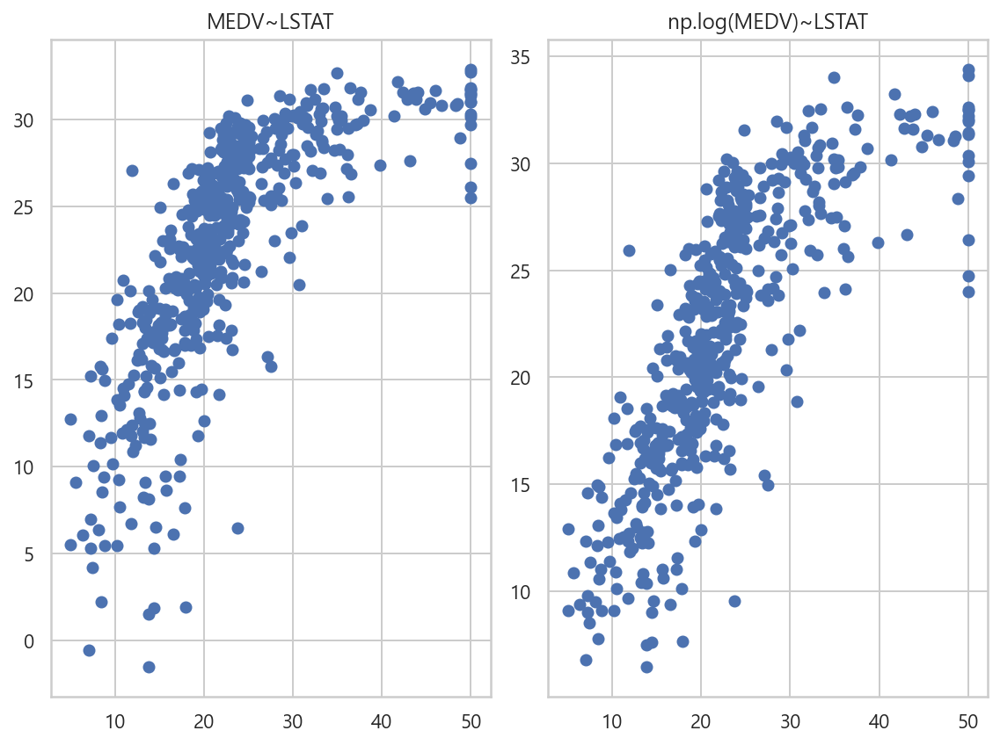

In [56]:
plt.figure(figsize=(8, 6))
plt.subplot(121)
plt.scatter(boston.target, y_hat_lstat)
plt.title("MEDV~LSTAT")
plt.subplot(122)
plt.scatter(boston.target, np.exp(result12.predict(df)))
plt.title("np.log(MEDV)~LSTAT")
plt.tight_layout()
plt.show() ; 

In [57]:
model13 = sm.OLS.from_formula("np.log(MEDV) ~ np.log(LSTAT)", data=df)
result13 = model13.fit()
print(result13.summary())

                            OLS Regression Results                            
Dep. Variable:           np.log(MEDV)   R-squared:                       0.677
Model:                            OLS   Adj. R-squared:                  0.677
Method:                 Least Squares   F-statistic:                     1058.
Date:                Tue, 13 Sep 2022   Prob (F-statistic):          7.32e-126
Time:                        11:21:57   Log-Likelihood:                 21.325
No. Observations:                 506   AIC:                            -38.65
Df Residuals:                     504   BIC:                            -30.20
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         4.3618      0.042    103.603

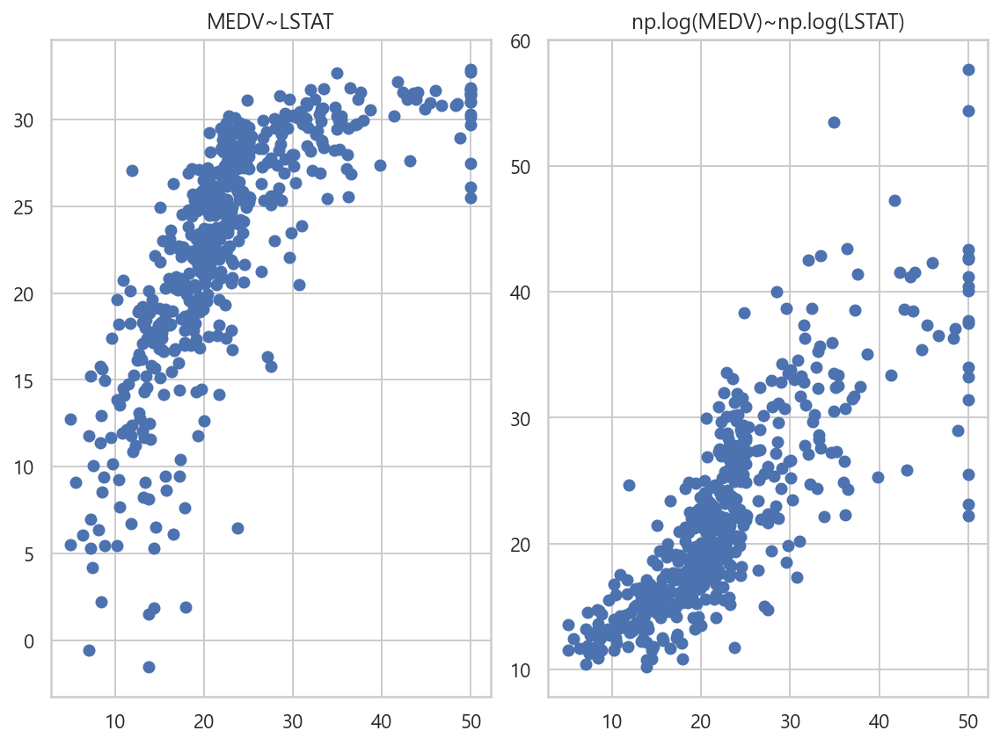

In [58]:
plt.figure(figsize=(8, 6))
plt.subplot(121)
plt.scatter(boston.target, y_hat_lstat)
plt.title("MEDV~LSTAT")
plt.subplot(122)
plt.scatter(boston.target, np.exp(result13.predict(df)))
plt.title("np.log(MEDV)~np.log(LSTAT)")
plt.tight_layout()
plt.show() ; 

In [60]:
result11.params

Intercept    5.949878
LSTAT       -0.102431
dtype: float64

In [61]:
result12.params

Intercept    3.617572
LSTAT       -0.046080
dtype: float64

In [63]:
result13.params

Intercept        4.361825
np.log(LSTAT)   -0.559819
dtype: float64

In [65]:
pd.DataFrame({"model" : ["model11", "model12", "model13"],
             "R-squared" : [result11.rsquared, result12.rsquared,
                            result13.rsquared]})

,model,R-squared
0,model11,0.610409
1,model12,0.648080
2,model13,0.677263


## 기저함수 모형과 과최적화

In [82]:
def make_nonlinear(seed=0) :
    np.random.seed(seed)
    n_samples = 30
    X = np.sort(np.random.rand(n_samples))
    y = np.sin(2 * np.pi * X) + np.random.randn(n_samples) * 0.1
    X = X[:, np.newaxis]
    return (X, y)

In [83]:
X, y = make_nonlinear()

In [84]:
X

array([[0.0202184 ],
       [0.07103606],
       [0.0871293 ],
       [0.11827443],
       [0.14335329],
       [0.38344152],
       [0.41466194],
       [0.4236548 ],
       [0.43758721],
       [0.46147936],
       [0.52184832],
       [0.52889492],
       [0.54488318],
       [0.5488135 ],
       [0.56804456],
       [0.60276338],
       [0.63992102],
       [0.64589411],
       [0.71518937],
       [0.77815675],
       [0.78052918],
       [0.79172504],
       [0.79915856],
       [0.83261985],
       [0.87001215],
       [0.891773  ],
       [0.92559664],
       [0.94466892],
       [0.96366276],
       [0.97861834]])

In [85]:
y

array([ 0.21313815,  0.35744392,  0.74748666,  0.53116691,  0.78834718,
        0.64990691,  0.66414648,  0.60844099,  0.39767186,  0.27749244,
       -0.22562487, -0.37863606, -0.31307741, -0.28628347, -0.29160131,
       -0.48150477, -0.80892952, -0.82381604, -1.08103092, -1.12639327,
       -1.15228581, -0.7707533 , -1.00364218, -0.91206561, -0.85419591,
       -0.55105199, -0.61203691, -0.36196849, -0.31588187, -0.09525091])

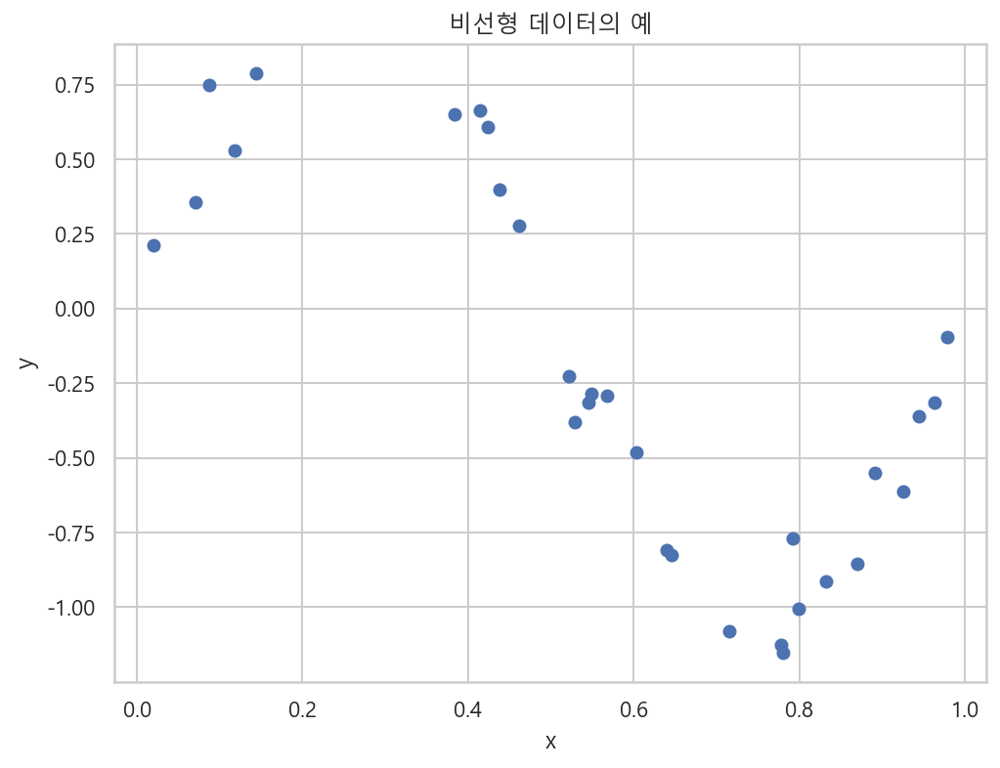

In [86]:
plt.figure(figsize=(8, 6))
plt.scatter(X, y)
plt.xlabel("x")
plt.ylabel("y")
plt.title("비선형 데이터의 예")
plt.show() ; 

In [92]:
phi_0 = np.polynomial.Polynomial.basis(1)
phi_1 = np.polynomial.Polynomial.basis(1)
phi_2 = np.polynomial.Polynomial.basis(2)
phi_3 = np.polynomial.Polynomial.basis(3)
phi_4 = np.polynomial.Polynomial.basis(4)

In [89]:
phi_0

Polynomial([0., 1.], domain=[-1.,  1.], window=[-1.,  1.])

In [90]:
phi_1

Polynomial([0., 1.], domain=[-1.,  1.], window=[-1.,  1.])

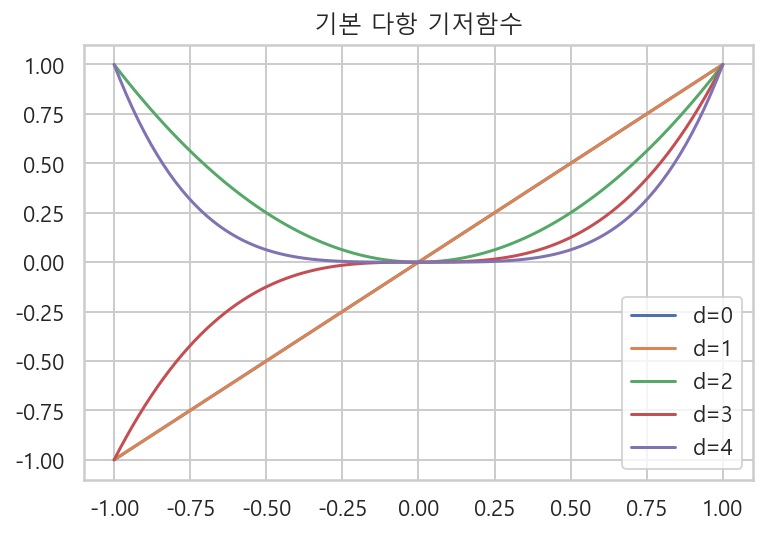

In [93]:
x = np.linspace(-1, 1, 100)

plt.plot(x, phi_0(x), label="d=0")
plt.plot(x, phi_1(x), label="d=1")
plt.plot(x, phi_2(x), label="d=2")
plt.plot(x, phi_3(x), label="d=3")
plt.plot(x, phi_4(x), label="d=4")
plt.legend()
plt.title("기본 다항 기저함수")
plt.show() ; 

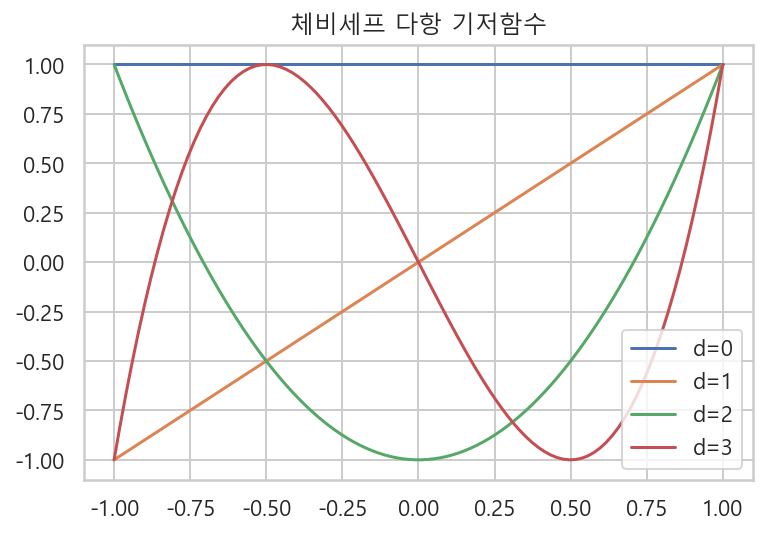

In [94]:
phi_0 = np.polynomial.chebyshev.Chebyshev.basis(0)
phi_1 = np.polynomial.chebyshev.Chebyshev.basis(1)
phi_2 = np.polynomial.chebyshev.Chebyshev.basis(2)
phi_3 = np.polynomial.chebyshev.Chebyshev.basis(3)

x = np.linspace(-1, 1, 100)

plt.plot(x, phi_0(x), label="d=0")
plt.plot(x, phi_1(x), label="d=1")
plt.plot(x, phi_2(x), label="d=2")
plt.plot(x, phi_3(x), label="d=3")
plt.legend()
plt.title("체비세프 다항 기저함수")
plt.show() ; 

In [97]:
dfX0 = pd.DataFrame(X, columns=["X"])
dfX = sm.add_constant(dfX0)
dfy = pd.DataFrame(y, columns=["y"])
df = pd.concat([dfX, dfy], axis=1)

print(sm.OLS.from_formula("y ~ X", data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.565
Model:                            OLS   Adj. R-squared:                  0.549
Method:                 Least Squares   F-statistic:                     36.36
Date:                Tue, 13 Sep 2022   Prob (F-statistic):           1.69e-06
Time:                        13:19:29   Log-Likelihood:                -15.360
No. Observations:                  30   AIC:                             34.72
Df Residuals:                      28   BIC:                             37.52
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.7140      0.176      4.064      0.0

In [98]:
print(sm.OLS.from_formula("y ~ X + I(X**2)", data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.577
Model:                            OLS   Adj. R-squared:                  0.545
Method:                 Least Squares   F-statistic:                     18.38
Date:                Tue, 13 Sep 2022   Prob (F-statistic):           9.14e-06
Time:                        13:20:03   Log-Likelihood:                -14.953
No. Observations:                  30   AIC:                             35.91
Df Residuals:                      27   BIC:                             40.11
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.8638      0.248      3.487      0.0

In [99]:
print(sm.OLS.from_formula("y ~ X + I(X**2) + I(X**3)", data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                     186.7
Date:                Tue, 13 Sep 2022   Prob (F-statistic):           1.06e-17
Time:                        13:20:44   Log-Likelihood:                 18.883
No. Observations:                  30   AIC:                            -29.77
Df Residuals:                      26   BIC:                            -24.16
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.2039      0.109     -1.876      0.0

In [100]:
print(sm.OLS.from_formula("y ~ X + I(X**3)", data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.600
Model:                            OLS   Adj. R-squared:                  0.570
Method:                 Least Squares   F-statistic:                     20.23
Date:                Tue, 13 Sep 2022   Prob (F-statistic):           4.27e-06
Time:                        13:21:29   Log-Likelihood:                -14.107
No. Observations:                  30   AIC:                             34.21
Df Residuals:                      27   BIC:                             38.42
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9291      0.222      4.192      0.0

In [107]:
def polyreg(degree, seed=0, ax=None) :
    X, y = make_nonlinear(seed)
    dfX = pd.DataFrame(X, columns=["x"])
    dfX = sm.add_constant(dfX)
    dfy = pd.DataFrame(y, columns=["y"])
    df = pd.concat([dfX, dfy], axis=1)
    
    model_str = "y ~ "
    for i in range(degree) : 
        if i == 0 :
            prefix = ""
        else :
            prefix = " + "
        model_str += prefix + "I(x**{})".format(i + 1)
    model = sm.OLS.from_formula(model_str, data=df)
    result = model.fit()
    
    if ax : 
        ax.scatter(X, y)
        xx = np.linspace(0, 1, 1000)
        dfX_new = pd.DataFrame(xx[:, np.newaxis], columns=["x"])
        ax.plot(xx, result.predict(dfX_new))
        ax.set_ylim(-2, 2)
        ax.set_title("차수={}, 시드값={}".format(degree, seed))
        xlabel = "\n".join(str(result.params).split("\n")[:-1])
        font = {"family" : "NanumGothic", "color" : "black", "size" : 10}
        ax.set_xlabel(xlabel, fontdict=font)
        
    return result

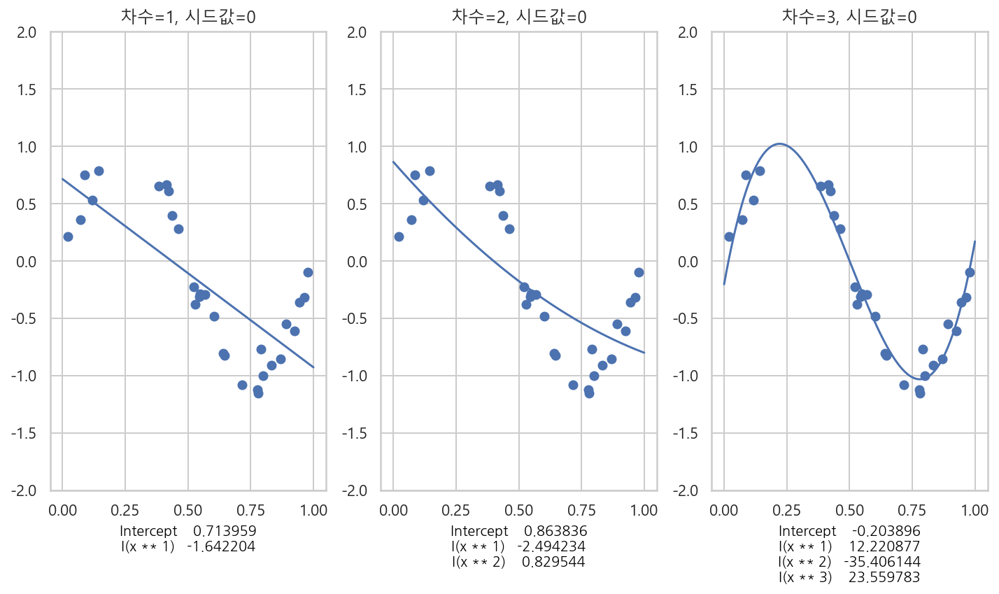

In [108]:
plt.figure(figsize=(10, 6))

ax1 = plt.subplot(131)
polyreg(1, ax=ax1)

ax2 = plt.subplot(132)
polyreg(2, ax=ax2)

ax3 = plt.subplot(133)
polyreg(3, ax=ax3)

plt.tight_layout()
plt.show() ; 

In [109]:
def poly_reg(degree, seed=0, ax=None) : 
    np.random.seed(seed)
    X, y = make_nonlinear()
    dfX = pd.DataFrame(X, columns=["x"])
    dfX = sm.add_constant(dfX)
    dfy = pd.DataFrame(y, columns=["y"])
    df = pd.concat([dfX, dfy], axis=1)
    
    model_str = "y ~ "
    for i in range(degree) : 
        if i == 0 : 
            prefix = ""
        else : 
            prefix = " + "
        model_str += prefix + "I(x**{})".format(i+1)
    model = sm.OLS.from_formula(model_str, data=df)
    result = model.fit()
    
    if ax : 
        ax.scatter(X, y)
        xx = np.linspace(0, 1, 1000)
        dfX_new = pd.DataFrame(xx[:, np.newaxis], columns=["x"])
        ax.plot(xx, result.predict(dfX_new))
        ax.set_ylim(-2, 2)
        ax.set_title("차수={}, 시드값={}".format(degree, seed))
        xlabel = "\n".join(str(result.params).split("\n")[:-1])
        font = {"family" : "NanumGothic", "color" : "black", "size" : 10}
        ax.set_xlabel(xlabel, fontdict=font)
        
    return result

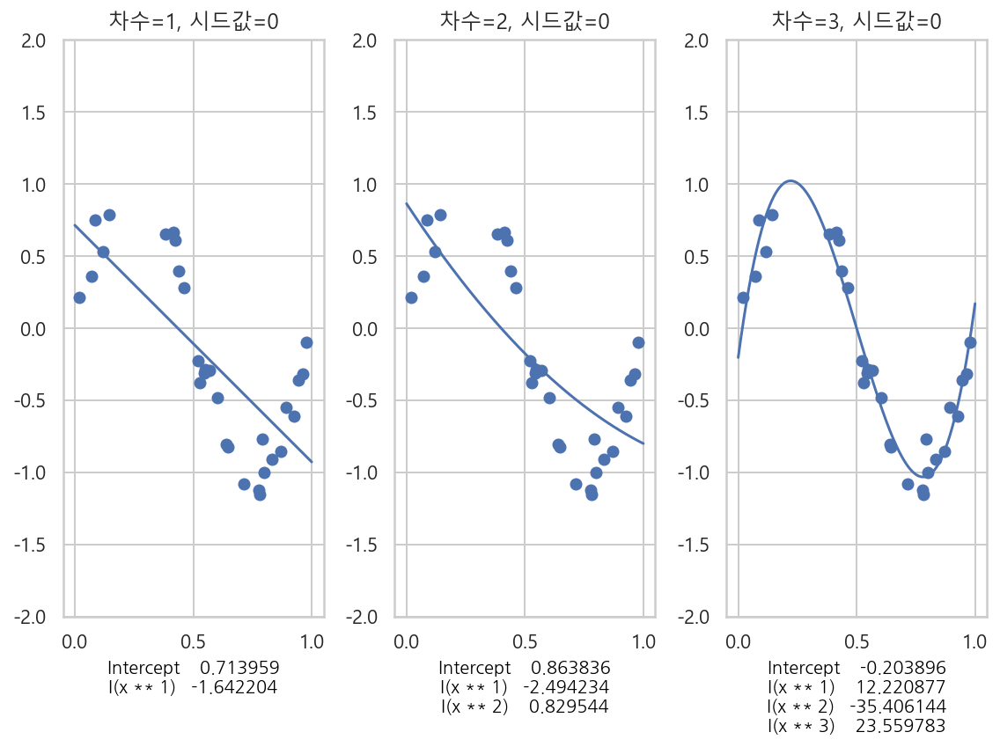

In [112]:
plt.figure(figsize=(8, 6))
ax1 = plt.subplot(131)
poly_reg(1, ax=ax1)
ax2 = plt.subplot(132)
poly_reg(2, ax=ax2)
ax3 = plt.subplot(133)
poly_reg(3, ax=ax3)
plt.tight_layout()
plt.show() ; 

In [113]:
def poly_reg_2(degree, seed=0, ax=None) : 
    np.random.seed(seed)
    X, y = make_nonlinear()
    dfX = pd.DataFrame(X, columns=["x"])
    dfX = sm.add_constant(dfX)
    dfy = pd.DataFrame(y, columns=["y"])
    df = pd.concat([dfX, dfy], axis=1)
    
    model_str = "y ~ "
    for i in range(degree) : 
        if i == 0 :
            prefix = ""
        else : 
            prefix = " + "
        model_str += prefix + "I(x**{})".format(i+1)
    model = sm.OLS.from_formula(model_str, data=df)
    result = model.fit()
    
    if ax : 
        ax.scatter(X, y)
        xx = np.linspace(0, 1, 1000)
        dfX_new = pd.DataFrame(xx[:, np.newaxis], columns=["x"])
        ax.plot(xx, result.predict(dfX_new))
        ax.set_ylim(-2, 2)
        ax.set_title("차수={}, 시드값={}".format(degree, seed))
        xlabel = "\n".join(str(result.params).split("\n")[:-1])
        font = {"family" : "NanumGothic", "color" : "black", "size" : 10}
        ax.set_xlabel(xlabel, fontdict=font)
        
    return result

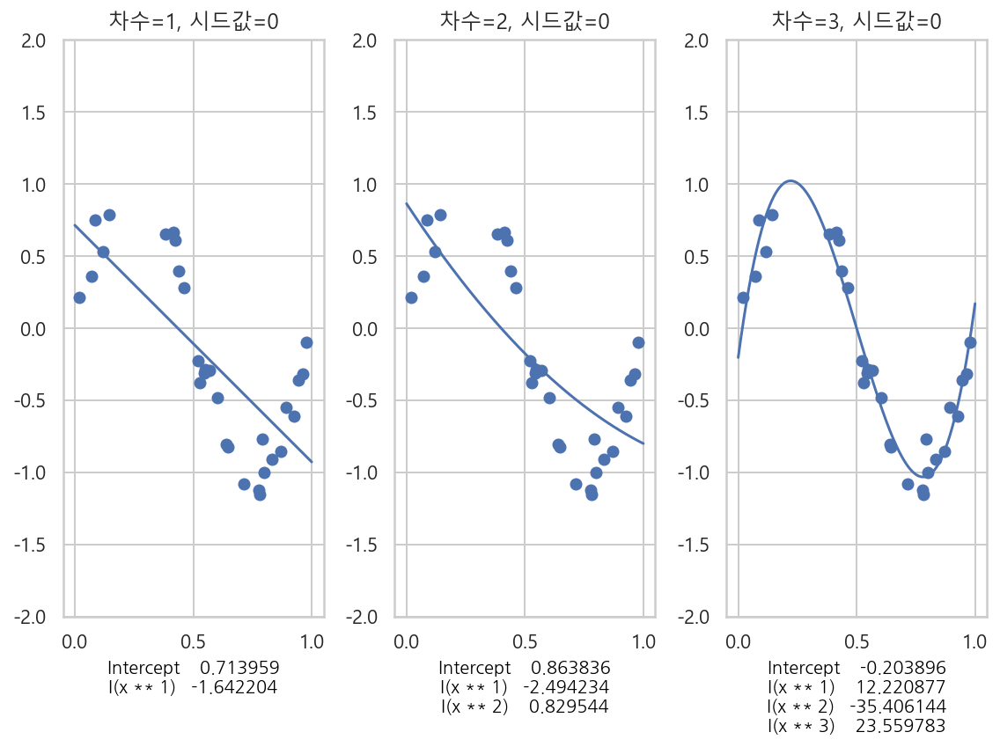

In [115]:
plt.figure(figsize=(8, 6))

ax1 = plt.subplot(131)
poly_reg_2(1, ax=ax1)

ax2 = plt.subplot(132)
poly_reg_2(2, ax=ax2)

ax3 = plt.subplot(133)
poly_reg_2(3, ax=ax3)

plt.tight_layout()
plt.show() ; 

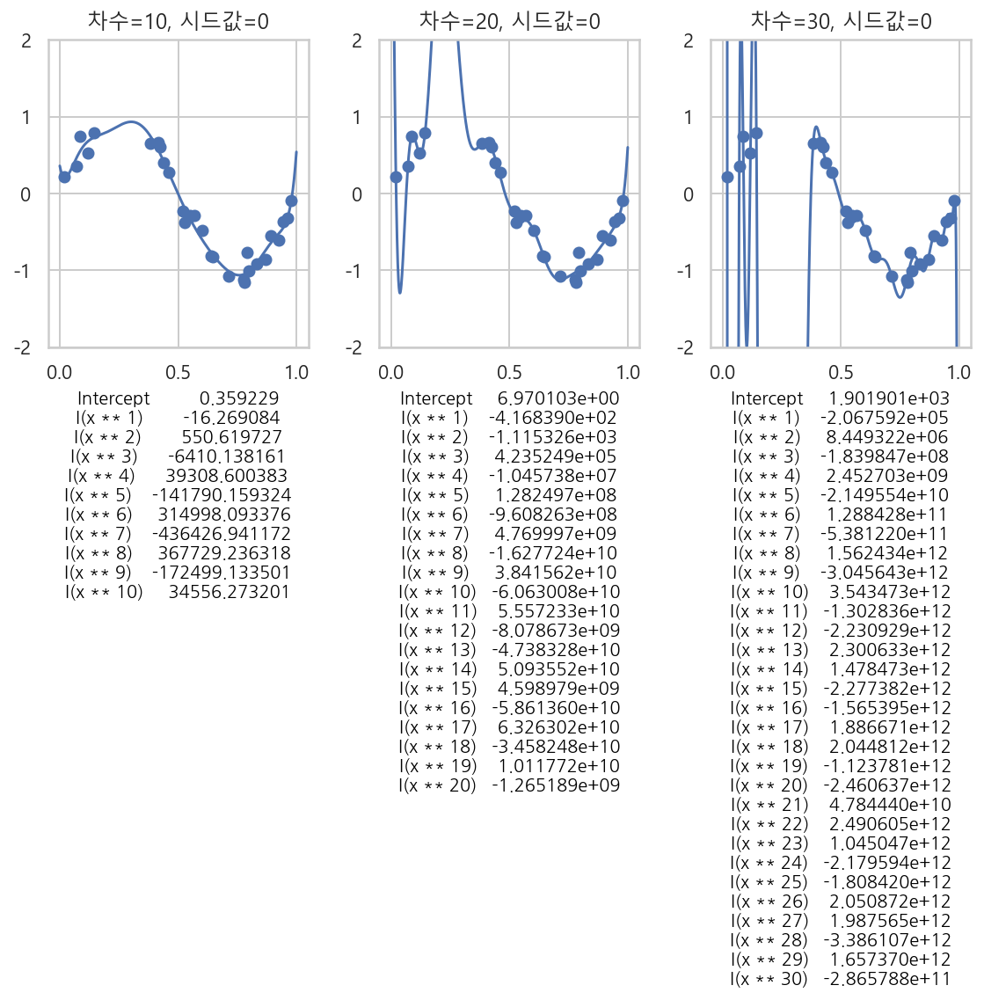

In [116]:
plt.figure(figsize=(8, 8))
ax1 = plt.subplot(131)
poly_reg(10, ax=ax1)
ax2 = plt.subplot(132)
poly_reg(20, ax=ax2)
ax3 = plt.subplot(133)
poly_reg(30, ax=ax3)
plt.tight_layout()
plt.show() ; 

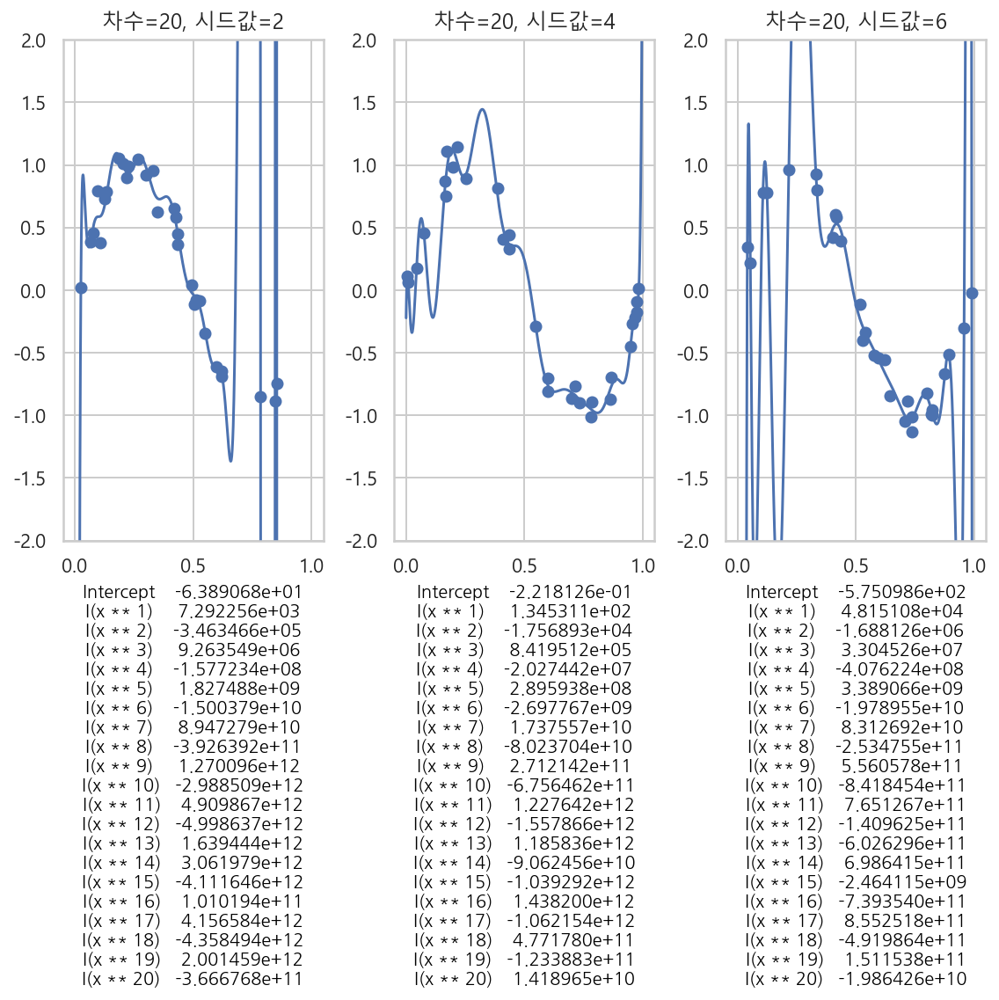

In [119]:
plt.figure(figsize=(8, 8))
ax1 = plt.subplot(131)
polyreg(20, seed=2, ax=ax1)
ax2 = plt.subplot(132)
polyreg(20, seed=4, ax=ax2)
ax3 = plt.subplot(133)
polyreg(20, seed=6, ax=ax3)
plt.tight_layout()
plt.show() ; 

## 교차검증

In [120]:
from sklearn.datasets import load_boston

boston = load_boston()
dfX = pd.DataFrame(boston.data, columns=boston.feature_names)
dfy = pd.DataFrame(boston.target, columns=["MEDV"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [125]:
N = len(df)
ratio = 0.7
np.random.seed(0)
idx_train = np.random.choice(np.arange(N), np.int(ratio * N))
idx_test = list(set(np.arange(N)).difference(idx_train))
df_train = df.iloc[idx_train]
df_test = df.iloc[idx_test]

In [124]:
np.random.choice(20, 5)

array([ 7,  4, 18,  8, 13])

In [129]:
df_train.head(15)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
172,0.13914,0.0,4.05,0.0,0.510,5.572,88.5,2.5961,5.0,296.0,16.6,396.90,14.69,23.1
47,0.22927,0.0,6.91,0.0,0.448,6.030,85.5,5.6894,3.0,233.0,17.9,392.74,18.80,16.6
117,0.15098,0.0,10.01,0.0,0.547,6.021,82.6,2.7474,6.0,432.0,17.8,394.51,10.30,19.2
192,0.08664,45.0,3.44,0.0,0.437,7.178,26.3,6.4798,5.0,398.0,15.2,390.49,2.87,36.4
323,0.28392,0.0,7.38,0.0,0.493,5.708,74.3,4.7211,5.0,287.0,19.6,391.13,11.74,18.5
251,0.21409,22.0,5.86,0.0,0.431,6.438,8.9,7.3967,7.0,330.0,19.1,377.07,3.59,24.8
195,0.01381,80.0,0.46,0.0,0.422,7.875,32.0,5.6484,4.0,255.0,14.4,394.23,2.97,50.0
359,4.26131,0.0,18.10,0.0,0.770,6.112,81.3,2.5091,24.0,666.0,20.2,390.74,12.67,22.6
9,0.17004,12.5,7.87,0.0,0.524,6.004,85.9,6.5921,5.0,311.0,15.2,386.71,17.10,18.9
211,0.37578,0.0,10.59,1.0,0.489,5.404,88.6,3.6650,4.0,277.0,18.6,395.24,23.98,19.3


In [132]:
idx_train[:15]

array([172,  47, 117, 192, 323, 251, 195, 359,   9, 211, 277, 242, 292,
        87,  70])

In [133]:
df_test.head(15)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
5,0.02985,0.0,2.18,0.0,0.458,6.430,58.7,6.0622,3.0,222.0,18.7,394.12,5.21,28.7
6,0.08829,12.5,7.87,0.0,0.524,6.012,66.6,5.5605,5.0,311.0,15.2,395.60,12.43,22.9
7,0.14455,12.5,7.87,0.0,0.524,6.172,96.1,5.9505,5.0,311.0,15.2,396.90,19.15,27.1
8,0.21124,12.5,7.87,0.0,0.524,5.631,100.0,6.0821,5.0,311.0,15.2,386.63,29.93,16.5
10,0.22489,12.5,7.87,0.0,0.524,6.377,94.3,6.3467,5.0,311.0,15.2,392.52,20.45,15.0
12,0.09378,12.5,7.87,0.0,0.524,5.889,39.0,5.4509,5.0,311.0,15.2,390.50,15.71,21.7
14,0.63796,0.0,8.14,0.0,0.538,6.096,84.5,4.4619,4.0,307.0,21.0,380.02,10.26,18.2


In [135]:
idx_test[:15]

[1, 2, 4, 5, 6, 7, 8, 10, 12, 14, 15, 17, 18, 20, 21]

In [136]:
model = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names), 
                            data=df_train)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.757
Model:                            OLS   Adj. R-squared:                  0.747
Method:                 Least Squares   F-statistic:                     81.31
Date:                Tue, 13 Sep 2022   Prob (F-statistic):           7.22e-96
Time:                        15:06:38   Log-Likelihood:                -1057.6
No. Observations:                 354   AIC:                             2143.
Df Residuals:                     340   BIC:                             2197.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     40.6105      6.807      5.966      0.0

In [137]:
pred = result.predict(df_test)

rss = ((df_test.MEDV - pred)**2).sum()
tss = ((df_test.MEDV - df_test.MEDV.mean())**2).sum()
rsquared = 1 - rss/tss
rsquared

0.6883734124987095

In [138]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(df, test_size=0.3, random_state=0)
df_train.shape, df_test.shape

((354, 14), (152, 14))

In [140]:
dfX_train, dfX_test, dfy_train, dfy_test = train_test_split(dfX, dfy, test_size=0.3,
                                                           random_state=0)
dfX_train.shape, dfy_train.shape, dfX_test.shape, dfy_test.shape

((354, 13), (354, 1), (152, 13), (152, 1))

In [141]:
dfy_train

,MEDV
141,14.4
272,24.4
135,18.1
298,22.5
122,20.5
...,...
323,18.5
192,36.4
117,19.2
47,16.6


In [142]:
dfX_train

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
141,1.62864,0.0,21.89,0.0,0.624,5.019,100.0,1.4394,4.0,437.0,21.2,396.90,34.41
272,0.11460,20.0,6.96,0.0,0.464,6.538,58.7,3.9175,3.0,223.0,18.6,394.96,7.73
135,0.55778,0.0,21.89,0.0,0.624,6.335,98.2,2.1107,4.0,437.0,21.2,394.67,16.96
298,0.06466,70.0,2.24,0.0,0.400,6.345,20.1,7.8278,5.0,358.0,14.8,368.24,4.97
122,0.09299,0.0,25.65,0.0,0.581,5.961,92.9,2.0869,2.0,188.0,19.1,378.09,17.93
...,...,...,...,...,...,...,...,...,...,...,...,...,...
323,0.28392,0.0,7.38,0.0,0.493,5.708,74.3,4.7211,5.0,287.0,19.6,391.13,11.74
192,0.08664,45.0,3.44,0.0,0.437,7.178,26.3,6.4798,5.0,398.0,15.2,390.49,2.87
117,0.15098,0.0,10.01,0.0,0.547,6.021,82.6,2.7474,6.0,432.0,17.8,394.51,10.30
47,0.22927,0.0,6.91,0.0,0.448,6.030,85.5,5.6894,3.0,233.0,17.9,392.74,18.80


In [143]:
from sklearn.model_selection import KFold

In [145]:
scores = np.zeros(5)
cv = KFold(5, shuffle=True, random_state=0)
for i, (idx_train, idx_test) in enumerate(cv.split(df)) : 
    df_train = df.iloc[idx_train]
    df_test = df.iloc[idx_test]
    
    model = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names),
                               data=df_train)
    result = model.fit()
    
    pred = result.predict(df_test)
    rss = ((df_test.MEDV - pred)**2).sum()
    tss = ((df_test.MEDV - df_test.MEDV.mean())**2).sum()
    rsquared = 1 - rss/tss
    
    scores[i] = rsquared
    print("학습 R2 = {:.8f}, 검증 R2 = {:.8f}".format(result.rsquared, rsquared))

학습 R2 = 0.77301356, 검증 R2 = 0.58922238
학습 R2 = 0.72917058, 검증 R2 = 0.77799144
학습 R2 = 0.74897081, 검증 R2 = 0.66791979
학습 R2 = 0.75658611, 검증 R2 = 0.66801630
학습 R2 = 0.70497483, 검증 R2 = 0.83953317


In [150]:
test_df = df.sample(20)
test_df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
296,0.05372,0.0,13.92,0.0,0.437,6.549,51.0,5.9604,4.0,289.0,16.0,392.85,7.39,27.1
124,0.09849,0.0,25.65,0.0,0.581,5.879,95.8,2.0063,2.0,188.0,19.1,379.38,17.58,18.8
20,1.25179,0.0,8.14,0.0,0.538,5.570,98.1,3.7979,4.0,307.0,21.0,376.57,21.02,13.6
249,0.19073,22.0,5.86,0.0,0.431,6.718,17.5,7.8265,7.0,330.0,19.1,393.74,6.56,26.2
98,0.08187,0.0,2.89,0.0,0.445,7.820,36.9,3.4952,2.0,276.0,18.0,393.53,3.57,43.8
468,15.57570,0.0,18.10,0.0,0.580,5.926,71.0,2.9084,24.0,666.0,20.2,368.74,18.13,19.1
272,0.11460,20.0,6.96,0.0,0.464,6.538,58.7,3.9175,3.0,223.0,18.6,394.96,7.73,24.4
397,7.67202,0.0,18.10,0.0,0.693,5.747,98.9,1.6334,24.0,666.0,20.2,393.10,19.92,8.5
101,0.11432,0.0,8.56,0.0,0.520,6.781,71.3,2.8561,5.0,384.0,20.9,395.58,7.67,26.5
135,0.55778,0.0,21.89,0.0,0.624,6.335,98.2,2.1107,4.0,437.0,21.2,394.67,16.96,18.1


In [156]:
cv2 = KFold(5, shuffle=True, random_state=1)
for i, (idx_train, idx_test) in enumerate(cv2.split(test_df)) : 
    print(i, idx_train, idx_test)

0 [ 0  1  2  4  5  7  8  9 11 12 13 14 15 17 18 19] [ 3  6 10 16]
1 [ 0  1  3  5  6  7  8  9 10 11 12 13 15 16 18 19] [ 2  4 14 17]
2 [ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 19] [ 0  1  7 13]
3 [ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 16 17] [ 9 15 18 19]
4 [ 0  1  2  3  4  6  7  9 10 13 14 15 16 17 18 19] [ 5  8 11 12]


In [157]:
from sklearn.metrics import r2_score

In [158]:
scores = np.zeros(5)
cv = KFold(5, shuffle=True, random_state=0)
for i, (idx_train, idx_test) in enumerate(cv.split(df)) : 
    df_train = df.iloc[idx_train]
    df_test = df.iloc[idx_test]
    
    model = sm.OLS.from_formula("MEDV ~ " + "+".join(boston.feature_names),
                               data=df_train)
    result = model.fit()
    
    pred = result.predict(df_test)
    rsquared = r2_score(df_test.MEDV, pred)
    scores[i] = rsquared
    
scores

array([0.58922238, 0.77799144, 0.66791979, 0.6680163 , 0.83953317])

In [159]:
from sklearn.base import BaseEstimator, RegressorMixin
import statsmodels.formula.api as smf
import statsmodels.api as sm

In [164]:
class StatsmodelsOLS(BaseEstimator, RegressorMixin) : 
    
    def __init__(self, formula) : 
        self.formula = formula
        self.model = None
        self.data = None
        self.result = None
    
    def fit(self, dfX, dfy) : 
        self.data = pd.concat([dfX, dfy], axis=1)
        self.model = smf.ols(self.formula, data=self.data)
        self.result = self.model.fit()
        
    def predict(self, new_data) : 
        return self.result.predict(new_data)

In [165]:
from sklearn.model_selection import cross_val_score

In [166]:
model = StatsmodelsOLS("MEDV ~ " + "+".join(boston.feature_names))
cv = KFold(5, shuffle=True, random_state=0)
cross_val_score(model, dfX, dfy, scoring="r2", cv=cv)

array([0.58922238, 0.77799144, 0.66791979, 0.6680163 , 0.83953317])

In [163]:
model

StatsmodelsOLS(formula='MEDV ~ '
                       'CRIM+ZN+INDUS+CHAS+NOX+RM+AGE+DIS+RAD+TAX+PTRATIO+B+LSTAT')

## 다중공선성과 변수 선택

In [167]:
from statsmodels.datasets.longley import load_pandas

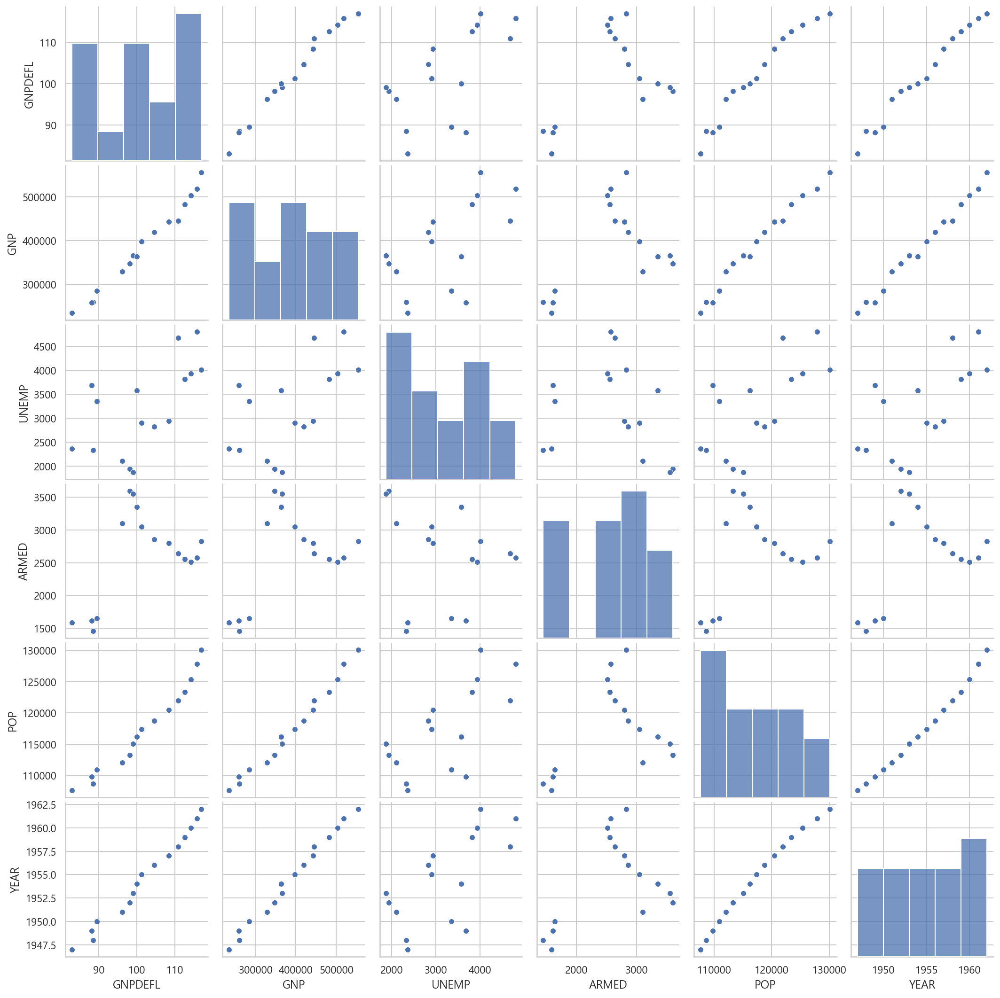

In [168]:
dfy = load_pandas().endog
dfX = load_pandas().exog
df = pd.concat([dfy, dfX], axis=1)
sns.pairplot(dfX)
plt.show() ; 

In [169]:
dfX

,GNPDEFL,GNP,UNEMP,ARMED,POP,YEAR
0,83.0,234289.0,2356.0,1590.0,107608.0,1947.0
1,88.5,259426.0,2325.0,1456.0,108632.0,1948.0
2,88.2,258054.0,3682.0,1616.0,109773.0,1949.0
3,89.5,284599.0,3351.0,1650.0,110929.0,1950.0
4,96.2,328975.0,2099.0,3099.0,112075.0,1951.0
5,98.1,346999.0,1932.0,3594.0,113270.0,1952.0
6,99.0,365385.0,1870.0,3547.0,115094.0,1953.0
7,100.0,363112.0,3578.0,3350.0,116219.0,1954.0
8,101.2,397469.0,2904.0,3048.0,117388.0,1955.0
9,104.6,419180.0,2822.0,2857.0,118734.0,1956.0


In [170]:
dfy

0     60323.0
1     61122.0
2     60171.0
3     61187.0
4     63221.0
5     63639.0
6     64989.0
7     63761.0
8     66019.0
9     67857.0
10    68169.0
11    66513.0
12    68655.0
13    69564.0
14    69331.0
15    70551.0
Name: TOTEMP, dtype: float64

In [171]:
dfX.corr()

,GNPDEFL,GNP,UNEMP,ARMED,POP,YEAR
GNPDEFL,1.000000,0.991589,0.620633,0.464744,0.979163,0.991149
GNP,0.991589,1.000000,0.604261,0.446437,0.991090,0.995273
UNEMP,0.620633,0.604261,1.000000,-0.177421,0.686552,0.668257
ARMED,0.464744,0.446437,-0.177421,1.000000,0.364416,0.417245
POP,0.979163,0.991090,0.686552,0.364416,1.000000,0.993953
YEAR,0.991149,0.995273,0.668257,0.417245,0.993953,1.000000


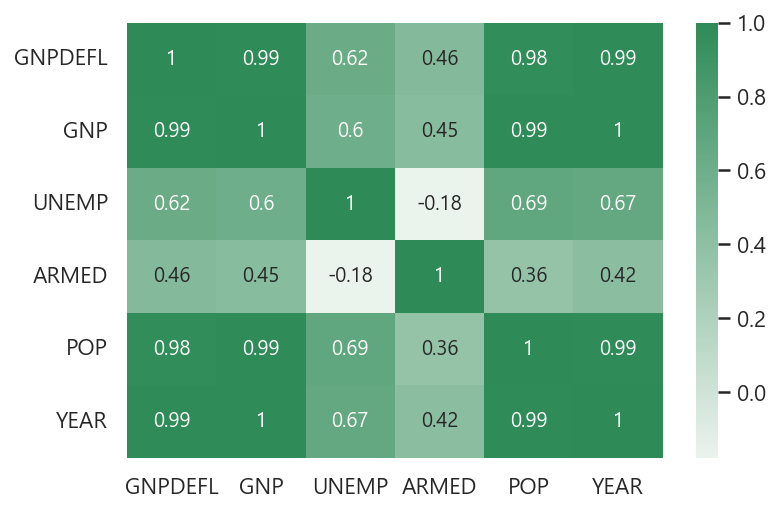

In [175]:
cmap = sns.light_palette("seagreen", as_cmap=True)
sns.heatmap(dfX.corr(), annot=True, cmap=cmap)
plt.show() ; 

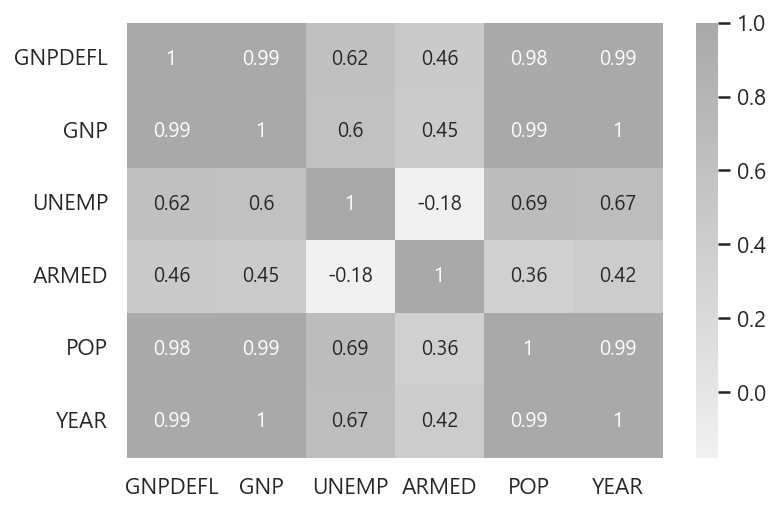

In [176]:
cmap = sns.light_palette("darkgray", as_cmap=True)
sns.heatmap(dfX.corr(), annot=True, cmap=cmap)
plt.show() ; 

In [179]:
from sklearn.model_selection import train_test_split

def get_model1(seed) : 
    df_train, df_test = train_test_split(df, test_size=0.5, random_state=seed)
    model = sm.OLS.from_formula("""
    TOTEMP ~ GNPDEFL + POP + GNP + YEAR + ARMED + UNEMP""", data=df_train)
    return df_train, df_test, model.fit()

In [180]:
df_train, df_test, result1 = get_model1(3)
print(result1.summary())

                            OLS Regression Results                            
Dep. Variable:                 TOTEMP   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     437.5
Date:                Tue, 13 Sep 2022   Prob (F-statistic):             0.0366
Time:                        16:36:07   Log-Likelihood:                -44.199
No. Observations:                   8   AIC:                             102.4
Df Residuals:                       1   BIC:                             103.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1.235e+07   2.97e+06     -4.165      0.1

In [187]:
def calc_r2(df_test, result) : 
    target = df.loc[df_test.index].TOTEMP
    predict_test = result.predict(df_test)
    RSS = ((predict_test - target)**2).sum()
    TSS = ((target - target.mean())**2).sum()
    r2 = 1 - RSS/TSS
    return r2

In [188]:
test1 = []
for i in range(10) : 
    df_train, df_test, result = get_model1(i)
    test1.append(calc_r2(df_test, result))
    
test1

[0.9815050656845747,
 0.9738497543069247,
 0.9879366369914134,
 0.7588861967897188,
 0.9807206089304709,
 0.8937889315168234,
 0.8798563810651999,
 0.931466577896386,
 0.860852568218061,
 0.967719873514098]

In [189]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [190]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [191]:
vif = pd.DataFrame()
vif

""


In [192]:
dfX

,GNPDEFL,GNP,UNEMP,ARMED,POP,YEAR
0,83.0,234289.0,2356.0,1590.0,107608.0,1947.0
1,88.5,259426.0,2325.0,1456.0,108632.0,1948.0
2,88.2,258054.0,3682.0,1616.0,109773.0,1949.0
3,89.5,284599.0,3351.0,1650.0,110929.0,1950.0
4,96.2,328975.0,2099.0,3099.0,112075.0,1951.0
5,98.1,346999.0,1932.0,3594.0,113270.0,1952.0
6,99.0,365385.0,1870.0,3547.0,115094.0,1953.0
7,100.0,363112.0,3578.0,3350.0,116219.0,1954.0
8,101.2,397469.0,2904.0,3048.0,117388.0,1955.0
9,104.6,419180.0,2822.0,2857.0,118734.0,1956.0


In [193]:
vif["VIF Factor"] = [variance_inflation_factor(
dfX.values, i) for i in range(dfX.shape[1])]
vif["features"] = dfX.columns
vif

,VIF Factor,features
0,12425.514335,GNPDEFL
1,10290.435437,GNP
2,136.224354,UNEMP
3,39.983386,ARMED
4,101193.161993,POP
5,84709.950443,YEAR


In [194]:
vif.sort_values("VIF Factor")

,VIF Factor,features
3,39.983386,ARMED
2,136.224354,UNEMP
1,10290.435437,GNP
0,12425.514335,GNPDEFL
5,84709.950443,YEAR
4,101193.161993,POP


In [197]:
sm.stats.anova_lm(result1, typ=2).sort_values("F")

,sum_sq,df,F,PR(>F)
ARMED,10938.049573,1.0,0.371134,0.651666
GNPDEFL,58059.656934,1.0,1.969994,0.394098
POP,295638.707080,1.0,10.031172,0.194698
GNP,328671.689093,1.0,11.151998,0.185226
YEAR,520752.701917,1.0,17.669405,0.148686
UNEMP,673933.704787,1.0,22.866915,0.131239
Residual,29471.999507,1.0,NaN,NaN


In [204]:
df_corr = dfX.corr()
df_corr["mean"] = dfX.corr().mean(axis=0)
df_corr.sort_values("mean")

,GNPDEFL,GNP,UNEMP,ARMED,POP,YEAR,mean
ARMED,0.464744,0.446437,-0.177421,1.000000,0.364416,0.417245,0.419237
UNEMP,0.620633,0.604261,1.000000,-0.177421,0.686552,0.668257,0.567047
POP,0.979163,0.991090,0.686552,0.364416,1.000000,0.993953,0.835862
GNP,0.991589,1.000000,0.604261,0.446437,0.991090,0.995273,0.838108
GNPDEFL,1.000000,0.991589,0.620633,0.464744,0.979163,0.991149,0.841213
YEAR,0.991149,0.995273,0.668257,0.417245,0.993953,1.000000,0.844313


In [201]:
dfX.corr().mean(axis=0).sort_values()

ARMED      0.419237
UNEMP      0.567047
POP        0.835862
GNP        0.838108
GNPDEFL    0.841213
YEAR       0.844313
dtype: float64

In [205]:
dfX.columns

Index(['GNPDEFL', 'GNP', 'UNEMP', 'ARMED', 'POP', 'YEAR'], dtype='object')

In [208]:
def get_model2(seed) : 
    df_train, df_test = train_test_split(df, test_size=0.5, random_state=seed)
    model = sm.OLS.from_formula("TOTEMP ~ scale(GNP) + scale(ARMED) + scale(UNEMP)", 
                               data=df_train)
    return df_train, df_test, model.fit()

In [209]:
df_train, df_test, result2 = get_model2(3)
print(result2.summary())

                            OLS Regression Results                            
Dep. Variable:                 TOTEMP   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     118.6
Date:                Tue, 13 Sep 2022   Prob (F-statistic):           0.000231
Time:                        17:06:27   Log-Likelihood:                -57.695
No. Observations:                   8   AIC:                             123.4
Df Residuals:                       4   BIC:                             123.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     6.538e+04    163.988    398.686   

In [210]:
test2 = []
for i in range(10) : 
    df_train, df_test, result = get_model2(i)
    test2.append(calc_r2(df_test, result))
    
test2

[0.9763608388904904,
 0.9841984331185699,
 0.9687069366140135,
 0.9397304053201773,
 0.9773357061188465,
 0.9561262155732322,
 0.980385249669863,
 0.9917361722470804,
 0.9837134067639456,
 0.9789512977093213]

In [213]:
np.mean(test1)

0.9216582594913669

In [214]:
np.mean(test2)

0.9737244662025539

In [215]:
test1

[0.9815050656845747,
 0.9738497543069247,
 0.9879366369914134,
 0.7588861967897188,
 0.9807206089304709,
 0.8937889315168234,
 0.8798563810651999,
 0.931466577896386,
 0.860852568218061,
 0.967719873514098]

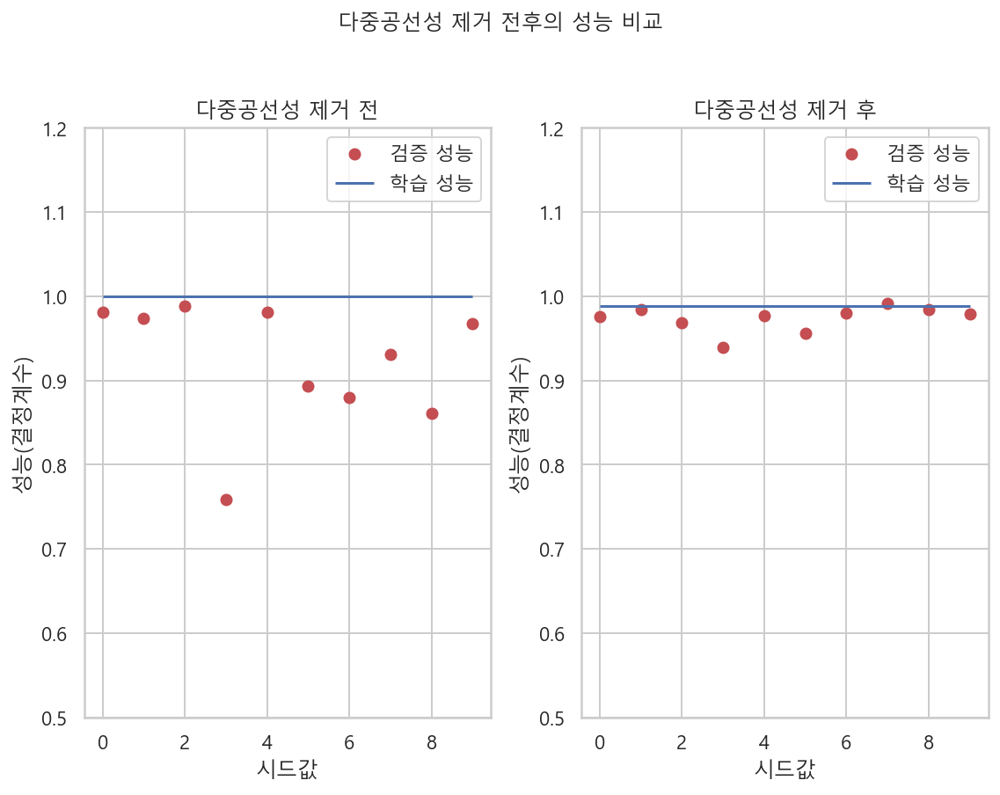

In [217]:
plt.figure(figsize=(8, 6))
plt.subplot(121)
plt.plot(test1, "ro", label="검증 성능")
plt.hlines(result1.rsquared, 0, 9, label="학습 성능")
plt.legend()
plt.xlabel("시드값")
plt.ylabel("성능(결정계수)")
plt.title("다중공선성 제거 전")
plt.ylim(0.5, 1.2)

plt.subplot(122)
plt.plot(test2, "ro", label="검증 성능")
plt.hlines(result2.rsquared, 0, 9, label="학습 성능")
plt.legend()
plt.xlabel("시드값")
plt.ylabel("성능(결정계수)")
plt.title("다중공선성 제거 후")
plt.ylim(0.5, 1.2)

plt.suptitle("다중공선성 제거 전후의 성능 비교", y=1.04)
plt.tight_layout()
plt.show() ; 

In [219]:
from sklearn.datasets import load_boston

boston = load_boston()
dfX0 = pd.DataFrame(boston.data, columns=boston.feature_names)

from patsy import dmatrix

formula = "scale(CRIM) + scale(I(CRIM**2)) + " + \
"scale(ZN) + scale(I(ZN**2)) + scale(INDUS) + " + \
"scale(NOX) + scale(RM) + scale(AGE) + " + \
"scale(np.log(DIS)) + scale(RAD) + scale(TAX)  + " + \
"scale(np.log(PTRATIO)) + scale(B) + scale(np.log(LSTAT)) + CHAS"

dfX = dmatrix(formula, dfX0, return_type="dataframe")
dfy = pd.DataFrame(boston.target, columns=["MEDV"])

In [220]:
dfX

,Intercept,scale(CRIM),scale(I(CRIM ** 2)),scale(ZN),scale(I(ZN ** 2)),scale(INDUS),scale(NOX),scale(RM),scale(AGE),scale(np.log(DIS)),scale(RAD),scale(TAX),scale(np.log(PTRATIO)),scale(B),scale(np.log(LSTAT)),CHAS
0,1.0,-0.419782,-0.169474,0.284830,-0.191030,-1.287909,-0.144217,0.413672,-0.120013,0.409104,-0.982843,-0.666608,-1.443977,0.441052,-1.275260,0.0
1,1.0,-0.417339,-0.169473,-0.487722,-0.368889,-0.593381,-0.740262,0.194274,0.367166,0.769562,-0.867883,-0.987329,-0.230278,0.441052,-0.263711,0.0
2,1.0,-0.417342,-0.169473,-0.487722,-0.368889,-0.593381,-0.740262,1.282714,-0.265812,0.769562,-0.867883,-0.987329,-0.230278,0.396427,-1.627858,0.0
3,1.0,-0.416750,-0.169472,-0.487722,-0.368889,-1.306878,-0.835284,1.016303,-0.809889,1.139194,-0.752922,-1.106115,0.165279,0.416163,-2.153192,0.0
4,1.0,-0.412482,-0.169465,-0.487722,-0.368889,-1.306878,-0.835284,1.228577,-0.511180,1.139194,-0.752922,-1.106115,0.165279,0.441052,-1.162114,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,1.0,-0.413229,-0.169466,-0.487722,-0.368889,0.115738,0.158124,0.439316,0.018673,-0.520096,-0.982843,-0.803212,1.095518,0.387217,-0.169811,0.0
502,1.0,-0.415249,-0.169470,-0.487722,-0.368889,0.115738,0.158124,-0.234548,0.288933,-0.668950,-0.982843,-0.803212,1.095518,0.441052,-0.274682,0.0
503,1.0,-0.413447,-0.169467,-0.487722,-0.368889,0.115738,0.158124,0.984960,0.797449,-0.768920,-0.982843,-0.803212,1.095518,0.441052,-1.067939,0.0
504,1.0,-0.407764,-0.169451,-0.487722,-0.368889,0.115738,0.158124,0.725672,0.736996,-0.588482,-0.982843,-0.803212,1.095518,0.403225,-0.836660,0.0


In [221]:
dfy

,MEDV
0,24.0
1,21.6
2,34.7
3,33.4
4,36.2
...,...
501,22.4
502,20.6
503,23.9
504,22.0


In [ ]:
model_boston = sm.OLS(dfy, dfX0)
result_boston = model_boston.fit()

influence_boston = result_boston.get_influence()
cooks_d2, pvals = influence_boston.cooks_distance
K = influence_boston.k_vars
fox_cr = 4 / (len(dfy) - K - 1)
idx = np.where(cooks_d2 > fox_cr)[0]

idx = np.hstack([idx, np.where(boston.target == 50)[0]])

In [222]:
model_boston = sm.OLS(dfy, dfX0)
result_boston = model_boston.fit()
print(result_boston.summary())

                                 OLS Regression Results                                
Dep. Variable:                   MEDV   R-squared (uncentered):                   0.959
Model:                            OLS   Adj. R-squared (uncentered):              0.958
Method:                 Least Squares   F-statistic:                              891.3
Date:                Tue, 13 Sep 2022   Prob (F-statistic):                        0.00
Time:                        17:36:53   Log-Likelihood:                         -1523.8
No. Observations:                 506   AIC:                                      3074.
Df Residuals:                     493   BIC:                                      3128.
Df Model:                          13                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [223]:
result_boston.rsquared

0.9591890143535311

In [224]:
influence_boston = result_boston.get_influence()
influence_boston

In [225]:
cooks_d2, pval = influence_boston.cooks_distance
cooks_d2

array([1.35021540e-03, 2.90257739e-04, 4.37955040e-04, 6.37877172e-04,
       1.94056146e-03, 5.49185636e-04, 7.20630872e-05, 6.33019310e-03,
       5.32518250e-03, 3.86912029e-05, 2.20512491e-03, 1.67276205e-04,
       2.14437764e-04, 2.83047238e-06, 2.27625859e-04, 2.01770733e-06,
       1.71497314e-04, 2.34839944e-05, 1.51082481e-03, 1.48130532e-05,
       3.21791549e-06, 2.28785351e-05, 2.79422324e-04, 3.11646861e-05,
       1.07957897e-04, 3.80690389e-07, 9.85926898e-08, 8.41823715e-05,
       4.70278400e-04, 1.77174862e-04, 2.87890893e-06, 1.21556338e-03,
       7.14408815e-04, 1.81035420e-04, 1.29643357e-04, 3.55056021e-04,
       2.71278132e-05, 3.90493557e-05, 2.77359103e-04, 1.52401948e-05,
       2.57507843e-06, 2.47940417e-04, 7.81577371e-05, 3.73419717e-05,
       1.81123324e-05, 2.19344240e-05, 3.24011005e-05, 7.22535239e-05,
       5.66465491e-03, 5.51001906e-04, 1.18372804e-05, 2.10666871e-04,
       1.77553466e-04, 1.61353030e-05, 3.05664661e-04, 5.02897607e-04,
      

In [226]:
K = influence_boston.k_vars
K

13

In [227]:
fox_r = 4 / (len(dfy) - K - 1)
fox_r

0.008130081300813009

In [228]:
idx = np.where(cooks_d2 > fox_r)[0]
idx

array([141, 148, 154, 157, 161, 162, 163, 166, 186, 214, 228, 267, 364,
       365, 367, 368, 369, 370, 371, 372, 374, 375, 380, 405, 412, 414,
       418], dtype=int64)

In [229]:
idx = np.hstack([idx, np.where(boston.target==50)[0]])
idx

array([141, 148, 154, 157, 161, 162, 163, 166, 186, 214, 228, 267, 364,
       365, 367, 368, 369, 370, 371, 372, 374, 375, 380, 405, 412, 414,
       418, 161, 162, 163, 166, 186, 195, 204, 225, 257, 267, 283, 368,
       369, 370, 371, 372], dtype=int64)

In [230]:
idx.sort()

In [231]:
idx

array([141, 148, 154, 157, 161, 161, 162, 162, 163, 163, 166, 166, 186,
       186, 195, 204, 214, 225, 228, 257, 267, 267, 283, 364, 365, 367,
       368, 368, 369, 369, 370, 370, 371, 371, 372, 372, 374, 375, 380,
       405, 412, 414, 418], dtype=int64)

In [232]:
np.where(boston.target==50)

(array([161, 162, 163, 166, 186, 195, 204, 225, 257, 267, 283, 368, 369,
        370, 371, 372], dtype=int64),)

In [235]:
idx_outlier = \
np.array([7,  54, 148, 152, 160, 214, 253, 267, 364, 365, 367, 368, 369,
              371, 372, 374, 380, 385, 397, 398, 399, 400, 401, 405, 409, 410,
              412, 413, 414, 415, 416, 418, 419, 426, 445, 489, 490, 492, 505,
              161, 162, 163, 166, 186, 195, 204, 225, 257, 267, 283, 368, 369,
              370, 371, 372])
idx_outlier

array([  7,  54, 148, 152, 160, 214, 253, 267, 364, 365, 367, 368, 369,
       371, 372, 374, 380, 385, 397, 398, 399, 400, 401, 405, 409, 410,
       412, 413, 414, 415, 416, 418, 419, 426, 445, 489, 490, 492, 505,
       161, 162, 163, 166, 186, 195, 204, 225, 257, 267, 283, 368, 369,
       370, 371, 372])

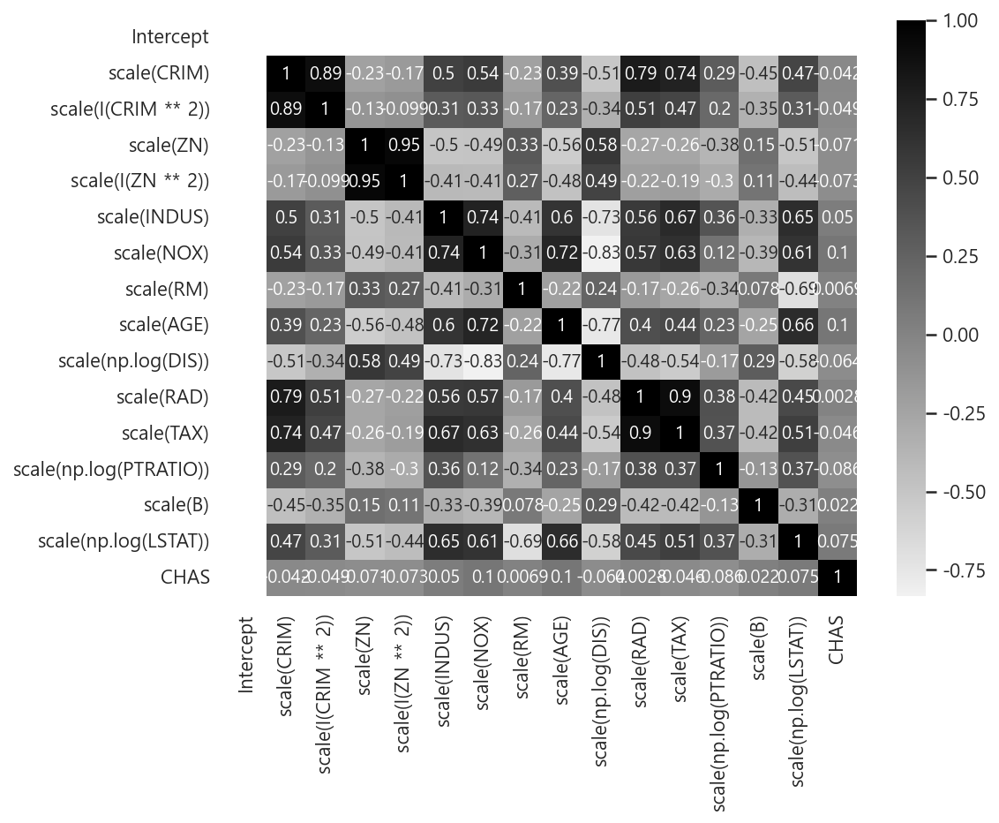

In [237]:
idx = list(set(range(len(dfX))).difference(idx_outlier))
dfX = dfX.iloc[idx, :].reset_index(drop=True)
dfy = dfy.iloc[idx, :].reset_index(drop=True)

plt.figure(figsize=(8, 6))
cmap = sns.light_palette("black", as_cmap=True)
sns.heatmap(dfX.corr(), annot=True, cmap=cmap)
plt.show() ; 

In [238]:
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(
dfX.values, i) for i in range(dfX.shape[1])]
vif["features"] = dfX.columns
vif = vif.sort_values("VIF Factor").reset_index(drop=True)
vif

,VIF Factor,features
0,1.080629,CHAS
1,1.388379,scale(B)
2,1.766143,scale(np.log(PTRATIO))
3,2.003667,Intercept
4,2.804834,scale(RM)
5,3.552208,scale(INDUS)
6,3.754580,scale(AGE)
7,4.938665,scale(np.log(LSTAT))
8,5.114615,scale(NOX)
9,5.194022,scale(np.log(DIS))


In [239]:
model_boston1 = sm.OLS(np.log(dfy), dfX)
result_boston1 = model_boston1.fit()
print(result_boston1.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.881
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     195.0
Date:                Tue, 13 Sep 2022   Prob (F-statistic):          1.07e-171
Time:                        17:50:09   Log-Likelihood:                 308.57
No. Observations:                 410   AIC:                            -585.1
Df Residuals:                     394   BIC:                            -520.9
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  3

## 정규화 선형회귀

In [1]:
def make_nonlinear(seed=0) : 
    np.random.seed(seed)
    n_samples =30
    X = np.sort(np.random.rand(n_samples))
    y = np.sin(2 * np.pi * X) + np.random.randn(n_samples) * 0.1
    X = X[:, np.newaxis]
    return (X, y)

In [2]:
X, y = make_nonlinear()
dfX = pd.DataFrame(X, columns=["x"])
dfX = sm.add_constant(dfX)
dfy = pd.DataFrame(y, columns=["y"])
df = pd.concat([dfX, dfy], axis=1)
df.head()

,const,x,y
0,1.0,0.020218,0.213138
1,1.0,0.071036,0.357444
2,1.0,0.087129,0.747487
3,1.0,0.118274,0.531167
4,1.0,0.143353,0.788347


In [13]:
model1 = sm.OLS.from_formula(
"y ~ " + "+".join(["I(x**{})".format(i+1) for i in range(9)]), data=df)
result1 = model1.fit()
result1.params

Intercept       -0.169863
I(x ** 1)       25.735773
I(x ** 2)     -428.141683
I(x ** 3)     3866.723113
I(x ** 4)   -18340.939657
I(x ** 5)    49326.072526
I(x ** 6)   -78884.743043
I(x ** 7)    74538.645124
I(x ** 8)   -38453.132176
I(x ** 9)     8350.254983
dtype: float64

In [10]:
"y ~ " + "+".join(["I(x**{})".format(i+1) for i in range(9)])

'y ~ I(x**1)+I(x**2)+I(x**3)+I(x**4)+I(x**5)+I(x**6)+I(x**7)+I(x**8)+I(x**9)'

In [9]:
["I(x**{})".format(i+1) for i in range(9)]

['I(x**1)',
 'I(x**2)',
 'I(x**3)',
 'I(x**4)',
 'I(x**5)',
 'I(x**6)',
 'I(x**7)',
 'I(x**8)',
 'I(x**9)']

In [12]:
def plot_statsmodels(result) : 
    plt.scatter(X, y)
    xx = np.linspace(0, 1, 1000)
    dfxx = pd.DataFrame(xx, columns=["x"])
    dfxx = sm.add_constant(dfxx)
    plt.plot(xx, result.predict(dfxx).values)
    plt.show() ; 

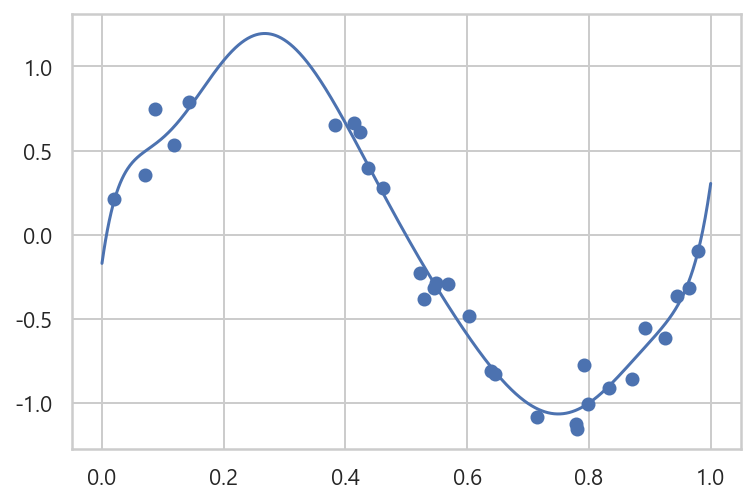

In [15]:
%matplotlib inline

plot_statsmodels(result1)

In [31]:
result2 = model.fit_regularized(alpha=0.01, L1_wt=0)
print(result2.params)
print([round(result1.params[i], 8) for i in range(10)])

[ 0.63308745 -0.75705866 -1.07056551 -0.76835135 -0.35530367  0.0121939
  0.29917825  0.50969248  0.65793698  0.75851865]
[-0.16986282, 25.73577308, -428.14168332, 3866.72311307, -18340.93965735, 49326.07252641, -78884.74304348, 74538.64512437, -38453.13217577, 8350.25498262]


In [45]:
params_df = pd.DataFrame()
params_df

""


In [46]:
params_df["result1"] = [round(result1.params[i], 5) for i in range(10)]
params_df

,result1
0,-0.16986
1,25.73577
2,-428.14168
3,3866.72311
4,-18340.93966
5,49326.07253
6,-78884.74304
7,74538.64512
8,-38453.13218
9,8350.25498


In [47]:
params_df["result2"] = [round(result2.params[i], 5) for i in range(10)]
params_df

,result1,result2
0,-0.16986,0.63309
1,25.73577,-0.75706
2,-428.14168,-1.07057
3,3866.72311,-0.76835
4,-18340.93966,-0.35530
5,49326.07253,0.01219
6,-78884.74304,0.29918
7,74538.64512,0.50969
8,-38453.13218,0.65794
9,8350.25498,0.75852


In [48]:
params_df["degree"] = ["I(x**{})".format(i) for i in range(10)]
params_df["degree"][0] = "Intercept"
params_df = params_df[["degree", "result1", "result2"]]
params_df

,degree,result1,result2
0,Intercept,-0.16986,0.63309
1,I(x**1),25.73577,-0.75706
2,I(x**2),-428.14168,-1.07057
3,I(x**3),3866.72311,-0.76835
4,I(x**4),-18340.93966,-0.35530
5,I(x**5),49326.07253,0.01219
6,I(x**6),-78884.74304,0.29918
7,I(x**7),74538.64512,0.50969
8,I(x**8),-38453.13218,0.65794
9,I(x**9),8350.25498,0.75852


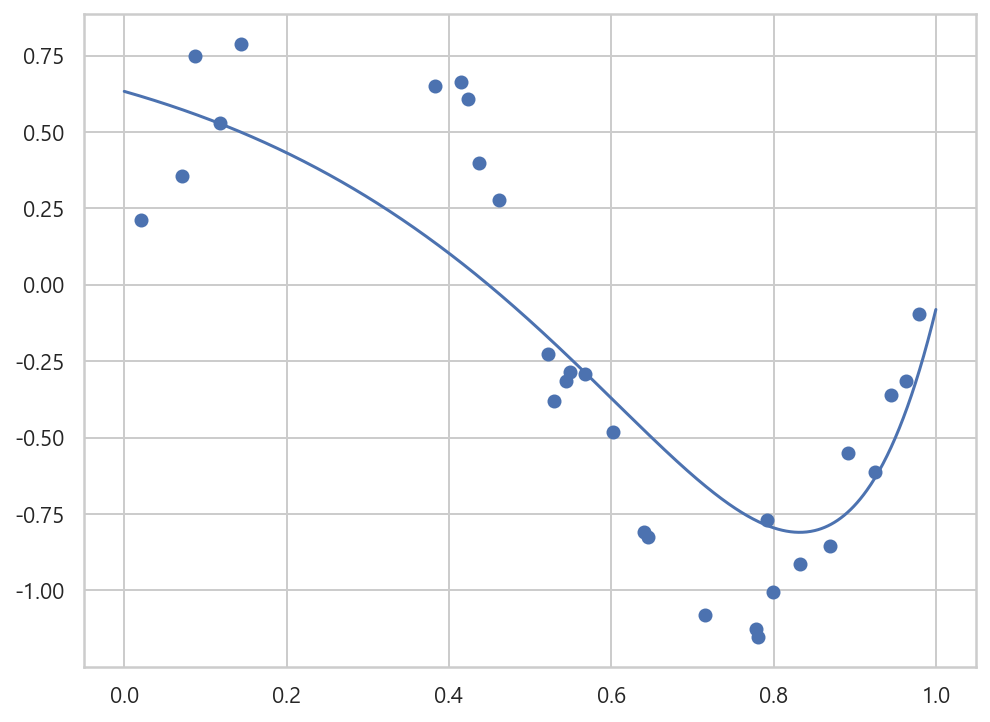

In [50]:
plt.figure(figsize=(8, 6))
plot_statsmodels(result2)

In [51]:
result3 = model.fit_regularized(alpha=0.01, L1_wt=1)
print(result3.params)

Intercept    0.687949
I(x ** 1)   -1.129134
I(x ** 2)   -1.124878
I(x ** 3)    0.000000
I(x ** 4)    0.000000
I(x ** 5)    0.000000
I(x ** 6)    0.000000
I(x ** 7)    0.000000
I(x ** 8)    0.281484
I(x ** 9)    1.075281
dtype: float64


In [55]:
params_df["result3"] = np.round(result3.params.values, 5)
params_df

,degree,result1,result2,result3
0,Intercept,-0.16986,0.63309,0.68795
1,I(x**1),25.73577,-0.75706,-1.12913
2,I(x**2),-428.14168,-1.07057,-1.12488
3,I(x**3),3866.72311,-0.76835,0.00000
4,I(x**4),-18340.93966,-0.35530,0.00000
5,I(x**5),49326.07253,0.01219,0.00000
6,I(x**6),-78884.74304,0.29918,0.00000
7,I(x**7),74538.64512,0.50969,0.00000
8,I(x**8),-38453.13218,0.65794,0.28148
9,I(x**9),8350.25498,0.75852,1.07528


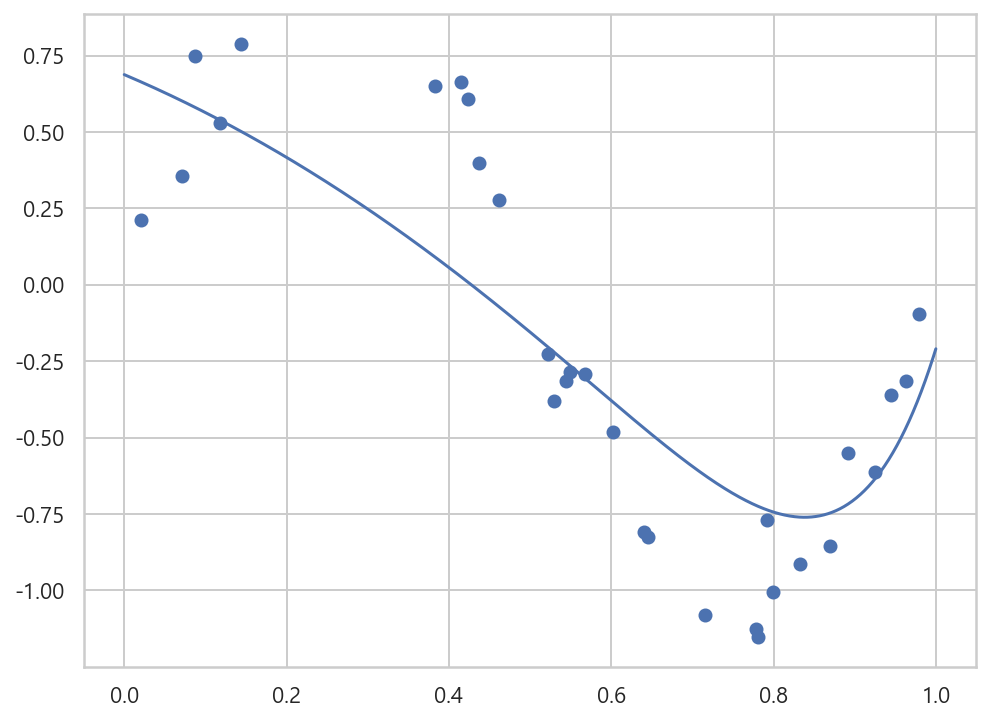

In [56]:
plt.figure(figsize=(8, 6))
plot_statsmodels(result3)

In [57]:
result4 = model.fit_regularized(alpha=0.01, L1_wt=0.5)
print(result4.params)

Intercept    0.656203
I(x ** 1)   -0.849745
I(x ** 2)   -1.262902
I(x ** 3)   -0.425687
I(x ** 4)    0.000000
I(x ** 5)    0.000000
I(x ** 6)    0.000000
I(x ** 7)    0.304049
I(x ** 8)    0.631908
I(x ** 9)    0.801206
dtype: float64


In [59]:
params_df["result4"] = np.round(result4.params.values, 5)
params_df

,degree,result1,result2,result3,result4
0,Intercept,-0.16986,0.63309,0.68795,0.65620
1,I(x**1),25.73577,-0.75706,-1.12913,-0.84975
2,I(x**2),-428.14168,-1.07057,-1.12488,-1.26290
3,I(x**3),3866.72311,-0.76835,0.00000,-0.42569
4,I(x**4),-18340.93966,-0.35530,0.00000,0.00000
5,I(x**5),49326.07253,0.01219,0.00000,0.00000
6,I(x**6),-78884.74304,0.29918,0.00000,0.00000
7,I(x**7),74538.64512,0.50969,0.00000,0.30405
8,I(x**8),-38453.13218,0.65794,0.28148,0.63191
9,I(x**9),8350.25498,0.75852,1.07528,0.80121


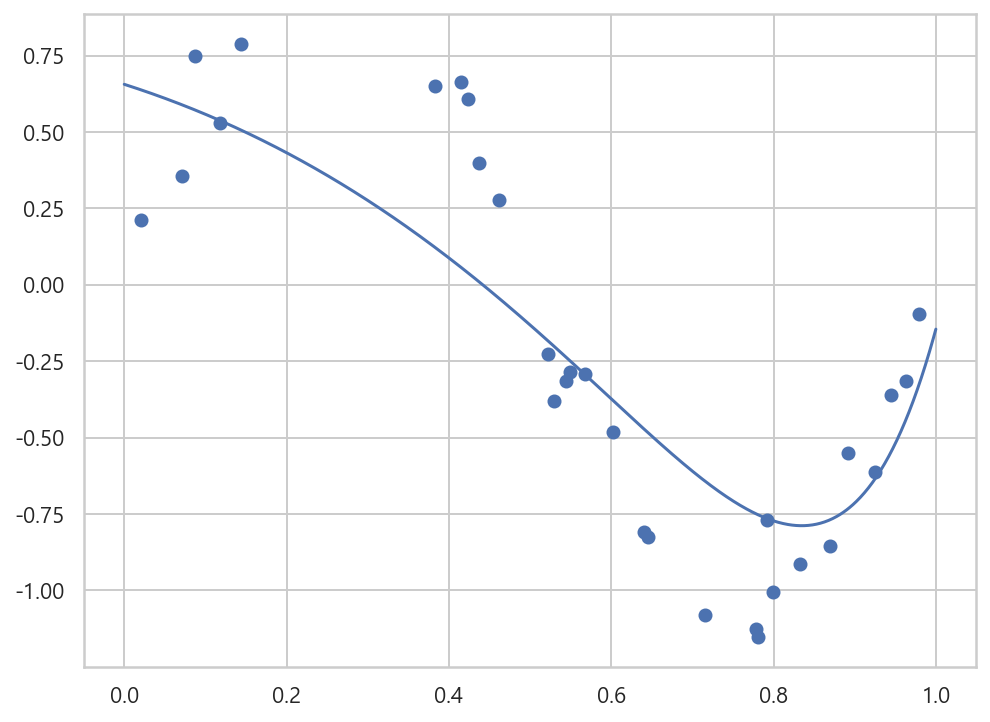

In [60]:
plt.figure(figsize=(8, 6))
plot_statsmodels(result4)

In [70]:
def plot_sklearn(result) : 
    plt.figure(figsize=(8, 6))
    plt.scatter(X, y)
    xx = np.linspace(0, 1, 1000)
    plt.plot(xx, model.predict(xx[:, np.newaxis]))
    plt.show() ; 

In [62]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

In [63]:
poly = PolynomialFeatures(9)
model = make_pipeline(poly, LinearRegression()).fit(X, y)
print(model.steps[1][1].coef_)

[ 0.00000000e+00  2.57357731e+01 -4.28141683e+02  3.86672311e+03
 -1.83409397e+04  4.93260725e+04 -7.88847431e+04  7.45386451e+04
 -3.84531322e+04  8.35025499e+03]


In [66]:
model.steps[1][1]

LinearRegression()

In [67]:
model.steps

[('polynomialfeatures', PolynomialFeatures(degree=9)),
 ('linearregression', LinearRegression())]

In [68]:
model.steps[1][1].coef_

array([ 0.00000000e+00,  2.57357731e+01, -4.28141683e+02,  3.86672311e+03,
       -1.83409397e+04,  4.93260725e+04, -7.88847431e+04,  7.45386451e+04,
       -3.84531322e+04,  8.35025499e+03])

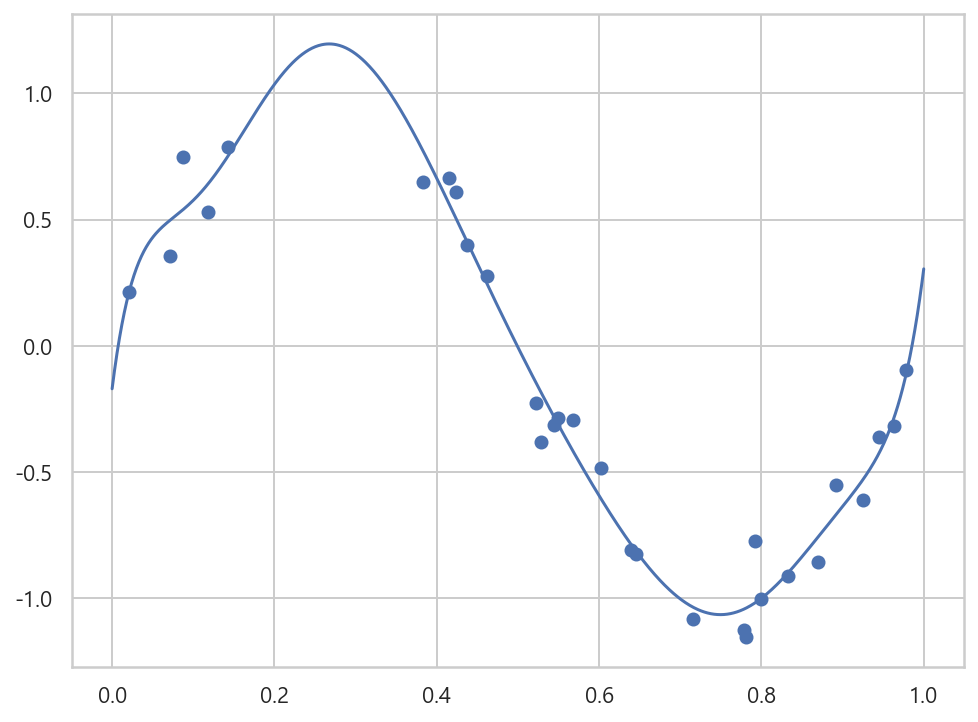

In [71]:
plot_sklearn(model)

[ 0.          1.51430399 -3.90160797 -2.6359859  -0.41526792  1.07530175
  1.64913273  1.52026782  0.94651401  0.13299614]


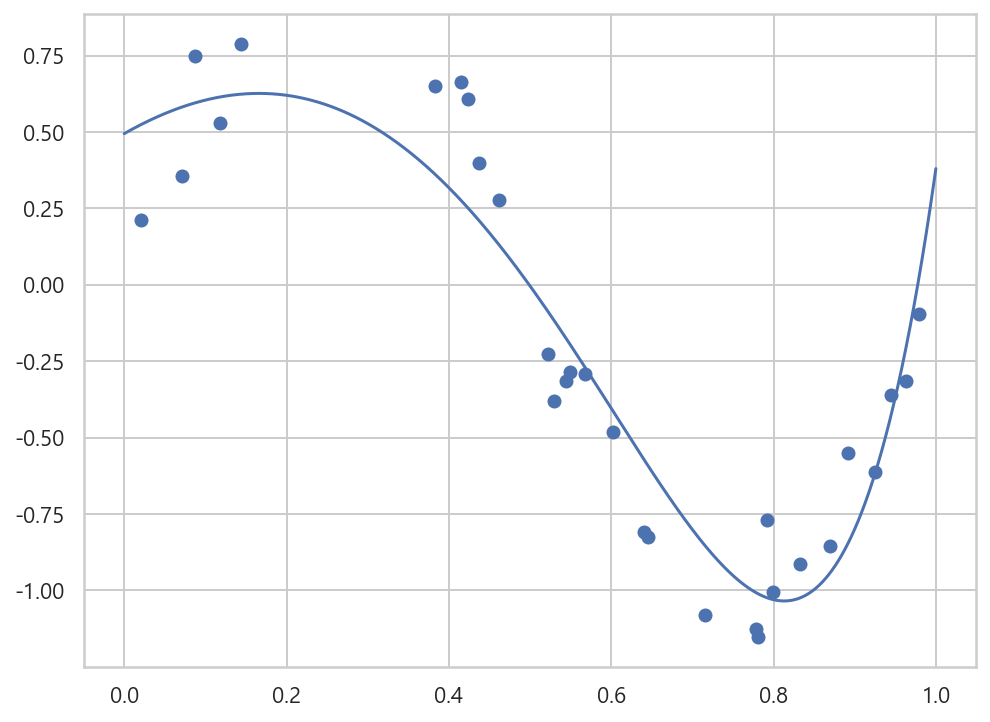

In [72]:
model = make_pipeline(poly, Ridge(alpha=0.01)).fit(X, y)
print(model.steps[1][1].coef_)
plot_sklearn(model)

[ 0.         -0.07668852 -2.44096313 -0.         -0.          0.
  0.          0.          0.          1.88188725]


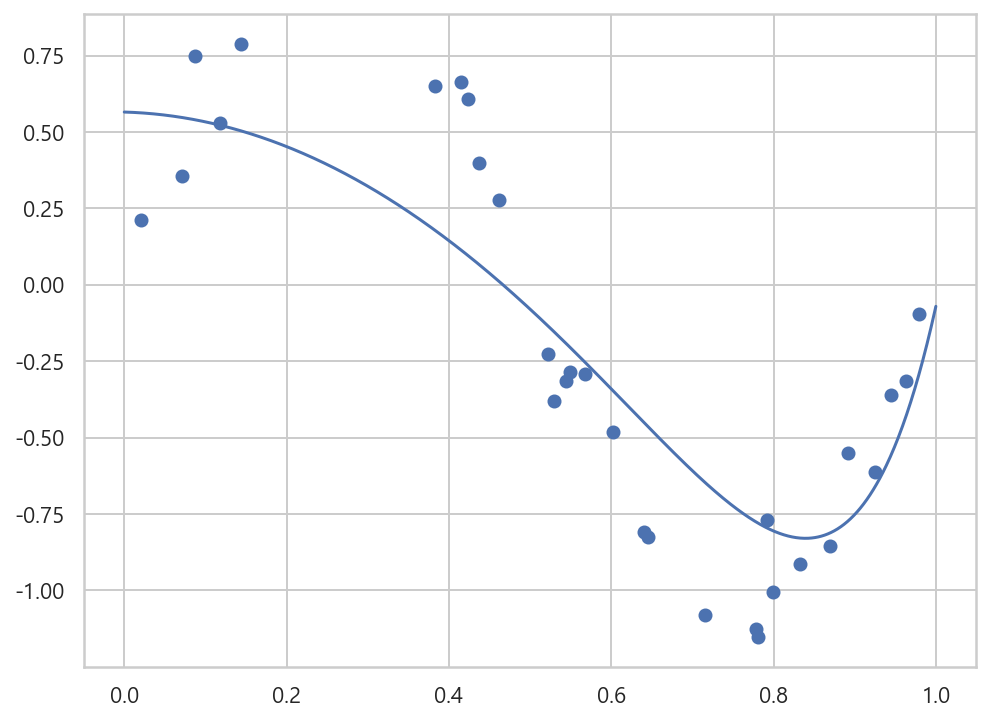

In [73]:
model = make_pipeline(poly, Lasso(alpha=0.01)).fit(X, y)
print(model.steps[1][1].coef_)
plot_sklearn(model)

[ 0.         -0.83768018 -1.23944649 -0.50166684 -0.          0.
  0.          0.30382246  0.62459231  0.84262899]


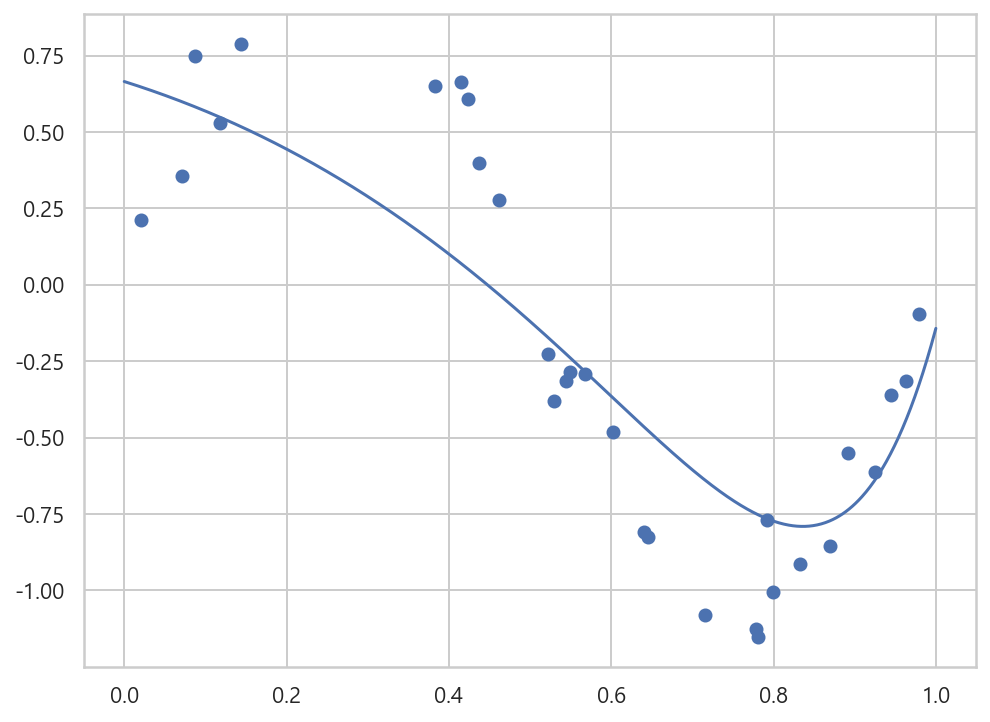

In [74]:
model = make_pipeline(poly, ElasticNet(alpha=0.01)).fit(X, y)
print(model.steps[1][1].coef_)
plot_sklearn(model)

In [77]:
from sklearn.datasets import load_diabetes
diabetes = load_diabetes()
print(diabetes)

{'data': array([[ 0.03807591,  0.05068012,  0.06169621, ..., -0.00259226,
         0.01990842, -0.01764613],
       [-0.00188202, -0.04464164, -0.05147406, ..., -0.03949338,
        -0.06832974, -0.09220405],
       [ 0.08529891,  0.05068012,  0.04445121, ..., -0.00259226,
         0.00286377, -0.02593034],
       ...,
       [ 0.04170844,  0.05068012, -0.01590626, ..., -0.01107952,
        -0.04687948,  0.01549073],
       [-0.04547248, -0.04464164,  0.03906215, ...,  0.02655962,
         0.04452837, -0.02593034],
       [-0.04547248, -0.04464164, -0.0730303 , ..., -0.03949338,
        -0.00421986,  0.00306441]]), 'target': array([151.,  75., 141., 206., 135.,  97., 138.,  63., 110., 310., 101.,
        69., 179., 185., 118., 171., 166., 144.,  97., 168.,  68.,  49.,
        68., 245., 184., 202., 137.,  85., 131., 283., 129.,  59., 341.,
        87.,  65., 102., 265., 276., 252.,  90., 100.,  55.,  61.,  92.,
       259.,  53., 190., 142.,  75., 142., 155., 225.,  59., 104., 182.,
  

In [79]:
print(diabetes.DESCR)

.. _diabetes_dataset:

Diabetes dataset
----------------

Ten baseline variables, age, sex, body mass index, average blood
pressure, and six blood serum measurements were obtained for each of n =
442 diabetes patients, as well as the response of interest, a
quantitative measure of disease progression one year after baseline.

**Data Set Characteristics:**

  :Number of Instances: 442

  :Number of Attributes: First 10 columns are numeric predictive values

  :Target: Column 11 is a quantitative measure of disease progression one year after baseline

  :Attribute Information:
      - age     age in years
      - sex
      - bmi     body mass index
      - bp      average blood pressure
      - s1      tc, total serum cholesterol
      - s2      ldl, low-density lipoproteins
      - s3      hdl, high-density lipoproteins
      - s4      tch, total cholesterol / HDL
      - s5      ltg, possibly log of serum triglycerides level
      - s6      glu, blood sugar level

Note: Each of these 1

In [80]:
X = diabetes.data
y = diabetes.target

In [82]:
alpha = np.logspace(-3, 1, 5)

data = []
for i, a in enumerate(alpha) : 
    print(i, a)
    ridge = Ridge(alpha=a).fit(X, y)
    data.append(pd.Series(np.hstack([ridge.intercept_, ridge.coef_])))
    
df_ridge = pd.DataFrame(data, index=alpha).T
df_ridge

0 0.001
1 0.01
2 0.1
3 1.0
4 10.0


,0.001,0.010,0.100,1.000,10.000
0,152.133484,152.133484,152.133484,152.133484,152.133484
1,-9.551414,-7.199457,1.307349,29.465746,19.812822
2,-239.090354,-234.552930,-207.194814,-83.154885,-0.918458
3,520.363367,520.583136,489.691080,306.351627,75.416167
4,323.828627,320.523356,301.769437,201.629434,55.025419
5,-712.328205,-380.607066,-83.466074,5.909369,19.924600
6,413.383794,150.483752,-70.828096,-29.515927,13.948686
7,65.811629,-78.591232,-188.680164,-152.040465,-47.553816
8,167.513774,130.313059,115.712703,117.311715,48.259420
9,720.944468,592.349587,443.814054,262.944995,70.144068


In [83]:
test_ridge = Ridge(alpha=0.001).fit(X, y)
test_ridge

Ridge(alpha=0.001)

In [84]:
test_ridge.intercept_

152.13348416289648

In [85]:
test_ridge.coef_

array([  -9.55141449, -239.09035369,  520.36336678,  323.82862653,
       -712.3282053 ,  413.38379428,   65.81162885,  167.51377403,
        720.94446754,   68.12209974])

In [86]:
np.hstack([test_ridge.intercept_, test_ridge.coef_])

array([ 152.13348416,   -9.55141449, -239.09035369,  520.36336678,
        323.82862653, -712.3282053 ,  413.38379428,   65.81162885,
        167.51377403,  720.94446754,   68.12209974])

In [87]:
pd.Series(np.hstack([test_ridge.intercept_, test_ridge.coef_]))

0     152.133484
1      -9.551414
2    -239.090354
3     520.363367
4     323.828627
5    -712.328205
6     413.383794
7      65.811629
8     167.513774
9     720.944468
10     68.122100
dtype: float64

In [88]:
test_data = []
test_data.append(pd.Series(np.hstack([test_ridge.intercept_, test_ridge.coef_])))

In [89]:
test_data

[0     152.133484
 1      -9.551414
 2    -239.090354
 3     520.363367
 4     323.828627
 5    -712.328205
 6     413.383794
 7      65.811629
 8     167.513774
 9     720.944468
 10     68.122100
 dtype: float64]

In [92]:
for i, a in enumerate(alpha) : 
    print(i, a)

0 0.001
1 0.01
2 0.1
3 1.0
4 10.0


In [93]:
test_ridge2 = Ridge(alpha=0.01).fit(X, y)
test_data.append(pd.Series(np.hstack([test_ridge2.intercept_, test_ridge2.coef_])))
test_data

[0     152.133484
 1      -9.551414
 2    -239.090354
 3     520.363367
 4     323.828627
 5    -712.328205
 6     413.383794
 7      65.811629
 8     167.513774
 9     720.944468
 10     68.122100
 dtype: float64,
 0     152.133484
 1      -7.199457
 2    -234.552930
 3     520.583136
 4     320.523356
 5    -380.607066
 6     150.483752
 7     -78.591232
 8     130.313059
 9     592.349587
 10     71.133768
 dtype: float64]

In [94]:
test_df_ridge = pd.DataFrame(test_data)
test_df_ridge

,0,1,2,3,4,5,6,7,8,9,10
0,152.133484,-9.551414,-239.090354,520.363367,323.828627,-712.328205,413.383794,65.811629,167.513774,720.944468,68.122100
1,152.133484,-7.199457,-234.552930,520.583136,320.523356,-380.607066,150.483752,-78.591232,130.313059,592.349587,71.133768


In [95]:
test_df_ridge = pd.DataFrame(test_data, index=alpha[:2])
test_df_ridge

,0,1,2,3,4,5,6,7,8,9,10
0.001,152.133484,-9.551414,-239.090354,520.363367,323.828627,-712.328205,413.383794,65.811629,167.513774,720.944468,68.122100
0.010,152.133484,-7.199457,-234.552930,520.583136,320.523356,-380.607066,150.483752,-78.591232,130.313059,592.349587,71.133768


In [96]:
test_df_ridge.T

,0.001,0.010
0,152.133484,152.133484
1,-9.551414,-7.199457
2,-239.090354,-234.552930
3,520.363367,520.583136
4,323.828627,320.523356
5,-712.328205,-380.607066
6,413.383794,150.483752
7,65.811629,-78.591232
8,167.513774,130.313059
9,720.944468,592.349587


In [106]:
alpha = np.logspace(-3, 1, 5)
data = []
for i, a in enumerate(alpha) : 
    print(i, a)
    ridge = Ridge(alpha=a).fit(X, y)
    data.append(pd.Series(np.hstack([ridge.intercept_, ridge.coef_])))
    
df_ridge = pd.DataFrame(data, index=alpha).T
df_ridge

0 0.001
1 0.01
2 0.1
3 1.0
4 10.0


,0.001,0.010,0.100,1.000,10.000
0,152.133484,152.133484,152.133484,152.133484,152.133484
1,-9.551414,-7.199457,1.307349,29.465746,19.812822
2,-239.090354,-234.552930,-207.194814,-83.154885,-0.918458
3,520.363367,520.583136,489.691080,306.351627,75.416167
4,323.828627,320.523356,301.769437,201.629434,55.025419
5,-712.328205,-380.607066,-83.466074,5.909369,19.924600
6,413.383794,150.483752,-70.828096,-29.515927,13.948686
7,65.811629,-78.591232,-188.680164,-152.040465,-47.553816
8,167.513774,130.313059,115.712703,117.311715,48.259420
9,720.944468,592.349587,443.814054,262.944995,70.144068


In [103]:
X.shape

(442, 10)

In [107]:
alpha = np.logspace(-3, 1, 5)
data2 = []
for i, a in enumerate(alpha) : 
    print(i, a)
    lasso = Lasso(alpha=a).fit(X, y)
    data2.append(pd.Series(np.hstack([lasso.intercept_, lasso.coef_])))
    
df_lasso = pd.DataFrame(data2, index=alpha).T
df_lasso

0 0.001
1 0.01
2 0.1
3 1.0
4 10.0


,0.001,0.010,0.100,1.000,10.000
0,152.133484,152.133484,152.133484,152.133484,152.133484
1,-8.998449,-1.306575,-0.000000,0.000000,0.000000
2,-238.899740,-228.822331,-155.362882,-0.000000,0.000000
3,520.261362,525.560658,517.182017,367.701852,0.000000
4,323.429484,316.175320,275.082351,6.301904,0.000000
5,-720.251734,-307.013677,-52.540269,0.000000,0.000000
6,421.405141,89.321688,-0.000000,0.000000,0.000000
7,66.734168,-105.081398,-210.159753,-0.000000,-0.000000
8,164.448873,119.597989,0.000000,0.000000,0.000000
9,725.340440,571.330871,483.914409,307.605700,0.000000


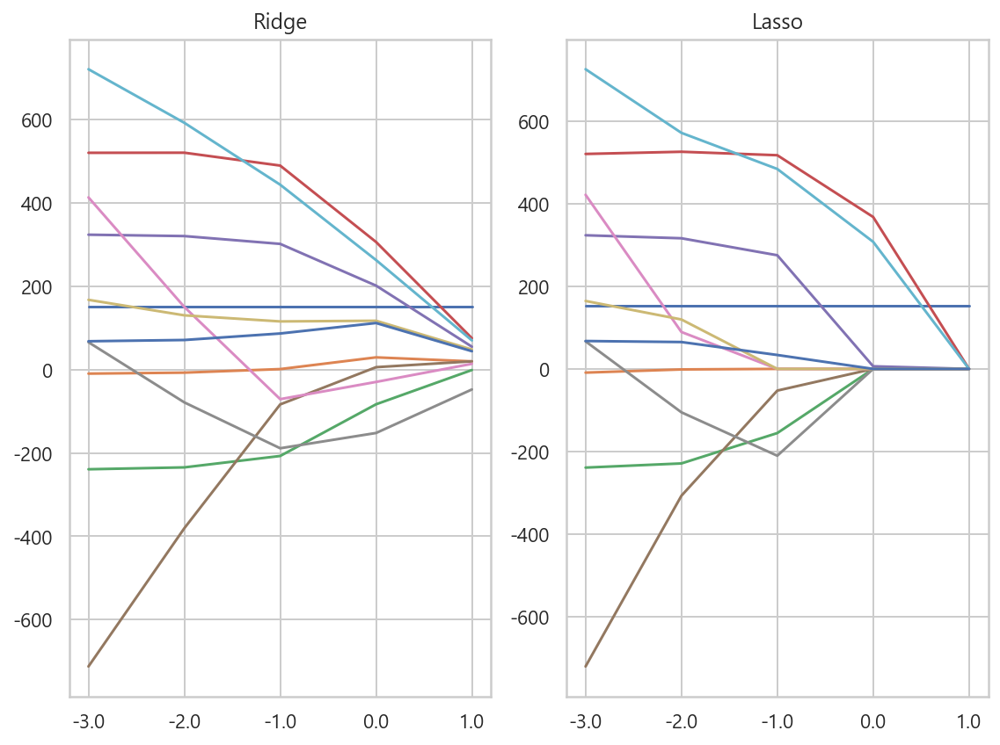

In [114]:
plt.figure(figsize=(8, 6))
ax1 = plt.subplot(121)
plt.semilogx(df_ridge.T)
plt.xticks(alpha, labels=np.log10(alpha))
plt.title("Ridge")

ax2 = plt.subplot(122)
plt.semilogx(df_lasso.T)
plt.xticks(alpha, labels=np.log10(alpha))
plt.title("Lasso")

plt.tight_layout()
plt.show() ; 

In [108]:
np.log10(alpha)

array([-3., -2., -1.,  0.,  1.])

In [109]:
alpha

array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01])

In [110]:
1.e-03

0.001

In [112]:
1.e+01

10.0

### 최적정규화

In [115]:
from sklearn.datasets import load_boston
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score

In [121]:
boston = load_boston()
X = boston.data
y = boston.target

alphas = np.logspace(-4, 0, 200)

train_scores = []
test_scores = []

for alpha in alphas : 
    model = Lasso(alpha=alpha)
    train_score = - mean_squared_error(y, model.fit(X, y).predict(X))
    test_score = np.mean(cross_val_score(model, X, y, 
                                         scoring="neg_mean_squared_error", 
                                         cv=5))
    train_scores.append(train_score)
    test_scores.append(test_score)
    
optimal_alpha = alphas[np.argmax(test_scores)]
optimal_score = np.max(test_score)

In [118]:
test_test = [1, 2, 3, 5, 4]
test_test

[1, 2, 3, 5, 4]

In [119]:
np.argmax(test_test)

3

In [120]:
np.max(test_test)

5

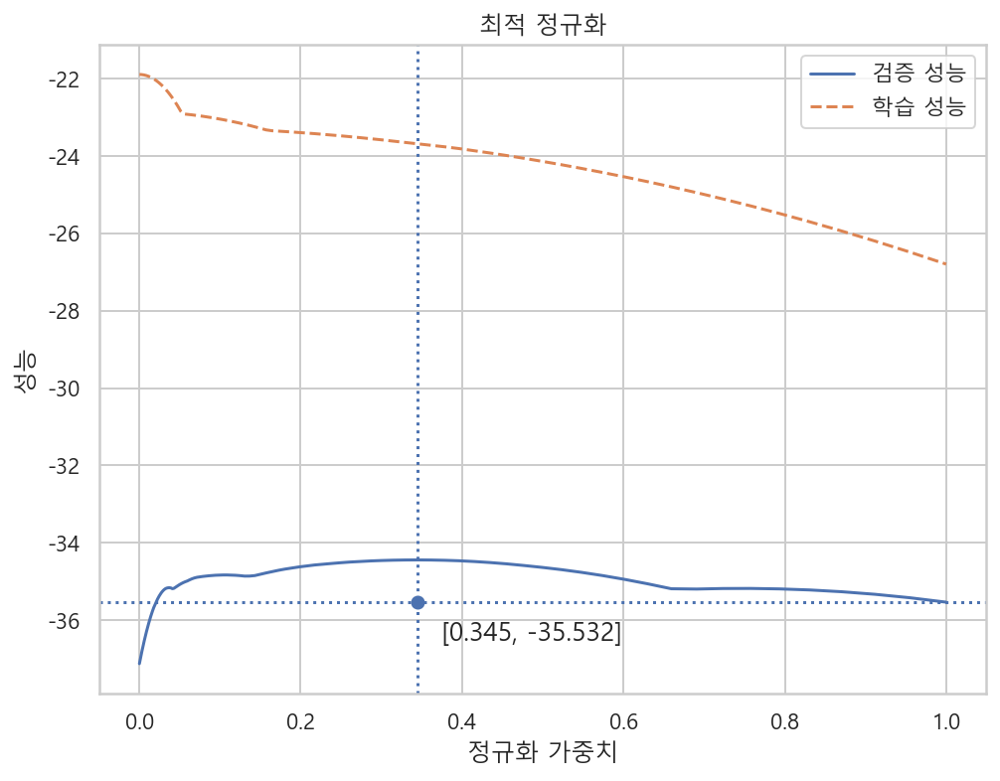

In [132]:
plt.figure(figsize=(8, 6))
plt.plot(alphas, test_scores, "-", label="검증 성능")
plt.plot(alphas, train_scores, "--", label="학습 성능")
plt.axhline(optimal_score, linestyle=":")
plt.axvline(optimal_alpha, linestyle=":")
plt.scatter(optimal_alpha, optimal_score)
plt.text(optimal_alpha + 0.03, optimal_score - 1, 
         "[{:.3f}, {:.3f}]".format(optimal_alpha, optimal_score), fontsize=13)
plt.title("최적 정규화")
plt.ylabel("성능")
plt.xlabel("정규화 가중치")
plt.legend()
plt.show() ; 

In [133]:
optimal_score

-35.531580220694856

In [135]:
optimal_alpha

0.34489622604057596

In [138]:
from sklearn.datasets import load_boston
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score

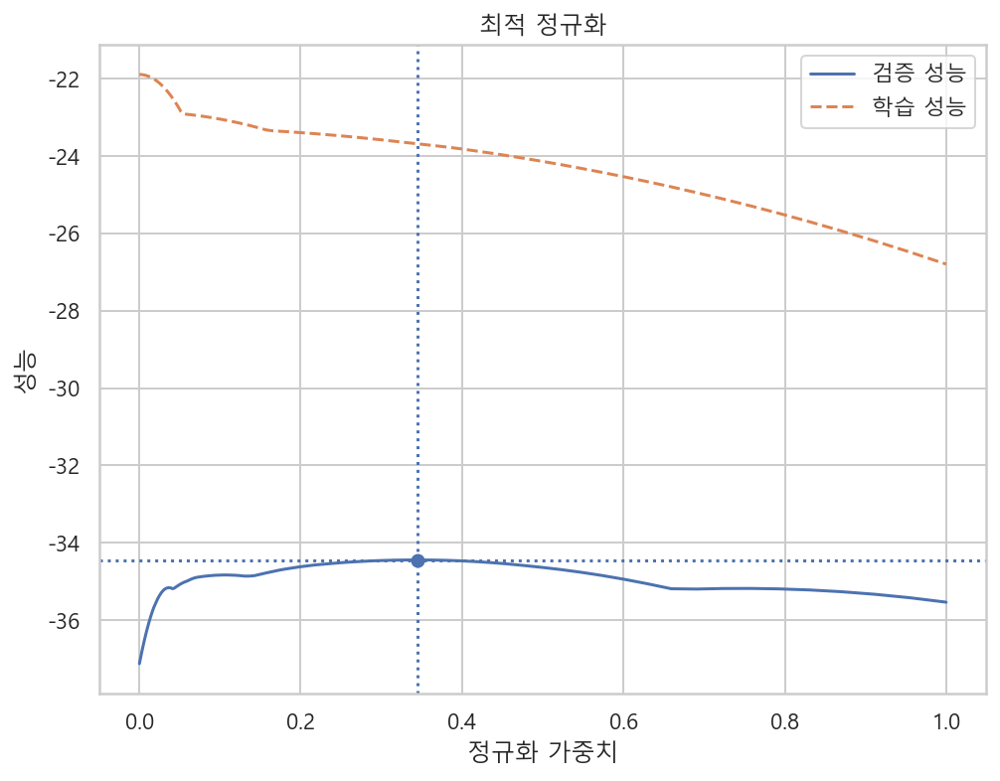

In [145]:
boston = load_boston()
X = boston.data
y = boston.target

alphas = np.logspace(-4, 0, 200)
train_scores = []
test_scores = []

for alpha in alphas : 
    model = Lasso(alpha=alpha)
    train_score = - mean_squared_error(y, model.fit(X, y).predict(X))
    test_score = np.mean(cross_val_score(model, X, y,
                                         scoring="neg_mean_squared_error",
                                         cv=5))
    train_scores.append(train_score)
    test_scores.append(test_score)
    
optimal_alpha = alphas[np.argmax(test_scores)]
optimal_score = np.max(test_scores)

plt.figure(figsize=(8, 6))
plt.plot(alphas, test_scores, linestyle="-", label="검증 성능")
plt.plot(alphas, train_scores, linestyle="--", label="학습 성능")
plt.scatter(optimal_alpha, optimal_score)
plt.axhline(optimal_score, linestyle=":")
plt.axvline(optimal_alpha, linestyle=":")
plt.xlabel("정규화 가중치")
plt.ylabel("성능")
plt.title("최적 정규화")
plt.legend()
plt.show() ; 

In [146]:
from sklearn.datasets import load_boston
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score

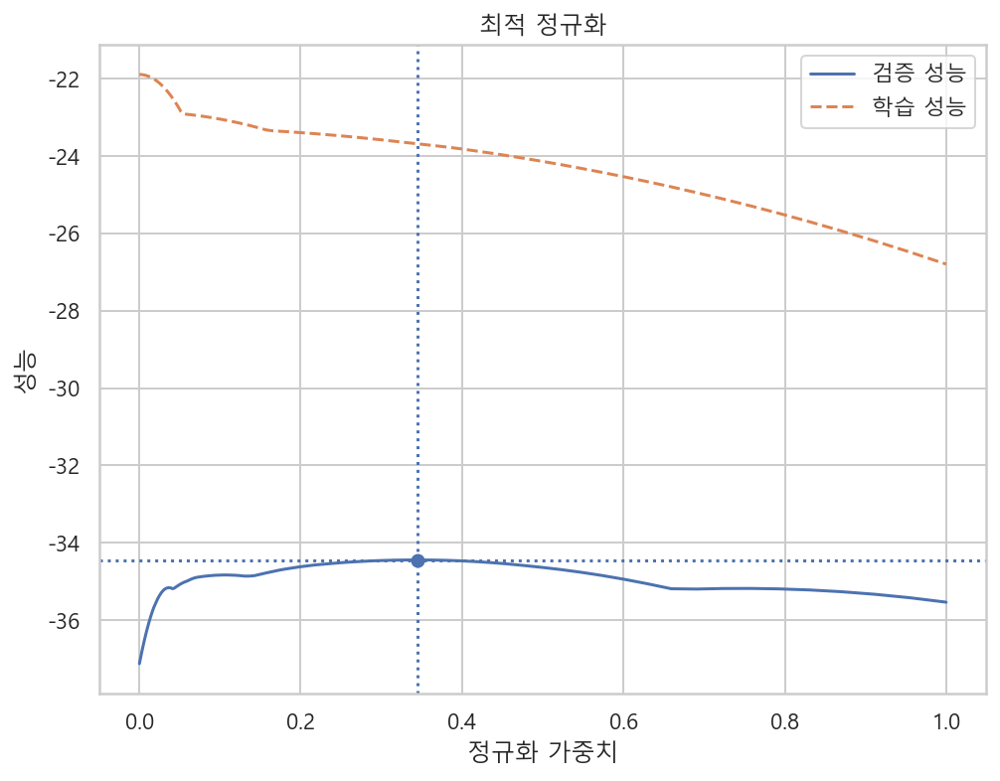

In [151]:
boston = load_boston()
X = boston.data
y = boston.target

alpahs = np.logspace(-4, 0, 200)
test_scores = []
train_scores = []

for alpha in alphas : 
    model = Lasso(alpha=alpha)
    train_score = - mean_squared_error(y, model.fit(X, y).predict(X))
    test_score = np.mean(cross_val_score(model, X, y,
                                        scoring="neg_mean_squared_error",
                                        cv=5))
    train_scores.append(train_score)
    test_scores.append(test_score)
    
optimal_alpha = alphas[np.argmax(test_scores)]
optimal_score = np.max(test_scores)

plt.figure(figsize=(8, 6))
plt.plot(alphas, test_scores, linestyle="-", label="검증 성능")
plt.plot(alphas, train_scores, linestyle="--", label="학습 성능")
plt.scatter(optimal_alpha, optimal_score)
plt.axhline(optimal_score, linestyle=":")
plt.axvline(optimal_alpha, linestyle=":")
plt.xlabel("정규화 가중치")
plt.ylabel("성능")
plt.title("최적 정규화")
plt.legend()
plt.show() ; 

In [149]:
optimal_alpha

0.0001

In [150]:
optimal_score

-35.531580220694856

### 검증성능 곡선

In [162]:
from sklearn.model_selection import validation_curve

In [164]:
train_scores, test_scores = \
validation_curve(Lasso(), X, y,
                param_name="alpha", param_range=alphas,
                cv=5, scoring="neg_mean_squared_error")

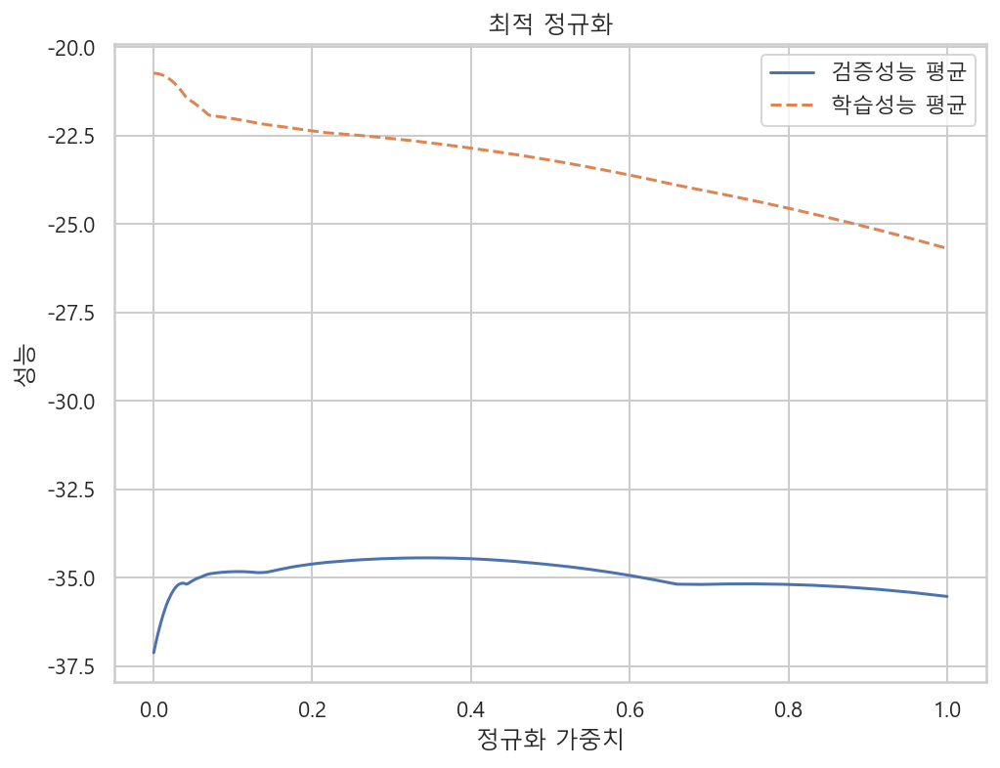

In [166]:
plt.figure(figsize=(8, 6))
plt.plot(alphas, test_scores.mean(axis=1), "-", label="검증성능 평균")
plt.plot(alphas, train_scores.mean(axis=1), "--", label="학습성능 평균")
plt.xlabel("정규화 가중치")
plt.ylabel("성능")
plt.title("최적 정규화")
plt.legend()
plt.show() ; 

### 다항회귀의 차수 결정

In [167]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

In [168]:
n_samples = 100
np.random.seed(0)
X = np.sort(np.random.rand(n_samples))
y = np.sin(2 * np.pi * X) + np.random.randn(n_samples) * 0.5
X = X[:, np.newaxis]

In [169]:
model = Pipeline(
    [("poly", PolynomialFeatures()),
     ("lreg", LinearRegression())])
model

Pipeline(steps=[('poly', PolynomialFeatures()), ('lreg', LinearRegression())])

In [170]:
degrees = np.arange(1, 15)
train_scores, test_scores = \
validation_curve(model, X, y,
                param_name="poly__degree", param_range=degrees,
                cv=100, scoring="neg_mean_squared_error")

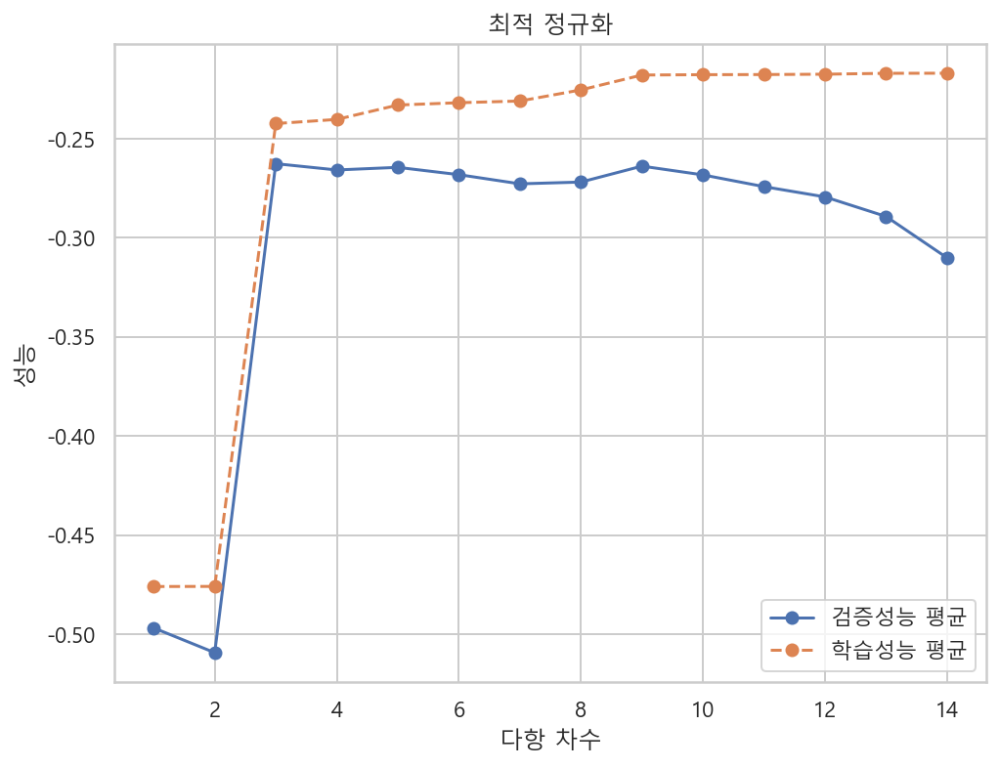

In [171]:
plt.figure(figsize=(8, 6))
plt.plot(degrees, test_scores.mean(axis=1), "o-", label="검증성능 평균")
plt.plot(degrees, train_scores.mean(axis=1), "o--", label="학습성능 평균")
plt.xlabel("다항 차수")
plt.ylabel("성능")
plt.title("최적 정규화")
plt.legend()
plt.show() ; 